# Library import and drive mount

In [ ]:
!pip install kneed

In [ ]:
!pip install scikit-plot

In [ ]:
# Load general utilities
# ----------------------

import pandas as pd
import os
from sys import platform
import matplotlib.pyplot as plt
import datetime
import numpy as np
import pickle
import seaborn
import numpy as np
import plotly.express as px
import seaborn as sns
import time
import re
import random

from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

# Load sklearn utilities
# ----------------------
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, brier_score_loss, mean_squared_error, r2_score

from sklearn.calibration import calibration_curve

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load classifiers
# ----------------
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier


# Other Packages
# --------------
from scipy.stats import kendalltau
from sklearn.neural_network import MLPRegressor
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
## from gurobipy import *
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
#from scipy.interpolate import spline

import scikitplot as skplt

# Load debugger, if required
#import pixiedust
pd.options.mode.chained_assignment = None #'warn'

# suppress all warnings
import warnings
warnings.filterwarnings("ignore")


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Phase 1 - Ingestion and Cleaning

This notebook carries out the following steps - the following steps are done for 2012-2013 and 2015-2016 data
  1. Ingest data downloaded from the LendingClub website
  2. Prepare the data set
  3. Visualizes single variable summaries
  4. Removes outliers
  5. Output a dataset ready for later analysis

In [ ]:
def is_integer(x):
    '''
    This function returns True if x is an integer, and False otherwise
    '''
    try:
        return (int(x) == float(x))
    except:
        return False

## Parameters

In [ ]:
# Define the directories that contain the files downloaded most recently

dir_data = "/content/drive/My Drive/BVIA Group 4/201213Data"

# Define the output path for the pickle
pickle_dir = "/content/drive/My Drive/BVIA Group 4/Pickle/"
pickle_file = "/content/drive/My Drive/BVIA Group 4/Pickle/201213_w2.pickle" #change the name of the pickle file here 


In [ ]:
# Identify the columns we'll be keeping from the dataset
cols_to_pick = ['id','loan_amnt','funded_amnt','term','int_rate',
                 'installment','grade','emp_length', 'home_ownership',
                 'annual_inc','verification_status','issue_d',
                 'loan_status','purpose','dti', 'delinq_2yrs',
                 'earliest_cr_line','open_acc','pub_rec', 'fico_range_high',
                 'fico_range_low', 'revol_bal','revol_util', 'total_pymnt',
                                                    'last_pymnt_d', 'recoveries']

# Identify the type of each of these column
float_cols = ['loan_amnt', 'funded_amnt', 'installment', 'annual_inc',
                     'dti', 'revol_bal', 'delinq_2yrs', 'open_acc', 'pub_rec',
                                'fico_range_high', 'fico_range_low', 'total_pymnt', 'recoveries']
cat_cols = ['term', 'grade', 'emp_length', 'home_ownership',
                    'verification_status', 'loan_status', 'purpose']
perc_cols = ['int_rate', 'revol_util']
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d']

# Ensure that we have types for every column
assert set(cols_to_pick) - set(float_cols) - set(cat_cols) - set(perc_cols) - set(date_cols) == set(["id"])

In [ ]:
# Some of the columns selected will not be used directly in the model,
# but will be used to generate other features.
#
# Create variables specifying the features that will be used

# All categorical columns other than "loan_status" will be used as
# discrete features
discrete_features = list(set(cat_cols) - set(["loan_status"]))

# All numeric columns will be used as continuous features
continuous_features = list(float_cols + perc_cols)

## Step 1A - Ingestion - 2012-2013 Data
Ingest the data files from both sets, perform consistency checks, and prepare one single file for each set

In [ ]:
def ingest_files(directory):
    '''
    This function will ingest every file in the specified directory
    into a pandas dataframe. It will return a dictionary containing
    these dataframes, keyed by the file name.
    
    We assume the directory contains files directly downloaded from
    Lending Club, and *only* those files. Thus, we assume the files are zipped
    (pd.read_csv can read zipped files) and we assume the first line
    in each file needs to be skipped. 
    
    Note that this function will read and ingest more than one file and is
    convenient if you want to ingest data for more than one year at a time.
    
    Note that each file will be read *without* formatting
    '''
    
    # If the directory has no trailing slash, add one
    if directory[-1] != "/":
        directory = directory + "/"
    
    all_files = os.listdir(directory)
    output = {}
    
    print("Directory " + directory + " has " + str(len(all_files)) + " files:")
    for i in all_files:
        print("    Reading file " + i)
        output[i] = pd.read_csv(directory + i, dtype = str, skiprows = 1)
        
        # Some of the files have "summary" lines that, for example
        # read "Total number of loans number in Policy 1: ....."
        # To remove those lines, find any lines with non-integer IDs
        # and remove them
        invalid_rows = (output[i].id.apply( lambda x : is_integer(x) == False ))
        if invalid_rows.sum() > 0:
            print("        Found " + str(invalid_rows.sum()) + " invalid rows which were removed")
            output[i] = output[i][invalid_rows == False]
    
    return output

In [ ]:
# Ingest the set of files we downloaded 
files_data = ingest_files(dir_data)

Directory /content/drive/My Drive/BVIA Group 4/201213Data/ has 1 files:
    Reading file LoanStats3b_securev1.csv.zip
        Found 2 invalid rows which were removed


In [ ]:
data_now = pd.concat(files_data.values()).reset_index(drop = True)
columns = list(data_now.columns)

In [ ]:
data_now.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,...,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
count,188181,0,188181,188181,188181,188181,188181,188181,188181,188181,176444,180294,188181,188181,188181,188181,188181,188181,188181,81478,188181,188174,188181,188181,188181,188181,188181,188181,188181,188181,80608,17474,188181,188181,188181,188056,188181,188181,188181,188181,...,188181,160440,180686,180686,160440,0,0,0,0,0,0,0,0,0,0,0,0,0,188181,71,80,80,80,80,80,80,77,80,80,80,72,80,80,188181,2093,2093,2093,2093,2093,2093
unique,188181,0,1258,1259,1694,2,145,29666,7,35,115187,11,5,15610,3,24,2,1,188181,80660,13,44971,839,49,3499,20,614,38,38,9,130,120,54,14,43591,1068,88,2,1,1,...,13,115320,81325,10903,66962,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,11,3,1,72,10,11,12,1,23,7,64,72,79,2,86,3,88,1815,636,26
top,5966345,NaN,10000,10000,10000,36 months,12.12%,332.72,B,B3,Teacher,10+ years,MORTGAGE,60000,Verified,Dec-2013,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 07/25/13 > Debt consolidat...,debt_consolidation,Debt consolidation,945xx,CA,14.4,0,Oct-2000,680,684,0,8,98,9,0,0,0%,22,f,0.00,0.00,...,0,13700,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,INTEREST ONLY-3 MONTHS DEFERRAL,NATURAL_DISASTER,COMPLETED,3,0,Sep-2017,Dec-2017,Oct-2017,3,0,Late (16-30 days),0,0,0.13,N,Jul-2015,COMPLETE,Jan-2015,5000,45,0
freq,1,NaN,13744,13743,12048,143892,9409,823,62623,15618,833,61199,97012,7207,87389,15020,158510,188181,1,6,111451,23110,2327,30743,202,158451,1646,15240,15240,95857,1693,525,18670,170707,603,624,7187,148364,188181,188181,...,186530,74,79,1533,26983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,188181,71,24,63,80,9,26,21,22,80,20,29,9,9,2,186088,74,1773,125,13,408,1133


## Step 2A - Prepare Dataset

In [ ]:
# Keep only the columns of interest
final_data = data_now[cols_to_pick].copy()

In [ ]:
print("Starting with " + str(len(final_data)) + " rows")

Starting with 188181 rows


### Typecast the columns

In [ ]:
for i in float_cols:
    final_data[i] = final_data[i].astype(float)
    
def clean_perc(x):
    if pd.isnull(x):
        return np.nan
    else:
        return float(x.strip()[:-1])
for i in perc_cols:
    final_data[i] = final_data[i].apply( clean_perc )
    
def clean_date(x):
    if pd.isnull(x):
        return None
    else:
        return datetime.datetime.strptime( x, "%b-%Y").date()
for i in date_cols:
    final_data[i] = final_data[i].apply( clean_date )
    
for i in cat_cols:
    final_data.loc[final_data[i].isnull(), i] = None

In [ ]:
# Retain original version of untransformed variables
final_data_orig = final_data.copy()
final_data_orig.columns = ["id"] + [c+"_orig" for c in final_data_orig.columns if c != "id"]
final_data = pd.merge(final_data, final_data_orig, left_on="id",right_on="id")

## Step 3A - Visualize the variables

In [ ]:
def visualize_columns():
    '''
    This function visualizes all columns
      - Box-and-whisker and histogram plots for continuous variables
      - Lists of distinct values for categorical columns
      - A timeline density for dates
    '''
    
    # Float columns
    for i in float_cols + perc_cols:
        fig, axs = plt.subplots(1, 2, tight_layout=True)

        seaborn.boxplot(final_data[i], ax = axs[0])

        # Print the three highest values
        highest_vals = sorted(final_data[i], reverse=True)[:3]
        smallest_val = round(min(final_data[i]),2)
        axs[0].text(smallest_val, -0.3, round(highest_vals[0],2))
        axs[0].text(smallest_val, -0.2, round(highest_vals[1],2))
        axs[0].text(smallest_val, -0.1, round(highest_vals[2],2))

        #Draw the histogram
        axs[1] = plt.hist(final_data[i],50)
        plt.show()
        
    # Categorical columns 
    for i in cat_cols:
        print(i)
        print(str(len(set(final_data[i]))) + " distinct values")
        print(final_data[i].value_counts())
        print("")
        print("")
    
    # Date columns
    for i in date_cols:
        final_data[final_data[i].isnull() == False][i].apply(lambda x : str(x.year) +
                                                "-" + str(x.month)).value_counts(ascending = True).plot()
        plt.title(i + " (" + str(final_data[i].isnull().sum()) + " null values)")
        plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



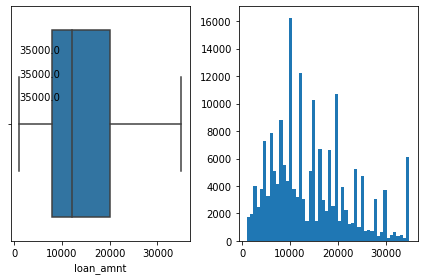

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



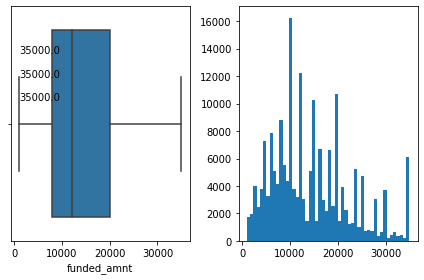

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



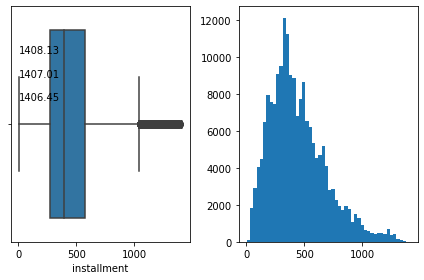

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



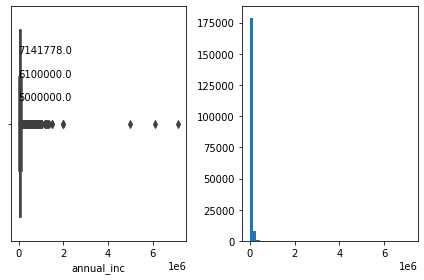

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



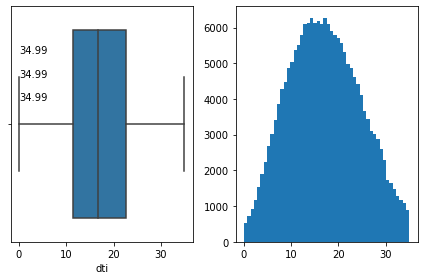

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



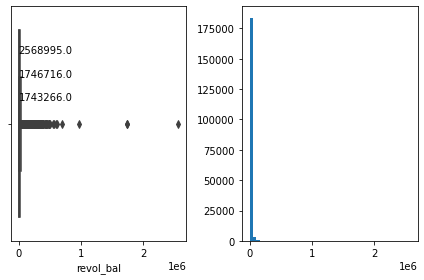

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



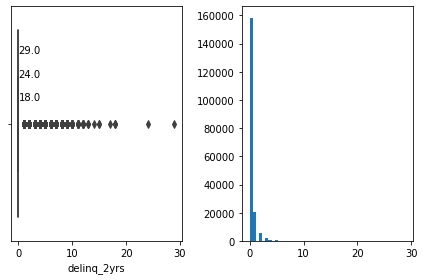

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



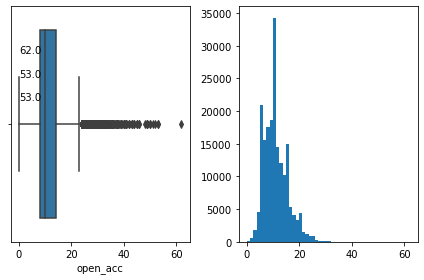

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



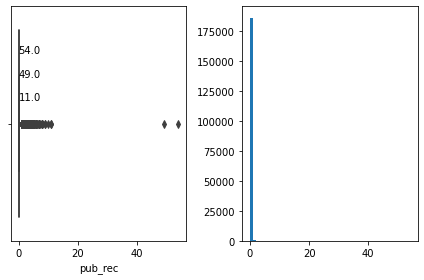

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



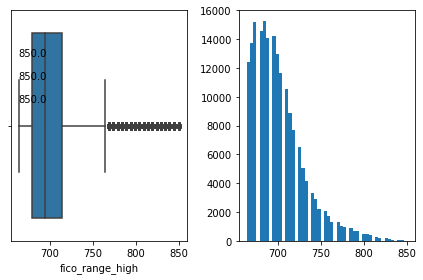

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



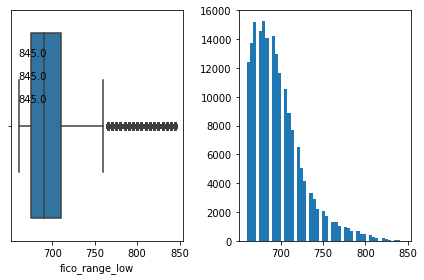

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



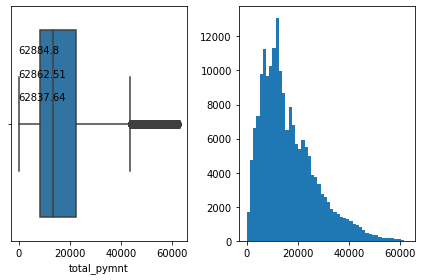

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



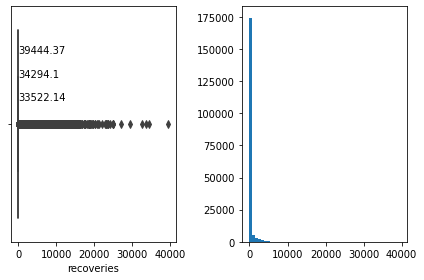

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



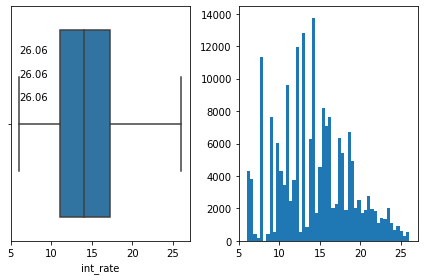

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



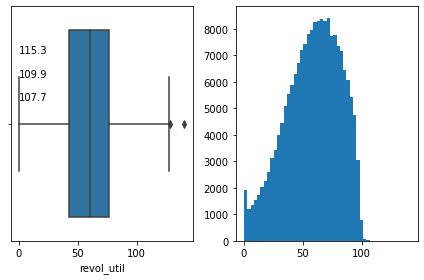

term
2 distinct values
 36 months    143892
 60 months     44289
Name: term, dtype: int64


grade
7 distinct values
B    62623
C    50009
A    28580
D    27892
E    12244
F     5708
G     1125
Name: grade, dtype: int64


emp_length
12 distinct values
10+ years    61199
2 years      16146
5 years      14270
3 years      13967
< 1 year     13224
6 years      11918
1 year       11434
7 years      11211
4 years      10847
8 years       8952
9 years       7126
Name: emp_length, dtype: int64


home_ownership
5 distinct values
MORTGAGE    97012
RENT        75627
OWN         15454
OTHER          46
NONE           42
Name: home_ownership, dtype: int64


verification_status
3 distinct values
Verified           87389
Not Verified       58828
Source Verified    41964
Name: verification_status, dtype: int64


loan_status
2 distinct values
Fully Paid     158510
Charged Off     29671
Name: loan_status, dtype: int64


purpose
13 distinct values
debt_consolidation    111451
credit_card            43170

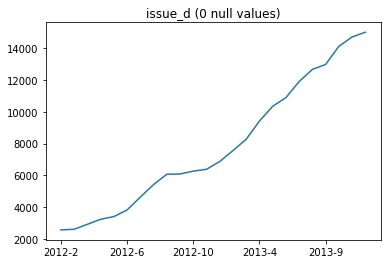

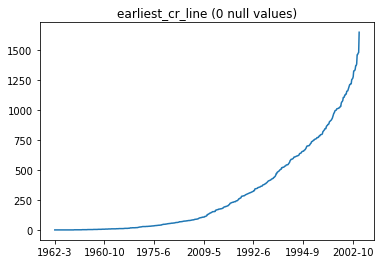

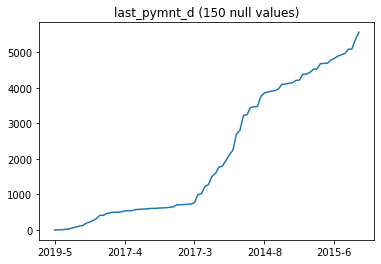

In [ ]:
visualize_columns()

## Step 4A - Handle outliers

In [ ]:
# There are quite a few outliers, but the two most obvious
# ones to remove are in annual_inc, revol_bal Remove these.
n_rows = len(final_data)
final_data = final_data[final_data.annual_inc < 1000000]
final_data = final_data[final_data.revol_bal < 400000]
final_data = final_data[final_data.dti < 200]
final_data = final_data[final_data.pub_rec < 50] #newly added <---
final_data = final_data[final_data.revol_util < 110] #newly added <---

#Remove all numerical columns having value less than zero. This will help in successful log transformation

for col in float_cols + perc_cols:
  final_data.drop(final_data[final_data[col] < 0].index, inplace = True)

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 180 rows


In [ ]:
final_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,last_pymnt_d,recoveries,loan_amnt_orig,funded_amnt_orig,term_orig,int_rate_orig,installment_orig,grade_orig,emp_length_orig,home_ownership_orig,annual_inc_orig,verification_status_orig,issue_d_orig,loan_status_orig,purpose_orig,dti_orig,delinq_2yrs_orig,earliest_cr_line_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,last_pymnt_d_orig,recoveries_orig
0,10148122,12000.0,12000.0,36 months,7.62,373.94,A,3 years,MORTGAGE,96500.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,12.61,0.0,2003-09-01,17.0,0.0,709.0,705.0,13248.0,55.7,13397.539998,2016-06-01,0.0,12000.0,12000.0,36 months,7.62,373.94,A,3 years,MORTGAGE,96500.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,12.61,0.0,2003-09-01,17.0,0.0,709.0,705.0,13248.0,55.7,13397.539998,2016-06-01,0.0
1,10149342,27050.0,27050.0,36 months,10.99,885.46,B,10+ years,OWN,55000.0,Verified,2013-12-01,Fully Paid,debt_consolidation,22.87,0.0,1986-10-01,14.0,0.0,734.0,730.0,36638.0,61.2,31752.530000,2016-07-01,0.0,27050.0,27050.0,36 months,10.99,885.46,B,10+ years,OWN,55000.0,Verified,2013-12-01,Fully Paid,debt_consolidation,22.87,0.0,1986-10-01,14.0,0.0,734.0,730.0,36638.0,61.2,31752.530000,2016-07-01,0.0
2,10129454,12000.0,12000.0,36 months,10.99,392.81,B,4 years,RENT,60000.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,4.62,0.0,2009-12-01,15.0,0.0,724.0,720.0,7137.0,24.0,13988.609996,2016-04-01,0.0,12000.0,12000.0,36 months,10.99,392.81,B,4 years,RENT,60000.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,4.62,0.0,2009-12-01,15.0,0.0,724.0,720.0,7137.0,24.0,13988.609996,2016-04-01,0.0
3,10149488,4800.0,4800.0,36 months,10.99,157.13,B,2 years,MORTGAGE,39600.0,Source Verified,2013-12-01,Fully Paid,home_improvement,2.49,0.0,1995-08-01,3.0,0.0,759.0,755.0,4136.0,16.1,5157.519457,2014-09-01,0.0,4800.0,4800.0,36 months,10.99,157.13,B,2 years,MORTGAGE,39600.0,Source Verified,2013-12-01,Fully Paid,home_improvement,2.49,0.0,1995-08-01,3.0,0.0,759.0,755.0,4136.0,16.1,5157.519457,2014-09-01,0.0
4,10129477,14000.0,14000.0,36 months,12.85,470.71,B,4 years,RENT,88000.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,10.02,1.0,1988-06-01,6.0,1.0,674.0,670.0,3686.0,81.9,16945.318783,2017-01-01,0.0,14000.0,14000.0,36 months,12.85,470.71,B,4 years,RENT,88000.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,10.02,1.0,1988-06-01,6.0,1.0,674.0,670.0,3686.0,81.9,16945.318783,2017-01-01,0.0


In [ ]:
# Remove all loans that are too recent to have been paid off or
# defaulted
n_rows = len(final_data)
final_data = final_data[final_data.loan_status.isin(['Fully Paid','Charged Off','Default'])]
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 0 rows


In [ ]:
# Only include loans issued since 2009
n_rows = len(final_data)
final_data = final_data[final_data.issue_d >= datetime.date(2009, 1, 1)]
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 0 rows


In [ ]:
## NOTE - NOT log transforming in this file. Log transforming later in the file.

# #log_transforms = ['loan_amnt', 'funded_amnt', 'installment', 'annual_inc', 'revol_bal', 'total_pymnt', 'recoveries']
# #scaled_transform = ['dti', 'delinq_2yrs', 'open_acc', 'pub_rec', 'fico_range_high', 'fico_range_low', 'int_rate', 'revol_util']

# #log transform 
# #to_log = float_cols + perc_cols
# #final_data1 = final_data[to_log].applymap(lambda x: np.log(x+1))

# for col in float_cols + perc_cols:
#   final_data[col] = np.log(final_data[col] + 1)
#   #df.apply(np.sqrt)


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



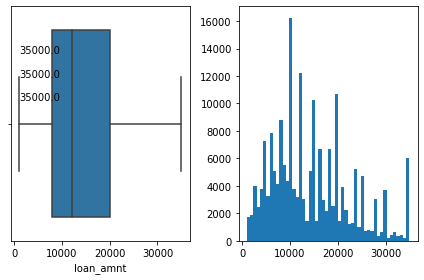

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



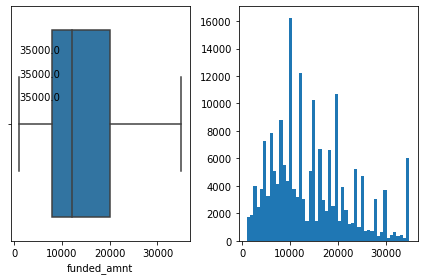

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



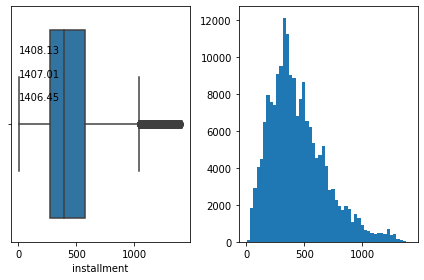

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



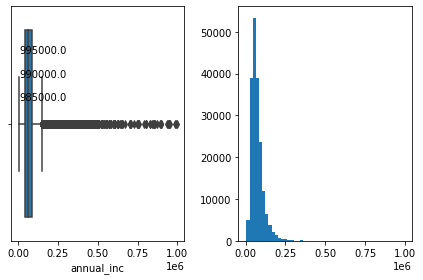

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



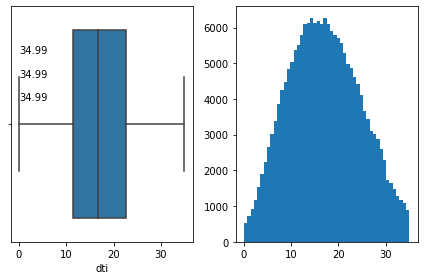

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



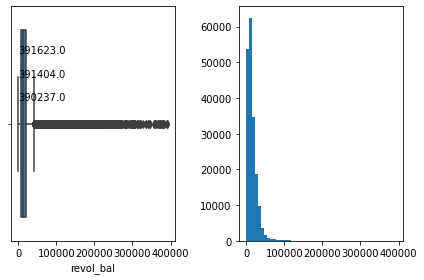

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



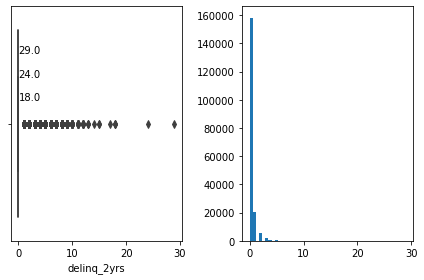

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



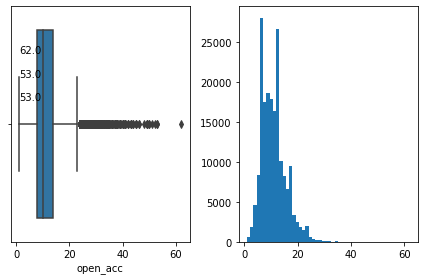

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



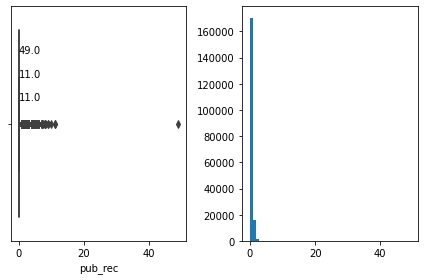

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



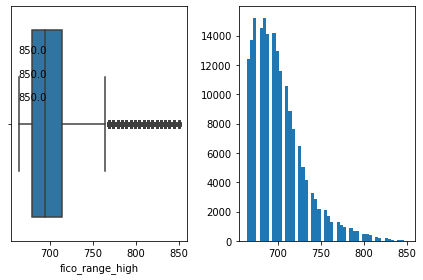

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



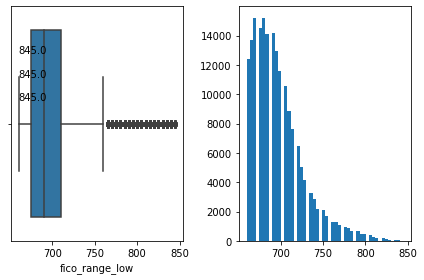

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



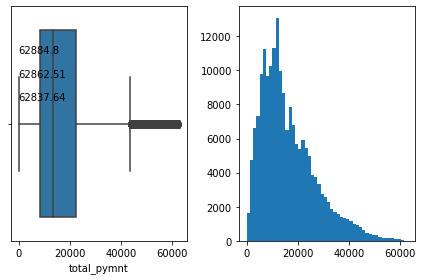

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



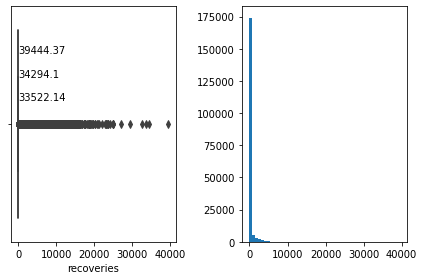

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



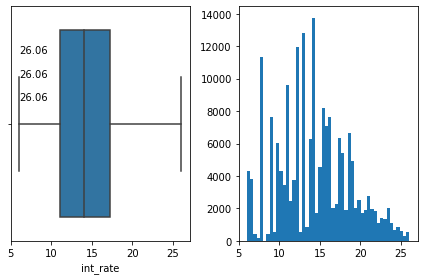

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



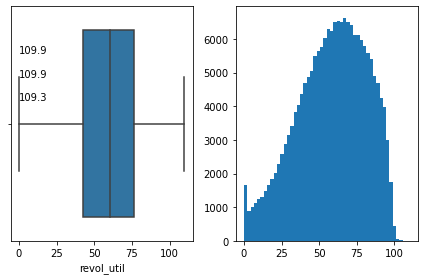

term
2 distinct values
 36 months    143749
 60 months     44252
Name: term, dtype: int64


grade
7 distinct values
B    62583
C    49969
A    28562
D    27848
E    12221
F     5699
G     1119
Name: grade, dtype: int64


emp_length
12 distinct values
10+ years    61129
2 years      16138
5 years      14256
3 years      13954
< 1 year     13208
6 years      11907
1 year       11421
7 years      11199
4 years      10838
8 years       8947
9 years       7120
Name: emp_length, dtype: int64


home_ownership
5 distinct values
MORTGAGE    96901
RENT        75572
OWN         15440
OTHER          46
NONE           42
Name: home_ownership, dtype: int64


verification_status
3 distinct values
Verified           87297
Not Verified       58798
Source Verified    41906
Name: verification_status, dtype: int64


loan_status
2 distinct values
Fully Paid     158358
Charged Off     29643
Name: loan_status, dtype: int64


purpose
13 distinct values
debt_consolidation    111370
credit_card            43145

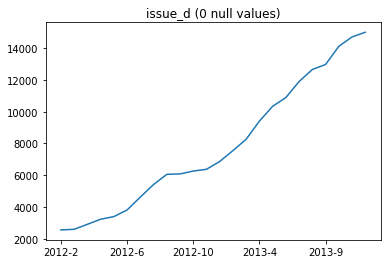

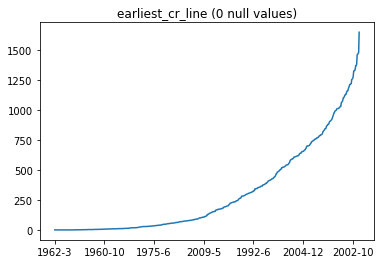

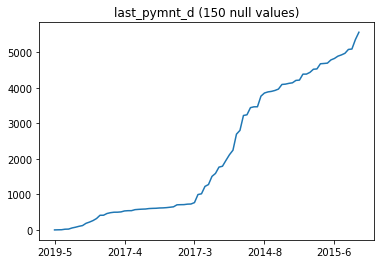

In [ ]:
# Visualize the data again
visualize_columns()

### Drop null values

In [ ]:
# Deal with null values. We allow categorical variables to be null
# OTHER than grade, which is a particularly important categorical.
# All non-categorical variables must be non-null, and we drop
# rows that do not meet this requirement

required_cols = set(cols_to_pick) - set(cat_cols) - set(["id"])
required_cols.add("grade")

n_rows = len(final_data)
final_data.dropna(subset = required_cols ,inplace=True)
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 150 rows


### Additional Cleaning - Remove dti values outliers and log-transform a few variables

#### Remove dti extremes

In [ ]:
final_data = final_data[final_data.dti < 50]
final_data = final_data[final_data.revol_util < 110]

#### Log Transformation for left skewed columns

In [ ]:
Log_Columns = ['annual_inc','revol_bal','open_acc', 'total_pymnt']

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass t

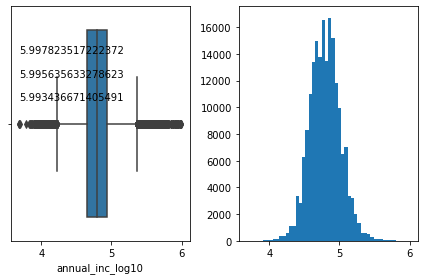

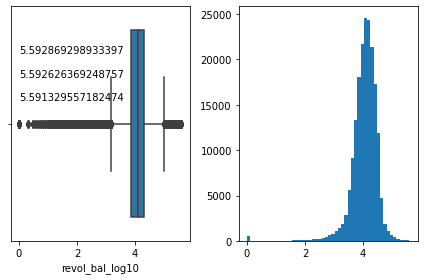

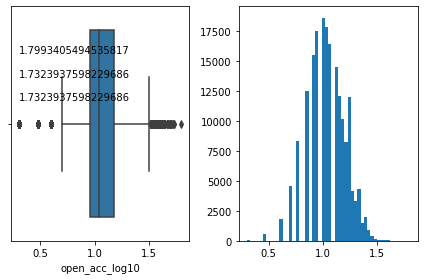

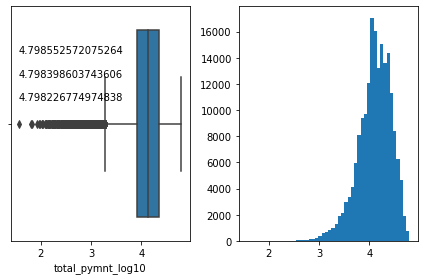

In [ ]:
# Log Transform and plot box-plot and histogram
# Show original and transformed side by side
for i in Log_Columns:
    
    final_data[i+"_log10"] = np.log10(final_data[i]+1)
    
    fig, axs = plt.subplots(1, 2, tight_layout=True)

    seaborn.boxplot(final_data[i+"_log10"], ax = axs[0])

    # Print the three highest values
    highest_vals = sorted(final_data[i+"_log10"], reverse=True)[:3]
    smallest_val = min(final_data[i+"_log10"])
    axs[0].text(smallest_val, -0.3, highest_vals[0])
    axs[0].text(smallest_val, -0.2, highest_vals[1])
    axs[0].text(smallest_val, -0.1, highest_vals[2])

    #Draw the histogram
    axs[1] = plt.hist(final_data[i+"_log10"],50)

In [ ]:
# Replace chosen columns with log version
for col in Log_Columns:
  final_data[col] = final_data[col+"_log10"]

In [ ]:
final_data.drop(columns=[c+"_log10" for c in Log_Columns],inplace=True)

## Step 5A - Save a Pickle

In [ ]:
# Remove the total_pymnt from the list of continuous features; this
# variable is highly predictive of the outcome but is not known at
# the time the loan is issued
continuous_features = [i for i in continuous_features if i not in ["total_pymnt", "recoveries"]]

In [ ]:
final_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,last_pymnt_d,recoveries,loan_amnt_orig,funded_amnt_orig,term_orig,int_rate_orig,installment_orig,grade_orig,emp_length_orig,home_ownership_orig,annual_inc_orig,verification_status_orig,issue_d_orig,loan_status_orig,purpose_orig,dti_orig,delinq_2yrs_orig,earliest_cr_line_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,last_pymnt_d_orig,recoveries_orig
0,10148122,12000.0,12000.0,36 months,7.62,373.94,A,3 years,MORTGAGE,4.984532,Not Verified,2013-12-01,Fully Paid,debt_consolidation,12.61,0.0,2003-09-01,1.255273,0.0,709.0,705.0,4.122183,55.7,4.127057,2016-06-01,0.0,12000.0,12000.0,36 months,7.62,373.94,A,3 years,MORTGAGE,96500.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,12.61,0.0,2003-09-01,17.0,0.0,709.0,705.0,13248.0,55.7,13397.539998,2016-06-01,0.0
1,10149342,27050.0,27050.0,36 months,10.99,885.46,B,10+ years,OWN,4.740371,Verified,2013-12-01,Fully Paid,debt_consolidation,22.87,0.0,1986-10-01,1.176091,0.0,734.0,730.0,4.563944,61.2,4.501792,2016-07-01,0.0,27050.0,27050.0,36 months,10.99,885.46,B,10+ years,OWN,55000.0,Verified,2013-12-01,Fully Paid,debt_consolidation,22.87,0.0,1986-10-01,14.0,0.0,734.0,730.0,36638.0,61.2,31752.530000,2016-07-01,0.0
2,10129454,12000.0,12000.0,36 months,10.99,392.81,B,4 years,RENT,4.778158,Not Verified,2013-12-01,Fully Paid,debt_consolidation,4.62,0.0,2009-12-01,1.204120,0.0,724.0,720.0,3.853577,24.0,4.145806,2016-04-01,0.0,12000.0,12000.0,36 months,10.99,392.81,B,4 years,RENT,60000.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,4.62,0.0,2009-12-01,15.0,0.0,724.0,720.0,7137.0,24.0,13988.609996,2016-04-01,0.0
3,10149488,4800.0,4800.0,36 months,10.99,157.13,B,2 years,MORTGAGE,4.597706,Source Verified,2013-12-01,Fully Paid,home_improvement,2.49,0.0,1995-08-01,0.602060,0.0,759.0,755.0,3.616686,16.1,3.712525,2014-09-01,0.0,4800.0,4800.0,36 months,10.99,157.13,B,2 years,MORTGAGE,39600.0,Source Verified,2013-12-01,Fully Paid,home_improvement,2.49,0.0,1995-08-01,3.0,0.0,759.0,755.0,4136.0,16.1,5157.519457,2014-09-01,0.0
4,10129477,14000.0,14000.0,36 months,12.85,470.71,B,4 years,RENT,4.944488,Not Verified,2013-12-01,Fully Paid,debt_consolidation,10.02,1.0,1988-06-01,0.845098,1.0,674.0,670.0,3.566673,81.9,4.229075,2017-01-01,0.0,14000.0,14000.0,36 months,12.85,470.71,B,4 years,RENT,88000.0,Not Verified,2013-12-01,Fully Paid,debt_consolidation,10.02,1.0,1988-06-01,6.0,1.0,674.0,670.0,3686.0,81.9,16945.318783,2017-01-01,0.0


In [ ]:
pickle.dump([final_data, discrete_features, continuous_features], open(pickle_file, "wb") )

## Step 1B - Ingestion - 2015-2016 Data

In [ ]:
# Define the directories that contain the files downloaded most recently

dir_data = "/content/drive/My Drive/BVIA Group 4/Data"

# Define the output path for the pickle
pickle_dir = "/content/drive/My Drive/BVIA Group 4/Pickle/"
pickle_file = "/content/drive/My Drive/BVIA Group 4/Pickle/201516_w2.pickle" #change the name of the pickle file here 

In [ ]:
# Ingest the set of files we downloaded 
files_data = ingest_files(dir_data)

Directory /content/drive/My Drive/BVIA Group 4/Data/ has 5 files:
    Reading file LoanStats_securev1_2016Q1.csv.zip
        Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q2.csv.zip
        Found 2 invalid rows which were removed
    Reading file LoanStats3d_securev1.csv.zip
        Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q3.csv.zip
        Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q4.csv.zip
        Found 2 invalid rows which were removed


In [ ]:
data_now = pd.concat(files_data.values()).reset_index(drop = True)
columns = list(data_now.columns)

In [ ]:
data_now.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,...,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
count,855502,0,855502,855502,855502,855502,855502,855502,855502,855502,803135,803471,855502,855502,855502,855502,855502,855502,855502,68,855502,832197,855502,855502,855437,855502,855502,855502,855502,855501,446712,157328,855502,855502,855502,855076,855502,855502,855502,855502,...,855502,855502,855502,855502,855502,0,0,0,0,0,0,0,0,0,0,0,0,0,851675,11679,13024,13024,13024,16851,13024,13024,12619,13024,13024,12181,15668,16851,16851,855502,27866,27866,27866,27866,27866,27866
unique,855502,0,1534,1534,1555,2,179,62278,7,35,210390,11,4,45949,3,24,7,1,855502,51,14,28,933,50,5565,28,700,38,38,7,152,122,81,36,77093,1255,139,2,29829,30162,...,33,357254,163051,8132,148748,0,0,0,0,0,0,0,0,0,0,0,0,0,2,8,18,4,5,7670,44,46,44,5,52,9,10708,12842,11714,2,61,3,63,18210,1508,40
top,91230863,NaN,10000,10000,10000,36 months,13.99%,301.15,C,C1,Teacher,10+ years,MORTGAGE,60000,Source Verified,Mar-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,,debt_consolidation,Debt consolidation,750xx,CA,19.2,0,Sep-2003,660,664,0,6,76,9,0,0,0%,20,w,0.00,0.00,...,0,15000,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,INTEREST ONLY-3 MONTHS DEFERRAL,INCOMECURT,COMPLETE,3,0,Apr-2020,Jun-2020,Apr-2020,3,0,ACTIVE,0,0,50,N,Apr-2019,COMPLETE,Jan-2018,4000,45,18
freq,1,NaN,60695,60698,58085,606668,32963,2665,252745,58010,16318,291493,419199,32938,366083,61992,657499,855502,1,18,498919,484489,8975,115955,609,675974,6305,82551,82551,523760,8819,2760,73461,698174,2863,3084,31121,600984,818262,818262,...,819562,256,246,8904,94791,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,850870,4960,3177,6782,8070,5957,3490,2534,2470,8070,6558,4129,3941,3934,126,827636,1196,18982,1117,41,10828,6319


## Step 2B - Prepare Dataset

In [ ]:
# Keep only the columns of interest
final_data = data_now[cols_to_pick].copy()

In [ ]:
print("Starting with " + str(len(final_data)) + " rows")

Starting with 855502 rows


### Typecast the columns

In [ ]:
for i in float_cols:
    final_data[i] = final_data[i].astype(float)
    
def clean_perc(x):
    if pd.isnull(x):
        return np.nan
    else:
        return float(x.strip()[:-1])
for i in perc_cols:
    final_data[i] = final_data[i].apply( clean_perc )
    
def clean_date(x):
    if pd.isnull(x):
        return None
    else:
        return datetime.datetime.strptime( x, "%b-%Y").date()
for i in date_cols:
    final_data[i] = final_data[i].apply( clean_date )
    
for i in cat_cols:
    final_data.loc[final_data[i].isnull(), i] = None

In [ ]:
# Retain original version of untransformed variables
final_data_orig = final_data.copy()
final_data_orig.columns = ["id"] + [c+"_orig" for c in final_data_orig.columns if c != "id"]
final_data = pd.merge(final_data, final_data_orig, left_on="id",right_on="id")

## Step 3B - Visualize the variables

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



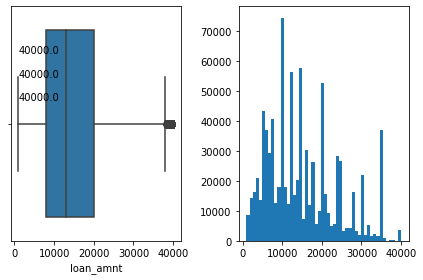

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



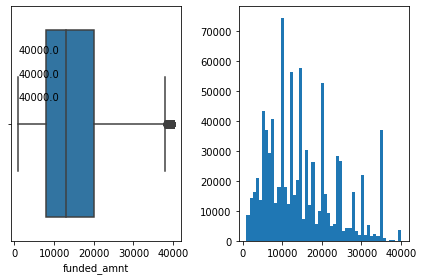

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



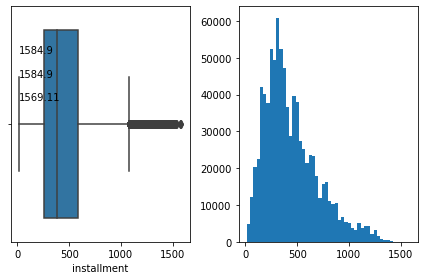

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



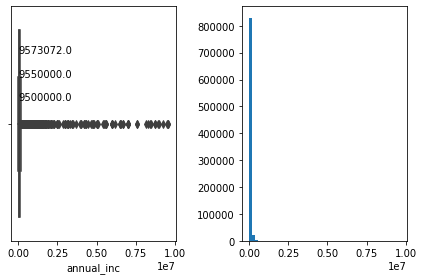

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



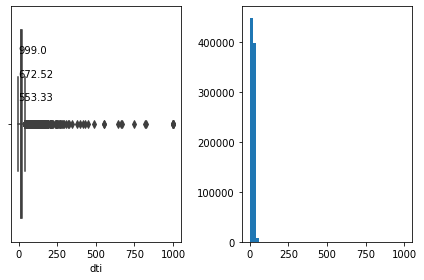

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



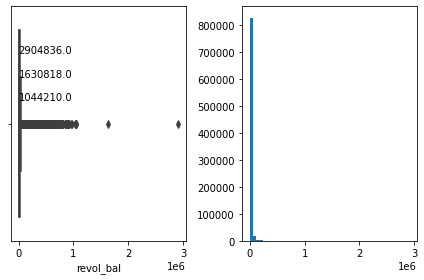

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



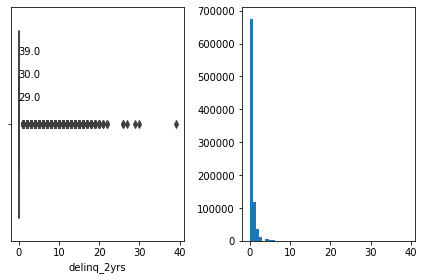

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



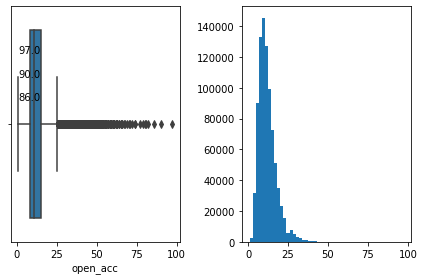

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



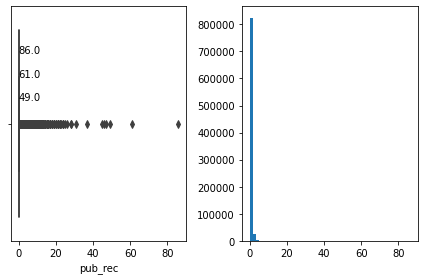

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



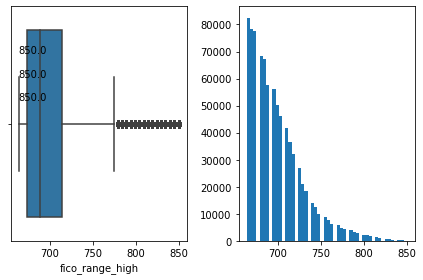

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



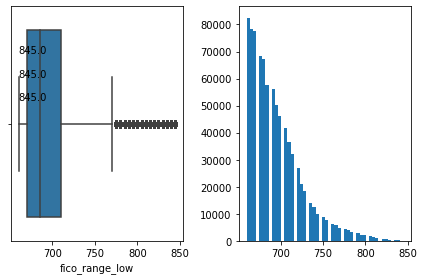

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



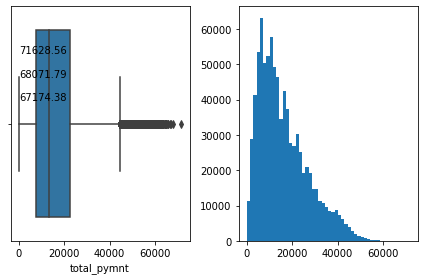

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



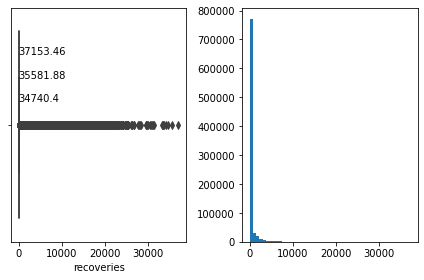

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



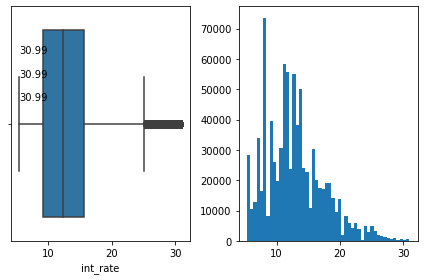

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



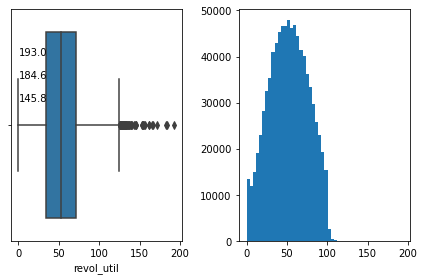

term
2 distinct values
 36 months    606668
 60 months    248834
Name: term, dtype: int64


grade
7 distinct values
C    252745
B    252118
A    144183
D    121832
E     60755
F     19151
G      4718
Name: grade, dtype: int64


emp_length
12 distinct values
10+ years    291493
2 years       77098
3 years       68164
< 1 year      66258
1 year        56629
5 years       51405
4 years       50326
8 years       40334
6 years       35494
9 years       33653
7 years       32617
Name: emp_length, dtype: int64


home_ownership
4 distinct values
MORTGAGE    419199
RENT        337388
OWN          98803
ANY            112
Name: home_ownership, dtype: int64


verification_status
3 distinct values
Source Verified    366083
Verified           249301
Not Verified       240118
Name: verification_status, dtype: int64


loan_status
7 distinct values
Fully Paid            657499
Charged Off           159613
Current                36740
In Grace Period          836
Late (31-120 days)       529
Late (16-3

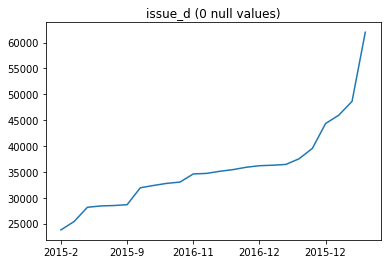

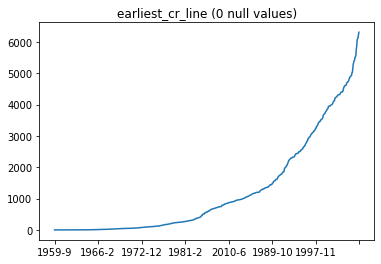

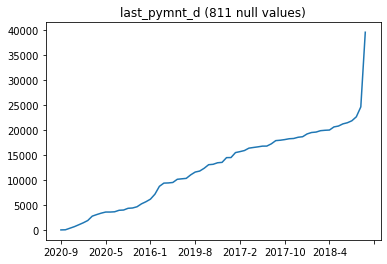

In [ ]:
visualize_columns()

## Step 4B - Handle outliers

In [ ]:
# There are quite a few outliers, but the two most obvious
# ones to remove are in annual_inc, revol_bal Remove these.
n_rows = len(final_data)
final_data = final_data[final_data.annual_inc < 1000000]
final_data = final_data[final_data.revol_bal < 400000]
final_data = final_data[final_data.dti < 200]
final_data = final_data[final_data.pub_rec < 50] #newly added <---
final_data = final_data[final_data.revol_util < 110] #newly added <---

#Remove all numerical columns having value less than zero. This will help in successful log transformation

for col in float_cols + perc_cols:
  final_data.drop(final_data[final_data[col] < 0].index, inplace = True)

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 1340 rows


In [ ]:
final_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,last_pymnt_d,recoveries,loan_amnt_orig,funded_amnt_orig,term_orig,int_rate_orig,installment_orig,grade_orig,emp_length_orig,home_ownership_orig,annual_inc_orig,verification_status_orig,issue_d_orig,loan_status_orig,purpose_orig,dti_orig,delinq_2yrs_orig,earliest_cr_line_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,last_pymnt_d_orig,recoveries_orig
0,73438990,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,85000.0,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,19.0,0.0,699.0,695.0,5346.0,10.5,8234.130000,2019-01-01,0.00,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,85000.0,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,19.0,0.0,699.0,695.0,5346.0,10.5,8234.130000,2019-01-01,0.00
1,74694337,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,80500.0,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,7.0,0.0,714.0,710.0,414.0,2.5,48284.801138,2020-07-01,0.00,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,80500.0,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,7.0,0.0,714.0,710.0,414.0,2.5,48284.801138,2020-07-01,0.00
2,74826201,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,49000.0,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,11.0,0.0,754.0,750.0,9309.0,18.4,7223.410000,2016-04-01,0.00,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,49000.0,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,11.0,0.0,754.0,750.0,9309.0,18.4,7223.410000,2016-04-01,0.00
3,74884818,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,156000.0,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,5.0,0.0,699.0,695.0,3611.0,23.6,35337.421039,2018-07-01,0.00,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,156000.0,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,5.0,0.0,699.0,695.0,3611.0,23.6,35337.421039,2018-07-01,0.00
4,75174813,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,50000.0,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,12.0,0.0,679.0,675.0,7996.0,51.6,5916.180000,2016-12-01,1627.03,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,50000.0,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,12.0,0.0,679.0,675.0,7996.0,51.6,5916.180000,2016-12-01,1627.03


In [ ]:
# Remove all loans that are too recent to have been paid off or
# defaulted
n_rows = len(final_data)
final_data = final_data[final_data.loan_status.isin(['Fully Paid','Charged Off','Default'])]
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 38286 rows


In [ ]:
# Only include loans issued since 2009
n_rows = len(final_data)
final_data = final_data[final_data.issue_d >= datetime.date(2009, 1, 1)]
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 0 rows


### Drop null values

In [ ]:
# Deal with null values. We allow categorical variables to be null
# OTHER than grade, which is a particularly important categorical.
# All non-categorical variables must be non-null, and we drop
# rows that do not meet this requirement

required_cols = set(cols_to_pick) - set(cat_cols) - set(["id"])
required_cols.add("grade")

n_rows = len(final_data)
final_data.dropna(subset = required_cols ,inplace=True)
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 808 rows


### Additional Cleaning - Remove dti values outliers and log-transform a few variables

#### Remove dti extremes

In [ ]:
final_data = final_data[final_data.dti < 50]
final_data = final_data[final_data.revol_util < 110]

#### Log Transformation for left skewed columns

In [ ]:
Log_Columns = ['annual_inc','revol_bal','open_acc', 'total_pymnt']

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass t

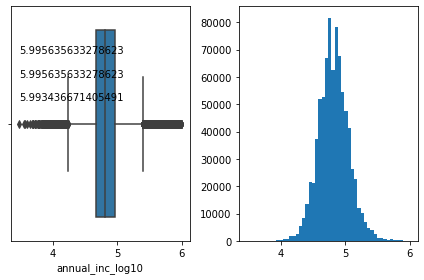

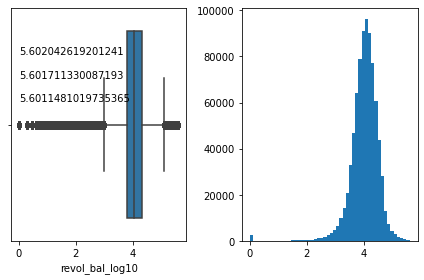

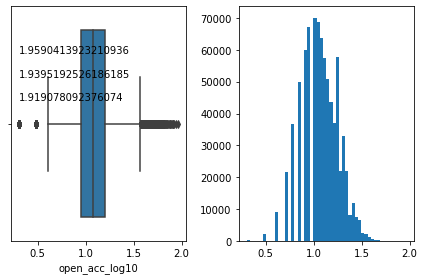

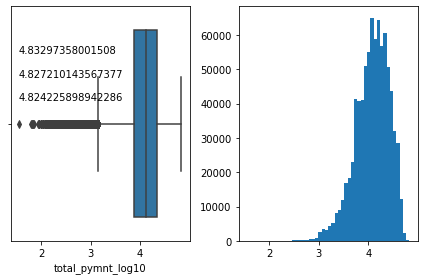

In [ ]:
# Log Transform and plot box-plot and histogram
# Show original and transformed side by side
for i in Log_Columns:
    
    final_data[i+"_log10"] = np.log10(final_data[i]+1)
    
    fig, axs = plt.subplots(1, 2, tight_layout=True)

    seaborn.boxplot(final_data[i+"_log10"], ax = axs[0])

    # Print the three highest values
    highest_vals = sorted(final_data[i+"_log10"], reverse=True)[:3]
    smallest_val = min(final_data[i+"_log10"])
    axs[0].text(smallest_val, -0.3, highest_vals[0])
    axs[0].text(smallest_val, -0.2, highest_vals[1])
    axs[0].text(smallest_val, -0.1, highest_vals[2])

    #Draw the histogram
    axs[1] = plt.hist(final_data[i+"_log10"],50)

In [ ]:
# Replace chosen columns with log version
for col in Log_Columns:
  final_data[col] = final_data[col+"_log10"]

In [ ]:
final_data.drop(columns=[c+"_log10" for c in Log_Columns],inplace=True)

## Step 5B - Save a Pickle

In [ ]:
# Remove the total_pymnt from the list of continuous features; this
# variable is highly predictive of the outcome but is not known at
# the time the loan is issued
continuous_features = [i for i in continuous_features if i not in ["total_pymnt", "recoveries"]]

In [ ]:
final_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,last_pymnt_d,recoveries,loan_amnt_orig,funded_amnt_orig,term_orig,int_rate_orig,installment_orig,grade_orig,emp_length_orig,home_ownership_orig,annual_inc_orig,verification_status_orig,issue_d_orig,loan_status_orig,purpose_orig,dti_orig,delinq_2yrs_orig,earliest_cr_line_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,last_pymnt_d_orig,recoveries_orig
0,73438990,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,4.929424,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,1.301030,0.0,699.0,695.0,3.728110,10.5,3.915670,2019-01-01,0.00,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,85000.0,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,19.0,0.0,699.0,695.0,5346.0,10.5,8234.130000,2019-01-01,0.00
1,74694337,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,4.905801,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,0.903090,0.0,714.0,710.0,2.618048,2.5,4.683819,2020-07-01,0.00,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,80500.0,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,7.0,0.0,714.0,710.0,414.0,2.5,48284.801138,2020-07-01,0.00
2,74826201,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,4.690205,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,1.079181,0.0,754.0,750.0,3.968950,18.4,3.858802,2016-04-01,0.00,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,49000.0,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,11.0,0.0,754.0,750.0,9309.0,18.4,7223.410000,2016-04-01,0.00
3,74884818,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,5.193127,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,0.778151,0.0,699.0,695.0,3.557748,23.6,4.548247,2018-07-01,0.00,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,156000.0,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,5.0,0.0,699.0,695.0,3611.0,23.6,35337.421039,2018-07-01,0.00
4,75174813,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,4.698979,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,1.113943,0.0,679.0,675.0,3.902927,51.6,3.772115,2016-12-01,1627.03,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,50000.0,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,12.0,0.0,679.0,675.0,7996.0,51.6,5916.180000,2016-12-01,1627.03


In [ ]:
pickle.dump([final_data, discrete_features, continuous_features], open(pickle_file, "wb") )

# Phase 2 - Diagnostic and Descriptive Analysis

This notebook carries out the following steps  
1. Read the pickle file
2. Add derived features of the returns on each loan
3. Visualize variables incl. returns
4. Explore returns by grade
5. Create multi-variable summaries
6. Run K-means on a relevant subset of the columns
7. Run PCA on a relevant subset of the columns
8. Save new pickle with the new return columns


## Step 1 - Read 2015-2016 pickle file

In [ ]:
path_to_data = "/content/drive/My Drive/BVIA Group 4/Pickle/" # Change this if NOT running in Google Colab
pickle_data = path_to_data+"201516_w2.pickle" #change the name of the pickle file here 

In [ ]:
### Read the data and features from the pickle
final_data, discrete_features, continuous_features = pickle.load( open(pickle_data, "rb" ) )


Notes about the pickle file ingested:
1. Log-transformed columns: annual_inc, revol_bal , open_acc, and total_pymn
2. Append  "_orig" at the end of the above log-trasnformed column names to retrieve the original value


In [ ]:
final_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,last_pymnt_d,recoveries,loan_amnt_orig,funded_amnt_orig,term_orig,int_rate_orig,installment_orig,grade_orig,emp_length_orig,home_ownership_orig,annual_inc_orig,verification_status_orig,issue_d_orig,loan_status_orig,purpose_orig,dti_orig,delinq_2yrs_orig,earliest_cr_line_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,last_pymnt_d_orig,recoveries_orig
0,73438990,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,4.929424,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,1.301030,0.0,699.0,695.0,3.728110,10.5,3.915670,2019-01-01,0.00,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,85000.0,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,19.0,0.0,699.0,695.0,5346.0,10.5,8234.130000,2019-01-01,0.00
1,74694337,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,4.905801,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,0.903090,0.0,714.0,710.0,2.618048,2.5,4.683819,2020-07-01,0.00,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,80500.0,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,7.0,0.0,714.0,710.0,414.0,2.5,48284.801138,2020-07-01,0.00
2,74826201,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,4.690205,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,1.079181,0.0,754.0,750.0,3.968950,18.4,3.858802,2016-04-01,0.00,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,49000.0,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,11.0,0.0,754.0,750.0,9309.0,18.4,7223.410000,2016-04-01,0.00
3,74884818,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,5.193127,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,0.778151,0.0,699.0,695.0,3.557748,23.6,4.548247,2018-07-01,0.00,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,156000.0,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,5.0,0.0,699.0,695.0,3611.0,23.6,35337.421039,2018-07-01,0.00
4,75174813,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,4.698979,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,1.113943,0.0,679.0,675.0,3.902927,51.6,3.772115,2016-12-01,1627.03,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,50000.0,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,12.0,0.0,679.0,675.0,7996.0,51.6,5916.180000,2016-12-01,1627.03


In [ ]:
final_data.describe()

,loan_amnt,funded_amnt,int_rate,installment,annual_inc,dti,delinq_2yrs,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,recoveries,loan_amnt_orig,funded_amnt_orig,int_rate_orig,installment_orig,annual_inc_orig,dti_orig,delinq_2yrs_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,recoveries_orig
count,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000,814483.000000
mean,14723.197998,14723.175898,12.724783,440.774327,4.821001,18.882670,0.352690,1.070626,0.247090,698.422369,694.422222,4.016131,51.946214,4.081210,298.240229,14723.197998,14723.175898,12.724783,440.774327,77077.194267,18.882670,0.352690,11.886192,0.247090,698.422369,694.422222,16858.959427,51.946214,15669.889950,298.240229
std,8756.622219,8756.622642,4.621573,260.644740,0.233419,8.647241,0.937303,0.186383,0.657224,30.846458,30.845742,0.498818,24.069956,0.342380,1147.304827,8756.622219,8756.622642,4.621573,260.644740,51041.099713,8.647241,0.937303,5.684731,0.657224,30.846458,30.845742,21252.690733,24.069956,10637.392847,1147.304827
min,1000.000000,1000.000000,5.320000,14.010000,3.477266,0.000000,0.000000,0.301030,0.000000,664.000000,660.000000,0.000000,0.000000,1.549126,0.000000,1000.000000,1000.000000,5.320000,14.010000,3000.000000,0.000000,0.000000,1.000000,0.000000,664.000000,660.000000,0.000000,0.000000,34.410000,0.000000
25%,8000.000000,8000.000000,9.170000,251.580000,4.672107,12.380000,0.000000,0.954243,0.000000,674.000000,670.000000,3.787602,33.900000,3.865171,0.000000,8000.000000,8000.000000,9.170000,251.580000,47000.000000,12.380000,0.000000,8.000000,0.000000,674.000000,670.000000,6131.000000,33.900000,7330.135000,0.000000
50%,12600.000000,12600.000000,12.290000,377.040000,4.812920,18.330000,0.000000,1.079181,0.000000,689.000000,685.000000,4.056791,52.000000,4.114000,0.000000,12600.000000,12600.000000,12.290000,377.040000,65000.000000,18.330000,0.000000,11.000000,0.000000,689.000000,685.000000,11396.000000,52.000000,13000.707804,0.000000
75%,20000.000000,20000.000000,15.410000,584.230000,4.965677,25.020000,0.000000,1.204120,0.000000,714.000000,710.000000,4.309194,70.300000,4.338509,0.000000,20000.000000,20000.000000,15.410000,584.230000,92400.000000,25.020000,0.000000,15.000000,0.000000,714.000000,710.000000,20378.500000,70.300000,21801.612242,0.000000
max,40000.000000,40000.000000,30.990000,1584.900000,5.995636,49.980000,39.000000,1.959041,49.000000,850.000000,845.000000,5.602043,109.900000,4.832974,37153.460000,40000.000000,40000.000000,30.990000,1584.900000,990000.000000,49.980000,39.000000,90.000000,49.000000,850.000000,845.000000,399983.000000,109.900000,68071.794585,37153.460000


## Step 2 - Calculate returns for each loan

In [ ]:
### Define the names of the four returns we'll be calculating
ret_cols = ["ret_PESS", "ret_OPT", "ret_INTa", "ret_INTb", "ret_INTc", "ret_Hybrid"]

In [ ]:
## Remove all rows for loans that were paid back on the days
# they were issued
final_data['loan_length'] = (final_data.last_pymnt_d - final_data.issue_d) / np.timedelta64(1, 'M')
n_rows = len(final_data)
final_data = final_data[final_data.loan_length != 0]
print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 3638 rows


#### Return Method 1 (pessimistic): Assume that the investor does not re-invest once the loan is paid back


In [ ]:
# Calculate the return using a simple annualized profit margin
# Pessimistic definition (method 1)

final_data['term_num'] = final_data.term.str.extract('(\d+)',expand=False).astype(int)
final_data['ret_PESS'] = ( (final_data.total_pymnt_orig - final_data.funded_amnt)
                                            / final_data.funded_amnt ) * (12 / final_data['term_num'])

#### Return Method 2 (optimistic): Assume that the investor immediately re-invests the paid back loan

In [ ]:
# Assuming that if a loan gives a positive return, we can
# immediately find a similar loan to invest in; if the loan
# takes a loss, we use method 1 to compute the return

final_data['ret_OPT'] = ( (final_data.total_pymnt_orig - final_data.funded_amnt)
                                            / final_data.funded_amnt ) * (12 / final_data['loan_length'])
final_data.loc[final_data.ret_OPT < 0,'ret_OPT'] = final_data.ret_PESS[final_data.ret_OPT < 0]

#### Return Method 3 (re-investment in fixed time horizon): Assume that the investor re-invests the partial revenue returned on a loan in an index bond within a fixed time-horizon

In [ ]:
def ret_method_3(T, i):
    '''
    Given an investment time horizon (in months) and re-investment
    interest rate, calculate the return of each loan
    '''

    # Assuming that the total amount paid back was paid at equal
    # intervals during the duration of the loan, calculate the
    # size of each of these installment
    actual_installment = (final_data.total_pymnt_orig - final_data.recoveries) / final_data['loan_length']

    # Assuming the amount is immediately re-invested at the prime
    # rate, find the total amount of money we'll have by the end
    # of the loan
    cash_by_end_of_loan = actual_installment * (1 - pow(1 + i, final_data.loan_length)) / ( 1 - (1 + i) )

    cash_by_end_of_loan = cash_by_end_of_loan + final_data.recoveries

    # Assuming that cash is then re-invested at the prime rate,
    # with monthly re-investment, until T months from the start
    # of the loan
    remaining_months = T - final_data['loan_length']
    final_return = cash_by_end_of_loan * pow(1 + i, remaining_months)

    # Find the percentage return
    return( (12/T) * ( ( final_return - final_data['funded_amnt'] ) / final_data['funded_amnt'] ) )

final_data['ret_INTa'] = ret_method_3(5*12, 0.001)
final_data['ret_INTb'] = ret_method_3(5*12, 0.0025)
final_data['ret_INTc'] = ret_method_3(5*12, 0.005)

#### Return Method 4 (Hybrid) 
*   Paid to Term: Follow M3 (T=60, i=5%) 
*   Early Repaid: Follow M2
*   Early Default: Follow M3 (T=60, i=2.5%)
*   Default close to Term: Follow M3 (T=60, i=5%)


In [ ]:
def return_method_3_mod(row,T,i):
  #Similar to return method 3 calculation above, but modified to apply at row level
  actual_installment = (row.total_pymnt_orig - row.recoveries) / row['loan_length']
  cash_by_end_of_loan = actual_installment * (1 - pow(1 + i, row.loan_length)) / ( 1 - (1 + i) )
  cash_by_end_of_loan = cash_by_end_of_loan + row.recoveries
  remaining_months = T - row['loan_length']
  final_return = cash_by_end_of_loan * pow(1 + i, remaining_months)
  return( (12/T) * ( ( final_return - row['funded_amnt'] ) / row['funded_amnt'] ) )

def return_method_hybrid(row):
  #if loan is paid to term (m == T, i (monthly) = 5% / 12)
  if row['loan_length'] == row['term_num']:
    return return_method_3_mod(row,60,0.05/12)   
  #if loan is repaid early (m < 20% T and loan status == 'Fully Paid')
  elif row['loan_length'] < 0.2 * row['term_num'] and row['loan_status'] == 'Fully Paid':
    return ( (row.total_pymnt_orig - row.funded_amnt)
                                            / row.funded_amnt ) * (12 / row['loan_length'])
  #if loan is default early (m < 20% T and loan status != 'Fully Paid')
  elif row['loan_length'] < 0.2 * row['term_num'] and row['loan_status'] != 'Fully Paid':
    return return_method_3_mod(row,60,0.025/12)
  #if loan is default close to term (m >= 20% T and loan status != 'Fully Paid')
  else:
    return return_method_3_mod(row,60,0.05/12)

In [ ]:
final_data["ret_Hybrid"] = final_data.apply(lambda row: return_method_hybrid(row),axis=1)

In [ ]:
# Check if logic miss any values
np.where(pd.isna(final_data['ret_Hybrid']))

(array([], dtype=int64),)

In [ ]:
final_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,dti,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,fico_range_high,fico_range_low,revol_bal,revol_util,total_pymnt,last_pymnt_d,recoveries,loan_amnt_orig,funded_amnt_orig,term_orig,int_rate_orig,installment_orig,grade_orig,emp_length_orig,home_ownership_orig,annual_inc_orig,verification_status_orig,issue_d_orig,loan_status_orig,purpose_orig,dti_orig,delinq_2yrs_orig,earliest_cr_line_orig,open_acc_orig,pub_rec_orig,fico_range_high_orig,fico_range_low_orig,revol_bal_orig,revol_util_orig,total_pymnt_orig,last_pymnt_d_orig,recoveries_orig,loan_length,term_num,ret_PESS,ret_OPT,ret_INTa,ret_INTb,ret_INTc,ret_Hybrid
0,73438990,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,4.929424,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,1.301030,0.0,699.0,695.0,3.728110,10.5,3.915670,2019-01-01,0.00,12500.0,12500.0,60 months,7.39,249.83,A,10+ years,RENT,85000.0,Not Verified,2016-03-01,Charged Off,credit_card,19.60,1.0,2001-10-01,19.0,0.0,699.0,695.0,5346.0,10.5,8234.130000,2019-01-01,0.00,34.037660,60,-0.068254,-0.068254,-0.062533,-0.053467,-0.036967,-0.042670
1,74694337,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,4.905801,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,0.903090,0.0,714.0,710.0,2.618048,2.5,4.683819,2020-07-01,0.00,40000.0,40000.0,60 months,7.89,808.96,A,< 1 year,MORTGAGE,80500.0,Verified,2016-03-01,Fully Paid,home_improvement,3.74,0.0,1992-11-01,7.0,0.0,714.0,710.0,414.0,2.5,48284.801138,2020-07-01,0.00,52.009282,60,0.041424,0.047788,0.049671,0.062668,0.086121,0.078043
2,74826201,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,4.690205,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,1.079181,0.0,754.0,750.0,3.968950,18.4,3.858802,2016-04-01,0.00,7200.0,7200.0,36 months,5.32,216.83,A,10+ years,MORTGAGE,49000.0,Source Verified,2016-03-01,Fully Paid,debt_consolidation,19.05,0.0,2001-12-01,11.0,0.0,754.0,750.0,9309.0,18.4,7223.410000,2016-04-01,0.00,1.018501,36,0.001084,0.038308,0.012837,0.032492,0.069288,0.038308
3,74884818,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,5.193127,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,0.778151,0.0,699.0,695.0,3.557748,23.6,4.548247,2018-07-01,0.00,32000.0,32000.0,36 months,6.97,987.63,A,10+ years,OWN,156000.0,Verified,2016-03-01,Fully Paid,home_improvement,5.25,0.0,1983-07-01,5.0,0.0,699.0,695.0,3611.0,23.6,35337.421039,2018-07-01,0.00,27.992361,36,0.034765,0.044710,0.031143,0.047484,0.077352,0.067012
4,75174813,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,4.698979,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,1.113943,0.0,679.0,675.0,3.902927,51.6,3.772115,2016-12-01,1627.03,16000.0,16000.0,36 months,12.99,539.03,C,< 1 year,RENT,50000.0,Not Verified,2016-03-01,Charged Off,debt_consolidation,38.32,0.0,2000-08-01,12.0,0.0,679.0,675.0,7996.0,51.6,5916.180000,2016-12-01,1627.03,9.035093,36,-0.210080,-0.210080,-0.121956,-0.115397,-0.103240,-0.107472


## Step 3 - Visualize the variables

In [ ]:
# Identify the type of each of these column
float_cols = ['loan_amnt', 'funded_amnt', 'installment', 'annual_inc',
                     'dti', 'revol_bal', 'delinq_2yrs', 'open_acc', 'pub_rec',
                                'fico_range_high', 'fico_range_low', 'total_pymnt', 'recoveries', 
                                    'ret_OPT',	'ret_PESS',	'ret_INTa',	'ret_INTb',	'ret_INTc',	'ret_Hybrid']
cat_cols = ['term', 'grade', 'emp_length', 'home_ownership',
                    'verification_status', 'loan_status', 'purpose']
perc_cols = ['int_rate', 'revol_util']
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d']

def visualize_columns():
    '''
    This function visualizes all columns
      - Box-and-whisker and histogram plots for continuous variables
      - Lists of distinct values for categorical columns
      - A timeline density for dates
    '''
    
    # Float columns
    for i in float_cols + perc_cols:
        fig, axs = plt.subplots(1, 2, tight_layout=True)

        sns.boxplot(final_data[i], ax = axs[0])

        # Print the three highest values
        highest_vals = sorted(final_data[i], reverse=True)[:3]
        smallest_val = round(min(final_data[i]),2)
        axs[0].text(smallest_val, -0.3, round(highest_vals[0],2))
        axs[0].text(smallest_val, -0.2, round(highest_vals[1],2))
        axs[0].text(smallest_val, -0.1, round(highest_vals[2],2))

        #Draw the histogram
        axs[1] = plt.hist(final_data[i],50)
        plt.show()
        
    # Categorical columns 
    for i in cat_cols:
        print(i)
        print(str(len(set(final_data[i]))) + " distinct values")
        print(final_data[i].value_counts())
        print("")
        print("")
    
    # Date columns
    for i in date_cols:
        final_data[final_data[i].isnull() == False][i].apply(lambda x : str(x.year) +
                                                "-" + str(x.month)).value_counts(ascending = True).plot()
        plt.title(i + " (" + str(final_data[i].isnull().sum()) + " null values)")
        plt.show()

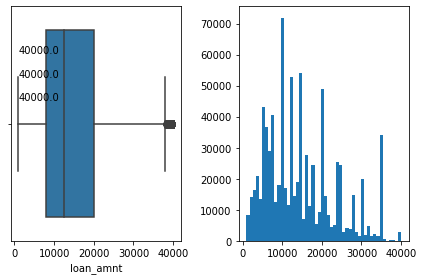

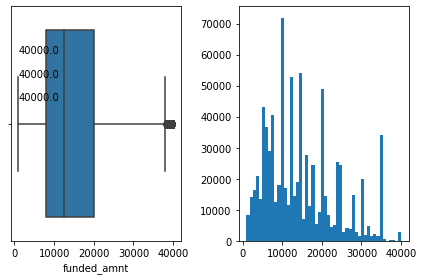

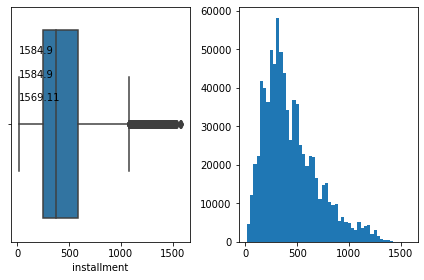

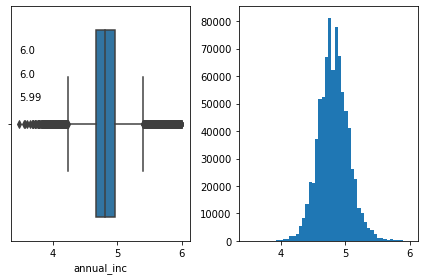

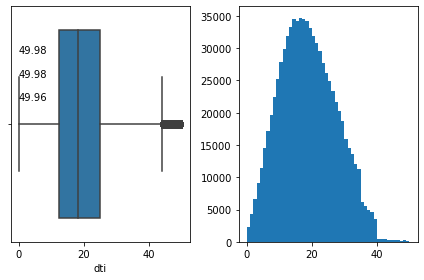

...

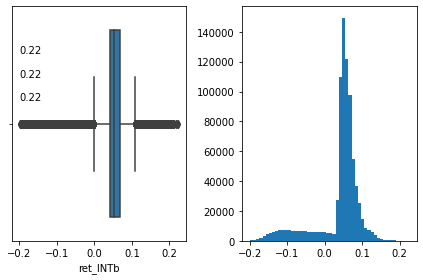

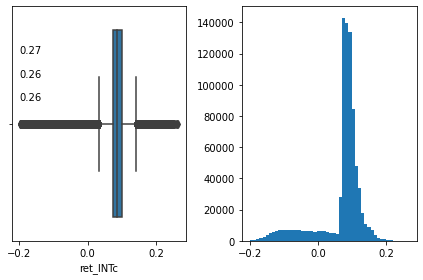

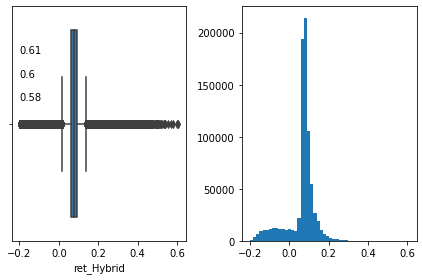

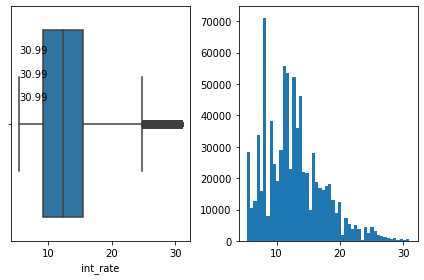

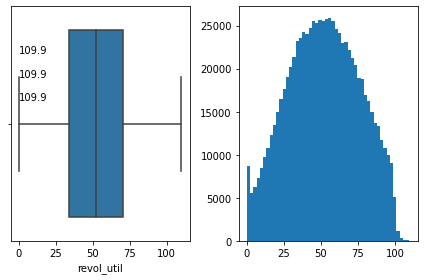

term
2 distinct values
 36 months    602040
 60 months    208805
Name: term, dtype: int64


grade
7 distinct values
B    241685
C    236004
A    141730
D    113454
E     56028
F     17613
G      4331
Name: grade, dtype: int64


emp_length
12 distinct values
10+ years    274185
2 years       73409
3 years       64885
< 1 year      63234
1 year        54017
5 years       48806
4 years       47834
8 years       38238
6 years       33685
9 years       31913
7 years       31002
Name: emp_length, dtype: int64


home_ownership
4 distinct values
MORTGAGE    394517
RENT        322668
OWN          93556
ANY            104
Name: home_ownership, dtype: int64


verification_status
3 distinct values
Source Verified    349513
Verified           236492
Not Verified       224840
Name: verification_status, dtype: int64


loan_status
3 distinct values
Fully Paid     652384
Charged Off    158423
Default            38
Name: loan_status, dtype: int64


purpose
14 distinct values
debt_consolidation    472473

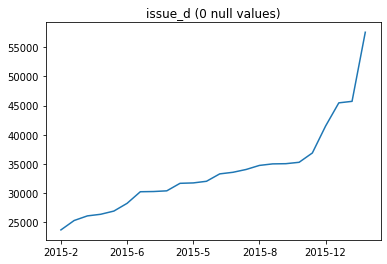

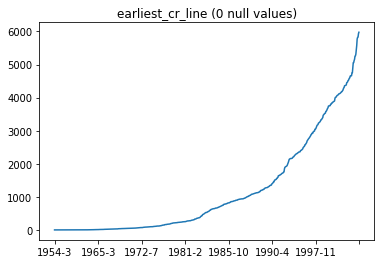

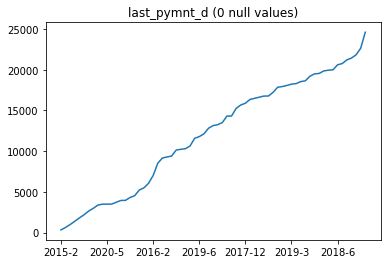

In [ ]:
visualize_columns()

## Step 4 - Explore returns by loan grade

Grades A and B make up 49% of loans. Default rates of Grades A and B are less than 11%, whereas the rest of the grades show a high default rates. Across the board, M3 and Hybrid investment strategies yield highest returns

In [ ]:
# Find the percentage of loans by grade, the default by grade,
# and the return of each grade
perc_by_grade = (final_data.grade.value_counts()*100/len(final_data)).sort_index()
default_by_grade = final_data.groupby("grade").apply(lambda x : (x.loan_status != "Fully Paid").sum()*100/len(x) )
ret_by_grade_OPT = final_data.groupby("grade").apply(lambda x : np.mean(x.ret_OPT)*100 )
ret_by_grade_PESS = final_data.groupby("grade").apply(lambda x : np.mean(x.ret_PESS)*100 )
ret_by_grade_INTa = final_data.groupby("grade").apply(lambda x : np.mean(x.ret_INTa)*100 )
ret_by_grade_INTb = final_data.groupby("grade").apply(lambda x : np.mean(x.ret_INTb)*100 )
ret_by_grade_INTc = final_data.groupby("grade").apply(lambda x : np.mean(x.ret_INTc)*100 )
ret_by_grade_Hybrid = final_data.groupby("grade").apply(lambda x : np.mean(x.ret_Hybrid)*100 )
int_rate_by_grade = final_data.groupby("grade").apply(lambda x : np.mean(x.int_rate))

combined = pd.DataFrame(perc_by_grade)
combined['default'] = default_by_grade
combined['int_rate'] = int_rate_by_grade
combined['return_OPT'] = ret_by_grade_OPT
combined['return_PESS'] = ret_by_grade_PESS
combined['return_INTa'] = ret_by_grade_INTa
combined['return_INTb'] = ret_by_grade_INTb
combined['return_INTc'] = ret_by_grade_INTc
combined['return_Hybrid'] = ret_by_grade_Hybrid

combined

,grade,default,int_rate,return_OPT,return_PESS,return_INTa,return_INTb,return_INTc,return_Hybrid
A,17.479296,5.727087,6.908802,3.639489,2.174113,2.339542,3.942957,6.881712,5.902201
B,29.806560,12.945363,10.150326,4.660590,2.337938,2.533941,4.147305,7.105157,6.344516
C,29.105933,21.720395,13.545406,5.363655,2.043611,2.419251,4.026174,6.973582,6.555440
D,13.992070,30.807199,17.439422,5.953593,1.624154,2.150933,3.742521,6.663261,6.717656
E,6.909829,39.266081,20.557436,6.367694,0.942167,1.729026,3.280157,6.127183,6.741312
F,2.172178,48.498268,24.649723,6.311307,-0.151237,0.738194,2.243834,5.010688,6.323004
G,0.534134,53.151697,27.848418,6.521795,-0.852385,0.131578,1.619011,4.355386,6.275426


## Step 5 - Add multi-variable summaries, e.g. 2-vars at a time
You can start with the plot below and expand the summaries based on any interesting patterns you observe.

Observations:
1. Clearly higher the loan grade, higher the interest rate and default rate. 

2. Default rate has a high positive correlation with the optimistic return value, while having a highly negative correlation with the pessimistic, and hybrid return values. So, the user may want to adopt hybrid or pessimsitic return approach if they are  predominantly investing in loan grades A, B, or C ( that are likely to default less). On the other hand, if the investor wants to invest more in riskier loan grades such as D, E, F, or G, they may want to adopt the pessimistic or hybrid return approach. 

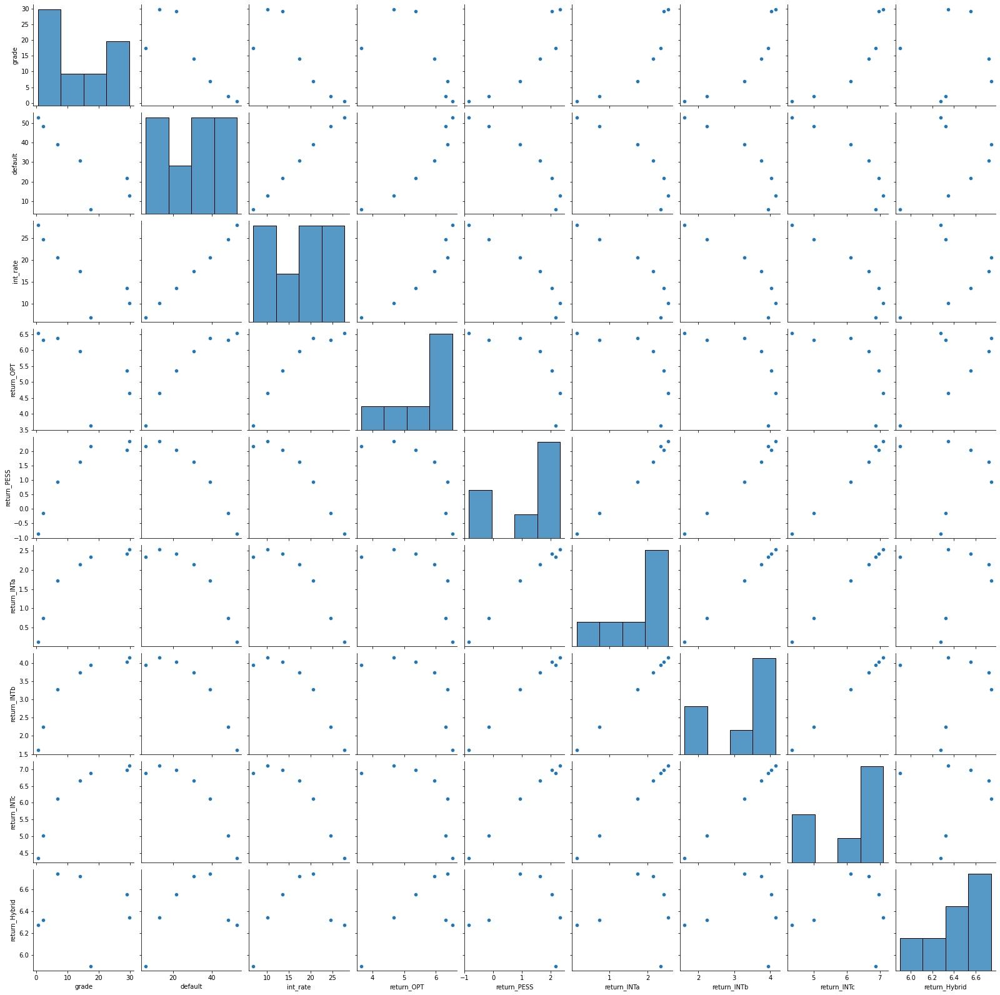

In [ ]:
sns.pairplot(combined)

Show correlation matrix.  

In [ ]:
drop_cols = [c for c in final_data.columns if 'orig' in c]
correl_df = final_data[sorted(set(final_data.columns) - set(drop_cols))]
correl_df.set_index('id', inplace=True)

#Calculate span of earliest credit line at the time the loan was issued
correl_df['credit_span'] = (correl_df.issue_d - correl_df.earliest_cr_line) / np.timedelta64(1, 'D')

#dtrop date columns
correl_df.drop(columns = date_cols, inplace=True)

correl_df.head()


,annual_inc,delinq_2yrs,dti,emp_length,fico_range_high,fico_range_low,funded_amnt,grade,home_ownership,installment,int_rate,loan_amnt,loan_length,loan_status,open_acc,pub_rec,purpose,recoveries,ret_Hybrid,ret_INTa,ret_INTb,ret_INTc,ret_OPT,ret_PESS,revol_bal,revol_util,term,term_num,total_pymnt,verification_status,credit_span
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
73438990,4.929424,1.0,19.60,10+ years,699.0,695.0,12500.0,A,RENT,249.83,7.39,12500.0,34.037660,Charged Off,1.301030,0.0,credit_card,0.00,-0.042670,-0.062533,-0.053467,-0.036967,-0.068254,-0.068254,3.728110,10.5,60 months,60,3.915670,Not Verified,5265.0
74694337,4.905801,0.0,3.74,< 1 year,714.0,710.0,40000.0,A,MORTGAGE,808.96,7.89,40000.0,52.009282,Fully Paid,0.903090,0.0,home_improvement,0.00,0.078043,0.049671,0.062668,0.086121,0.047788,0.041424,2.618048,2.5,60 months,60,4.683819,Verified,8521.0
74826201,4.690205,0.0,19.05,10+ years,754.0,750.0,7200.0,A,MORTGAGE,216.83,5.32,7200.0,1.018501,Fully Paid,1.079181,0.0,debt_consolidation,0.00,0.038308,0.012837,0.032492,0.069288,0.038308,0.001084,3.968950,18.4,36 months,36,3.858802,Source Verified,5204.0
74884818,5.193127,0.0,5.25,10+ years,699.0,695.0,32000.0,A,OWN,987.63,6.97,32000.0,27.992361,Fully Paid,0.778151,0.0,home_improvement,0.00,0.067012,0.031143,0.047484,0.077352,0.044710,0.034765,3.557748,23.6,36 months,36,4.548247,Verified,11932.0
75174813,4.698979,0.0,38.32,< 1 year,679.0,675.0,16000.0,C,RENT,539.03,12.99,16000.0,9.035093,Charged Off,1.113943,0.0,debt_consolidation,1627.03,-0.107472,-0.121956,-0.115397,-0.103240,-0.210080,-0.210080,3.902927,51.6,36 months,36,3.772115,Not Verified,5691.0


Create heatmap of the correlation matrix


Observations:

1. Total payment has a very high positive correlation with funded_amnt, installment, and int_rate. It also has a medium positive correlation with annual_income and the various return rates. 
2. Fico scores have a medium negative correlation with int_rate and revol_util. 
3. Funded_amt is the same as the loan_amt with a '1' correlation. Both of them has a very high positive correlation with installment. 
4. Interestingly the credit span, which is the time since the earliest credit line date is not correlated to FICO Score.

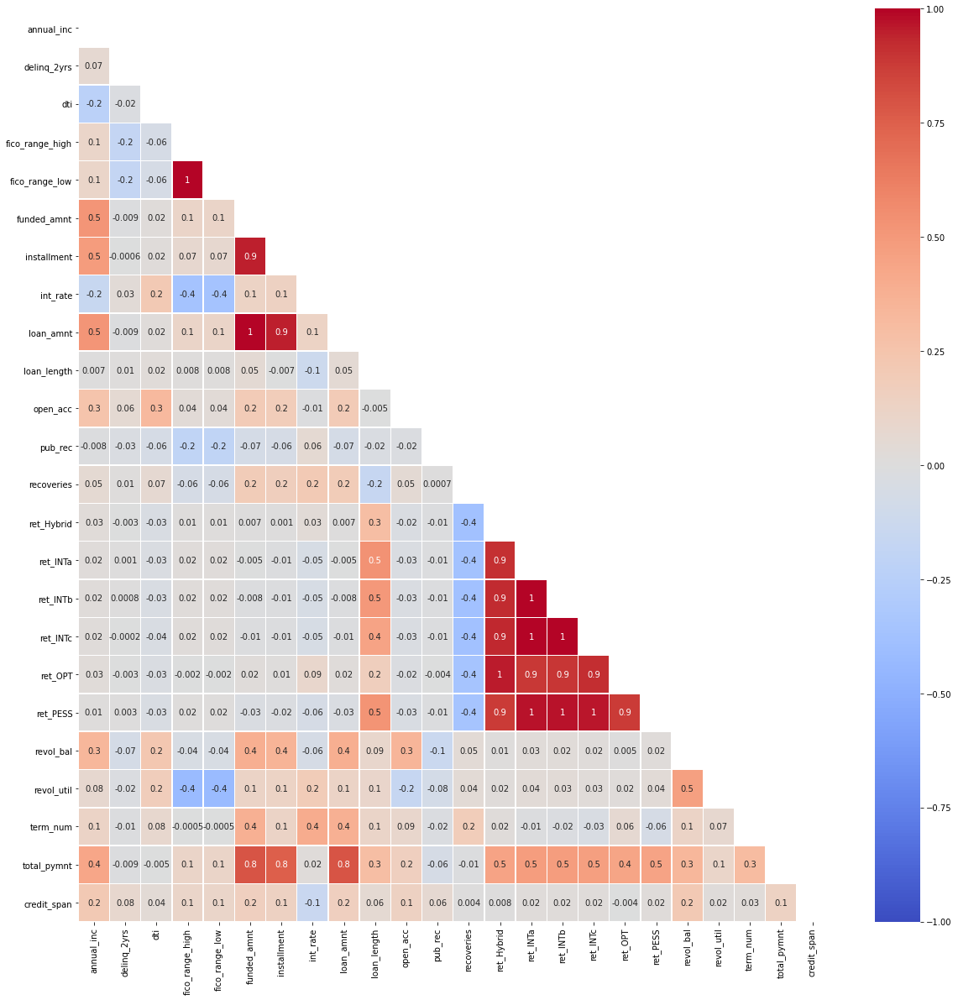

In [ ]:
fig, axs = plt.subplots(1, 1,figsize = (20, 20))
mask = np.zeros_like(correl_df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(correl_df.corr(), vmin=-1, vmax=1, center= 0, annot = True, fmt = '.1g', cmap= 'coolwarm', linewidths=.5, ax = axs, mask=mask)


Convert categorical variables to dummies and store it in another dataframe

In [ ]:
correl_df_cat = pd.get_dummies(correl_df)
correl_df_cat.head()

,annual_inc,delinq_2yrs,dti,fico_range_high,fico_range_low,funded_amnt,installment,int_rate,loan_amnt,loan_length,open_acc,pub_rec,recoveries,ret_Hybrid,ret_INTa,ret_INTb,ret_INTc,ret_OPT,ret_PESS,revol_bal,revol_util,term_num,total_pymnt,credit_span,emp_length_1 year,emp_length_10+ years,emp_length_2 years,emp_length_3 years,emp_length_4 years,emp_length_5 years,emp_length_6 years,emp_length_7 years,emp_length_8 years,emp_length_9 years,emp_length_< 1 year,grade_A,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,home_ownership_ANY,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,loan_status_Charged Off,loan_status_Default,loan_status_Fully Paid,purpose_car,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,term_ 36 months,term_ 60 months,verification_status_Not Verified,verification_status_Source Verified,verification_status_Verified
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
73438990,4.929424,1.0,19.60,699.0,695.0,12500.0,249.83,7.39,12500.0,34.037660,1.301030,0.0,0.00,-0.042670,-0.062533,-0.053467,-0.036967,-0.068254,-0.068254,3.728110,10.5,60,3.915670,5265.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
74694337,4.905801,0.0,3.74,714.0,710.0,40000.0,808.96,7.89,40000.0,52.009282,0.903090,0.0,0.00,0.078043,0.049671,0.062668,0.086121,0.047788,0.041424,2.618048,2.5,60,4.683819,8521.0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
74826201,4.690205,0.0,19.05,754.0,750.0,7200.0,216.83,5.32,7200.0,1.018501,1.079181,0.0,0.00,0.038308,0.012837,0.032492,0.069288,0.038308,0.001084,3.968950,18.4,36,3.858802,5204.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
74884818,5.193127,0.0,5.25,699.0,695.0,32000.0,987.63,6.97,32000.0,27.992361,0.778151,0.0,0.00,0.067012,0.031143,0.047484,0.077352,0.044710,0.034765,3.557748,23.6,36,4.548247,11932.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
75174813,4.698979,0.0,38.32,679.0,675.0,16000.0,539.03,12.99,16000.0,9.035093,1.113943,0.0,1627.03,-0.107472,-0.121956,-0.115397,-0.103240,-0.210080,-0.210080,3.902927,51.6,36,3.772115,5691.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0


Show correlation of total payment with the categorical variables.

1. Total payment and the loan status: Higher the total payment, the more the loan is likely to be fully paid, whereas the less the total payment the more likely it is charged off. 
2. Total payment and loan term: The total payment tends to be higher for a 60-month loan rather than a 36-month loan. 
3. Total payment and other categorical variables: No appreicable correlation

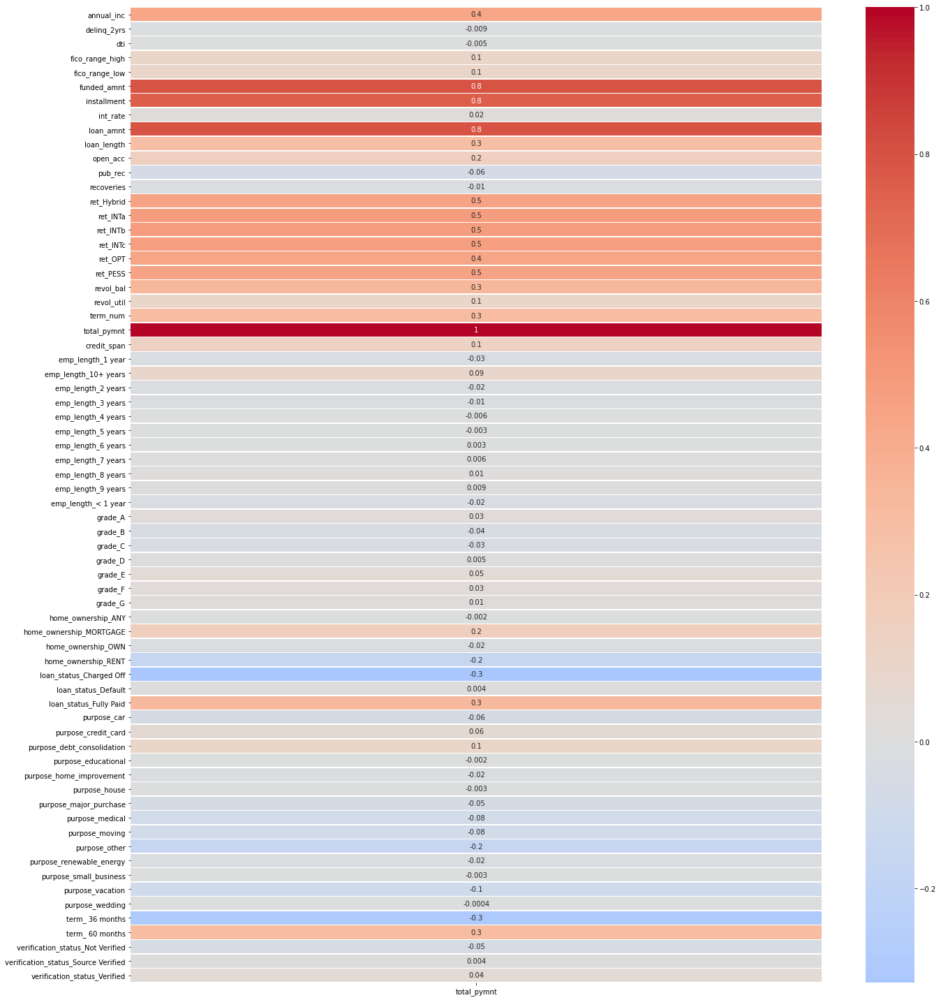

In [ ]:
correl_corr = correl_df_cat.corr()
fig, axs = plt.subplots(1, 1,figsize = (20, 20), tight_layout=True)
sns.heatmap(correl_corr[['total_pymnt']], center= 0, annot = True, fmt = '.1g', cmap= 'coolwarm', linewidths=.5, ax = axs)

## Step 6- K-means analysis

#### k-means pre-processing and steps.
1. Re-scale each dimension so that they have the same magnitude.
2. Run K-means analysis after identifying the optimal number of clusters.
3. Explain underlying properties of each cluster.

Reference - Much of the K-Means code was adapted from this blog: https://realpython.com/k-means-clustering-python/

### Data preproccessing

Before the k-means algorithm is applied, we will perform the following steps:

1. Verify that transformed continuous variable from step 1 are appropriate for K means (as normally distributed as possible, with outliers handled appropriately).
2. Transform discrete variables for modeling into numerical variables.

In [ ]:
# Datatype column definitions from Week 1
float_cols = ['loan_amnt', 'funded_amnt', 'installment', 'annual_inc',
                     'dti', 'revol_bal', 'delinq_2yrs', 'open_acc', 'pub_rec',
                                'fico_range_high', 'fico_range_low', 'total_pymnt', 'recoveries']
cat_cols = ['term', 'grade', 'emp_length', 'home_ownership',
                    'verification_status', 'loan_status', 'purpose']
perc_cols = ['int_rate', 'revol_util']
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d']

# Borrower characteristics - We want to limit KMeans to characteristics known at the time grades are determined.
borrower_chars = ['annual_inc', 'delinq_2yrs', 'dti', 'earliest_cr_line', 'emp_length',
                  'fico_range_high', 'fico_range_low', 'home_ownership', 'loan_amnt',
                  'open_acc', 'pub_rec', 'purpose', 'revol_bal', 'revol_util',
                  'verification_status', 'term', 'funded_amnt', 'issue_d']

In [ ]:
# Make a copy of our final_data DF for clustering
cluster_data = final_data.copy()

In [ ]:
final_data.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'open_acc', 'pub_rec',
       'fico_range_high', 'fico_range_low', 'revol_bal', 'revol_util',
       'total_pymnt', 'last_pymnt_d', 'recoveries', 'loan_amnt_orig',
       'funded_amnt_orig', 'term_orig', 'int_rate_orig', 'installment_orig',
       'grade_orig', 'emp_length_orig', 'home_ownership_orig',
       'annual_inc_orig', 'verification_status_orig', 'issue_d_orig',
       'loan_status_orig', 'purpose_orig', 'dti_orig', 'delinq_2yrs_orig',
       'earliest_cr_line_orig', 'open_acc_orig', 'pub_rec_orig',
       'fico_range_high_orig', 'fico_range_low_orig', 'revol_bal_orig',
       'revol_util_orig', 'total_pymnt_orig', 'last_pymnt_d_orig',
       'recoveries_orig', 'loan_length', 'term_num', 'ret_PESS', 'ret_OPT',
       'ret_INTa'

#### 1. Transform continuous variables



Note: The following columns have already been log-transformed in the pickle file: ['annual_inc','revol_bal','open_acc', 'total_pymnt']

We will log transform several more in prepraration for clustering.

In [ ]:
## Only use variables that are known at loan grade decision time.
print(set(float_cols + perc_cols) & set(borrower_chars))

{'pub_rec', 'dti', 'loan_amnt', 'annual_inc', 'revol_util', 'funded_amnt', 'revol_bal', 'open_acc', 'fico_range_high', 'delinq_2yrs', 'fico_range_low'}


In [ ]:
# Log transform the following columns in preparation for k means
cols_to_log = ['loan_amnt','funded_amnt','pub_rec','delinq_2yrs','fico_range_high','fico_range_low']
for c in cols_to_log:
  cluster_data[c] = np.log10(cluster_data[c] + 1)

#### 2. Discrete variables

We will explore discrete variables that may be used for clustering.

In [ ]:
## Only use variables that are known at loan grade decision time.
print(set(cat_cols) & set(borrower_chars))

{'purpose', 'emp_length', 'term', 'verification_status', 'home_ownership'}


In [ ]:
## Emp Length
## Drop records with no employment length
## Convert to numeric value

n_rows = len(cluster_data)
cluster_data.dropna(subset = ['emp_length'] ,inplace=True)
print("Removed " + str(n_rows - len(cluster_data)) + " rows")

def emp_length_transformer(x):
  if (x == "< 1 year"): ## Encoding <1 year as 0
    return 0
  matches = re.findall(r'\d+', x)
  return int(matches[0])

emp_length_transformer_v = np.vectorize(emp_length_transformer)

cluster_data['emp_length'] = emp_length_transformer_v(cluster_data['emp_length'])

Removed 49637 rows


In [ ]:
## Final step before clustering - visualize how many data points are in each cluster
grp = cluster_data.groupby('grade').count().reset_index()
fig = px.bar(grp, x="grade", y="id", barmode="group")
fig.show()

In [ ]:
## Note - combine E, F, and G grades into one group, as they are very small
# This helped with simplifying cluster results when choosing features/scaling
cluster_data['grade_consolidated'] = cluster_data.apply(lambda row: "EFG" if row['grade'] in ['E','F','G'] else row['grade'],axis=1)

#### Choose columns and standardize data

We started by exploring the following columns for this cluster analysis: fico high, fico low, int_rate, annual_inc, loan_amount, emp_length.

Because fico_high and fico_low are highly correlated, we only included one in the final cluster analysis so as not to inflate the importance of the fico score. The intertia values when choosing fico high or fico low were virtually identical. We chose to include fico high because it is easier to visualize separation in this variable later.

In [ ]:
## Explore two scaling options - standard scaling and minmax scaling.
standard_scaler = StandardScaler()
min_max_scaler = MinMaxScaler()

In [ ]:
cluster_cols = [
                # "fico_range_high", 
                "fico_range_low", 
                "int_rate", "annual_inc", "loan_amnt","emp_length"]

In [ ]:
## Apply standard scaling to cluster variables
x = cluster_data[cluster_cols].values
x_scaled = standard_scaler.fit_transform(x)

### Evaluate K-Means on small number of clusters

Run the KMeans algorithm on the scaled data. We explored clusters of sizes 3-6, and ultimately saw 4 clusters give the nicest separation by Grade.

In [ ]:
## Run k means
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

n_clusters = 4
cluster_order = list(range(n_clusters)) # Used for visualization later

kmeans = KMeans(n_clusters=n_clusters, **kmeans_kwargs)
kmeans.fit(x_scaled)

KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=4,
       n_init=10, n_jobs=None, precompute_distances='auto', random_state=42,
       tol=0.0001, verbose=0)

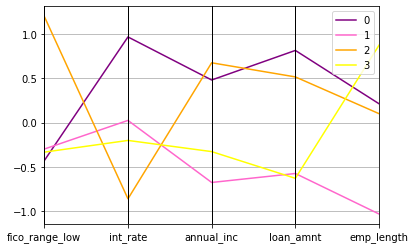

In [ ]:
## Parallel coordinate plot
## Use this plot to determine if there is good separation between clusters
## Here we can see that clusters 0 and 2 are fairly well separated.
## Clusters 1 and 3 share many of the same characteristics, except for employment length.

centers = kmeans.cluster_centers_
centers_df = pd.DataFrame((centers), columns = cluster_cols)
centers_df['label'] = range(n_clusters)

pd.plotting.parallel_coordinates(
    centers_df, 'label',
    color=['purple','#ff66cc','orange','#FFFF00']
)

In [ ]:
## Crosstab of kmeans_label vs loan grade by record count
# This shows how many records by grade are assigned to each Kmeans cluster
cluster_data['kmeans_label'] = kmeans.labels_
pd.crosstab(cluster_data['kmeans_label'],cluster_data['grade'])

grade,A,B,C,D,E,F,G
kmeans_label,,,,,,,
0,183,16129,60809,54187,37678,14230,3699
1,21227,71967,76427,31398,10928,2033,354
2,87546,61936,20467,1830,297,23,5
3,24619,76959,63877,18232,3800,339,29


In [ ]:
## Crosstab of kmeans labels vs actual grade, showing % of each grade in each cluster
# This view makes it easy to see if a grade is predominantly assigned to a particular cluster
pd.crosstab(cluster_data['kmeans_label'],cluster_data['grade']).apply(lambda r: r/r.sum(), axis=0)

grade,A,B,C,D,E,F,G
kmeans_label,,,,,,,
0,0.001370,0.071056,0.274434,0.512906,0.714912,0.855940,0.905065
1,0.158914,0.317048,0.344918,0.297197,0.207351,0.122286,0.086616
2,0.655407,0.272857,0.092368,0.017322,0.005635,0.001383,0.001223
3,0.184308,0.339040,0.288280,0.172575,0.072102,0.020391,0.007096


Cluster 0 contains the majority of the D-G grade loans
Cluster 2 contains the majority of the A grade loans
Cluster 1 contains the majority of the C grade loans, as well as a high share of B and D grade loans
Cluster 3 contains the majority of the B grade loans, as well as a high share of the C grade loans

Note - all else equal, employment length can serve as a boost in Grade.

In [ ]:
## Finally, visualize the above percentage crosstab as a bar chart

### Note - the numbers of the clusters below may change with each re-run!!! 


cluster_percent = pd.crosstab(cluster_data['kmeans_label'],cluster_data['grade']).apply(lambda r: r/r.sum(), axis=0)
cluster_percent = cluster_percent.stack().reset_index()
cluster_percent.columns = ['kmeans_label','grade','percent']
cluster_percent.head()
fig = px.bar(cluster_percent, x="grade", y="percent", barmode="group",
             facet_col="kmeans_label", color="kmeans_label",
             category_orders={"kmeans_label": cluster_order})
fig.show()

Visualize how cluster variables (untransformed) differ between clusters
Use this information to make inferences about which variables drive Grade decisions

In [ ]:
for c in cluster_cols:
  if c in continuous_features:
    c = c+"_orig"
    fig = px.box(cluster_data, y=c, facet_col="kmeans_label",color="kmeans_label",category_orders={"kmeans_label": cluster_order})
    fig.show()

    fig = px.histogram(cluster_data, x=c, facet_col="kmeans_label", color="kmeans_label",category_orders={"kmeans_label": cluster_order})
    fig.show()
  if c == "emp_length":
    emp_length_order = ["< 1 year", "1 year", "2 years", "3 years", "4 years", "5 years", "6 years", "7 years", "8 years", "9 years", "10+ years"]
    c = c+"_orig"
    grouped_data = cluster_data.groupby(['kmeans_label','emp_length']).count().reset_index()
    fig = px.bar(grouped_data, x="emp_length", y="id", barmode="group",
             facet_col="kmeans_label", color="kmeans_label",
             category_orders={"kmeans_label": cluster_order,"emp_length":emp_length_order})
    fig.show()

Output hidden; open in https://colab.research.google.com to view.

### Evaluate K-Means on a range of cluster sizes

In this section, we plot the inertia over of a range of clusters in a scree plot. The "elbow" of the scree plot is the point where the reduction in inter-cluster distances trails off. We will re-run clustering at this point to look at the separation by grade again.

*Note: This takes a long time to run!*

In [ ]:
## Note - This cell takes a long time to run!!!
min_clusters = 1
max_clusters = 14

# A list holds the SSE values for each k
sse = []
for k in range(min_clusters, max_clusters + 1):
    print("Cluster "+str(k))
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(x_scaled)
    sse.append(kmeans.inertia_)

Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
Cluster 6
Cluster 7
Cluster 8
Cluster 9
Cluster 10
Cluster 11
Cluster 12
Cluster 13
Cluster 14


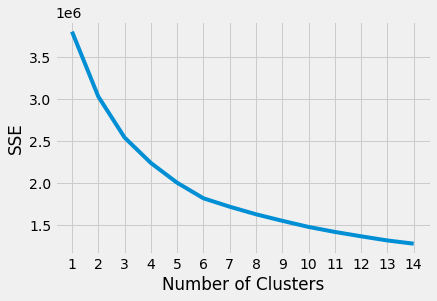

In [ ]:
## Scree plot showing inertia by number of clusters
plt.style.use("fivethirtyeight")
plt.plot(range(min_clusters, max_clusters + 1), sse)
plt.xticks(range(min_clusters, max_clusters+ 1))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
## The KneeLocator class locates the elbow of the scree plot for us
kl = KneeLocator(
    range(min_clusters, max_clusters + 1), sse, curve="convex", direction="decreasing"
)

final_num_clusters = kl.elbow
print("Elbow:", final_num_clusters)

Elbow: 5


In [ ]:
# Re-run K Means with number of clusters equal to the elbow point
kmeans = KMeans(n_clusters=final_num_clusters, **kmeans_kwargs)
kmeans.fit(x_scaled)

KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=5,
       n_init=10, n_jobs=None, precompute_distances='auto', random_state=42,
       tol=0.0001, verbose=0)

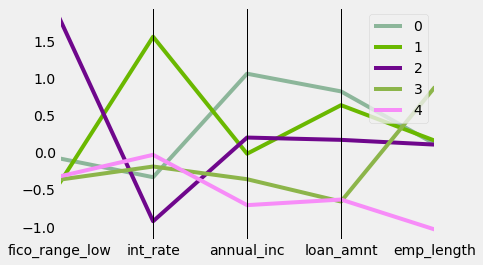

In [ ]:
## Show parallel lines plot
# Note that clusters have very good separation here
centers = kmeans.cluster_centers_
centers_df = pd.DataFrame((centers), columns = cluster_cols)
centers_df['label'] = range(final_num_clusters)
pd.plotting.parallel_coordinates(
    centers_df, 'label'
)

In [ ]:
## Show grade crosstab by record count
cluster_data['kmeans_label'] = kmeans.labels_
pd.crosstab(cluster_data['grade'],cluster_data['kmeans_label'])

kmeans_label,0,1,2,3,4
grade,,,,,
A,32839,0,61037,20622,19077
B,64298,0,30469,66802,65422
C,61894,8482,10968,65596,74640
D,9040,51641,1759,15995,27212
E,1032,43014,307,1890,6460
F,27,15934,20,81,563
G,3,4015,2,2,65


In [ ]:
## Show grade crosstab by percent
pd.crosstab(cluster_data['kmeans_label'],cluster_data['grade']).apply(lambda r: r/r.sum(), axis=0)

grade,A,B,C,D,E,F,G
kmeans_label,,,,,,,
0,0.245847,0.283262,0.279330,0.085568,0.019581,0.001624,0.000734
1,0.000000,0.000000,0.038280,0.488807,0.816158,0.958436,0.982383
2,0.456949,0.134230,0.049499,0.016650,0.005825,0.001203,0.000489
3,0.154385,0.294294,0.296038,0.151400,0.035861,0.004872,0.000489
4,0.142819,0.288214,0.336854,0.257575,0.122574,0.033865,0.015904


Clustering final thoughts: Even though our clusters look more separated on the parallel coordinate plot at the elbow point vs the parallel lines plot with four clusters, we don't see a lift in terms of grade separation at the elbow point. That is, the extra clusters in the above iteration do not help us to further separate by grade.

This is a nice reminder that K-means does not cluster with a particular target variable in mind. It takes work and many iterations of feature variables to produce a clustering that aligns with a desired target variable.

## Step 7 - PCA
Run a principal component analysis

#### Steps:
1. Run the PCA for the same numerical variables that you analyzed under K-Means above. Remember you have already standardized them.
2. Examine the component loadings for the diferent variables in first few principal components. Similarly, exaine the top features for each PC in terms of loadings.
3. Add a biplot of how key variables are represented in the first two PCs e.g.

In [ ]:
# Make a copy of our final_data DF for clustering
## Note - this assignment will overwrite K-Means clustering results
cluster_data = final_data.copy()

In [ ]:
# Log Transformation for 'annual_inc','revol_bal','open_acc', 'total_pymnt'
Log_Columns = ['loan_amnt','funded_amnt','pub_rec','delinq_2yrs','fico_range_high']

for i in Log_Columns:
    
    cluster_data[i] = np.log10(cluster_data[i]+1)

In [ ]:
## Emp Length
## Drop records with no employment length
## Convert to numeric value

n_rows = len(cluster_data)
cluster_data.dropna(subset = ['emp_length'] ,inplace=True)
print("Removed " + str(n_rows - len(cluster_data)) + " rows")

def emp_length_transformer(x):
    if (x == None) or (x == "< 1 year"):
        return 0
    matches = re.findall(r'\d+', x)
    return int(matches[0])

emp_length_transformer_v = np.vectorize(emp_length_transformer)

cluster_data['emp_length'] = emp_length_transformer_v(cluster_data['emp_length'])

Removed 49637 rows


Use the same set of columns used for K-means for PCA too. Once again we are dropping fico low because of its strong correlation with fico high.

In [ ]:
# Select columns for PCA (they were the same columns that were used in K menas)

pca_cols = ["fico_range_high", "int_rate", "annual_inc", "loan_amnt","emp_length"]

In [ ]:
# Separating out the features
x = cluster_data.loc[:, pca_cols].values

In [ ]:
# Standardizing the features
x = StandardScaler().fit_transform(x)

In [ ]:
pcamodel = PCA()
pca = pcamodel.fit_transform(x)
pca.shape

(761208, 5)

#### A bar polt that shows the percentage of variance explained by each of the selected components. 

As can be seen below, the top two PCA components explain nearly 60% of the variance in data. Next we will explain each of the top two PCA in more detail.

No handles with labels found to put in legend.


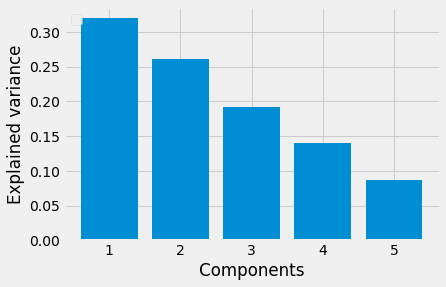

In [ ]:
plt.bar(range(1,len(pcamodel.explained_variance_ratio_ )+1),pcamodel.explained_variance_ratio_ )
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.legend(loc='upper left')

#### Line graph to show cumulative explained variance for each principle components

Text(0, 0.5, 'cumulative explained variance')

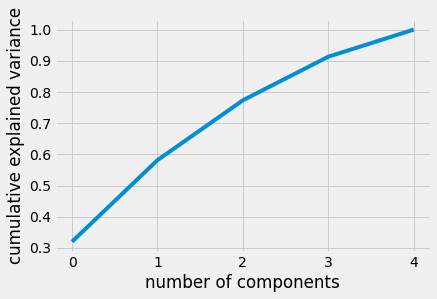

In [ ]:
plt.plot(np.cumsum(pcamodel.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

#### Loading matrix to show weights of each component

As can be seen below in the loadings and the heatmap, the first PCA component can be explained as 'safe' borrowers with high fico score and annual income. The second PCA component mostly explains  riskier borrower profile with less fico score and very less annual income

In [ ]:
loadings = pd.DataFrame(pcamodel.components_.T, columns=["PCA"+str(x) for x in range(1,6)], index=pca_cols)
loadings

,PCA1,PCA2,PCA3,PCA4,PCA5
fico_range_high,0.414141,0.524902,0.086141,0.676775,0.295838
int_rate,-0.317341,-0.660531,0.039010,0.500976,0.458797
annual_inc,0.622827,-0.241896,0.115091,-0.459105,0.574065
loan_amnt,0.529619,-0.460115,0.259650,0.265566,-0.608157
emp_length,0.243665,-0.134005,-0.954146,0.098471,-0.050786


#### Visualizing the loading matrix using heatmap

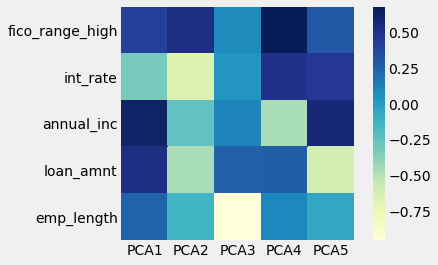

In [ ]:
import seaborn as sns 

ax = sns.heatmap(pcamodel.components_.T,
                 cmap='YlGnBu',
                 yticklabels=list(pca_cols),
                 xticklabels=["PCA"+str(x) for x in range(1,pcamodel.n_components_+1)],
                 cbar_kws={"orientation": "vertical"})
ax.set_aspect("equal")

#### Scatterplot for PC1 and PC2

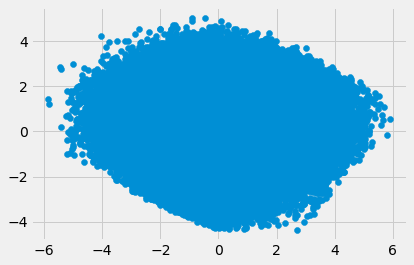

In [ ]:
plt.scatter(pca[:, 0], pca[:, 1])

#### Biplot for PC1 and PC2

The biplot of PC1 and PC2 clearly shows the opposite relationship between fico score and the interest rate. This makes sense, as higher fico score generally signifies safer borrower and hence lower interest rate.

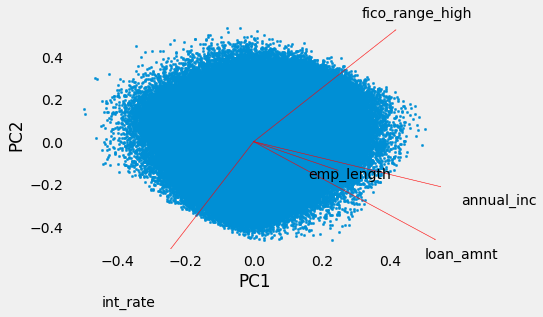

In [ ]:
def biplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'black', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

biplot(pca[:,0:2],np.transpose(pcamodel.components_[0:2, :]),list(pca_cols))
plt.show()

### Step 8 - Save data including returns information in a pickle for further analysis

In [ ]:
## Remove the total_pymnt from the list of continuous features;
## this variable is highly predictive of the outcome
## but is not known at the time the loan is issued
continuous_features = [i for i in continuous_features if i not in ["total_pymnt", "recoveries"]]

In [ ]:
# Define the output path for the full pickle with returns info
#full_pickle_file = "/".join( ['.'] + ["PickleData"] + ["201213ret_data.pickle"] )
full_pickle_file = pickle_data = path_to_data+"201213_ret.pickle" #change the name of the pickle file here 

pickle.dump( [final_data, discrete_features, continuous_features, ret_cols], open(full_pickle_file, "wb") )

Repeat Phase 2 - steps 1-9 on 2015-2016 pickle data. Since steps 1-9 take a long time to run, we are not repeating them in here. We ran the steps offline and will be loading them directly in the subsequent phases. The return added 2015-2016 pickle file is called "201516_ret.pickle"

# Phase 3 - Predicting Default Probability and picking best classifier 


This phase carries out the following steps
  1.  Reads the original data including all the fields added by Lending Club to predict default probability
  2. Redo the prediction using only the fields available in our saved pickle file
  3. Start with predicting default using only signals such as the grade or interest assigned to a loan by Lending Club
  4. Redo the analysis only with variables available at the time of loan application 
  5. Evaluate various classifiers using a batch, rank-ordered or customized assessment methods. Pick the best one for downstream analyses. 
  5. Compare the default probabilities predicted from Step 4 above with the grades assigned by Lending Club  

As a first step we are calculating the misclassification Cost, which will be used for custom assessment later. Cost matrix calculates the cost of correctly and incorrectly predicting loan defaults

In [ ]:
## Change these variables when running the notebook from a new location
# data_dir should be the directory of the zip files
# pickle_input should be the location of the 201516_ret.pickle file

root_dir = "/content/drive/My Drive/BVIA Group 4/"
data_dir = root_dir + "Data/"
pickle_input = root_dir + "Pickle/201516_ret.pickle"

In [ ]:
### Read the data and features from the pickle
final_data, discrete_features, continuous_features, ret_cols = pickle.load( open(pickle_input, "rb" ) )
#final_data[ret_cols].head()


### Average Cost of False Positive (Predict Not Default, but Default in reality)
### Cost of Losing Money = average returns from default loans
avg_ret_default = final_data[final_data['loan_status'] != 'Fully Paid']['ret_Hybrid'].mean()
print(avg_ret_default)
### Average Cost of False Negative (Predict Default, but not Default in reality) 
### Opportunity Cost = Difference between returns from investing in loans and safe assets
avg_ret_nondefault = final_data[final_data['loan_status'] == 'Fully Paid']['ret_Hybrid'].mean()
print(avg_ret_nondefault)
### Return a cost matrix
FN_Cost = round(avg_ret_default,3)
TP_Gain = 0.03 #return from safe investment
TN_Gain = round(avg_ret_nondefault,3)
FP_Cost = round(0,3)
confusion_cost = np.array([[TP_Gain,FN_Cost],[FP_Cost,TN_Gain]])
print(confusion_cost)

-0.050146655802039516
0.09181748028058873
[[ 0.03  -0.05 ]
 [ 0.     0.092]]


## Step 1 - Load the 2015-16 raw data again and predict default from all available fields

### Read the 2015-2016 data again

In [ ]:
# load the data from the file - we are loading 2015 and 2016 data
directory = data_dir
all_files = os.listdir(directory)
output = {}
for i in all_files:
    print("    Reading file " + i)
    output[i] = pd.read_csv(directory + i, dtype = str, skiprows = 1)

    Reading file LoanStats_securev1_2016Q1.csv.zip
    Reading file LoanStats_securev1_2016Q2.csv.zip
    Reading file LoanStats3d_securev1.csv.zip
    Reading file LoanStats_securev1_2016Q3.csv.zip
    Reading file LoanStats_securev1_2016Q4.csv.zip


In [ ]:
data = pd.concat([output[i] for i in output.keys()], join='inner')

data = data[['id','loan_amnt','funded_amnt','funded_amnt_inv','term','int_rate',
         'installment','grade','sub_grade','emp_title','emp_length',
         'home_ownership','annual_inc','verification_status','issue_d',
         'loan_status','purpose','title','zip_code','addr_state','dti','total_pymnt',
         'delinq_2yrs','earliest_cr_line','open_acc','pub_rec','last_pymnt_d',
         'last_pymnt_amnt','fico_range_high','fico_range_low','last_fico_range_high',
         'last_fico_range_low','application_type','revol_bal','revol_util','recoveries']]

data.dropna(subset=['annual_inc','loan_status','issue_d','last_pymnt_d','loan_amnt',
                    'int_rate','earliest_cr_line','open_acc','pub_rec','delinq_2yrs','recoveries',
                    'grade','fico_range_high','fico_range_low','installment', 'last_fico_range_high',
                    'last_fico_range_low','funded_amnt','dti','funded_amnt_inv','revol_bal','revol_util']
            ,inplace=True)
data.shape 

(854201, 36)

In [ ]:
data.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,total_pymnt,delinq_2yrs,earliest_cr_line,open_acc,pub_rec,last_pymnt_d,last_pymnt_amnt,fico_range_high,fico_range_low,last_fico_range_high,last_fico_range_low,application_type,revol_bal,revol_util,recoveries
0,73438990,12500,12500,12500,60 months,7.39%,249.83,A,A4,Stylist,10+ years,RENT,85000,Not Verified,Mar-2016,Charged Off,credit_card,Credit card refinancing,782xx,TX,19.6,8234.13,1,Oct-2001,19,0,Jan-2019,249.83,699,695,779,775,Individual,5346,10.5%,0.0
1,74694337,40000,40000,40000,60 months,7.89%,808.96,A,A5,CM2,< 1 year,MORTGAGE,80500,Verified,Mar-2016,Fully Paid,home_improvement,Home improvement,301xx,GA,3.74,48284.8011378833,0,Nov-1992,7,0,Jul-2020,7871.87,714,710,634,630,Individual,414,2.5%,0.0
2,74826201,7200,7200,7200,36 months,5.32%,216.83,A,A1,Mechanic,10+ years,MORTGAGE,49000,Source Verified,Mar-2016,Fully Paid,debt_consolidation,Debt consolidation,554xx,MN,19.05,7223.41,0,Dec-2001,11,0,Apr-2016,7227.67,754,750,754,750,Individual,9309,18.4%,0.0
3,74884818,32000,32000,32000,36 months,6.97%,987.63,A,A3,owner,10+ years,OWN,156000,Verified,Mar-2016,Fully Paid,home_improvement,Home improvement,164xx,PA,5.25,35337.4210393186,0,Jul-1983,5,0,Jul-2018,9677.63,699,695,819,815,Individual,3611,23.6%,0.0
4,75174813,16000,16000,16000,36 months,12.99%,539.03,C,C2,Director of Marketing,< 1 year,RENT,50000,Not Verified,Mar-2016,Charged Off,debt_consolidation,Debt consolidation,261xx,WV,38.32,5916.18,0,Aug-2000,12,0,Dec-2016,539.03,679,675,499,0,Individual,7996,51.6%,1627.03


Keep only loan statuses 'Fully Paid','Charged Off','Default'. Find out the default proportion in the dataset

In [ ]:
data = data[data.loan_status.isin(['Fully Paid','Charged Off','Default'])] #select only those statuses which are in scope
data.reset_index(drop=True, inplace=True)

TCount = len(data)
print("Total count: %d" %(TCount))

FCount_Orig = data.loan_status.str.contains('Fully Paid').sum()
print("Fully Paid count: %d" %(FCount_Orig))

CCount = data.loan_status.str.contains('Charged Off').sum()
print("Charged off count: %d" %(CCount))

DCount = data.loan_status.str.contains('Default').sum()
print("Default count: %d" %(DCount))

DProp = 1-(FCount_Orig/TCount)
print("Proportion of Charged off + Default: %.2f" %(DProp))

#print("\nNull stats:")
#print(data.isna().sum())

Total count: 815879
Fully Paid count: 657121
Charged off count: 158719
Default count: 39
Proportion of Charged off + Default: 0.19


Downsample fully paid loans to train the classifiers adequately in identifying defaults.

In [ ]:
## Downsample the fully paid loans
indexNames = data[data['loan_status'] == "Fully Paid" ].index #pull indexes of fully paid rows
delRowCount = int(0.5*FCount_Orig) 
random.seed(4)
data=data.drop(random.sample(set(indexNames), delRowCount)) #remove ~50% of the 'fully paid' entries

TCount = len(data)
print("Total count: %d" %(TCount))

FCount = data.loan_status.str.contains('Fully Paid').sum()
print("Fully Paid count: %d" %(FCount))

CCount = data.loan_status.str.contains('Charged Off').sum()
print("Charged off count: %d" %(CCount))

DCount = data.loan_status.str.contains('Default').sum()
print("Default count: %d" %(DCount))

DProp = 1-(FCount/TCount)
print("Proportion of Charged off + Default: %.2f" %(DProp))

Total count: 487319
Fully Paid count: 328561
Charged off count: 158719
Default count: 39
Proportion of Charged off + Default: 0.33


In [ ]:
# Identify the type of each of these column
float_cols = ['loan_amnt', 'funded_amnt', 'installment', 'annual_inc',
            'dti', 'revol_bal', 'delinq_2yrs', 'open_acc', 'pub_rec',
                'fico_range_high', 'fico_range_low','last_fico_range_low',
              'last_fico_range_high','total_pymnt', 'recoveries']
cat_cols = ['term', 'grade', 'emp_length', 'home_ownership',
                    'verification_status', 'loan_status', 'purpose']
perc_cols = ['int_rate', 'revol_util']
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d']

for j in float_cols:
    data[j] = pd.to_numeric(data[j])
    
for j in perc_cols:
    data[j] = data[j].str.strip('%')
    data[j] = pd.to_numeric(data[j])
    data[j] = data[j]/100

for j in date_cols:
    data[j] = pd.to_datetime(data[j])

### Engineer the features and generate the training/testing set

In [ ]:
default_seed = 1
np.random.seed(default_seed)

# select only terminated loans
data = data[data.loan_status.isin(['Fully Paid','Charged Off','Default'])]

# downsample
data = data.sample(n=5000)

# create labels for the dataset
data['label'] = (data.loan_status.str.contains('Charged Off') | 
                data.loan_status.str.contains('Default'))
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
data.label = data.label.astype(int)



# clean and get training/testing data 
temp = pd.get_dummies(data[['term','grade','emp_length','home_ownership',
                                  'verification_status','purpose']],dummy_na=True)
subdata = data[['loan_amnt','funded_amnt','int_rate','installment',                            
                'annual_inc','dti','delinq_2yrs','open_acc','pub_rec',
                            'fico_range_high','fico_range_low','cr_hist','revol_bal',
                            'recoveries','last_fico_range_high','last_fico_range_low',
                            'revol_util', 'total_pymnt']]
X = subdata.to_numpy()
#X = data.as_matrix(columns=['loan_amnt','funded_amnt','int_rate','installment',
#                            'annual_inc','dti','delinq_2yrs','open_acc','pub_rec',
#                            'fico_range_high','fico_range_low','cr_hist','revol_bal',
#                            'recoveries','last_fico_range_high','last_fico_range_low',
#                            'revol_util', 'total_pymnt'])

#X = np.concatenate((X,temp.as_matrix()),axis=1)
X = np.concatenate((X,temp.to_numpy()),axis=1)

#y = data.label.as_matrix()
y = data.label.to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

min_max_scaler = preprocessing.MinMaxScaler()
X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)

print(X_train.shape)
print(X_test.shape)

(3500, 63)
(1500, 63)


In [ ]:
TCount = len(data)
print("Total count: %d" %(TCount))

FCount = data.loan_status.str.contains('Fully Paid').sum()
print("Fully Paid count: %d" %(FCount))

CCount = data.loan_status.str.contains('Charged Off').sum()
print("Charged off count: %d" %(CCount))

DCount = data.loan_status.str.contains('Default').sum()
print("Default count: %d" %(DCount))

print("Proportion of Charged off + Default: %.2f" %(1-(FCount/TCount)))

Total count: 5000
Fully Paid count: 3371
Charged off count: 1629
Default count: 0
Proportion of Charged off + Default: 0.33


## Classification models

### $l_2$ penalized logistic regression

In [ ]:
logisticModel = LogisticRegressionCV(cv=10,penalty='l2',max_iter=2000)
logisticModel.fit(X_train,y_train)

LogisticRegressionCV(Cs=10, class_weight=None, cv=10, dual=False,
                     fit_intercept=True, intercept_scaling=1.0, l1_ratios=None,
                     max_iter=2000, multi_class='auto', n_jobs=None,
                     penalty='l2', random_state=None, refit=True, scoring=None,
                     solver='lbfgs', tol=0.0001, verbose=0)

In [ ]:
y_pred = logisticModel.predict(X_test)
print('accuracy: ',accuracy_score(y_test,y_pred))
target_names = ['Non-Defaulted Loan','Defaulted Loan']
print(classification_report(y_test,y_pred,target_names=target_names,digits=4))
print('AUC: ',roc_auc_score(y_test,logisticModel.predict_proba(X_test)[:,1]))

accuracy:  0.976
                    precision    recall  f1-score   support

Non-Defaulted Loan     0.9805    0.9843    0.9824      1022
    Defaulted Loan     0.9662    0.9582    0.9622       478

          accuracy                         0.9760      1500
         macro avg     0.9734    0.9713    0.9723      1500
      weighted avg     0.9760    0.9760    0.9760      1500

AUC:  0.9956132450114223


In [ ]:
confusion_matrix(y_test, y_pred)

array([[1006,   16],
       [  20,  458]])

As you can see below the AUC curve is absolutely perfect. It is because of the presence of leakage variables such as total payment and the last fico scores. These variables will not be available at the time of loan investment. 


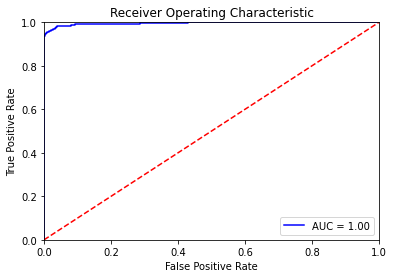

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, logisticModel.predict_proba(X_test)[:,1],
                                         pos_label=1)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b',
label='AUC = %0.2f'% roc_auc_score(y_test,logisticModel.predict_proba(X_test)[:,1]))
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Below, we examine the Odds Ratio Change for each of the Logistic Regression coefficients. Below 100% means that the variable negatively affects the Odds Ratio (lowers the probability of default). Over 100% means the opposite - higher probability of default. Clearly higher total payment lowers the probabibility default, as does last fico scores - both leakage variables.

In [ ]:
np.exp(logisticModel.coef_)
logisticCols = list(subdata.columns) + list(temp.columns)
logisticStd = np.std(X_train, axis=0)
logisticResultDf = pd.DataFrame()
logisticResultDf['Column'] = logisticCols
logisticResultDf['Coef'] = (logisticModel.coef_).reshape(-1,1)
logisticResultDf['StdDev'] = logisticStd

In [ ]:
logisticResultDf['OddsChange'] = logisticResultDf.apply(lambda x: np.exp(x['Coef'] * x['StdDev']), axis=1)

In [ ]:
logisticResultDf.sort_values(by='OddsChange').style.format({"OddsChange":"{:.2%}"})

,Column,Coef,StdDev,OddsChange
17,total_pymnt,-111.229717,0.167921,0.00%
14,last_fico_range_high,-12.235650,0.250787,4.65%
18,term_ 36 months,-1.781365,0.451074,44.77%
2,int_rate,-3.269199,0.187372,54.20%
21,grade_A,-1.434964,0.362584,59.43%
50,purpose_car,-5.989525,0.080798,61.64%
57,purpose_moving,-6.442478,0.071529,63.08%
4,annual_inc,-8.153260,0.053531,64.63%
32,emp_length_3 years,-1.675427,0.259902,64.70%
39,emp_length_< 1 year,-1.387611,0.278243,67.97%


### Random forest
Random forest model to identify defaults. Once again the accuracy is close to 99% because of the presence of leakage

In [ ]:
random_forest = RandomForestClassifier(min_samples_leaf=100,n_estimators=50)
random_forest.fit(X_train,y_train)
y_pred = random_forest.predict(X_test)
print('accuracy: ',accuracy_score(y_test,y_pred))
target_names = ['Non-Defaulted Loan','Defaulted Loan']
print(classification_report(y_test,y_pred,target_names=target_names,digits=4))
print('AUC: ',roc_auc_score(y_test,random_forest.predict_proba(X_test)[:,1]))

accuracy:  0.9506666666666667
                    precision    recall  f1-score   support

Non-Defaulted Loan     0.9389    0.9922    0.9648      1022
    Defaulted Loan     0.9810    0.8619    0.9176       478

          accuracy                         0.9507      1500
         macro avg     0.9599    0.9270    0.9412      1500
      weighted avg     0.9523    0.9507    0.9498      1500

AUC:  0.9879594527098395


Below is the Feature Importance of the Random Forest classifier.

In [ ]:
rfResultDf = pd.DataFrame()
rfResultDf['Column'] = logisticCols
rfResultDf['FeatureImportance'] = random_forest.feature_importances_.reshape(-1,1)
rfResultDf.sort_values(by="FeatureImportance",ascending=False).head(15)

,Column,FeatureImportance
13,recoveries,0.373689
14,last_fico_range_high,0.278464
15,last_fico_range_low,0.212225
17,total_pymnt,0.038382
19,term_ 60 months,0.021377
2,int_rate,0.019870
18,term_ 36 months,0.007251
5,dti,0.006446
9,fico_range_high,0.005635
1,funded_amnt,0.005394


## Step 2 - Redo predictions with the columns stored in our pickle file

In [ ]:
# Define a function that, given a CVGridSearch object, finds the
# percentage difference between the best and worst scores
def find_score_variation(cv_model):
    all_scores = cv_model.cv_results_['mean_test_score']
    return( np.abs((max(all_scores) - min(all_scores))) * 100 / max(all_scores) )

    '''
    which_min_score = np.argmin(all_scores)

    all_perc_diff = []

    try:
        all_perc_diff.append( np.abs(all_scores[which_min_score - 1] - all_scores[which_min_score])*100 / min(all_scores) )
    except:
        pass

    try:
        all_perc_diff.append( np.abs(all_scores[which_min_score + 1] - all_scores[which_min_score])*100 / min(all_scores) )
    except:
        pass

    return ( np.mean(all_perc_diff) )
    '''

# Define a function that checks, given a CVGridSearch object,
# whether the optimal parameters lie on the edge of the search
# grid
def find_opt_params_on_edge(cv_model):
    out = False

    for i in cv_model.param_grid:
        if cv_model.best_params_[i] in [ cv_model.param_grid[i][0], cv_model.param_grid[i][-1] ]:
            out = True
            break

    return out

### Define a default random seed and an output file

In [ ]:
default_seed = 1
output_file = "output_sample_ravi"

In [ ]:
# Create a function to print a line to our output file

def dump_to_output(key, value):
    with open(output_file, "a") as f:
        f.write(",".join([str(default_seed), key, str(value)]) + "\n")

### Load the data and engineer the features

In [ ]:
# Read the data and features from the pickle
data, discrete_features, continuous_features, ret_cols = pickle.load( open( pickle_input, "rb" ) )

Let's look at the spread of loan statuses

In [ ]:
data = data[data.loan_status.isin(['Fully Paid','Charged Off','Default'])] #select only those statuses which are in scope
data.reset_index(drop=True, inplace=True)

TCount = len(data)
print("Total count: %d" %(TCount))

FCount_Orig = data.loan_status.str.contains('Fully Paid').sum()
print("Fully Paid count: %d" %(FCount_Orig))

CCount = data.loan_status.str.contains('Charged Off').sum()
print("Charged off count: %d" %(CCount))

DCount = data.loan_status.str.contains('Default').sum()
print("Default count: %d" %(DCount))

DProp = 1-(FCount_Orig/TCount)
print("Proportion of Charged off + Default: %.2f" %(DProp))

# print("\nNull stats:")
# print(data.isna().sum())

Total count: 810845
Fully Paid count: 652384
Charged off count: 158423
Default count: 38
Proportion of Charged off + Default: 0.20


Downsample the fully paid loans so that target classes align

In [ ]:
indexNames = data[data['loan_status'] == "Fully Paid" ].index #pull indexes of fully paid rows
delRowCount = int(0.7*FCount_Orig) 
random.seed(4)
data=data.drop(random.sample(set(indexNames), delRowCount)) #remove ~70% of the 'fully paid' entries

TCount = len(data)
print("Total count: %d" %(TCount))

FCount = data.loan_status.str.contains('Fully Paid').sum()
print("Fully Paid count: %d" %(FCount))

CCount = data.loan_status.str.contains('Charged Off').sum()
print("Charged off count: %d" %(CCount))

DCount = data.loan_status.str.contains('Default').sum()
print("Default count: %d" %(DCount))

DProp = 1-(FCount/TCount)
print("Proportion of Charged off + Default: %.2f" %(DProp))

Total count: 354177
Fully Paid count: 195716
Charged off count: 158423
Default count: 38
Proportion of Charged off + Default: 0.45


In [ ]:
data.shape

(354177, 59)

In [ ]:
# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

In [ ]:
# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')

In [ ]:
# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

In [ ]:
# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

In [ ]:
X.shape

(354177, 54)

### Prepare functions to fit and evaluate models

Note we made some significant additions to the fit_classification function below.

In [ ]:
def prepare_data(data_subset = np.array([True]*len(data)),
                    n_samples_train = 25000,
                    n_samples_test = 10000,
                    feature_subset = None,
                    date_range_train = (data.issue_d.min(), data.issue_d.max()),
                    date_range_test = (data.issue_d.min(), data.issue_d.max()),
                    random_state = default_seed):
    '''
    This function will prepare the data for classification or regression.
    It expects the following parameters:
      - data_subset: a numpy array with as many entries as rows in the
                     dataset. Each entry should be True if that row
                     should be used, or False if it should be ignored
      - n_samples_train: the total number of samples to be used for training.
                         Will trigger an error if this number is larger than
                         the number of rows available after all filters have
                         been applied
      - n_samples_test: as above for testing
      - feature_subect: A list containing the names of the features to be
                        used in the model. In None, all features in X are
                        used
      - date_range_train: a tuple containing two dates. All rows with loans
                          issued outside of these two dates will be ignored in
                          training
      - date_range_test: as above for testing
      - random_state: the random seed to use when selecting a subset of rows

    Note that this function assumes the data has a "Train" column, and will
    select all training rows from the rows with "True" in that column, and all
    the testing rows from those with a "False" in that column.

    This function returns a dictionary with the following entries
      - X_train: the matrix of training data
      - y_train: the array of training labels
      - train_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the train set
      - X_test: the matrix of testing data
      - y_test: the array of testing labels
      - test_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the test set
    '''

    np.random.seed(random_state)

    # Filter down the data to the required date range, and downsample
    # as required
    filter_train = ( train & (data.issue_d >= date_range_train[0]) &
                            (data.issue_d <= date_range_train[1]) & data_subset ).values
    filter_test = ( (train == False) & (data.issue_d >= date_range_test[0])
                            & (data.issue_d <= date_range_test[1]) & data_subset ).values

    filter_train[ np.random.choice( np.where(filter_train)[0], size = filter_train.sum()
                                   - n_samples_train, replace = False ) ] = False
    filter_test[ np.random.choice( np.where(filter_test)[0], size = filter_test.sum()
                                   - n_samples_test, replace = False ) ] = False

    # Prepare the training and test set
    X_train = X[ filter_train , :]
    X_test = X[ filter_test, :]
    if feature_subset != None:
        cols = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in feature_subset]
        # print(cols)
        X_train = X_train[ : , cols ]
        X_test = X_test[ : , cols ]

    y_train = y[ filter_train ]
    y_test = y[ filter_test ]

    # Scale the variables
    scaler = preprocessing.MinMaxScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # return training and testing data
    out = {'X_train':X_train, 'y_train':y_train, 'train_set':filter_train,
           'X_test':X_test, 'y_test':y_test, 'test_set':filter_test}

    return out

In [ ]:
def fit_classification(model, data_dict,
                          cv_parameters = {},
                          model_name = None,
                          random_state = default_seed,
                          output_to_file = True,
                          print_to_screen = True,
                          output_confusion_matrix = False,
                            predProb=False,
                          show_plots=False):
    '''
    This function will fit a classification model to data and print various evaluation
    measures. It expects the following parameters
      - model: an sklearn model object
      - data_dict: the dictionary containing both training and testing data;
                   returned by the prepare_data function
      - cv_parameters: a dictionary of parameters that should be optimized
                       over using cross-validation. Specifically, each named
                       entry in the dictionary should correspond to a parameter,
                       and each element should be a list containing the values
                       to optimize over
      - model_name: the name of the model being fit, for printouts
      - random_state: the random seed to use
      - output_to_file: if the results will be saved to the output file
      - print_to_screen: if the results will be printed on screen
      * Added the below parameters *
      - output_confusion_matrix: if a confusion matrix and custom cost metric will be printed to the screen
        and returned as an output of the function
      - predProb: return predicted probabilities as an output, for convenience
      - show_plots: show scatter plot of important features against prediction (only use for Part 4)

    If the model provided does not have a predict_proba function, we will
    simply print accuracy diagnostics and return.

    If the model provided does have a predict_proba function, we first
    figure out the optimal threshold that maximizes the accuracy and
    print out accuracy diagnostics. We then print an ROC curve, sensitivity/
    specificity curve, and calibration curve.

    * Added * We also print the Gain and Lift charts and decile lift tables.

    This function returns a dictionary with the following entries
      - model: the best fitted model
      - y_pred: predictions for the test set
      - y_pred_probs: probability predictions for the test set, if the model
                      supports them
      - y_pred_score: prediction scores for the test set, if the model does not
                      output probabilities.
    '''

    np.random.seed(random_state)

    # --------------------------
    #   Step 1 - Load the data
    # --------------------------
    X_train = data_dict['X_train']
    y_train = data_dict['y_train']

    X_test = data_dict['X_test']
    y_test = data_dict['y_test']

    filter_train = data_dict['train_set']

    # --------------------------
    #   Step 2 - Fit the model
    # --------------------------

    cv_model = GridSearchCV(model, cv_parameters)

    start_time = time.time()
    cv_model.fit(X_train, y_train)
    end_time = time.time()

    best_model = cv_model.best_estimator_

    if print_to_screen:

        if model_name != None:
            print("=========================================================")
            print("  Model: " + model_name)
            print("=========================================================")

        print("Fit time: " + str(round(end_time - start_time, 2)) + " seconds")
        print("Optimal parameters:")
        print(cv_model.best_params_)
        print("")

    # -------------------------------
    #   Step 3 - Evaluate the model
    # -------------------------------

    # If possible, make probability predictions
    try:
        y_pred_probs = best_model.predict_proba(X_test)[:,1]
        y_pred_proba = best_model.predict_proba(X_test) # Need prob of both classes for gain/lift
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)

        probs_predicted = True
    except:
        probs_predicted = False

    # Make predictions; if we were able to find probabilities, use
    # the threshold that maximizes the accuracy in the training set.
    # If not, just use the learner's predict function
    if probs_predicted:
        y_train_pred_probs = best_model.predict_proba(X_train)[:,1]
        fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_probs)

        true_pos_train = tpr_train*(y_train.sum())
        true_neg_train = (1 - fpr_train) *(1-y_train).sum()

        best_threshold_index = np.argmax(true_pos_train + true_neg_train)
        best_threshold = 1 if best_threshold_index == 0 else thresholds_train[ best_threshold_index ]

        if print_to_screen:
            print("Accuracy-maximizing threshold was: " + str(best_threshold))

        y_pred = (y_pred_probs > best_threshold)
    else:
        y_pred = best_model.predict(X_test)

    if print_to_screen:
        print("Accuracy: ", accuracy_score(y_test, y_pred))
        print(classification_report(y_test, y_pred, target_names =['No default', 'Default'], digits = 4))

    if output_confusion_matrix:
        tp, fn, fp, tn = confusion_matrix(y_test,y_pred, labels=[True,False]).reshape(-1)
        matrix = np.array([[tp,fn],[fp,tn]])
        print('Confusion matrix : \n',matrix)

        TP_Gain = 0.03 #return from safe investment
        FN_Cost = -0.05
        FP_Cost = 0 
        TN_Gain = 0.092
        confusion_cost = np.array([[TP_Gain,FN_Cost],[FP_Cost,TN_Gain]])
        expectedValue = np.sum(matrix * confusion_cost)
        print("Expected Value: %.2f" %(expectedValue))


    if print_to_screen:
        if probs_predicted:
            plt.figure(figsize = (13, 4.5))
            plt.subplot(2, 2, 1)

            plt.title("ROC Curve (AUC = %0.2f)"% roc_auc_score(y_test, y_pred_probs))
            plt.plot(fpr, tpr, 'b')
            plt.plot([0,1],[0,1],'r--')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.ylabel('True Positive Rate')
            plt.xlabel('False Positive Rate')

            plt.subplot(2, 2, 3)

            plt.plot(thresholds, tpr, 'b', label = 'Sensitivity')
            plt.plot(thresholds, 1 -fpr, 'r', label = 'Specificity')
            plt.legend(loc = 'lower right')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.xlabel('Threshold')

            plt.subplot(2, 2, 2)

            fp_0, mpv_0 = calibration_curve(y_test, y_pred_probs, n_bins = 10)
            plt.plot([0,1], [0,1], 'k:', label='Perfectly calibrated')
            plt.plot(mpv_0, fp_0, 's-')
            plt.ylabel('Fraction of Positives')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.legend(loc ='upper left')

            plt.subplot(2, 2, 4)
            plt.hist(y_pred_probs, range=(0, 1), bins=10, histtype="step", lw=2)
            plt.xlim([0,1]); plt.ylim([0,20000])
            plt.xlabel('Mean Predicted Probability')
            plt.ylabel('Count')

            #plt.tight_layout()
            plt.show()

    # Additional Score Check
    if probs_predicted:
        y_train_score = y_train_pred_probs
    else:
        y_train_score = best_model.decision_function(X_train)

    tau, p_value = kendalltau(y_train_score, data.grade[filter_train])
    if print_to_screen:
        print("")
        print("Similarity to LC grade ranking: ", tau)

    if probs_predicted:
        brier_score = brier_score_loss(y_test, y_pred_probs)
        if print_to_screen:
            print("Brier score:", brier_score)

    # Lift and gain metrics
    # ---------------------
    if probs_predicted:
        skplt.metrics.plot_cumulative_gain(y_test, y_pred_proba)
        plt.show()

        skplt.metrics.plot_lift_curve(y_test, y_pred_proba)
        plt.show()

    if probs_predicted:
      lift_scores = y_pred_probs
    # else:
    #   lift_scores = y_pred_score
      liftDF = pd.DataFrame()
      liftDF["Score"] = lift_scores
      liftDF["Default"] = y_test
      liftDF['Decile'] = pd.qcut(liftDF['Score'].rank(method='first'),10,labels=range(10,0,-1),duplicates='drop')

      total_pred_positive = sum(y_test)
      qtile_pred_positive = sum(y_test)/max(liftDF['Decile'])

      liftDF = pd.pivot_table(data=liftDF,index=['Decile'],values=['Default','Score'],
                      aggfunc={'Default':[np.sum],
                                'Score' : [np.min,np.max]})
      liftDF.reset_index(inplace=True)
      liftDF.columns = ['Decile','Default Count','max_score','min_score']
      liftDF.sort_values(by='min_score',ascending=False, inplace=True)

      liftDF["Decile Amount"] = qtile_pred_positive
      liftDF["Cumulative Decile Amt"] = liftDF["Decile Amount"].cumsum()
      liftDF["Cumulative Default Amt"] = liftDF["Default Count"].cumsum()
      liftDF["Decile Lift"] = liftDF["Cumulative Default Amt"]/liftDF["Cumulative Decile Amt"]
      print(liftDF[["Decile","Decile Lift"]])

    #scatter plot of y_preds and test data (important variables)
    if probs_predicted and show_plots==True:
      plt.subplot(2, 3, 1)
      plt.scatter(y_pred_probs[:,], X_test[:,3]) #dti
      plt.xlabel('Default Probability') 
      plt.ylabel('dti')

      plt.subplot(2, 3, 2)
      plt.scatter(y_pred_probs[:,], X_test[:,8]) #fico_Score high
      plt.xlabel('Default Probability') 
      plt.ylabel('fico score high')

      plt.subplot(2, 3, 3)
      plt.scatter(y_pred_probs[:,], X_test[:,25]) #term_60 months
      plt.xlabel('Default Probability') 
      plt.ylabel('term_60 months')

      plt.subplot(2, 3, 4)
      plt.scatter(y_pred_probs[:,], X_test[:,4]) #revol_bal
      plt.xlabel('Default Probability') 
      plt.ylabel('revol_bal')

      plt.subplot(2, 3, 5)
      plt.scatter(y_pred_probs[:,], X_test[:,6]) #open_acc
      plt.xlabel('Default Probability') 
      plt.ylabel('open_acc')
      
      plt.tight_layout()
      plt.show()

    # Return the model predictions, and the
    # test set
    # -------------------------------------
    out = {'model':best_model, 'y_pred_labels':y_pred}

    if probs_predicted:
        out.update({'y_pred_probs':y_pred_probs})
    else:
        y_pred_score = best_model.decision_function(X_test)
        out.update({'y_pred_score':y_pred_score})

    # Output results to file
    # ----------------------
    if probs_predicted and output_to_file:
        # Check whether any of the CV parameters are on the edge of
        # the search space
        opt_params_on_edge = find_opt_params_on_edge(cv_model)
        dump_to_output(model_name + "::search_on_edge", opt_params_on_edge)
        if print_to_screen:
            print("Were parameters on edge? : " + str(opt_params_on_edge))

        # Find out how different the scores are for the different values
        # tested for by cross-validation. If they're not too different, then
        # even if the parameters are off the edge of the search grid, we should
        # be ok
        score_variation = find_score_variation(cv_model)
        dump_to_output(model_name + "::score_variation", score_variation)
        if print_to_screen:
            print("Score variations around CV search grid : " + str(score_variation))

        # Print out all the scores
        dump_to_output(model_name + "::all_cv_scores", str(cv_model.cv_results_['mean_test_score']))
        if print_to_screen:
            print( str(cv_model.cv_results_['mean_test_score']) )

        # Dump the AUC to file
        dump_to_output(model_name + "::roc_auc", roc_auc_score(y_test, y_pred_probs) )

    if predProb and output_confusion_matrix:
      return out, y_pred_probs
    elif output_confusion_matrix:
      return out, matrix
    else:
      return out


### Run classification models on all features in pickle


In [ ]:
final_features = discrete_features + continuous_features
data_dict = prepare_data(feature_subset = final_features)

all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)

data_dict = prepare_data(feature_subset=continuous_features+discrete_features)

#### $l_1$ penalized logistic regression

(Takes a long time to run)

  Model: Pickle logistic l1
Fit time: 1159.62 seconds
Optimal parameters:
{'C': 8.858667904100868e+28}

Accuracy-maximizing threshold was: 0.4992207033030463
Accuracy:  0.6497
              precision    recall  f1-score   support

  No default     0.6683    0.7202    0.6933      5497
     Default     0.6227    0.5636    0.5917      4503

    accuracy                         0.6497     10000
   macro avg     0.6455    0.6419    0.6425     10000
weighted avg     0.6478    0.6497    0.6475     10000



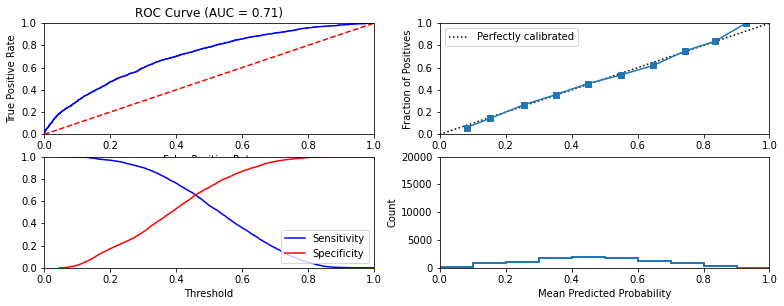


Similarity to LC grade ranking:  0.7427475177645972
Brier score: 0.21426674334261706


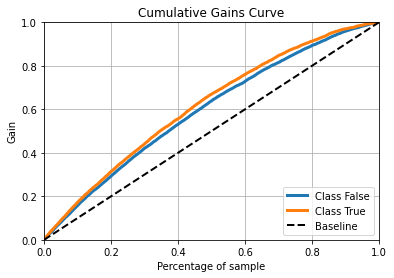

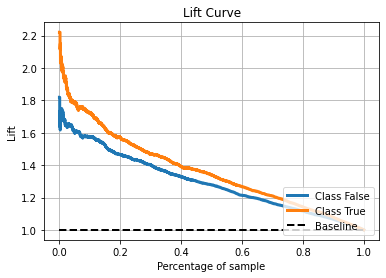

  Decile  Decile Lift
9      1     1.723296
8      2     1.571175
7      3     1.470131
6      4     1.390184
5      5     1.339107
4      6     1.267303
3      7     1.209987
2      8     1.141461
1      9     1.077800
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.01837784856652919
[0.65284 0.65288 0.65292 0.65288 0.65288 0.65292 0.65288 0.65288 0.65292
 0.65288 0.65288 0.65296 0.65288 0.65292 0.65292 0.65288 0.65296 0.65288
 0.65292 0.65288]


In [ ]:
pickle_logistic_l1 = LogisticRegression(penalty = 'l1', solver='liblinear')
cv_parameters = {"C":np.logspace(0, 50, num = 20)}

pickle_logistic_l1 = fit_classification(pickle_logistic_l1, data_dict,
                         cv_parameters = cv_parameters, model_name = "Pickle logistic l1")

#### $l_2$ penalized logistic regression

  Model: Pickle logistic l2
Fit time: 2.93 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.5002666017900825
Accuracy:  0.65
              precision    recall  f1-score   support

  No default     0.6680    0.7224    0.6941      5497
     Default     0.6237    0.5616    0.5910      4503

    accuracy                         0.6500     10000
   macro avg     0.6458    0.6420    0.6426     10000
weighted avg     0.6480    0.6500    0.6477     10000



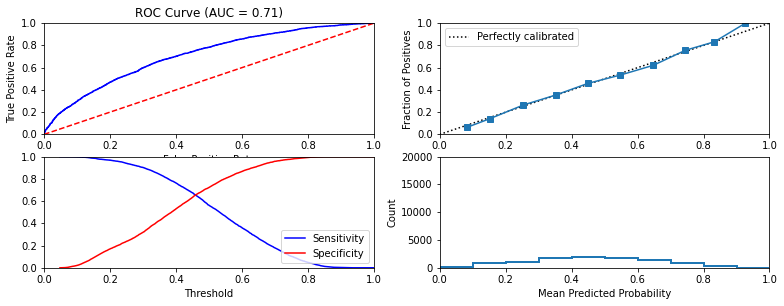


Similarity to LC grade ranking:  0.7451256278139421
Brier score: 0.21427817459949233


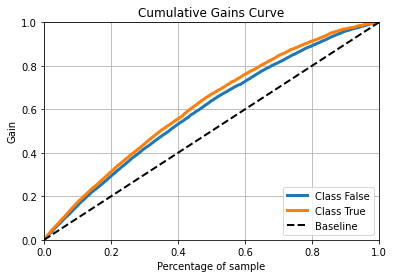

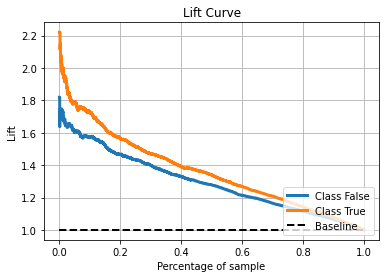

  Decile  Decile Lift
9      1     1.723296
8      2     1.564513
7      3     1.470131
6      4     1.390184
5      5     1.339551
4      6     1.268044
3      7     1.208718
2      8     1.142294
1      9     1.077553
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.65372]


In [ ]:
pickle_logistic_l2 = LogisticRegression(penalty = 'l2', solver='lbfgs')
cv_parameters = {"C":np.logspace(0, 50, num = 20)}

pickle_logistic_l2 = fit_classification(pickle_logistic_l2, data_dict, model_name = 'Pickle logistic l2')

#### Naive Bayes

  Model: All Feature Gaussian Naive Bayes
Fit time: 0.2 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.1636634051996386
Accuracy:  0.6425
              precision    recall  f1-score   support

  No default     0.6535    0.7442    0.6959      5497
     Default     0.6241    0.5183    0.5663      4503

    accuracy                         0.6425     10000
   macro avg     0.6388    0.6313    0.6311     10000
weighted avg     0.6403    0.6425    0.6376     10000

Confusion matrix : 
 [[2334 2169]
 [1406 4091]]
Expected Value: 337.94


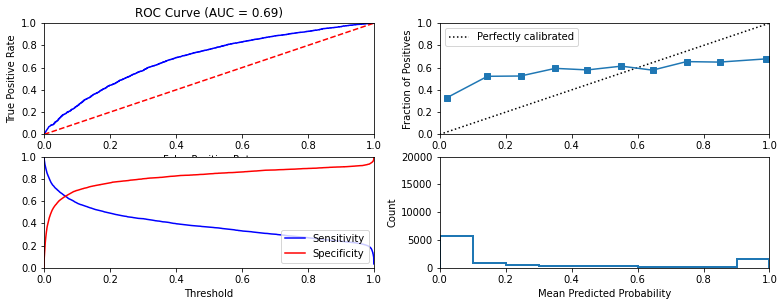


Similarity to LC grade ranking:  0.713557641228694
Brier score: 0.3119198136401377


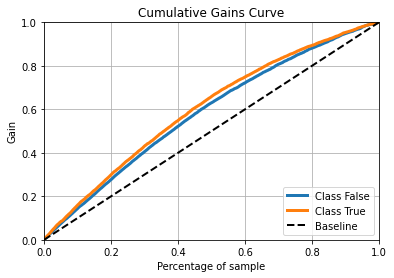

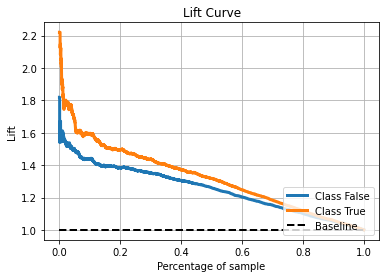

  Decile  Decile Lift
9      1     1.592272
8      2     1.495670
7      3     1.437560
6      4     1.371308
5      5     1.317788
4      6     1.248057
3      7     1.183655
2      8     1.117311
1      9     1.059047
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.6312]


In [ ]:
all_feature_gnb = GaussianNB()
all_feature_gnb = fit_classification(all_feature_gnb, data_dict,
                model_name = "All Feature Gaussian Naive Bayes",output_confusion_matrix=True)

#### Random Forest

  Model: Random forest
Fit time: 57.31 seconds
Optimal parameters:
{'min_samples_leaf': 500}

Accuracy-maximizing threshold was: 0.4799654926711312
Accuracy:  0.6506
              precision    recall  f1-score   support

  No default     0.6758    0.7004    0.6879      5497
     Default     0.6172    0.5898    0.6032      4503

    accuracy                         0.6506     10000
   macro avg     0.6465    0.6451    0.6455     10000
weighted avg     0.6494    0.6506    0.6498     10000



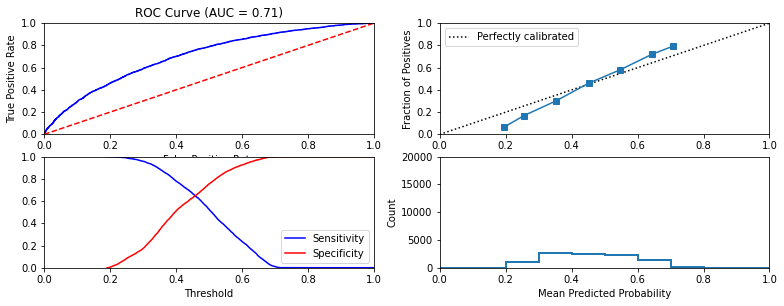


Similarity to LC grade ranking:  0.7784891484120822
Brier score: 0.2186362071974539


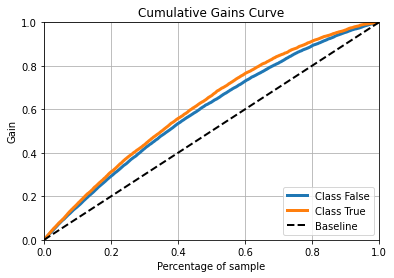

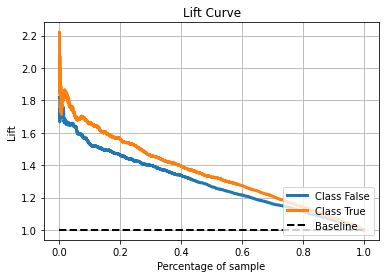

  Decile  Decile Lift
9      1     1.658894
8      2     1.560071
7      3     1.457547
6      4     1.394626
5      5     1.325339
4      6     1.273595
3      7     1.208083
2      8     1.141184
1      9     1.071878
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 1.0718905932360125
[0.64932 0.6468  0.64728 0.64564 0.6456  0.64512 0.64336 0.64236 0.64248]


In [ ]:
random_forest = RandomForestClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Random forest")

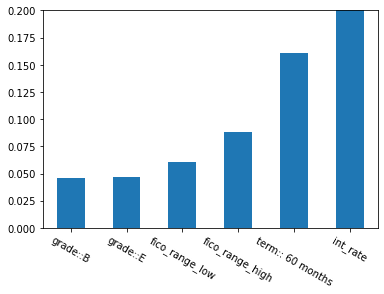

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(random_forest['model'].feature_importances_)[-6:]) 
bplot = pd.Series(random_forest['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.show()

#### Bagged Trees

  Model: Bagged trees
Fit time: 261.02 seconds
Optimal parameters:
{'min_samples_leaf': 1000}

Accuracy-maximizing threshold was: 0.49368454030835174
Accuracy:  0.6471
              precision    recall  f1-score   support

  No default     0.6695    0.7071    0.6878      5497
     Default     0.6161    0.5738    0.5942      4503

    accuracy                         0.6471     10000
   macro avg     0.6428    0.6405    0.6410     10000
weighted avg     0.6455    0.6471    0.6457     10000



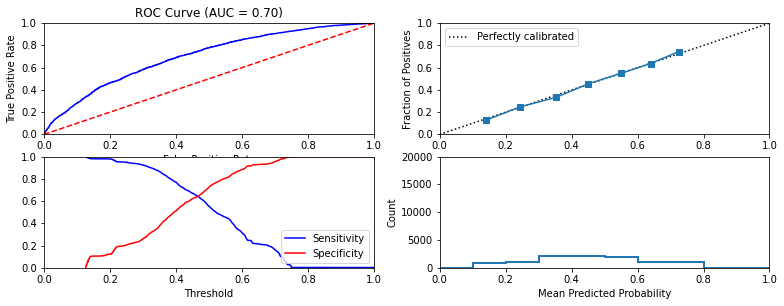


Similarity to LC grade ranking:  0.828790086307083
Brier score: 0.2175060222050345


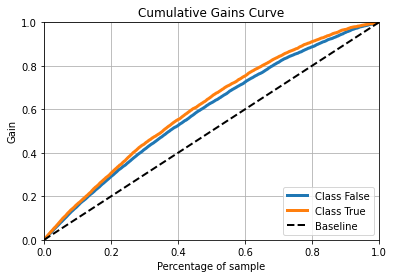

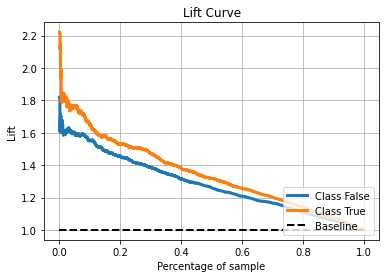

  Decile  Decile Lift
9      1     1.650011
8      2     1.531201
7      3     1.473832
6      4     1.382967
5      5     1.317788
4      6     1.254719
3      7     1.202056
2      8     1.138685
1      9     1.074839
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.43265962049570805
[0.64672 0.64604 0.64512 0.6462  0.64548 0.64716 0.64608 0.64436 0.6444 ]


In [ ]:
random_forest = RandomForestClassifier(max_features = 1.0)
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Bagged trees")

#### MLP

  Model: all_feature MLP
Fit time: 37.89 seconds
Optimal parameters:
{'activation': 'identity', 'solver': 'sgd'}

Accuracy-maximizing threshold was: 0.49968059865539904
Accuracy:  0.6531
              precision    recall  f1-score   support

  No default     0.6702    0.7264    0.6972      5497
     Default     0.6279    0.5636    0.5940      4503

    accuracy                         0.6531     10000
   macro avg     0.6490    0.6450    0.6456     10000
weighted avg     0.6512    0.6531    0.6507     10000

Confusion matrix : 
 [[2538 1965]
 [1504 3993]]
Expected Value: 345.25


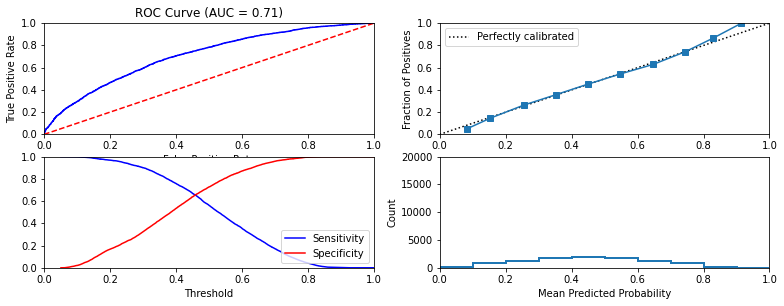


Similarity to LC grade ranking:  0.7505641375562507
Brier score: 0.21442050582503724


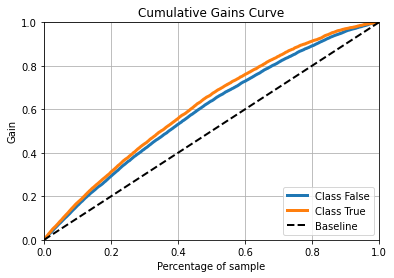

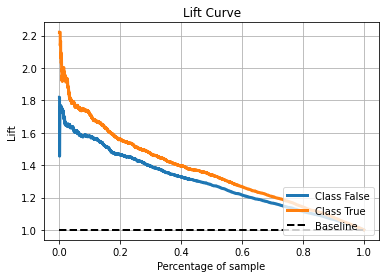

  Decile  Decile Lift
9      1     1.714413
8      2     1.560071
7      3     1.470871
6      4     1.394626
5      5     1.338219
4      6     1.266193
3      7     1.205546
2      8     1.141461
1      9     1.078293
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.65264]


In [ ]:
all_feature_MLP = MLPClassifier(random_state=1, max_iter=50,  
                         batch_size=100, hidden_layer_sizes=(100,))

all_feature_MLP, c_matrix = fit_classification(all_feature_MLP, data_dict,
                                         cv_parameters = {'solver': ['sgd'], 'activation':['identity']},
                                         model_name = 'all_feature MLP', output_confusion_matrix = True)

In [ ]:
### Return a cost matrix
TP_Gain = 0.03 #return from safe investment
FN_Cost = -0.05
FP_Cost = 0 
TN_Gain = 0.092
confusion_cost = np.array([[TP_Gain,FN_Cost],[FP_Cost,TN_Gain]])
print(confusion_cost)
expectedValue = np.sum(c_matrix * confusion_cost)
print(expectedValue)

[[ 0.03  -0.05 ]
 [ 0.     0.092]]
345.246


## Step 3 - Baseline models
See how well we do using LC specific variables such as grade or interest rate only

### Grade Only

#### $l_1$ penalized logistic regression (Grade only)

  Model: Grade only Logistic l1
Fit time: 5.78 seconds
Optimal parameters:
{'C': 1.0}

Accuracy-maximizing threshold was: 0.5895467716028465
Accuracy:  0.6044
              precision    recall  f1-score   support

  No default     0.5889    0.9289    0.7208      5497
     Default     0.7058    0.2083    0.3217      4503

    accuracy                         0.6044     10000
   macro avg     0.6473    0.5686    0.5212     10000
weighted avg     0.6415    0.6044    0.5411     10000



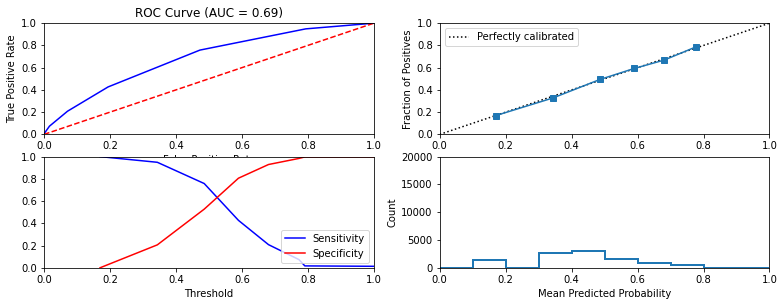


Similarity to LC grade ranking:  1.0
Brier score: 0.21984567602288513


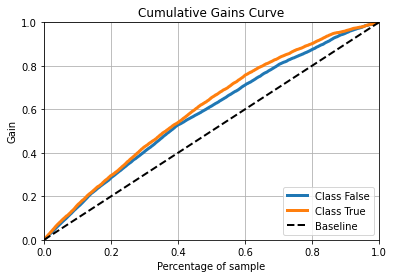

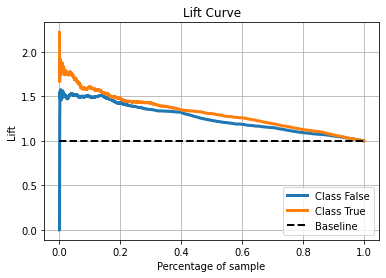

  Decile  Decile Lift
9      1     1.590051
8      2     1.490118
4      6     1.370198
5      5     1.308017
6      4     1.253831
7      3     1.261011
2      8     1.188414
3      7     1.128137
0     10     1.043749
1      9     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408
 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408
 0.63408 0.63408]


In [ ]:
data_dict = prepare_data(feature_subset=['grade'])
grade_only_logistic_l1 = LogisticRegression(penalty = 'l1', solver='liblinear')
cv_parameters = {"C":np.logspace(0, 50, num = 20)}

grade_only_logistic_l1 = fit_classification(grade_only_logistic_l1, data_dict,
                        cv_parameters = cv_parameters, model_name = "Grade only Logistic l1")

#### $l_2$ penalized logistic regression (Grade only)

  Model: Grade only logistic l2
Fit time: 9.38 seconds
Optimal parameters:
{'C': 1.0}

Accuracy-maximizing threshold was: 0.5893230027816116
Accuracy:  0.6044
              precision    recall  f1-score   support

  No default     0.5889    0.9289    0.7208      5497
     Default     0.7058    0.2083    0.3217      4503

    accuracy                         0.6044     10000
   macro avg     0.6473    0.5686    0.5212     10000
weighted avg     0.6415    0.6044    0.5411     10000



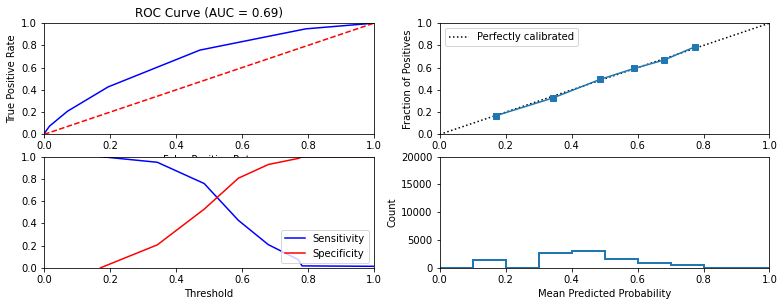


Similarity to LC grade ranking:  1.0
Brier score: 0.21985375033901372


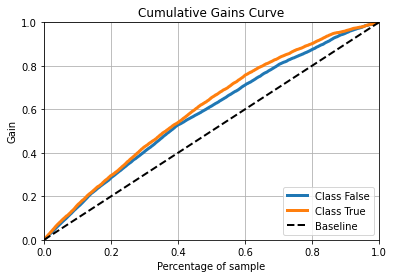

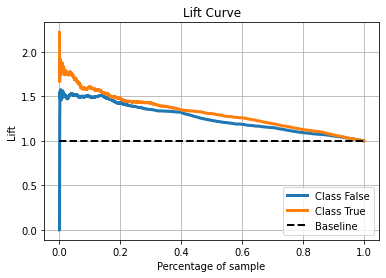

  Decile  Decile Lift
9      1     1.590051
8      2     1.490118
4      6     1.370198
5      5     1.308017
6      4     1.253831
7      3     1.261011
2      8     1.188414
3      7     1.128137
0     10     1.043749
1      9     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408
 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408 0.63408
 0.63408 0.63408]


In [ ]:
data_dict = prepare_data(feature_subset=['grade'])
grade_only_logistic = LogisticRegression(penalty = 'l2', C=np.inf, solver='lbfgs')
cv_parameters = {"C":np.logspace(0, 50, num = 20)}

grade_only_logistic = fit_classification(grade_only_logistic,data_dict,
                                         cv_parameters = cv_parameters, model_name = 'Grade only logistic l2')

  Model: Interest rate only logistics l2
Fit time: 0.21 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.45434343621149886
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000



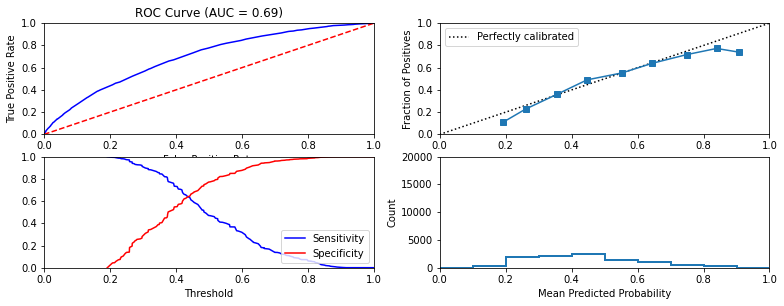


Similarity to LC grade ranking:  0.8826478717984018
Brier score: 0.22025165033821853


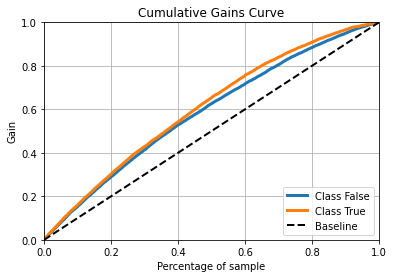

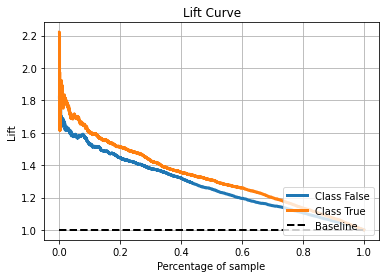

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259161
3      7     1.199201
2      8     1.133966
1      9     1.072618
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.63868]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
interest_only_logistic = LogisticRegression(penalty = 'l2', C=np.inf, solver='lbfgs')

interest_only_logistic = fit_classification(interest_only_logistic, data_dict,
                                   model_name = 'Interest rate only logistics l2')

#### Naive Bayes (Grade Only)

  Model: Grade Only Gaussian Naive Bayes
Fit time: 0.05 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.37810783084145694
Accuracy:  0.6044
              precision    recall  f1-score   support

  No default     0.5889    0.9289    0.7208      5497
     Default     0.7058    0.2083    0.3217      4503

    accuracy                         0.6044     10000
   macro avg     0.6473    0.5686    0.5212     10000
weighted avg     0.6415    0.6044    0.5411     10000

Confusion matrix : 
 [[ 938 3565]
 [ 391 5106]]
Expected Value: 319.64


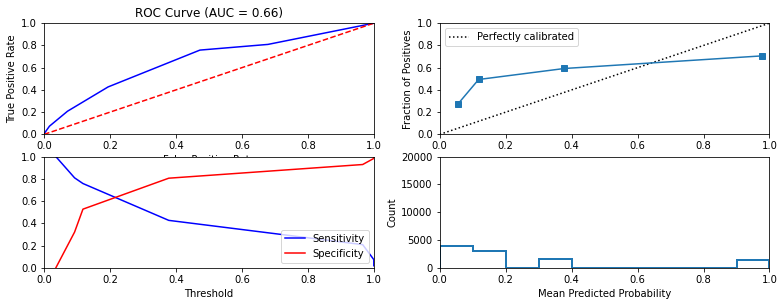


Similarity to LC grade ranking:  0.8150196202204226
Brier score: 0.30318658444067476


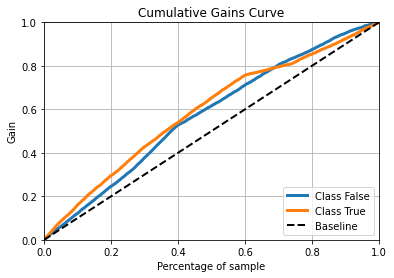

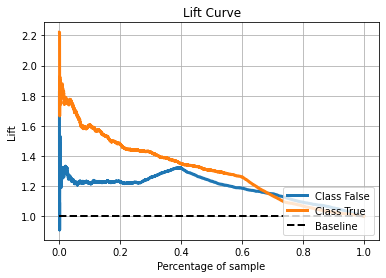

  Decile  Decile Lift
9      1     1.590051
8      2     1.490118
4      6     1.370198
5      5     1.308017
6      4     1.253831
7      3     1.261011
3      7     1.133530
0     10     1.084832
1      9     1.040294
2      8     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.60424]


In [ ]:
data_dict = prepare_data(feature_subset=['grade'])
grade_only_gnb = GaussianNB()
grade_only_gnb = fit_classification(grade_only_gnb, data_dict,
                model_name = "Grade Only Gaussian Naive Bayes", output_confusion_matrix=True)

#### Decision Trees (Grade only)

  Model: Decision tree
Fit time: 0.34 seconds
Optimal parameters:
{'min_samples_leaf': 500}

Accuracy-maximizing threshold was: 0.5897929706307173
Accuracy:  0.5982
              precision    recall  f1-score   support

  No default     0.5844    0.9316    0.7182      5497
     Default     0.6960    0.1912    0.3000      4503

    accuracy                         0.5982     10000
   macro avg     0.6402    0.5614    0.5091     10000
weighted avg     0.6347    0.5982    0.5299     10000

Confusion matrix : 
 [[ 861 3642]
 [ 376 5121]]
Expected Value: 314.86


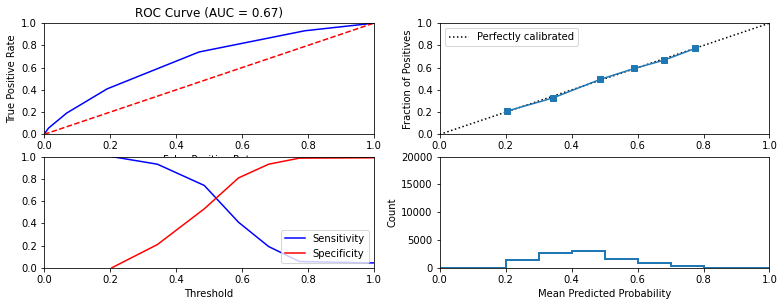


Similarity to LC grade ranking:  0.9600800688907511
Brier score: 0.2236816132673189


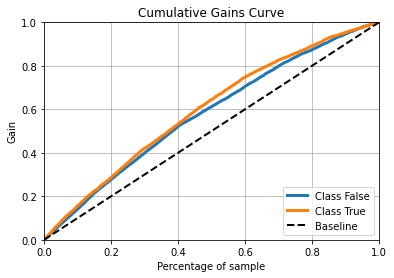

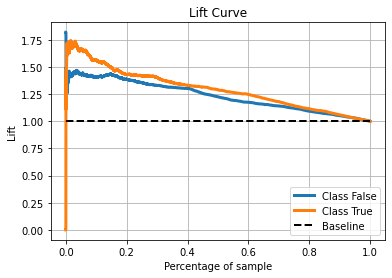

  Decile  Decile Lift
9      1     1.561181
8      2     1.453475
5      5     1.342068
6      4     1.269709
7      3     1.273817
2      8     1.186986
3      7     1.118937
4      6     1.116755
0     10     1.044489
1      9     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 2.6141712250349847
[0.62888 0.6172  0.61244 0.61244 0.61244 0.61244 0.61244 0.61244 0.61244]
314.86199999999997


In [ ]:

data_dict = prepare_data(feature_subset=['grade'])
decision_tree = DecisionTreeClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

decision_tree, c_matrix = fit_classification(decision_tree, data_dict,
                          cv_parameters = cv_parameters, model_name = "Decision tree", output_confusion_matrix=True)

expectedValue = np.sum(c_matrix * confusion_cost)
print(expectedValue)

#### Random Forest (Grade Only)

  Model: Random forest
Fit time: 18.84 seconds
Optimal parameters:
{'min_samples_leaf': 500}

Accuracy-maximizing threshold was: 0.4190458701982919
Accuracy:  0.607
              precision    recall  f1-score   support

  No default     0.6776    0.5438    0.6034      5497
     Default     0.5513    0.6842    0.6106      4503

    accuracy                         0.6070     10000
   macro avg     0.6144    0.6140    0.6070     10000
weighted avg     0.6207    0.6070    0.6066     10000



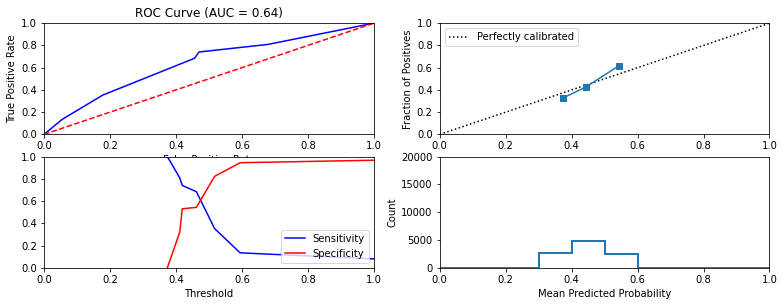


Similarity to LC grade ranking:  0.7010450930843801
Brier score: 0.23586292581112334


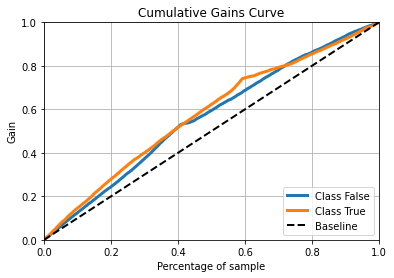

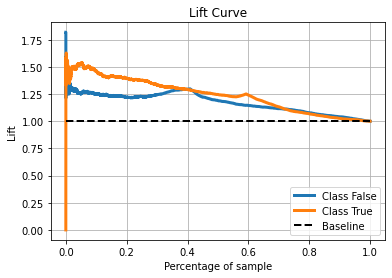

  Decile  Decile Lift
8      2     1.292472
9      1     1.390184
5      5     1.296913
6      4     1.235288
7      3     1.229403
3      7     1.098897
4      6     1.127820
0     10     1.079836
1      9     1.035853
2      8     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 5.590751747109911
[0.61244 0.61244 0.61244 0.61244 0.61244 0.61244 0.61244 0.59644 0.5782 ]


In [ ]:
data_dict = prepare_data(feature_subset=['grade'])
random_forest = RandomForestClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Random forest")

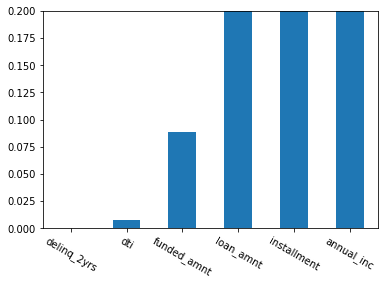

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(random_forest['model'].feature_importances_)[-6:]) 
bplot = pd.Series(random_forest['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.show()

#### Bagged Trees (Grade Only)

  Model: Bagged trees
Fit time: 24.97 seconds
Optimal parameters:
{'min_samples_leaf': 500}

Accuracy-maximizing threshold was: 0.5893844403973759
Accuracy:  0.5802
              precision    recall  f1-score   support

  No default     0.5714    0.9452    0.7123      5497
     Default     0.6681    0.1346    0.2240      4503

    accuracy                         0.5802     10000
   macro avg     0.6198    0.5399    0.4681     10000
weighted avg     0.6150    0.5802    0.4924     10000



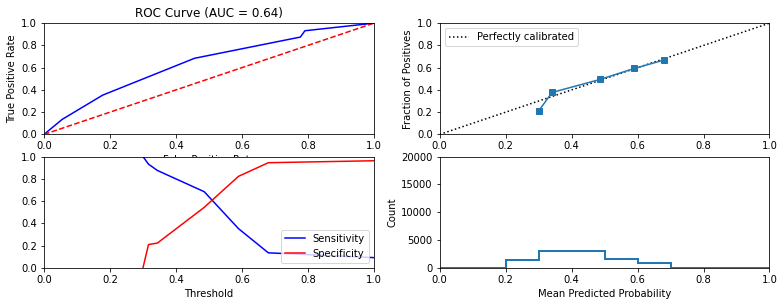


Similarity to LC grade ranking:  0.8340025469891951
Brier score: 0.23169464378913981


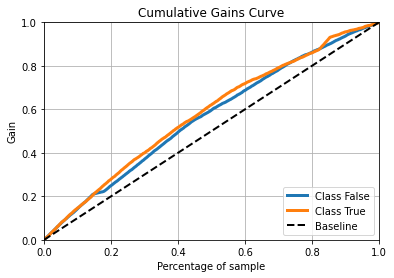

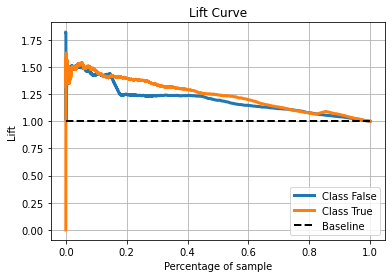

  Decile  Decile Lift
8      2     1.292472
9      1     1.390184
5      5     1.296913
6      4     1.235288
7      3     1.229403
2      8     1.149234
3      7     1.084674
4      6     1.074839
0     10     1.007230
1      9     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 5.590751747109911
[0.61244 0.61244 0.61244 0.61244 0.61244 0.61244 0.61244 0.59644 0.5782 ]


In [ ]:
data_dict = prepare_data(feature_subset=['grade'])
random_forest = RandomForestClassifier(max_features = 1.0)
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Bagged trees")

#### MLP (Grade Only)

  Model: Grade only MLP
Fit time: 27.64 seconds
Optimal parameters:
{'activation': 'identity'}

Accuracy-maximizing threshold was: 0.5665379775713157
Accuracy:  0.6289
              precision    recall  f1-score   support

  No default     0.6257    0.8086    0.7055      5497
     Default     0.6367    0.4095    0.4984      4503

    accuracy                         0.6289     10000
   macro avg     0.6312    0.6091    0.6020     10000
weighted avg     0.6307    0.6289    0.6123     10000

Confusion matrix : 
 [[1844 2659]
 [1052 4445]]
Expected Value: 331.31


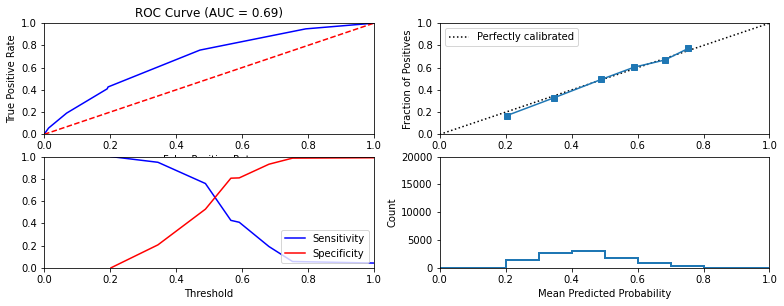


Similarity to LC grade ranking:  0.9869557936854396
Brier score: 0.22067658067876436


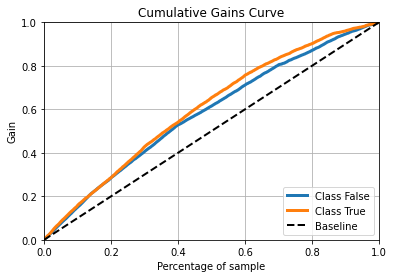

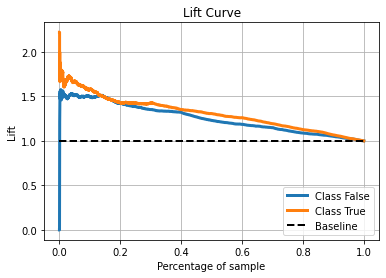

  Decile  Decile Lift
9      1     1.561181
8      2     1.453475
4      6     1.345769
5      5     1.289696
6      4     1.239174
7      3     1.261011
2      8     1.188414
3      7     1.128137
0     10     1.043749
1      9     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.62888]


In [ ]:
data_dict = prepare_data(feature_subset=['grade'])
grade_only_MLP = MLPClassifier(random_state=1, max_iter=50,  
                         batch_size=100, hidden_layer_sizes=(100,), solver = 'sgd')

#cv_parameters = {'activation':['identity','tanh','relu','logistic']}
cv_parameters = {'activation':['identity']}
grade_only_MLP, c_matrix = fit_classification(grade_only_MLP,data_dict,
                                         cv_parameters = cv_parameters,
                                         model_name = 'Grade only MLP',
                                         output_confusion_matrix = True)

In [ ]:
### Return a cost matrix
TP_Gain = 0.03 #return from safe investment
FN_Cost = -0.05
FP_Cost = 0 
TN_Gain = 0.092
confusion_cost = np.array([[TP_Gain,FN_Cost],[FP_Cost,TN_Gain]])
print(confusion_cost)
expectedValue = np.sum(c_matrix * confusion_cost)
print(expectedValue)

[[ 0.03  -0.05 ]
 [ 0.     0.092]]
331.30999999999995


### Interest Rate Only

#### $l_1$ penalized logistic regression (Interest only)

  Model: Interest only Logistic l1
Fit time: 3.35 seconds
Optimal parameters:
{'C': 1.0}

Accuracy-maximizing threshold was: 0.45438185038248347
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000



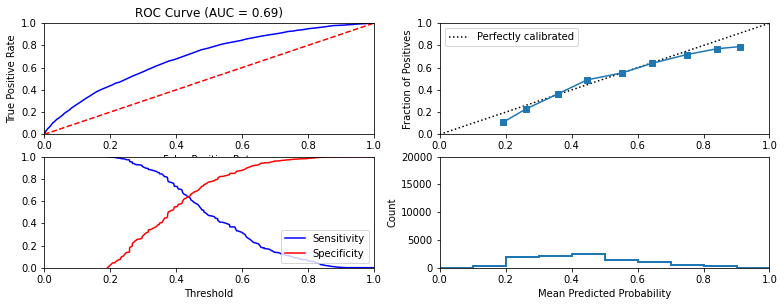


Similarity to LC grade ranking:  0.8826478717984018
Brier score: 0.22025318190860962


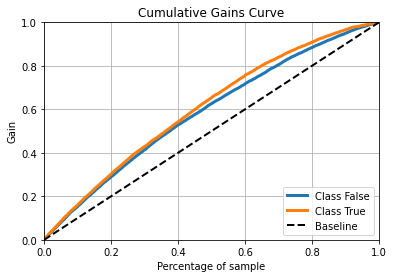

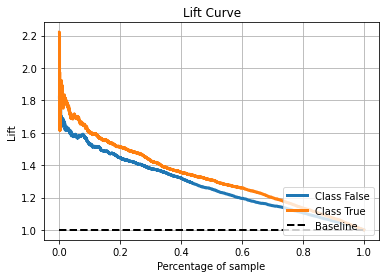

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259161
3      7     1.199201
2      8     1.133966
1      9     1.072618
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.63868 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868
 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868 0.63868
 0.63868 0.63868]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
interest_only_logistic_l1 = LogisticRegression(penalty = 'l1', solver='liblinear')
cv_parameters = {"C":np.logspace(0, 50, num = 20)}

interest_only_logistic_l1 = fit_classification(interest_only_logistic_l1, data_dict,
                        cv_parameters = cv_parameters, model_name = "Interest only Logistic l1")

#### $l_2$ penalized logistic regression (Interest only)

  Model: Interest only logistic l2
Fit time: 0.21 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.45434343621149886
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000



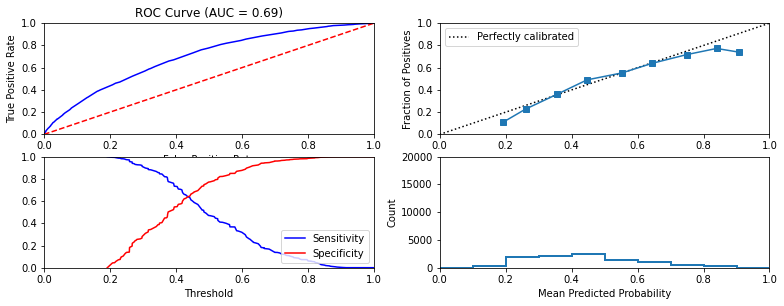


Similarity to LC grade ranking:  0.8826478717984018
Brier score: 0.22025165033821853


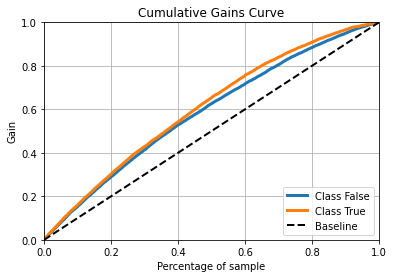

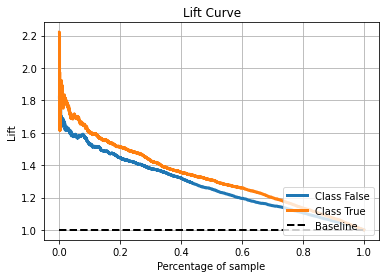

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259161
3      7     1.199201
2      8     1.133966
1      9     1.072618
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.63868]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
interest_only_logistic = LogisticRegression(penalty = 'l2', C=np.inf, solver='lbfgs')

interest_only_logistic = fit_classification(interest_only_logistic,data_dict,
                                         model_name = 'Interest only logistic l2')

#### Naive Bayes - Interest Rate Only

  Model: Interest Only Gaussian Naive Bayes
Fit time: 0.02 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.4277514865655062
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000

Confusion matrix : 
 [[2565 1938]
 [1680 3817]]
Expected Value: 331.21


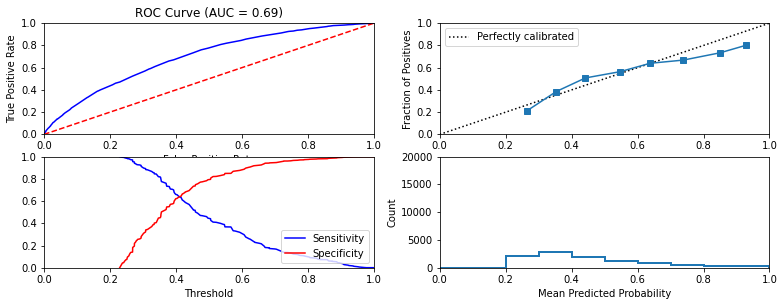


Similarity to LC grade ranking:  0.8826478717984018
Brier score: 0.22241545356351486


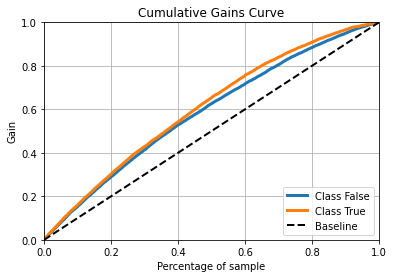

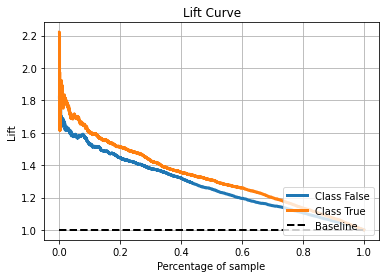

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259161
3      7     1.199201
2      8     1.133966
1      9     1.072618
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.6346]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
interest_only_gnb = GaussianNB()
interest_only_gnb = fit_classification(interest_only_gnb, data_dict,
                model_name = "Interest Only Gaussian Naive Bayes", output_confusion_matrix=True)

#### Random Forest (Interest Only)

  Model: Interest Only Random forest
Fit time: 27.8 seconds
Optimal parameters:
{'min_samples_leaf': 1300}

Accuracy-maximizing threshold was: 0.5028850821976406
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000



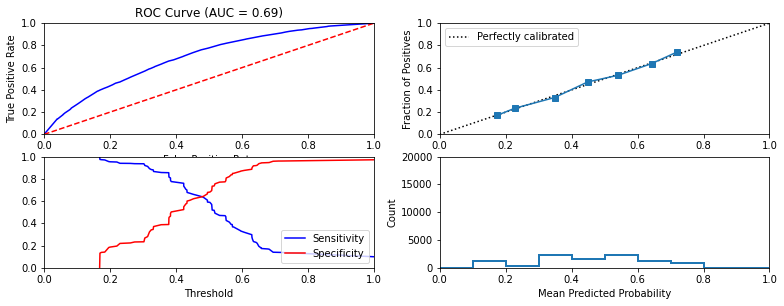


Similarity to LC grade ranking:  0.8863257096344839
Brier score: 0.21951003652238896


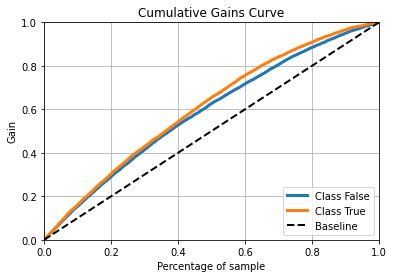

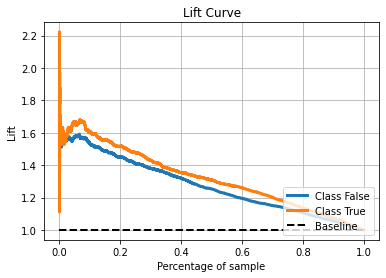

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259531
3      7     1.199201
2      8     1.134244
1      9     1.072618
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.17459624618070865
[0.64144 0.64144 0.64036 0.64144 0.64144 0.64144 0.64036 0.6404  0.64148]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
random_forest = RandomForestClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Interest Only Random forest")

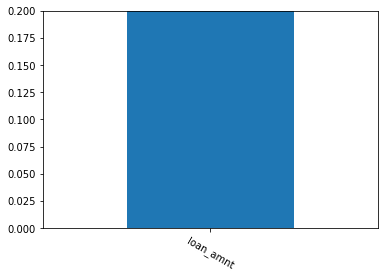

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(random_forest['model'].feature_importances_)[-6:]) 
bplot = pd.Series(random_forest['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.show()

#### Bagged Trees (Interest Only)

  Model: Interest Rate Bagged trees
Fit time: 27.81 seconds
Optimal parameters:
{'min_samples_leaf': 1300}

Accuracy-maximizing threshold was: 0.5028850821976406
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000



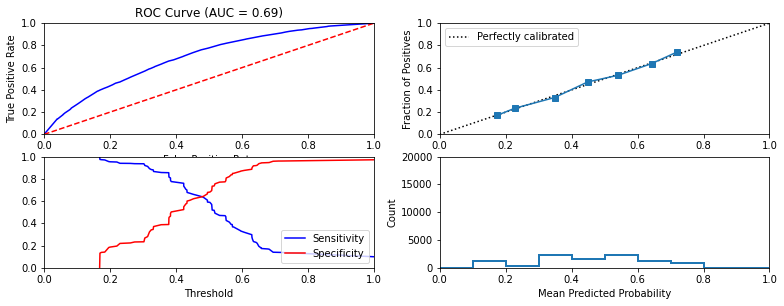


Similarity to LC grade ranking:  0.8863257096344839
Brier score: 0.21951003652238896


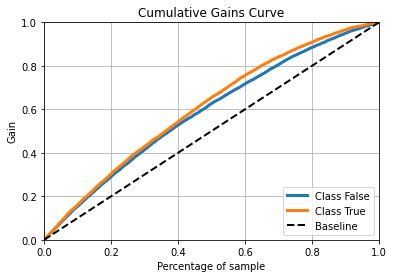

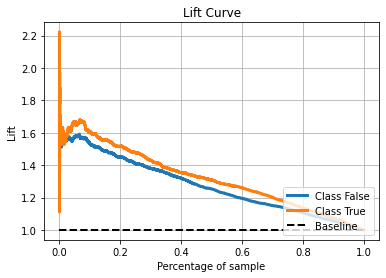

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259531
3      7     1.199201
2      8     1.134244
1      9     1.072618
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.17459624618070865
[0.64144 0.64144 0.64036 0.64144 0.64144 0.64144 0.64036 0.6404  0.64148]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
random_forest = RandomForestClassifier(max_features = 1.0)
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Interest Rate Bagged trees")

#### MLP (Interest Only)

  Model: Interest rate only MLP
Fit time: 22.11 seconds
Optimal parameters:
{'activation': 'identity'}

Accuracy-maximizing threshold was: 0.4568972878747587
Accuracy:  0.6382
              precision    recall  f1-score   support

  No default     0.6632    0.6944    0.6785      5497
     Default     0.6042    0.5696    0.5864      4503

    accuracy                         0.6382     10000
   macro avg     0.6337    0.6320    0.6324     10000
weighted avg     0.6367    0.6382    0.6370     10000

Confusion matrix : 
 [[2565 1938]
 [1680 3817]]
Expected Value: 331.21


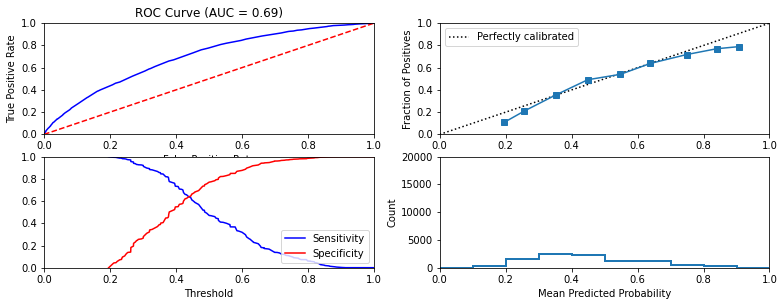


Similarity to LC grade ranking:  0.8826478717984018
Brier score: 0.22025613240919498


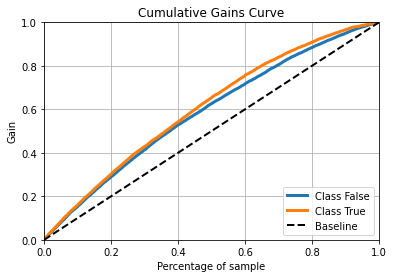

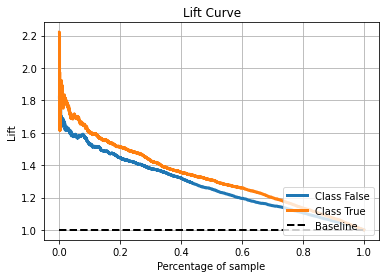

  Decile  Decile Lift
9      1     1.601155
8      2     1.513435
7      3     1.426456
6      4     1.355208
5      5     1.307129
4      6     1.259161
3      7     1.199201
2      8     1.133966
1      9     1.072618
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.63876]


In [ ]:
data_dict = prepare_data(feature_subset=['int_rate'])
grade_only_MLP = MLPClassifier(random_state=1, max_iter=50,  
                         batch_size=100, hidden_layer_sizes=(100,), solver = 'sgd')

#cv_parameters = {'solver': ['sgd'], 'activation':['identity','tanh','relu','logistic']}
cv_parameters = {'activation':['identity']}
grade_only_MLP, c_matrix = fit_classification(grade_only_MLP,data_dict,
                                         cv_parameters = cv_parameters,
                                         model_name = 'Interest rate only MLP',
                                        output_confusion_matrix = True)

In [ ]:
### Return a cost matrix
TP_Gain = 0.03 #return from safe investment
FN_Cost = -0.05
FP_Cost = 0 
TN_Gain = 0.092
confusion_cost = np.array([[TP_Gain,FN_Cost],[FP_Cost,TN_Gain]])
print(confusion_cost)
expectedValue = np.sum(c_matrix * confusion_cost)
print(expectedValue)

[[ 0.03  -0.05 ]
 [ 0.     0.092]]
331.214


## Step 4- Test models without grade or interest rate

In [ ]:
final_features = [i for i in discrete_features + continuous_features if i not in ["grade", "int_rate", "installment"]]
data_dict = prepare_data(feature_subset = final_features)

all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)

In [ ]:
final_features

['purpose',
 'term',
 'verification_status',
 'emp_length',
 'home_ownership',
 'loan_amnt',
 'funded_amnt',
 'annual_inc',
 'dti',
 'revol_bal',
 'delinq_2yrs',
 'open_acc',
 'pub_rec',
 'fico_range_high',
 'fico_range_low',
 'revol_util',
 'cr_hist']

### Ridge Classifier

In [ ]:
ridge_classifier = RidgeClassifier()
cv_parameters = {"alpha":np.logspace(-4, 4, num = 10)}

ridge_classifier = fit_classification(ridge_classifier, data_dict,
                             cv_parameters = cv_parameters, model_name = "Ridge Classifier")

  Model: Ridge Classifier
Fit time: 1.83 seconds
Optimal parameters:
{'alpha': 21.54434690031882}

Accuracy:  0.6376
              precision    recall  f1-score   support

  No default     0.6512    0.7337    0.6900      5497
     Default     0.6154    0.5203    0.5639      4503

    accuracy                         0.6376     10000
   macro avg     0.6333    0.6270    0.6269     10000
weighted avg     0.6351    0.6376    0.6332     10000


Similarity to LC grade ranking:  0.49408678001733486


### Naive Bayes

  Model: Gaussian Naive Bayes
Fit time: 0.19 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.4092052637908915
Accuracy:  0.6164
              precision    recall  f1-score   support

  No default     0.6404    0.6893    0.6639      5497
     Default     0.5817    0.5274    0.5532      4503

    accuracy                         0.6164     10000
   macro avg     0.6110    0.6084    0.6086     10000
weighted avg     0.6139    0.6164    0.6141     10000

Confusion matrix : 
 [[2375 2128]
 [1708 3789]]
Expected Value: 313.44


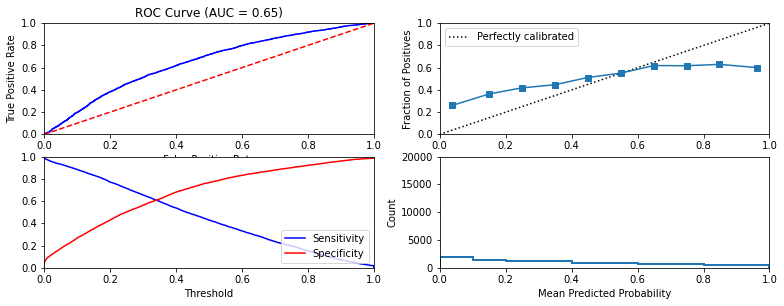


Similarity to LC grade ranking:  0.3892381519277021
Brier score: 0.26366066882022426


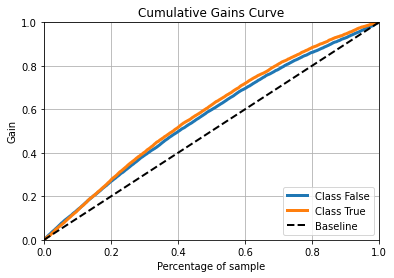

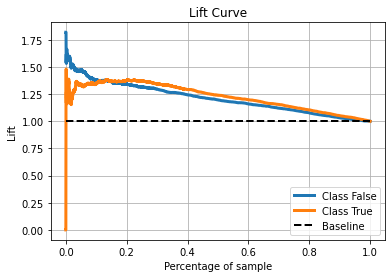

  Decile  Decile Lift
9      1     1.352432
8      2     1.376860
7      3     1.342068
6      4     1.291361
5      5     1.239618
4      6     1.198090
3      7     1.154468
2      8     1.104541
1      9     1.051645
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.61212]


In [ ]:
gnb = GaussianNB()
gnb = fit_classification(gnb, data_dict,
                model_name = "Gaussian Naive Bayes", output_confusion_matrix=True)


### $l_1$ penalized logistic regression
(Takes a couple of minutes)

  Model: l1 Penalized Logistic Regression
Fit time: 232.28 seconds
Optimal parameters:
{'C': 1.0}

Accuracy-maximizing threshold was: 0.4983528455683573
Accuracy:  0.6369
              precision    recall  f1-score   support

  No default     0.6531    0.7240    0.6867      5497
     Default     0.6116    0.5305    0.5682      4503

    accuracy                         0.6369     10000
   macro avg     0.6324    0.6273    0.6275     10000
weighted avg     0.6344    0.6369    0.6334     10000

Confusion matrix : 
 [[2389 2114]
 [1517 3980]]
Expected Value: 332.13


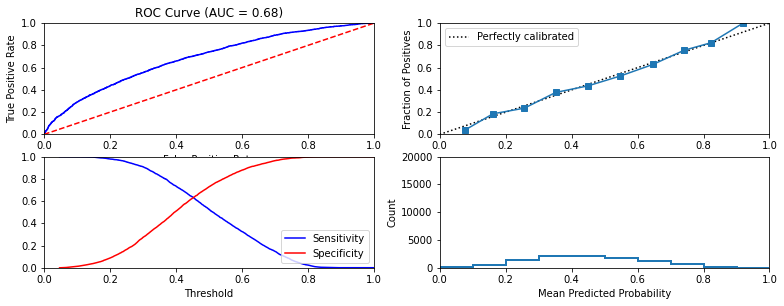


Similarity to LC grade ranking:  0.49596872211789356
Brier score: 0.221671886244618


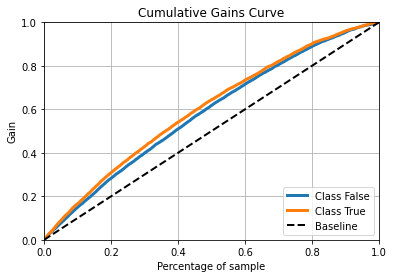

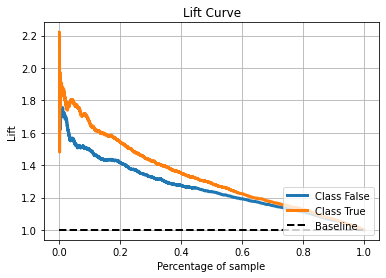

  Decile  Decile Lift
9      1     1.656673
8      2     1.542305
7      3     1.427937
6      4     1.351321
5      5     1.288918
4      6     1.223629
3      7     1.172869
2      8     1.127026
1      9     1.066943
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.05633802816903568
[0.639   0.63864 0.63876 0.63872 0.63868 0.63876 0.63872 0.63868 0.63868
 0.63872]


In [ ]:
l1_logistic = LogisticRegression(penalty = 'l1',solver='liblinear')
cv_parameters = {"C":np.logspace(0, 6, num = 10)}

l1_logistic, coefs = fit_classification(l1_logistic, data_dict,
                        cv_parameters = cv_parameters, model_name = "l1 Penalized Logistic Regression", output_confusion_matrix=True)

### $l_2$ penalized logistic regression

  Model: l2 Penalized Logistic Regression
Fit time: 15.66 seconds
Optimal parameters:
{'C': 0.3593813663804626}

Accuracy-maximizing threshold was: 0.4910978327452352
Accuracy:  0.6356
              precision    recall  f1-score   support

  No default     0.6555    0.7104    0.6819      5497
     Default     0.6062    0.5443    0.5736      4503

    accuracy                         0.6356     10000
   macro avg     0.6309    0.6273    0.6277     10000
weighted avg     0.6333    0.6356    0.6331     10000

Confusion matrix : 
 [[2451 2052]
 [1592 3905]]
Expected Value: 330.19


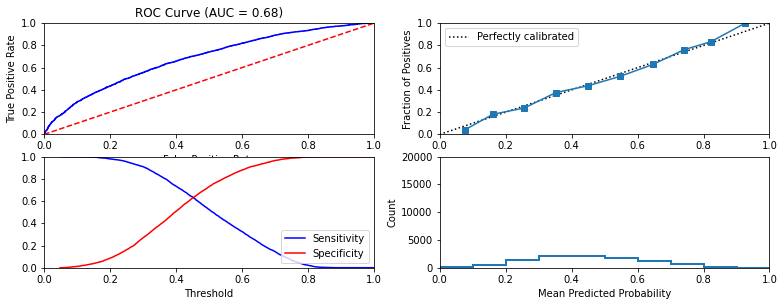


Similarity to LC grade ranking:  0.4958361620786787
Brier score: 0.22167699539529787


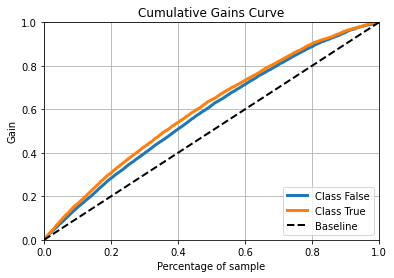

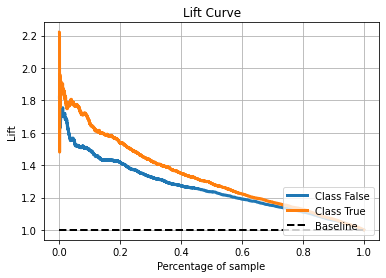

  Decile  Decile Lift
9      1     1.654453
8      2     1.536753
7      3     1.428677
6      4     1.349101
5      5     1.287586
4      6     1.221778
3      7     1.170648
2      8     1.127026
1      9     1.066450
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 14.259803614985312
[0.54836 0.61864 0.63464 0.63896 0.63956 0.6384  0.6386  0.63876 0.63864
 0.6388 ]


In [ ]:
l2_logistic = LogisticRegression(penalty = 'l2')
cv_parameters = {"C":np.logspace(-4, 4, num = 10)}

l2_logistic, costs = fit_classification(l2_logistic, data_dict,
                        cv_parameters = cv_parameters, model_name = "l2 Penalized Logistic Regression", output_confusion_matrix=True, predProb=True)

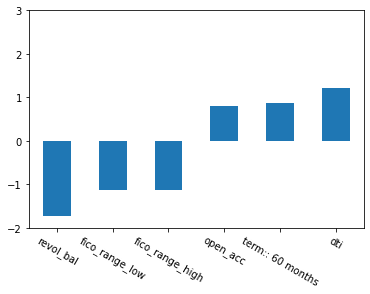

In [ ]:
## plot top 3 features with the most positive (and negative) weights
top_and_bottom_idx = list(np.argsort(l2_logistic['model'].coef_)[0,:3]) + list(np.argsort(l2_logistic['model'].coef_)[0,-3:])
bplot = pd.Series(l2_logistic['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-2,3))
p1.set_xticklabels(xticks)
plt.show()

In [ ]:
np.exp(l2_logistic['model'].coef_)
logisticCols = selected_features
logisticStd = np.std(data_dict['X_test'], axis=0)
logisticResultDf = pd.DataFrame()
logisticResultDf['Column'] = logisticCols
logisticResultDf['Coef'] = (l2_logistic['model'].coef_).reshape(-1,1)
logisticResultDf['StdDev'] = logisticStd

logisticResultDf['OddsChange'] = logisticResultDf.apply(lambda x: np.exp(x['Coef'] * x['StdDev']), axis=1)

logisticResultDf.sort_values(by='OddsChange').style.format({"OddsChange":"{:.2%}"})

,Column,Coef,StdDev,OddsChange
9,fico_range_low,-1.128330,0.158094,83.66%
8,fico_range_high,-1.122429,0.157244,83.82%
4,revol_bal,-1.728170,0.087397,85.98%
2,annual_inc,-1.067484,0.109633,88.96%
12,purpose::credit_card,-0.174138,0.411859,93.08%
41,home_ownership::MORTGAGE,-0.142611,0.498781,93.13%
11,cr_hist,-0.560153,0.124168,93.28%
36,emp_length::7 years,-0.017034,0.196194,99.67%
13,purpose::debt_consolidation,-0.005122,0.491161,99.75%
5,delinq_2yrs,-0.026132,0.056860,99.85%


### Decision tree

  Model: Decision tree
Fit time: 4.36 seconds
Optimal parameters:
{'min_samples_leaf': 800}

Accuracy-maximizing threshold was: 0.502106149957877
Accuracy:  0.6242
              precision    recall  f1-score   support

  No default     0.6315    0.7595    0.6896      5497
     Default     0.6099    0.4590    0.5238      4503

    accuracy                         0.6242     10000
   macro avg     0.6207    0.6093    0.6067     10000
weighted avg     0.6218    0.6242    0.6150     10000

Confusion matrix : 
 [[2067 2436]
 [1322 4175]]
Expected Value: 324.31


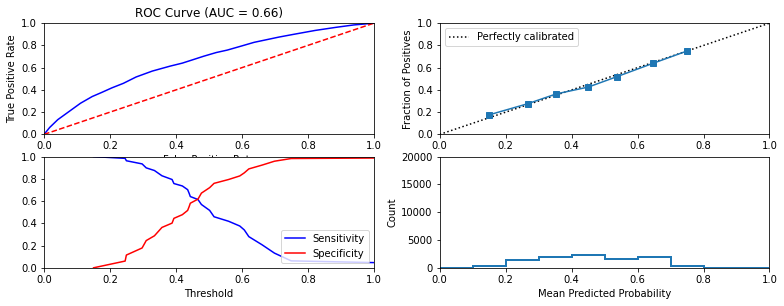


Similarity to LC grade ranking:  0.4231750241675093
Brier score: 0.22757460566511473


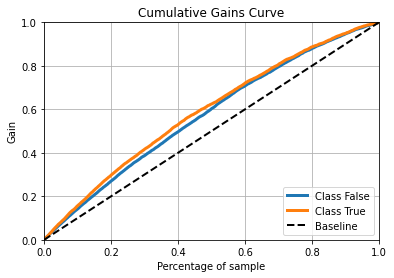

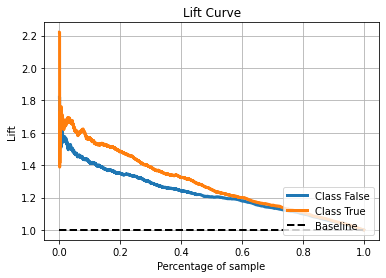

  Decile  Decile Lift
9      1     1.563402
8      2     1.491228
7      3     1.387964
6      4     1.328559
5      5     1.249833
4      6     1.198090
3      7     1.152248
2      8     1.107595
1      9     1.056580
0     10     1.000000
Were parameters on edge? : False
Score variations around CV search grid : 0.698762741201364
[0.62368 0.62324 0.62324 0.62396 0.62144 0.62092 0.62056 0.6196  0.62076]
324.30999999999995


In [ ]:
decision_tree = DecisionTreeClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

decision_tree, c_matrix = fit_classification(decision_tree, data_dict,
                          cv_parameters = cv_parameters, model_name = "Decision tree", output_confusion_matrix=True)

expectedValue = np.sum(c_matrix * confusion_cost)
print(expectedValue)

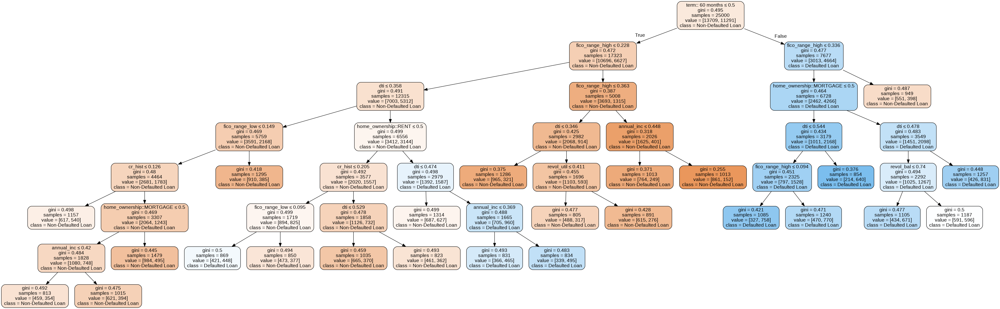

In [ ]:
# Visualize the decision tree
# Zooming-in is allowed by double click
from sklearn.externals.six import StringIO
import graphviz

target_names = ['Non-Defaulted Loan','Defaulted Loan']
dot_data = StringIO()
export_graphviz(decision_tree['model'], out_file=dot_data,
                feature_names=selected_features,filled=True, rounded=True, class_names=target_names,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### Random Forest

  Model: Random forest
Fit time: 50.64 seconds
Optimal parameters:
{'min_samples_leaf': 500}

Accuracy-maximizing threshold was: 0.4737748124131136
Accuracy:  0.6316
              precision    recall  f1-score   support

  No default     0.6487    0.7193    0.6822      5497
     Default     0.6049    0.5245    0.5618      4503

    accuracy                         0.6316     10000
   macro avg     0.6268    0.6219    0.6220     10000
weighted avg     0.6290    0.6316    0.6280     10000

Confusion matrix : 
 [[2362 2141]
 [1543 3954]]
Expected Value: 327.58


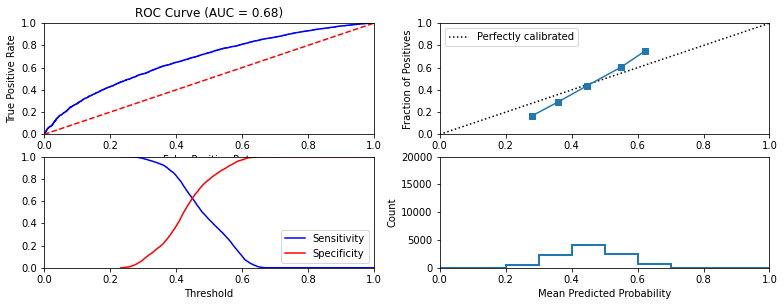


Similarity to LC grade ranking:  0.4554558304671575
Brier score: 0.22781367541326422


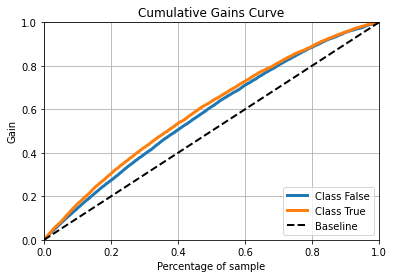

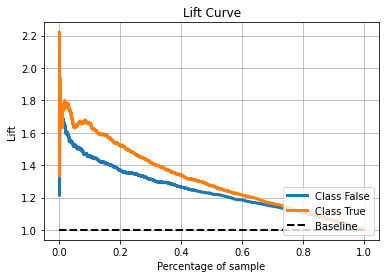

  Decile  Decile Lift
9      1     1.656673
8      2     1.521208
7      3     1.417573
6      4     1.339107
5      5     1.272929
4      6     1.215856
3      7     1.163986
2      8     1.112036
1      9     1.062255
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 1.2625940568805059
[0.62728 0.62532 0.62468 0.6234  0.62252 0.62068 0.61996 0.6196  0.61936]


In [ ]:
random_forest = RandomForestClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest, conf = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Random forest", output_confusion_matrix=True)

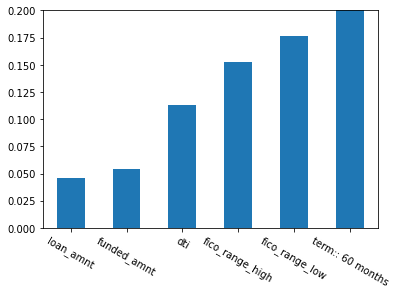

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(random_forest['model'].feature_importances_)[-6:]) 
bplot = pd.Series(random_forest['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.show()

### Bagged Trees

  Model: Bagged trees
Fit time: 229.5 seconds
Optimal parameters:
{'min_samples_leaf': 500}

Accuracy-maximizing threshold was: 0.46373978987612113
Accuracy:  0.6265
              precision    recall  f1-score   support

  No default     0.6567    0.6716    0.6641      5497
     Default     0.5877    0.5714    0.5794      4503

    accuracy                         0.6265     10000
   macro avg     0.6222    0.6215    0.6218     10000
weighted avg     0.6256    0.6265    0.6260     10000

Confusion matrix : 
 [[2573 1930]
 [1805 3692]]
Expected Value: 320.35


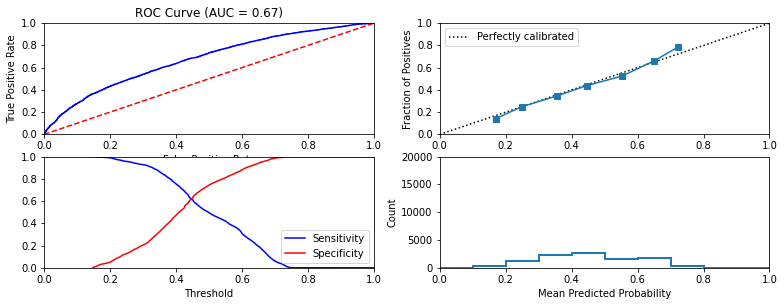


Similarity to LC grade ranking:  0.4491226377375594
Brier score: 0.2246386537084253


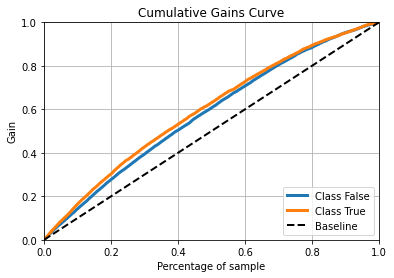

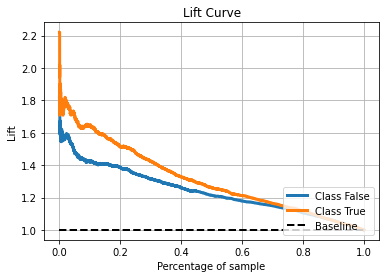

  Decile  Decile Lift
9      1     1.641128
8      2     1.513435
7      3     1.423495
6      4     1.326893
5      5     1.260493
4      6     1.212155
3      7     1.164303
2      8     1.117866
1      9     1.057320
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 1.304210193099086
[0.6318  0.62896 0.62724 0.62572 0.62664 0.6252  0.62396 0.62432 0.62356]


In [ ]:
random_forest = RandomForestClassifier(max_features = 1.0)
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

random_forest = fit_classification(random_forest, data_dict,
                          cv_parameters = cv_parameters, model_name = "Bagged trees", output_confusion_matrix=True)

### MLP

  Model: MLP Classifier
Fit time: 67.54 seconds
Optimal parameters:
{'activation': 'tanh'}

Accuracy-maximizing threshold was: 0.48826716748228444
Accuracy:  0.6361
              precision    recall  f1-score   support

  No default     0.6553    0.7131    0.6830      5497
     Default     0.6075    0.5421    0.5729      4503

    accuracy                         0.6361     10000
   macro avg     0.6314    0.6276    0.6280     10000
weighted avg     0.6338    0.6361    0.6334     10000

Confusion matrix : 
 [[2441 2062]
 [1577 3920]]
Expected Value: 330.77


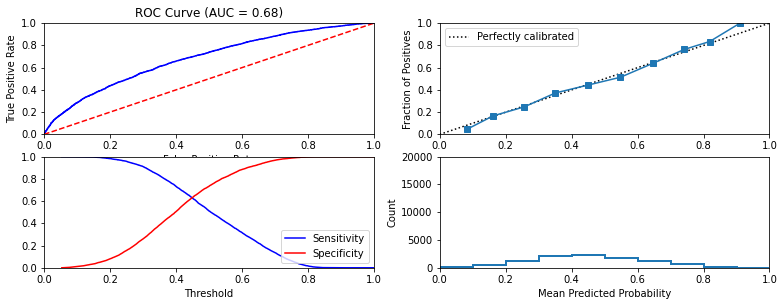


Similarity to LC grade ranking:  0.4872097293653847
Brier score: 0.2221027378294998


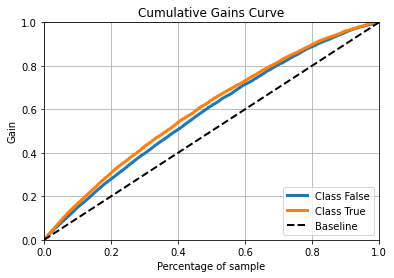

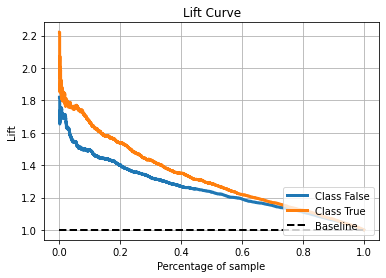

  Decile  Decile Lift
9      1     1.661115
8      2     1.537864
7      3     1.430158
6      4     1.349101
5      5     1.284921
4      6     1.218077
3      7     1.169379
2      8     1.122307
1      9     1.066943
0     10     1.000000
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.63928]


In [ ]:
mlp_classifier = MLPClassifier(random_state=1, max_iter=50,  
                      batch_size=100, hidden_layer_sizes=(100,), solver = 'sgd')

#cv_parameters = {'activation':['identity','tanh','relu','logistic']}
cv_parameters = {'activation':['tanh']}

mlp_classifier, c_matrix = fit_classification(mlp_classifier,data_dict,
                                         cv_parameters = cv_parameters,
                                         model_name = 'MLP Classifier', output_confusion_matrix = True)

In [ ]:
### Return a cost matrix
TP_Gain = 0.03 #return from safe investment
FN_Cost = -0.05
FP_Cost = 0 
TN_Gain = 0.092
confusion_cost = np.array([[TP_Gain,FN_Cost],[FP_Cost,TN_Gain]])
print(confusion_cost)
expectedValue = np.sum(c_matrix * confusion_cost)
print(expectedValue)

[[ 0.03  -0.05 ]
 [ 0.     0.092]]
330.77


## Step 5 - Perform K-Means classification on Logistic Regression coefficients
The goal is to identify "extreme" clusters of loans to explain logistic regression scores

In [ ]:
## Store logistic regression results
coefs = default_classifier['model'].coef_

x_data = data_dict['X_train']
y_data = data_dict['y_train']

# Standardize data for K means
x_transformed = np.multiply(x_data, coefs)
standard_scaler = StandardScaler()
x_scaled = standard_scaler.fit_transform(x_transformed)

## Store mean of each variable - this is so that we can measure each cluster's deviation from the "average" value of each feature later
mean_df = pd.DataFrame(x_scaled, columns=selected_features)
mean_df = mean_df.mean()

In [ ]:
# Run k means
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

kmeans = KMeans(n_clusters=n_clusters, **kmeans_kwargs)
# kmeans.fit(x_scaled)

# labels = kmeans.labels_

In [ ]:
min_clusters = 1
max_clusters = 15

# A list holds the SSE values for each k
sse = []
for k in range(min_clusters, max_clusters + 1):
    print("Cluster "+str(k))
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(x_scaled)
    sse.append(kmeans.inertia_)

Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
Cluster 6
Cluster 7
Cluster 8
Cluster 9
Cluster 10
Cluster 11
Cluster 12
Cluster 13
Cluster 14
Cluster 15


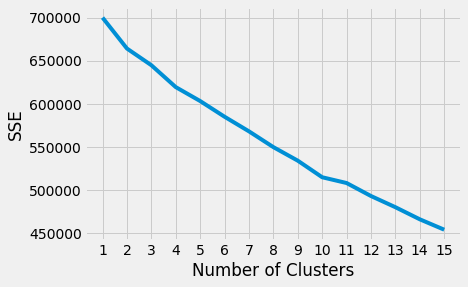

In [ ]:
## Use elbow method to find optimal cluster
plt.style.use("fivethirtyeight")
plt.plot(range(min_clusters, max_clusters + 1), sse)
plt.xticks(range(min_clusters, max_clusters+ 1))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
## Use Knee Locator to find actual optimal cluster
kl = KneeLocator(
    range(min_clusters, max_clusters + 1), sse, curve="convex", direction="decreasing"
)

final_num_clusters = kl.elbow
print(final_num_clusters)

# Re-run K Means with elbow point
kmeans = KMeans(n_clusters=final_num_clusters, **kmeans_kwargs)
kmeans.fit(x_scaled)

10


KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300,
       n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [ ]:
## Calculate average return of each cluster
kmeans_df = pd.DataFrame(x_data, columns=selected_features)

kmeans_df['label'] = kmeans.labels_
kmeans_df['default_prediction'] = default_classifier['model'].predict_proba(x_data)[:,0]

default_classifier['model'].predict_proba(x_data)[:,0].mean()

grouped = kmeans_df.groupby(by='label').agg({
    'label':'count',
    'default_prediction':'mean'
}).sort_values(by='default_prediction')
print(grouped)

       label  default_prediction
label                           
7       1334            0.663741
2        736            0.667164
1       3970            0.668839
4       1080            0.676359
8       1406            0.682376
0        942            0.684235
3       1434            0.688217
6       1146            0.689906
5       1024            0.694338
9       6928            0.728277


In [ ]:
## Store label of high default and low default clusters
min_default_label = grouped.index[0]
print(min_default_label)

max_default_label = grouped.index[-1]
print(max_default_label)

7
9


In [ ]:
## Store cluster centers
centers = kmeans.cluster_centers_
centers_df = pd.DataFrame((centers), columns = selected_features)
centers_df['label'] = range(final_num_clusters)

## Examine which features "define" the min and max cluster
## These are commented out for space - uncomment the below to see results
print(abs(centers_df - mean_df).iloc[min_default_label,:].sort_values(ascending=False))
## Annual income, credit history

abs(centers_df - mean_df).iloc[max_default_label,:].sort_values(ascending=False)
## Revol bal, revol util, fico high, dti, 

emp_length::< 1 year                    3.657615
emp_length::10+ years                   0.689149
emp_length::5 years                     0.285670
emp_length::3 years                     0.284131
cr_hist                                 0.269948
emp_length::6 years                     0.263556
emp_length::7 years                     0.253093
emp_length::4 years                     0.245170
purpose::home_improvement               0.240319
verification_status::Source Verified    0.229513
emp_length::8 years                     0.224544
annual_inc                              0.211995
emp_length::nan                         0.202658
emp_length::9 years                     0.195464
loan_amnt                               0.144788
revol_bal                               0.142149
verification_status::Verified           0.106869
purpose::moving                         0.104641
open_acc                                0.084132
dti                                     0.075861
pub_rec             

purpose::debt_consolidation             0.818342
purpose::credit_card                    0.550546
emp_length::10+ years                   0.547598
emp_length::5 years                     0.285670
emp_length::3 years                     0.284131
emp_length::< 1 year                    0.273402
emp_length::7 years                     0.253093
emp_length::4 years                     0.245170
purpose::home_improvement               0.240319
emp_length::8 years                     0.224544
purpose::other                          0.218583
emp_length::9 years                     0.195464
emp_length::6 years                     0.180351
loan_amnt                               0.156546
cr_hist                                 0.144804
purpose::major_purchase                 0.137101
term:: 60 months                        0.112873
revol_bal                               0.112008
dti                                     0.102352
verification_status::Verified           0.100493
emp_length::nan     

In [ ]:
## Plot the chosen centers (chosen based on output of the above cell, excluding categorical variables)
centers_to_plot = ['dti','fico_range_high','revol_bal','revol_util','loan_amnt','annual_inc','cr_hist','label']

In [ ]:
## Only color the min and max default clusters - make everything else black
color_list = ['k']*final_num_clusters
color_list[min_default_label] = 'g'
color_list[max_default_label] = 'r'

Examine the separation of red and green clusters, which are two extremes. As can be seen below, the red cluster has higher fico scores and less revolving balance, thus characterizing safer loans. On the other hand, the green cluster has lower fico scores and higher revolving balance, characterizing riskier loans.

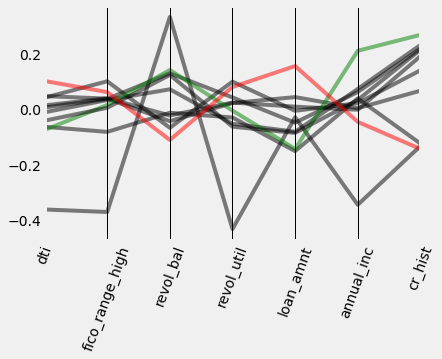

In [ ]:
## Plot the centroids of the clusters - see how the separation occurs in the green and red cluster
ax = pd.plotting.parallel_coordinates(
    centers_df[centers_to_plot], 'label',
    color=color_list,
    alpha = 0.5
)
ax.legend().set_visible(False)
plt.xticks(rotation=70)
plt.show()

# Phase 4 - Picking Loans using Regression of Loan Returns
This phase carries out the following steps

  1. Reads the saved pickle data. Re-run the classification models and check their stability over time
  2. Using only variables available at the time of loan application, predicts the returns on the loans
  3. Uses the regressions for returns and the classification models from before for implementimg some simple strategies for picking loans to invest in. 
  4. Tests these strategies on a portfolio of 100 loans
  5. Re-run the test strategies on different test and train sets from different time periods
  6. Performs a sensitivity analysis of the performance of the loan to the number of loans invested in from 100 to 1000

In [ ]:
## Change these variables when running the notebook from a new location
# data_dir should be the directory of the zip files
# pickle_input should be the location of the 201516_ret.pickle file

root_dir = "/content/drive/My Drive/BVIA Group 4/"
data_dir = root_dir + "Data/"
pickle_input_201516 = root_dir + "Pickle/201516_ret.pickle"
pickle_input_201213 = root_dir + "Pickle/201213_ret.pickle"

In [ ]:
# read saved models after you have run some of the more time consuming ones and saved them
path = root_dir + "saved_models/week4_saved_models"   
infile = open(path,'rb')
saved_models = pickle.load(infile)
models_to_save = saved_models.copy() # save new models in this new dict
infile.close()
print('models loaded:\n', saved_models.keys())

models loaded:
 dict_keys(['ridge_clf07', 'gnb07', 'l1_logistic07', 'dt07', 'rf07', 'bt07', 'mlp07', 'gnb13', 'l1_logistic13', 'l2_logistic13', 'dt13', 'rf13', 'mlp13', 'l2_logistic07', 'reg_mlp15_df', 'reg_rf15', 'reg_mlp12', 'reg_rf12', 'reg_mlp12_df', 'reg_rf12_df', 'reg_mlp15', 'reg_rf15_df'])


In [ ]:
# Define a function that, given a CVGridSearch object, finds the
# percentage difference between the best and worst scores
def find_score_variation(cv_model):
    all_scores = cv_model.cv_results_['mean_test_score']
    return( np.abs((max(all_scores) - min(all_scores))) * 100 / max(all_scores) )

    '''
    which_min_score = np.argmin(all_scores)
    
    all_perc_diff = []
    
    try:
        all_perc_diff.append( np.abs(all_scores[which_min_score - 1] - all_scores[which_min_score])*100 / min(all_scores) )
    except:
        pass
    
    try:
        all_perc_diff.append( np.abs(all_scores[which_min_score + 1] - all_scores[which_min_score])*100 / min(all_scores) )
    except:
        pass
    
    return ( np.mean(all_perc_diff) )
    '''

# Define a function that checks, given a CVGridSearch object,
# whether the optimal parameters lie on the edge of the search
# grid
def find_opt_params_on_edge(cv_model):
    out = False
    
    for i in cv_model.param_grid:
        if cv_model.best_params_[i] in [ cv_model.param_grid[i][0], cv_model.param_grid[i][-1] ]:
            out = True
            break
            
    return out

## Define a default random seed and an output file

In [ ]:
default_seed = 1
output_file = "output_sample"

In [ ]:
# Create a function to print a line to our output file
def dump_to_output(key, value):
    with open(output_file, "a") as f:
        f.write(",".join([str(default_seed), key, str(value)]) + "\n")

## 0.05 Downsample function

The following functions are used to downsample the loans to make them class-balance.

In [ ]:
def returnCounts(data):
  TCount = len(data)
  FCount = data.loan_status.str.contains('Fully Paid').sum()
  CCount = data.loan_status.str.contains('Charged Off').sum()
  DCount = data.loan_status.str.contains('Default').sum()
  DProp = 1-(FCount/TCount)

  print("Total count: %d" %(TCount))
  print("Fully Paid count: %d" %(FCount))
  print("Charged off count: %d" %(CCount))
  print("Default count: %d" %(DCount))
  print("Proportion of Charged off + Default: %.2f" %(DProp))
  return TCount, FCount, CCount, DCount, DProp

In [ ]:
def downsample(data, delProp = 0.7):
  dataCopy = data.copy()
  indexNames = dataCopy[dataCopy['loan_status'] == "Fully Paid" ].index #pull indexes of fully paid rows
  
  print("Before downsample:")
  TCount, FCount, CCount, DCount, DProp = returnCounts(dataCopy)

  delRowCount = int(delProp*FCount) 
  random.seed(4)
  dataCopy=dataCopy.drop(random.sample(set(indexNames), delRowCount)) #remove ~70% of the 'fully paid' entries

  print("\nAfter downsample:")
  TCount, FCount, CCount, DCount, DProp = returnCounts(dataCopy)

  return dataCopy

## 0.1 Load the data (2012-2013) and engineer the features

In [ ]:
# Read the data and features from the pickle
data12, discrete_features, continuous_features, ret_cols = pickle.load( open( pickle_input_201213, "rb" ) )

#data = data12.copy()
data = downsample(data12, delProp = 0.75)

# Remove Fico from data

continuous_features = [i for i in continuous_features if i not in ['fico_range_low']]  

# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')


# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

Before downsample:
Total count: 187846
Fully Paid count: 158353
Charged off count: 29493
Default count: 0
Proportion of Charged off + Default: 0.16

After downsample:
Total count: 69082
Fully Paid count: 39589
Charged off count: 29493
Default count: 0
Proportion of Charged off + Default: 0.43


In [ ]:
## STORE PROPORTION OF DEFAULT
train_default = 0.43
train_not_default = 0.57

actual_default = 0.16
actual_not_default = 0.84

## 0.2 Prepare functions to fit and evaluate models

In [ ]:
def prepare_data(data_subset = np.array([True]*len(data)),
                    n_samples_train = 20000,
                    n_samples_test = 10000,
                    feature_subset = None,
                    date_range_train = (data.issue_d.min(), data.issue_d.max()),
                    date_range_test = (data.issue_d.min(), data.issue_d.max()),
                    random_state = default_seed):
    '''
    This function will prepare the data for classification or regression.
    It expects the following parameters:
      - data_subset: a numpy array with as many entries as rows in the
                     dataset. Each entry should be True if that rowFdecisipn
                     should be used, or False if it should be ignored
      - n_samples_train: the total number of samples to be used for training.
                         Will trigger an error if this number is larger than
                         the number of rows available after all filters have
                         been applied
      - n_samples_test: as above for testing
      - feature_subect: A list containing the names of the features to be
                        used in the model. In None, all features in X are
                        used
      - date_range_train: a tuple containing two dates. All rows with loans
                          issued outside of these two dates will be ignored in
                          training
      - date_range_test: as above for testing
      - random_state: the random seed to use when selecting a subset of rows
      
    Note that this function assumes the data has a "Train" column, and will
    select all training rows from the rows with "True" in that column, and all
    the testing rows from those with a "False" in that column.
    
    This function returns a dictionary with the following entries
      - X_train: the matrix of training data
      - y_train: the array of training labels
      - train_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the train set
      - X_test: the matrix of testing data
      - y_test: the array of testing labels
      - test_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the test set
    '''
    
    np.random.seed(random_state)
    
    # Filter down the data to the required date range, and downsample
    # as required
#     print("sizes:", train.shape[0], data.shape[0], data_subset.shape[0])
    filter_train = ( train & (data.issue_d >= date_range_train[0]) &
                            (data.issue_d <= date_range_train[1]) & data_subset ).values
    filter_test = ( (train == False) & (data.issue_d >= date_range_test[0])
                            & (data.issue_d <= date_range_test[1]) & data_subset ).values
    
    filter_train[ np.random.choice( np.where(filter_train)[0], size = filter_train.sum() 
                                   - n_samples_train, replace = False ) ] = False
    filter_test[ np.random.choice( np.where(filter_test)[0], size = filter_test.sum() 
                                   - n_samples_test, replace = False ) ] = False
    
    # Prepare the training and test set
    X_train = X[ filter_train , :]
    X_test = X[ filter_test, :]
    if feature_subset != None:
        cols = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in feature_subset]
        X_train = X_train[ : , cols ]
        X_test = X_test[ : , cols ]
        
    y_train = y[ filter_train ]
    y_test = y[ filter_test ]
    
    # Scale the variables
    scaler = preprocessing.MinMaxScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # return training and testing data
    out = {'X_train':X_train, 'y_train':y_train, 'train_set':filter_train, 
           'X_test':X_test, 'y_test':y_test, 'test_set':filter_test}
    
    return out

In [ ]:
def fit_classification(model, data_dict,
                          cv_parameters = {},
                          model_name = None,
                          random_state = default_seed,
                          output_to_file = True,
                          print_to_screen = True):
    '''
    This function will fit a classification model to data and print various evaluation
    measures. It expects the following parameters
      - model: an sklearn model object
      - data_dict: the dictionary containing both training and testing data;
                   returned by the prepare_data function
      - cv_parameters: a dictionary of parameters that should be optimized
                       over using cross-validation. Specifically, each named
                       entry in the dictionary should correspond to a parameter,
                       and each element should be a list containing the values
                       to optimize over
      - model_name: the name of the model being fit, for printouts
      - random_state: the random seed to use
      - output_to_file: if the results will be saved to the output file
      - print_to_screen: if the results will be printed on screen
    
    If the model provided does not have a predict_proba function, we will
    simply print accuracy diagnostics and return.
    
    If the model provided does have a predict_proba function, we first
    figure out the optimal threshold that maximizes the accuracy and
    print out accuracy diagnostics. We then print an ROC curve, sensitivity/
    specificity curve, and calibration curve.
    
    This function returns a dictionary with the following entries
      - model: the best fitted model
      - y_pred: predictions for the test set
      - y_pred_probs: probability predictions for the test set, if the model
                      supports them
      - y_pred_score: prediction scores for the test set, if the model does not 
                      output probabilities.
    '''
        
    np.random.seed(random_state)
    
    # --------------------------
    #   Step 1 - Load the data
    # --------------------------
    X_train = data_dict['X_train']
    y_train = data_dict['y_train']
    
    X_test = data_dict['X_test']
    y_test = data_dict['y_test']
    
    filter_train = data_dict['train_set']    
  
    # --------------------------
    #   Step 2 - Fit the model
    # --------------------------

    cv_model = GridSearchCV(model, cv_parameters)
    
    start_time = time.time()
    cv_model.fit(X_train, y_train)
    end_time = time.time()
    
    best_model = cv_model.best_estimator_
    
    if print_to_screen:

        if model_name != None:
            print("=========================================================")
            print("  Model: " + model_name)
            print("=========================================================")

        print("Fit time: " + str(round(end_time - start_time, 2)) + " seconds")
        print("Optimal parameters:")
        print(cv_model.best_params_)
        print("")
    
    # -------------------------------
    #   Step 3 - Evaluate the model
    # -------------------------------
    
    # If possible, make probability predictions
    try:
        y_pred_probs = best_model.predict_proba(X_test)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
        
        probs_predicted = True
    except:
        probs_predicted = False
    
    # Make predictions; if we were able to find probabilities, use
    # the threshold that maximizes the accuracy in the training set.
    # If not, just use the learner's predict function
    if probs_predicted:
        y_train_pred_probs = best_model.predict_proba(X_train)[:,1]
        fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_probs)
        
        true_pos_train = tpr_train*(y_train.sum())
        true_neg_train = (1 - fpr_train) *(1-y_train).sum()
        
        best_threshold_index = np.argmax(true_pos_train + true_neg_train)
        best_threshold = 1 if best_threshold_index == 0 else thresholds_train[ best_threshold_index ]
        
        if print_to_screen:
            print("Accuracy-maximizing threshold was: " + str(best_threshold))
        
        y_pred = (y_pred_probs > best_threshold)
    else:
        y_pred = best_model.predict(X_test)
    
    if print_to_screen:
        print("Accuracy: ", accuracy_score(y_test, y_pred))
        print(classification_report(y_test, y_pred, target_names =['No default', 'Default'], digits = 4))

    if print_to_screen:
        if probs_predicted:        
            plt.figure(figsize = (13, 4.5))
            plt.subplot(2, 2, 1)

            plt.title("ROC Curve (AUC = %0.2f)"% roc_auc_score(y_test, y_pred_probs))
            plt.plot(fpr, tpr, 'b')
            plt.plot([0,1],[0,1],'r--')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.ylabel('True Positive Rate')
            plt.xlabel('False Positive Rate')

            plt.subplot(2, 2, 3)

            plt.plot(thresholds, tpr, 'b', label = 'Sensitivity')
            plt.plot(thresholds, 1 -fpr, 'r', label = 'Specificity')
            plt.legend(loc = 'lower right')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.xlabel('Threshold')

            plt.subplot(2, 2, 2)

            fp_0, mpv_0 = calibration_curve(y_test, y_pred_probs, n_bins = 10)
            plt.plot([0,1], [0,1], 'k:', label='Perfectly calibrated')
            plt.plot(mpv_0, fp_0, 's-')
            plt.ylabel('Fraction of Positives')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.legend(loc ='upper left')
            
            plt.subplot(2, 2, 4)
            plt.hist(y_pred_probs, range=(0, 1), bins=10, histtype="step", lw=2)
            plt.xlim([0,1]); plt.ylim([0,20000])
            plt.xlabel('Mean Predicted Probability')
            plt.ylabel('Count')
            
            #plt.tight_layout()
            plt.show()
        
    # Additional Score Check
    if probs_predicted:
        y_train_score = y_train_pred_probs
    else:
        y_train_score = best_model.decision_function(X_train)
        
    tau, p_value = kendalltau(y_train_score, data.grade[filter_train])
    if print_to_screen:
        print("")
        print("Similarity to LC grade ranking: ", tau)
    
    if probs_predicted:
        brier_score = brier_score_loss(y_test, y_pred_probs)
        if print_to_screen:
            print("Brier score:", brier_score)
    
    # Return the model predictions, and the
    # test set
    # -------------------------------------
    out = {'model':best_model, 'y_pred_labels':y_pred}
    
    if probs_predicted:
        out.update({'y_pred_probs':y_pred_probs})
    else:
        y_pred_score = best_model.decision_function(X_test)
        out.update({'y_pred_score':y_pred_score})
        
    # Output results to file
    # ----------------------
    if probs_predicted and output_to_file:
        # Check whether any of the CV parameters are on the edge of
        # the search space
        opt_params_on_edge = find_opt_params_on_edge(cv_model)
        dump_to_output(model_name + "::search_on_edge", opt_params_on_edge)
        if print_to_screen:
            print("Were parameters on edge? : " + str(opt_params_on_edge))
        
        # Find out how different the scores are for the different values
        # tested for by cross-validation. If they're not too different, then
        # even if the parameters are off the edge of the search grid, we should
        # be ok
        score_variation = find_score_variation(cv_model)
        dump_to_output(model_name + "::score_variation", score_variation)
        if print_to_screen:
            print("Score variations around CV search grid : " + str(score_variation))
        
        # Print out all the scores
        dump_to_output(model_name + "::all_cv_scores", str(cv_model.cv_results_['mean_test_score']))
        if print_to_screen:
            print( str(cv_model.cv_results_['mean_test_score']) )
        
        # Dump the AUC to file
        dump_to_output(model_name + "::roc_auc", roc_auc_score(y_test, y_pred_probs) )
        
    return out

## 0.3 Models without grade or interest rate

In [ ]:
final_features = [i for i in discrete_features + continuous_features if i not in ["grade", "int_rate", "installment"]]
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]

## useful when choosing the most significant features
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)
selected_features12 = selected_features.copy()

In [ ]:
## Process data here:
data_dict12 = prepare_data(data_subset = np.array([True]*len(data)), feature_subset = final_features)

### 0.3.1 Ridge Classifier

In [ ]:
cv_parameters = {"alpha":np.logspace(-4, 4, num = 10)}
# cv_parameters = {"alpha":[0.0001]}
ridge_clf07 = fit_classification(RidgeClassifier(), data_dict12, 
                             cv_parameters = cv_parameters, model_name = "Ridge Classifier")

  Model: Ridge Classifier
Fit time: 1.45 seconds
Optimal parameters:
{'alpha': 2.782559402207126}

Accuracy:  0.6362
              precision    recall  f1-score   support

  No default     0.6449    0.7878    0.7092      5631
     Default     0.6171    0.4408    0.5143      4369

    accuracy                         0.6362     10000
   macro avg     0.6310    0.6143    0.6117     10000
weighted avg     0.6327    0.6362    0.6240     10000


Similarity to LC grade ranking:  0.5175665799676636


In [ ]:
models_to_save['ridge_clf07'] = ridge_clf07

### 0.3.2 Naive Bayes

  Model: Gaussian Naive Bayes
Fit time: 0.12 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.34467586371308284
Accuracy:  0.6114
              precision    recall  f1-score   support

  No default     0.6308    0.7475    0.6842      5631
     Default     0.5726    0.4360    0.4951      4369

    accuracy                         0.6114     10000
   macro avg     0.6017    0.5917    0.5896     10000
weighted avg     0.6053    0.6114    0.6015     10000



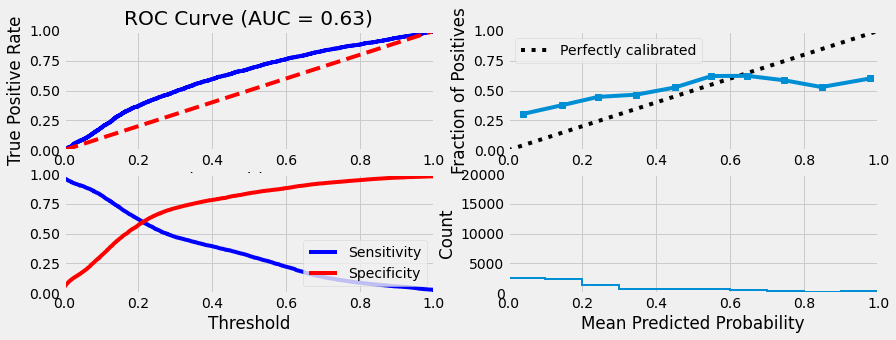


Similarity to LC grade ranking:  0.39045323868097953
Brier score: 0.28128092182782577
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.60745]


In [ ]:
gnb07 = fit_classification(GaussianNB(), data_dict12,
                model_name = "Gaussian Naive Bayes")

In [ ]:
models_to_save['gnb07'] = gnb07

### 0.3.3 $l_1$ penalized logistic regression

In [ ]:
l1_logistic07 = saved_models['l1_logistic07']

  Model: l1 Penalized Logistic Regression
Fit time: 108.16 seconds
Optimal parameters:
{'C': 1.0}

Accuracy-maximizing threshold was: 0.5002938335212219
Accuracy:  0.6378
              precision    recall  f1-score   support

  No default     0.6468    0.7858    0.7096      5631
     Default     0.6182    0.4470    0.5189      4369

    accuracy                         0.6378     10000
   macro avg     0.6325    0.6164    0.6142     10000
weighted avg     0.6343    0.6378    0.6263     10000



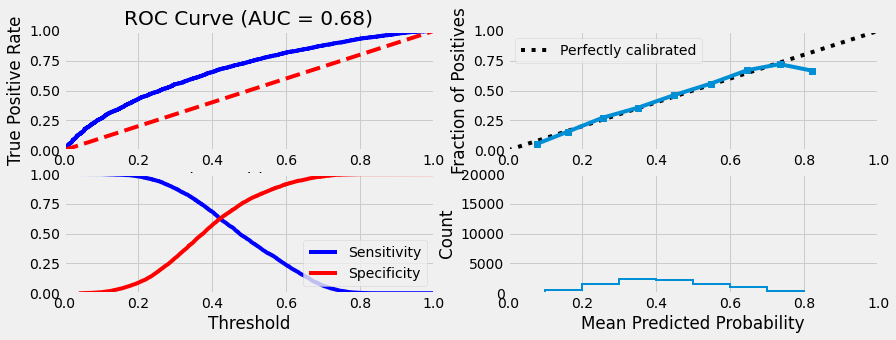


Similarity to LC grade ranking:  0.5207844543687432
Brier score: 0.2230757998554112
Were parameters on edge? : True
Score variations around CV search grid : 0.12571697964956752
[0.63635 0.6357  0.6357  0.63555 0.6356  0.6356  0.63555 0.6356  0.6356
 0.6356 ]


In [ ]:
l1_logistic = LogisticRegression(penalty = 'l1',solver='liblinear')
cv_parameters = {"C":np.logspace(0, 6, num = 10)}
l1_logistic07 = fit_classification(l1_logistic, data_dict12,
                        cv_parameters = cv_parameters, model_name = "l1 Penalized Logistic Regression")

In [ ]:
models_to_save['l1_logistic07'] = l1_logistic07

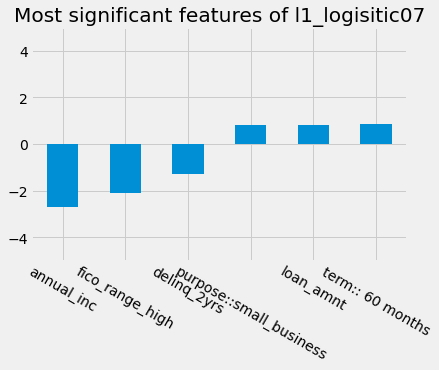

In [ ]:
## plot top 3 features with the most positive (and negative) weights 
top_and_bottom_idx = list(np.argsort(l1_logistic07['model'].coef_)[0,:3]) + list(np.argsort(l1_logistic07['model'].coef_)[0,-3:])
bplot = pd.Series(l1_logistic07['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-5,5))
p1.set_xticklabels(xticks)
plt.title('Most significant features of l1_logisitic07')
plt.show()

### 0.3.4 $l_2$ penalized logistic regression

In [ ]:
#l2_logistic07 = saved_models['l2_logistic07']

  Model: l2 Penalized Logistic Regression
Fit time: 12.42 seconds
Optimal parameters:
{'C': 2.782559402207126}

Accuracy-maximizing threshold was: 0.5011775147004206
Accuracy:  0.638
              precision    recall  f1-score   support

  No default     0.6470    0.7860    0.7097      5631
     Default     0.6186    0.4472    0.5191      4369

    accuracy                         0.6380     10000
   macro avg     0.6328    0.6166    0.6144     10000
weighted avg     0.6346    0.6380    0.6265     10000



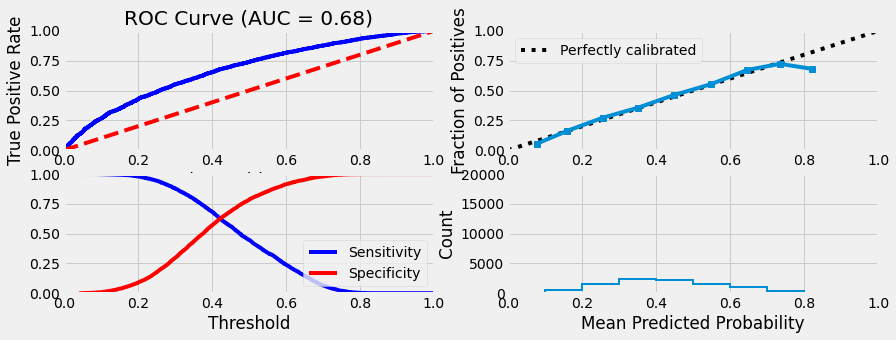


Similarity to LC grade ranking:  0.5200546961459682
Brier score: 0.22311499359037776
Were parameters on edge? : False
Score variations around CV search grid : 9.56761006289306
[0.57515 0.5992  0.6264  0.63425 0.6359  0.636   0.63565 0.63595 0.6359
 0.63585]


In [ ]:
l2_logistic07 = LogisticRegression(penalty = 'l2')
cv_parameters = {"C":np.logspace(-4, 4, num = 10)}

l2_logistic07 = fit_classification(l2_logistic07, data_dict12,
                        cv_parameters = cv_parameters, model_name = "l2 Penalized Logistic Regression")

In [ ]:
models_to_save['l2_logistic07'] = l2_logistic07

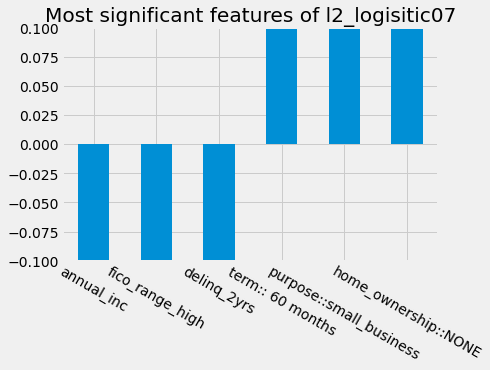

In [ ]:
## plot top 3 features with the most positive (and negative) weights 
top_and_bottom_idx = list(np.argsort(l2_logistic07['model'].coef_)[0,:3]) + list(np.argsort(l2_logistic07['model'].coef_)[0,-3:])
bplot = pd.Series(l2_logistic07['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-0.1,0.1))
p1.set_xticklabels(xticks)
plt.title('Most significant features of l2_logisitic07')
plt.show()

In [ ]:
coef_table = pd.DataFrame({"feature": selected_features[top_and_bottom_idx], "coeff": l2_logistic07['model'].coef_[0,top_and_bottom_idx]})
print(coef_table)

                    feature     coeff
2                annual_inc -2.726818
8           fico_range_high -2.103221
5               delinq_2yrs -1.552372
43         term:: 60 months  0.843774
23  purpose::small_business  0.882128
27     home_ownership::NONE  0.984472


### 0.3.5 Decision tree

  Model: Decision tree
Fit time: 3.07 seconds
Optimal parameters:
{'min_samples_leaf': 1000}

Accuracy-maximizing threshold was: 0.5372549019607843
Accuracy:  0.6167
              precision    recall  f1-score   support

  No default     0.6121    0.8718    0.7192      5631
     Default     0.6354    0.2879    0.3963      4369

    accuracy                         0.6167     10000
   macro avg     0.6237    0.5799    0.5577     10000
weighted avg     0.6223    0.6167    0.5781     10000



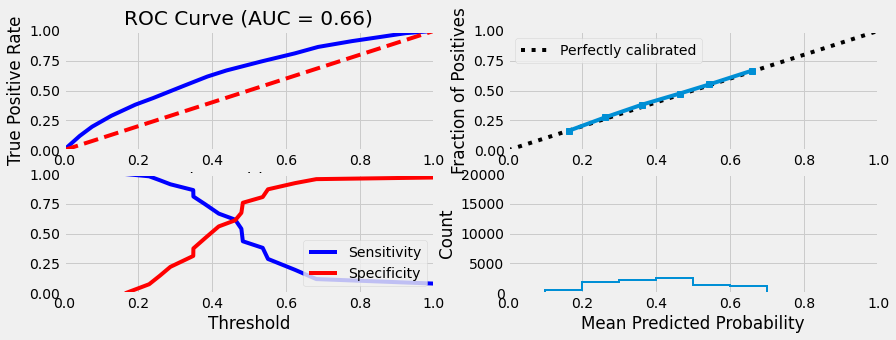


Similarity to LC grade ranking:  0.46503774528835484
Brier score: 0.22764070248707408
Were parameters on edge? : False
Score variations around CV search grid : 0.8228808820004774
[0.6212  0.6236  0.6251  0.62485 0.6247  0.62585 0.62585 0.62175 0.6207 ]


In [ ]:
decision_tree = DecisionTreeClassifier()
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}

dt07 = fit_classification(decision_tree, data_dict12, 
                          cv_parameters = cv_parameters, model_name = "Decision tree")

In [ ]:
models_to_save['dt07'] = dt07

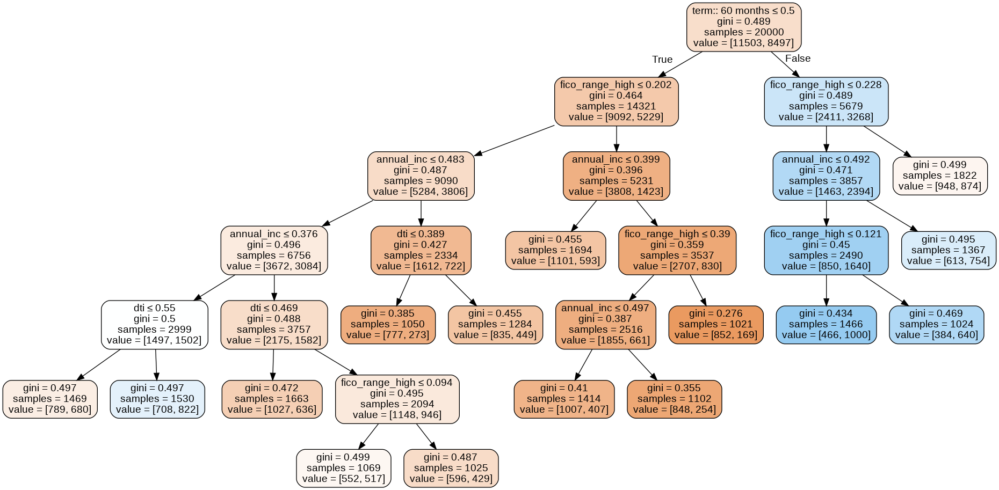

In [ ]:
# Visualize the decision tree
# Zooming-in is allowed by double click
from sklearn.externals.six import StringIO 
import graphviz

dot_data = StringIO()
export_graphviz(dt07['model'], out_file=dot_data,  
                feature_names=selected_features,filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Note that due to the fact that the number of 5-year loans is significantly smaller than that of 3-year loans, the decision tree model made the first split based on the loan term. To offset that effect, the rules we considered for the strategy in the next step included only split decisions made at second nodes forward

### ($\star$) 0.3.6 Random forest


In [ ]:
# Read models saved in a dictionary
#rf07 = saved_models['rf07']

  Model: Random forest
Fit time: 439.91 seconds
Optimal parameters:
{'min_samples_leaf': 8, 'n_estimators': 150}

Accuracy-maximizing threshold was: 0.4458277049145011
Accuracy:  0.6236
              precision    recall  f1-score   support

  No default     0.6655    0.6667    0.6661      5631
     Default     0.5694    0.5681    0.5687      4369

    accuracy                         0.6236     10000
   macro avg     0.6174    0.6174    0.6174     10000
weighted avg     0.6235    0.6236    0.6236     10000



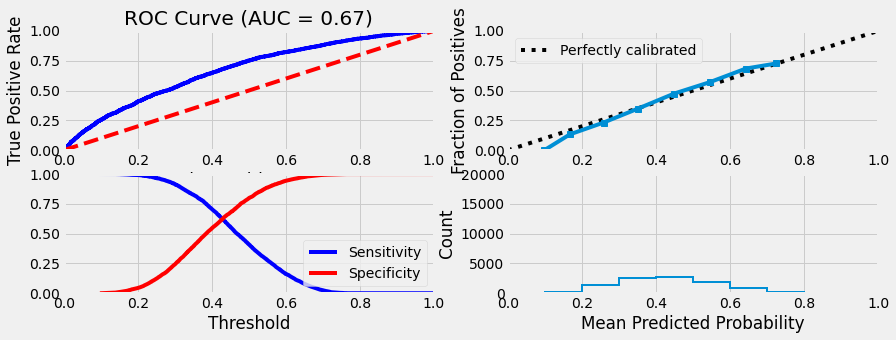


Similarity to LC grade ranking:  0.4646688257212322
Brier score: 0.22460299744015502
Were parameters on edge? : True
Score variations around CV search grid : 2.6699220288257104
[0.6179  0.61935 0.62555 0.62515 0.62845 0.6188  0.62905 0.6269  0.6299
 0.62835 0.62525 0.629   0.6278  0.6315  0.63175 0.62625 0.6284  0.63285
 0.63225 0.6328  0.6288  0.63315 0.63195 0.63305 0.63485 0.6329  0.6327
 0.63345 0.6337  0.634   0.63025 0.63375 0.63265 0.63315 0.63395 0.6311
 0.6348  0.6312  0.6331  0.63285 0.6306  0.6309  0.63095 0.6332  0.6309 ]


In [ ]:
random_forest = RandomForestClassifier()
cv_parameters = {'min_samples_leaf':[1, 2, 3, 5, 8, 13, 17, 20, 40], 'n_estimators': [35, 60, 80, 100, 150] }

rf07 = fit_classification(random_forest, data_dict12,
                                   cv_parameters=cv_parameters, model_name="Random forest")

In [ ]:
#store the model
models_to_save['rf07'] = rf07

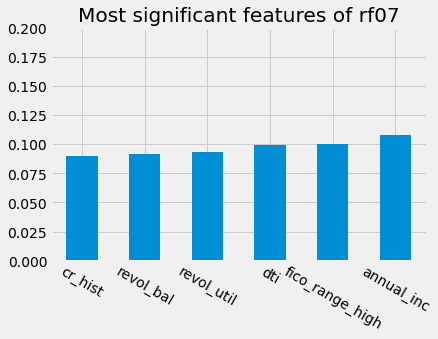

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(rf07['model'].feature_importances_)[-6:]) 
bplot = pd.Series(rf07['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.title('Most significant features of rf07')
plt.show()

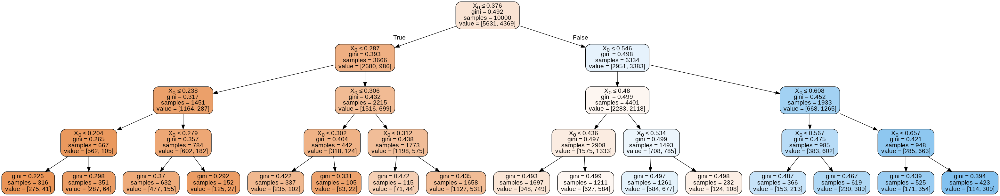

In [ ]:
## A decision tree trained on the scores of random forest
trepin_tree = DecisionTreeClassifier(min_samples_leaf = 100, max_depth = 4)
trepin_tree.fit(rf07['y_pred_probs'].reshape(-1,1),data_dict12['y_test'])
dot_data = StringIO()
export_graphviz(trepin_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### ($\star$) 0.3.7 Bagged trees
Takes a very long time for the whole LC data set! 

In [ ]:
# Read models aved in a dictionary
#bt07 = saved_models['bt07']

  Model: Bagged trees
Fit time: 75.31 seconds
Optimal parameters:
{'min_samples_leaf': 50, 'n_estimators': 150}

Accuracy-maximizing threshold was: 0.4702044668614536
Accuracy:  0.6259
              precision    recall  f1-score   support

  No default     0.6556    0.7072    0.6804      5631
     Default     0.5800    0.5212    0.5490      4369

    accuracy                         0.6259     10000
   macro avg     0.6178    0.6142    0.6147     10000
weighted avg     0.6226    0.6259    0.6230     10000



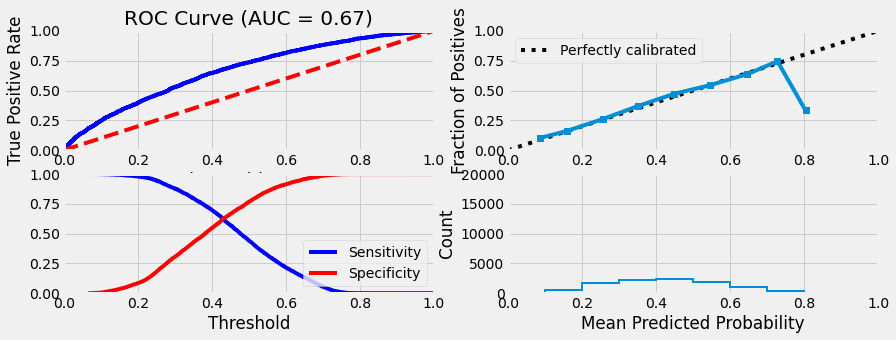


Similarity to LC grade ranking:  0.4898936275105078
Brier score: 0.22492851215026993
Were parameters on edge? : True
Score variations around CV search grid : 0.0
[0.63185]
time elapsed 76.84788179397583


In [ ]:
start = time.time()
bt07 = RandomForestClassifier(max_features = 1.0)
#cv_parameters = {'min_samples_leaf':[5, 10, 25, 50, 75, 100, 200], 'n_estimators': [60, 100, 150, 200, 300]}
cv_parameters = {'min_samples_leaf':[50], 'n_estimators': [150]}


bt07 = fit_classification(bt07, data_dict12,
                                    cv_parameters=cv_parameters, model_name="Bagged trees")
print("time elapsed",time.time()-start)

In [ ]:
models_to_save['bt07'] = bt07

### 0.3.8 Multi-layer perceptron

In [ ]:
# Read model saved in a dictionary
#mlp07 = saved_models['mlp07']

  Model: Multi-Layer Perceptron
Fit time: 304.1 seconds
Optimal parameters:
{'hidden_layer_sizes': 10}

Accuracy-maximizing threshold was: 0.47062561323359425
Accuracy:  0.628
              precision    recall  f1-score   support

  No default     0.6497    0.7365    0.6904      5631
     Default     0.5897    0.4882    0.5342      4369

    accuracy                         0.6280     10000
   macro avg     0.6197    0.6123    0.6123     10000
weighted avg     0.6235    0.6280    0.6221     10000



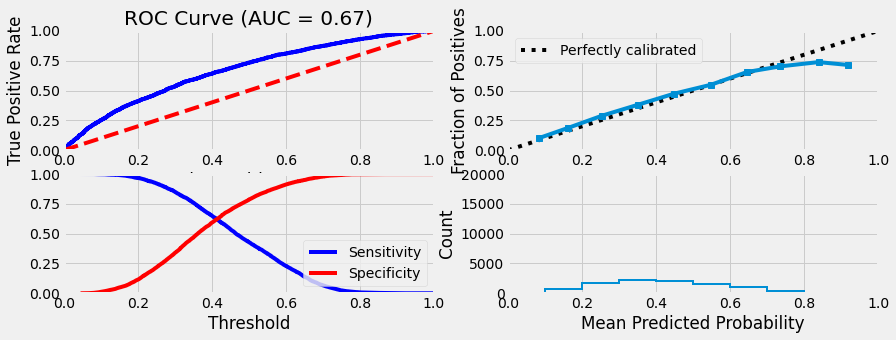


Similarity to LC grade ranking:  0.49925623026513877
Brier score: 0.22563332023173588
Were parameters on edge? : False
Score variations around CV search grid : 3.746443250079047
[0.6089  0.6326  0.62225 0.61805 0.6319  0.6279 ]


In [ ]:
mlp07 = MLPClassifier()
cv_parameters = {'hidden_layer_sizes':[(1), (10), (50), (100), (5, 5), (10, 10)]}

mlp07 = fit_classification(mlp07, data_dict12,
                         cv_parameters = cv_parameters, model_name="Multi-Layer Perceptron")

In [ ]:
models_to_save['mlp07'] = mlp07

# Step 1 - Time stability test of classifiers

### 1.1 On the time period 2015-2016

These models were already computed above on this data set. We will proceed to re-do them on data from a later time period.

### 1.1.2 Load 2015-2016 data

In [ ]:
data15, discrete_features, continuous_features, ret_cols = pickle.load( open( pickle_input_201516, "rb" ) )

#data = data13.copy()
data = downsample(data15, delProp = 0.70)

# Remove Fico from data

continuous_features = [i for i in continuous_features if i not in ['fico_range_low']]  

### Mimic what we did for the 2012-2013 data

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])


# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

final_features = [i for i in discrete_features + continuous_features if i not in ["grade", "int_rate", "installment"]]


#data_dict = prepare_data(feature_subset = final_features)
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)

Before downsample:
Total count: 810845
Fully Paid count: 652384
Charged off count: 158423
Default count: 38
Proportion of Charged off + Default: 0.20

After downsample:
Total count: 354177
Fully Paid count: 195716
Charged off count: 158423
Default count: 38
Proportion of Charged off + Default: 0.45


In [ ]:
# prepare data 
start_date_train = datetime.date(2015,1,1)
end_date_train = datetime.date(2015,9,1)
start_date_test = datetime.date(2015,10,1)
end_date_test = datetime.date(2015,12,1)

data_dict15 = prepare_data(data_subset = np.array([True]*np.array([True]*len(data))),
                              date_range_train = (start_date_train, end_date_train),
                         date_range_test = (start_date_test, end_date_test),
                         n_samples_train = 20000, n_samples_test = 10000, feature_subset = final_features)

## 1.2 Train on Q1-Q3 of 2015 and test on Q4 of 2015.
There are two intentions in looking for time stability.
- How do model performance based on 2012-13 data differ from those in a later time period, say trained from the first three quarters of 2015 and tested on the last quarter of 2015?
- The second intent is whether the top features of the same model (RF etc.) for 2012-13 were the same as those for 2015. 

We will see that the models trained across different time periods perform remarkably similar in terms of accuracy and other batch metrics, as well as 
having similar top features. 

### 1.2.1 Ridge Classifier

In [ ]:
cv_parameters = {"alpha":np.logspace(-4, 4, num = 10)}

ridge_clf13 = fit_classification(RidgeClassifier(), data_dict15,
                   cv_parameters = cv_parameters, model_name = "Ridge Classfier", output_to_file = False)

  Model: Ridge Classfier
Fit time: 1.48 seconds
Optimal parameters:
{'alpha': 0.3593813663804626}

Accuracy:  0.6487
              precision    recall  f1-score   support

  No default     0.6479    0.7682    0.7029      5410
     Default     0.6502    0.5078    0.5703      4590

    accuracy                         0.6487     10000
   macro avg     0.6490    0.6380    0.6366     10000
weighted avg     0.6489    0.6487    0.6420     10000


Similarity to LC grade ranking:  0.5068993443019162


In [ ]:
coef_table = pd.DataFrame({"feature": selected_features[top_and_bottom_idx], "coeff": ridge_clf13['model'].coef_[0,top_and_bottom_idx]})
print(coef_table)

                          feature     coeff
2                      annual_inc -0.689980
8                 fico_range_high -0.921656
5                     delinq_2yrs  0.033296
43            home_ownership::nan  0.000000
23                   purpose::nan  0.000000
27  verification_status::Verified  0.118482


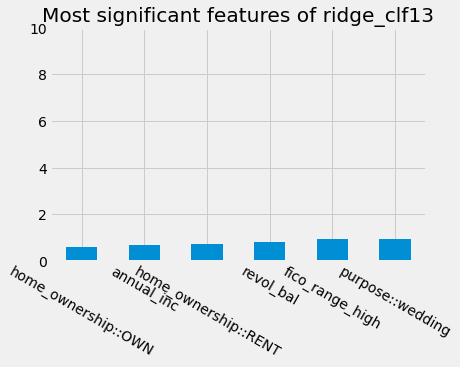

In [ ]:
## Plot top 6 most significant features
temp = abs(ridge_clf13['model'].coef_[0])
top_idx = list(np.argsort(temp)[-6:]) # pick the highest 6 coef_ 
bplot = pd.Series(temp[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,10))
p2.set_xticklabels(xticks)
plt.title('Most significant features of ridge_clf13')
plt.show()

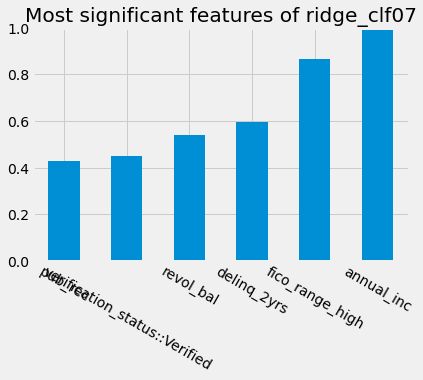

In [ ]:
## Plot top 6 most significant features
temp = abs(ridge_clf07['model'].coef_[0])
top_idx = list(np.argsort(temp)[-6:]) # pick the highest 6 coef_ 
bplot = pd.Series(temp[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,1))
p2.set_xticklabels(xticks)
plt.title('Most significant features of ridge_clf07')
plt.show()

### 1.2.2 Naive Bayes: time-based train-test split

  Model: Gaussian Naive Bayes
Fit time: 0.11 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.9981278775204298
Accuracy:  0.6211
              precision    recall  f1-score   support

  No default     0.6265    0.7420    0.6794      5410
     Default     0.6115    0.4786    0.5370      4590

    accuracy                         0.6211     10000
   macro avg     0.6190    0.6103    0.6082     10000
weighted avg     0.6196    0.6211    0.6140     10000



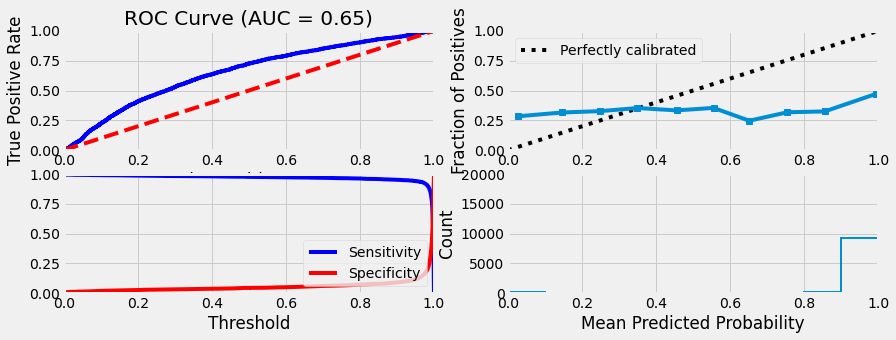


Similarity to LC grade ranking:  0.3852108257291205
Brier score: 0.5072877437832727
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.48705]


In [ ]:
gnb13 = fit_classification(GaussianNB(), data_dict15,
                model_name = "Gaussian Naive Bayes")

In [ ]:
models_to_save['gnb13'] = gnb13

### 1.2.3 L1-regression

  Model: l1 Penalized Logistic Regression
Fit time: 7.69 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.49501318873356087
Accuracy:  0.6471
              precision    recall  f1-score   support

  No default     0.6483    0.7601    0.6997      5410
     Default     0.6451    0.5139    0.5721      4590

    accuracy                         0.6471     10000
   macro avg     0.6467    0.6370    0.6359     10000
weighted avg     0.6468    0.6471    0.6411     10000



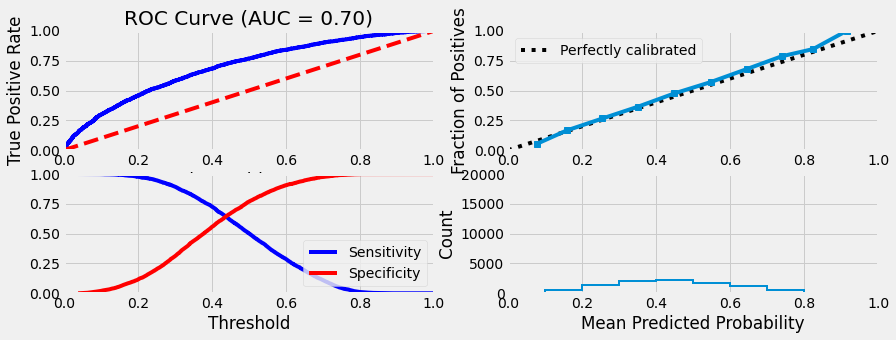


Similarity to LC grade ranking:  0.5083263556631571
Brier score: 0.21863807472617855
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.6378]


In [ ]:
l1 = LogisticRegression(penalty = 'l1',solver='liblinear')
cv_parameters = {"C":np.logspace(0, 6, num = 10)}
l1_logistic13 = fit_classification(l1, data_dict15,
                model_name = "l1 Penalized Logistic Regression")

In [ ]:
models_to_save['l1_logistic13'] = l1_logistic13

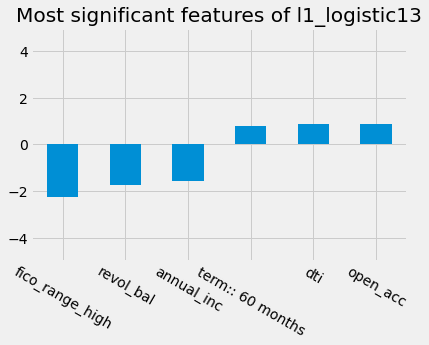

In [ ]:
## plot top 3 features with the most positive (and negative) weights 
top_and_bottom_idx = list(np.argsort(l1_logistic13['model'].coef_)[0,:3]) + list(np.argsort(l1_logistic13['model'].coef_)[0,-3:])
bplot = pd.Series(l1_logistic13['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-5,5))
p1.set_xticklabels(xticks)
plt.title('Most significant features of l1_logistic13')
plt.show()

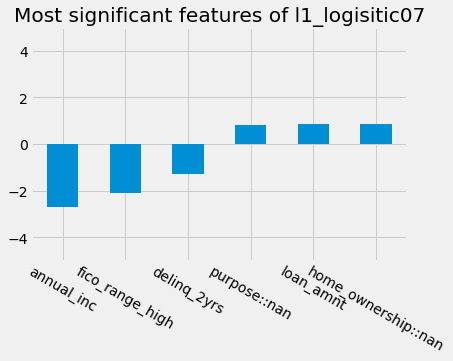

In [ ]:
## for comparison, plot top 3 features with the most positive (and negative) weights for 2007 data
top_and_bottom_idx = list(np.argsort(l1_logistic07['model'].coef_)[0,:3]) + list(np.argsort(l1_logistic07['model'].coef_)[0,-3:])
bplot = pd.Series(l1_logistic07['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-5,5))
p1.set_xticklabels(xticks)
plt.title('Most significant features of l1_logisitic07')
plt.show()

### 1.2.4 L2-regression: time-based train-test split

  Model: l2 Penalized Logistic Regression
Fit time: 2.15 seconds
Optimal parameters:
{}

Accuracy-maximizing threshold was: 0.5194031953011684
Accuracy:  0.6417
              precision    recall  f1-score   support

  No default     0.6341    0.7985    0.7069      5410
     Default     0.6580    0.4569    0.5393      4590

    accuracy                         0.6417     10000
   macro avg     0.6460    0.6277    0.6231     10000
weighted avg     0.6451    0.6417    0.6299     10000



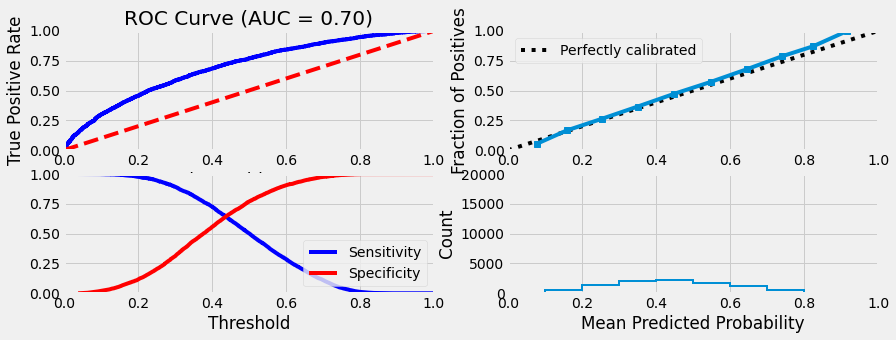


Similarity to LC grade ranking:  0.5079244566240201
Brier score: 0.2186553980796013
Were parameters on edge? : False
Score variations around CV search grid : 0.0
[0.63725]


In [ ]:
l2 = LogisticRegression(penalty = 'l2')
cv_parameters = {"C":np.logspace(-4, 4, num = 10)}
l2_logistic13 = fit_classification(l2, data_dict15,
                model_name = "l2 Penalized Logistic Regression")

In [ ]:
models_to_save['l2_logistic13'] = l2_logistic13

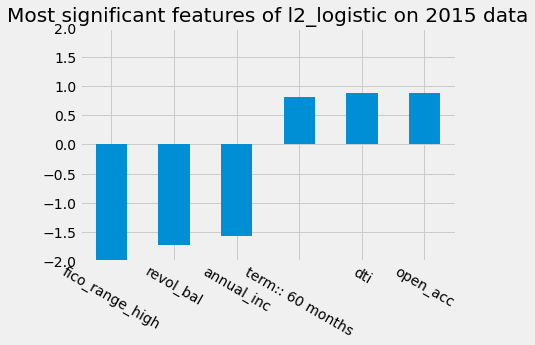

In [ ]:
## plot top 3 features with the most positive (and negative) weights 
top_and_bottom_idx = list(np.argsort(l2_logistic13['model'].coef_)[0,:3]) + list(np.argsort(l2_logistic13['model'].coef_)[0,-3:])
bplot = pd.Series(l2_logistic13['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-2,2))
p1.set_xticklabels(xticks)
plt.title('Most significant features of l2_logistic on 2015 data')
plt.show()

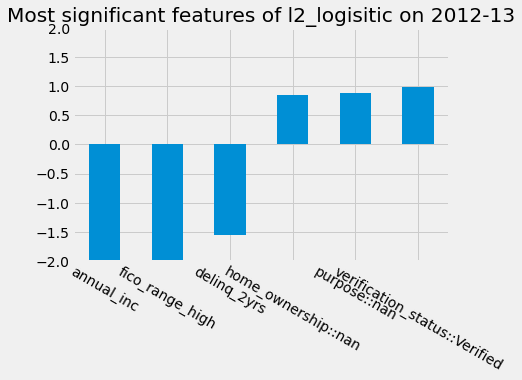

In [ ]:
## for comparison, plot top 3 features with the most positive (and negative) weights for 2012
top_and_bottom_idx = list(np.argsort(l2_logistic07['model'].coef_)[0,:3]) + list(np.argsort(l2_logistic07['model'].coef_)[0,-3:])
bplot = pd.Series(l2_logistic07['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-2,2))
p1.set_xticklabels(xticks)
plt.title('Most significant features of l2_logisitic on 2012-13')
plt.show()

### 1.2.5 Decision tree: time-based train-test split

  Model: Decision tree
Fit time: 3.16 seconds
Optimal parameters:
{'min_samples_leaf': 600}

Accuracy-maximizing threshold was: 0.5170575692963753
Accuracy:  0.6287
              precision    recall  f1-score   support

  No default     0.6184    0.8194    0.7048      5410
     Default     0.6549    0.4039    0.4997      4590

    accuracy                         0.6287     10000
   macro avg     0.6366    0.6117    0.6022     10000
weighted avg     0.6351    0.6287    0.6107     10000



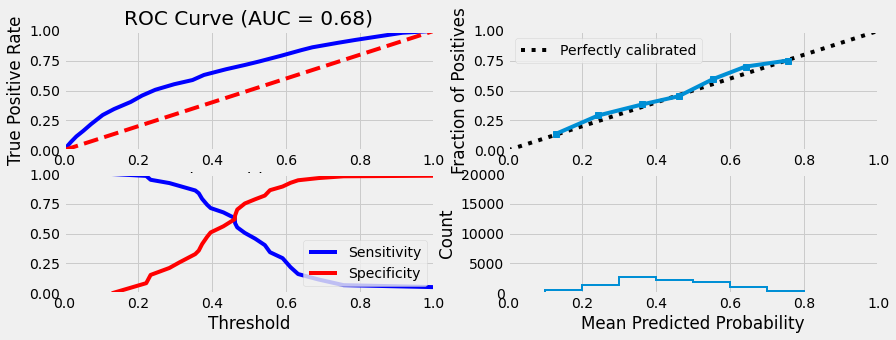


Similarity to LC grade ranking:  0.42265942061234574
Brier score: 0.2252338103338956
Were parameters on edge? : False
Score variations around CV search grid : 0.9602194787380168
[0.6176  0.61965 0.61645 0.6152  0.61585 0.61675 0.61735 0.6137  0.615  ]


In [ ]:
cv_parameters = {'min_samples_leaf':[500,600,700,800,900,1000, 1100, 1200, 1300]}
dt13 = fit_classification(decision_tree, data_dict15, 
                          cv_parameters = cv_parameters, model_name = "Decision tree")

In [ ]:
models_to_save['dt13'] = dt13

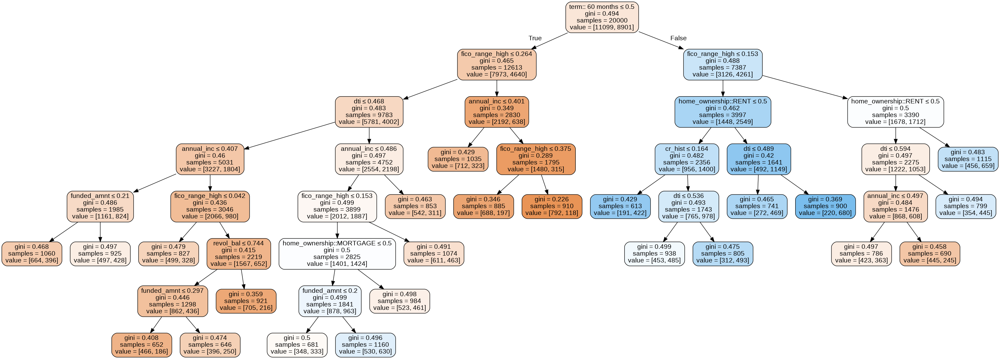

In [ ]:
# Visualize the decision tree
# Zooming-in is allowed by double click
from sklearn.externals.six import StringIO 
import graphviz

dot_data = StringIO()
export_graphviz(dt13['model'], 
                out_file=dot_data,  
                feature_names=selected_features,filled=True, 
                rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

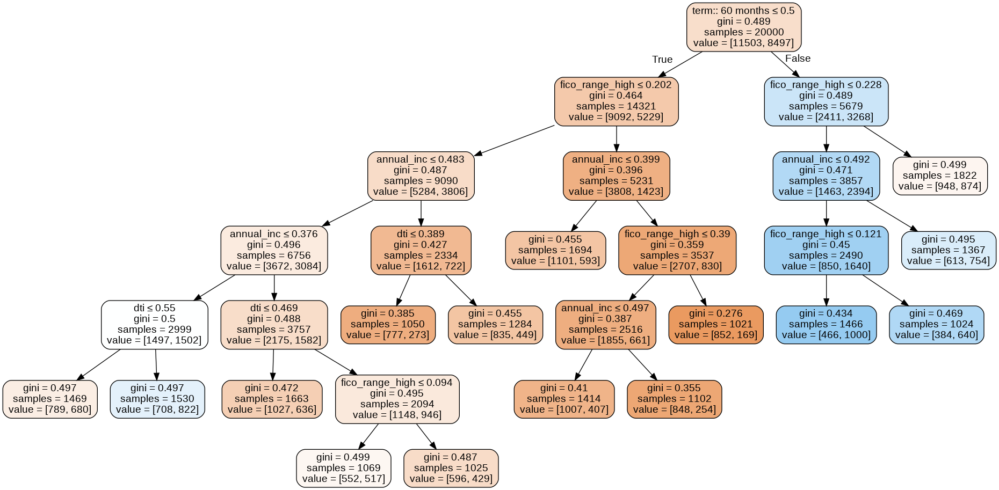

In [ ]:
# For comparison from 2012
from sklearn.externals.six import StringIO 
import graphviz

dot_data = StringIO()
export_graphviz(dt07['model'], out_file=dot_data,  
                feature_names=selected_features12,filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

FICO range , annual income and dti appears on top splits in both models running on 12 and 15.

### ($\star$) 1.2.6 Random Forest.


In [ ]:
# Load Saved Model  
#rf13 = saved_models['rf13']

  Model: Random forest
Fit time: 436.72 seconds
Optimal parameters:
{'min_samples_leaf': 8, 'n_estimators': 100}

Accuracy-maximizing threshold was: 0.46456067251112876
Accuracy:  0.6474
              precision    recall  f1-score   support

  No default     0.6673    0.6946    0.6807      5410
     Default     0.6218    0.5917    0.6064      4590

    accuracy                         0.6474     10000
   macro avg     0.6445    0.6432    0.6435     10000
weighted avg     0.6464    0.6474    0.6466     10000



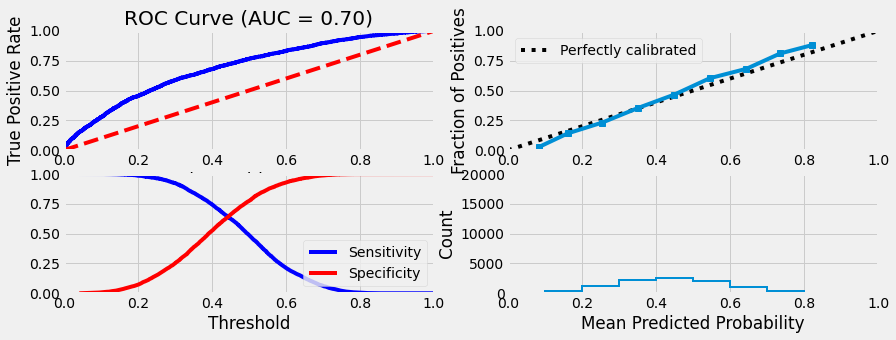


Similarity to LC grade ranking:  0.4783556621968598
Brier score: 0.22060283023958185
Were parameters on edge? : False
Score variations around CV search grid : 3.365838313935179
[0.6144  0.61935 0.6264  0.6292  0.6297  0.61965 0.6295  0.62945 0.6296
 0.6312  0.6249  0.6291  0.62995 0.6298  0.63205 0.6314  0.6302  0.6321
 0.6341  0.6335  0.6307  0.63255 0.63435 0.6358  0.63425 0.6339  0.63375
 0.6336  0.6337  0.6336  0.6317  0.63305 0.63155 0.6328  0.63475 0.63235
 0.6328  0.6318  0.63445 0.6343  0.6339  0.6331  0.6321  0.63215 0.63315]


In [ ]:
# Commands used to generate rf13:
cv_parameters = {'min_samples_leaf':[1, 2, 3, 5, 8, 13, 17, 20, 40], 'n_estimators': [35, 60, 80, 100, 150] }

rf13 = fit_classification(RandomForestClassifier(), data_dict15,
                                   cv_parameters=cv_parameters, model_name="Random forest")

In [ ]:
models_to_save['rf13'] = rf13

###  1.2.7 Multi Layer Perceptron

In [ ]:
# Read model saved in a dictionary
# mlp13 = saved_models['mlp13']

  Model: Multi-Layer Perceptron
Fit time: 291.52 seconds
Optimal parameters:
{'hidden_layer_sizes': (5, 5)}

Accuracy-maximizing threshold was: 0.5002450295026157
Accuracy:  0.646
              precision    recall  f1-score   support

  No default     0.6412    0.7847    0.7057      5410
     Default     0.6553    0.4826    0.5558      4590

    accuracy                         0.6460     10000
   macro avg     0.6483    0.6336    0.6308     10000
weighted avg     0.6477    0.6460    0.6369     10000



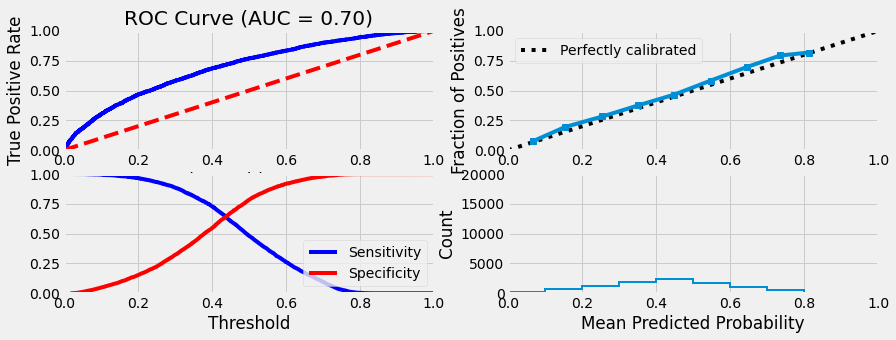


Similarity to LC grade ranking:  0.49992351484954656
Brier score: 0.21929247280126246
Were parameters on edge? : False
Score variations around CV search grid : 2.9485966572059192
[0.6155  0.63255 0.6229  0.6175  0.6342  0.63115]


In [ ]:
mlp13 = MLPClassifier()
cv_parameters = {'hidden_layer_sizes':[(1), (10), (50), (100), (5, 5), (10, 10)]}

mlp13 = fit_classification(mlp13, data_dict15,
                         cv_parameters = cv_parameters, model_name="Multi-Layer Perceptron")

In [ ]:
models_to_save['mlp13'] = mlp13

In [ ]:
models_to_save.keys()

dict_keys(['ridge_clf07', 'gnb07', 'l1_logistic07', 'dt07', 'rf07', 'bt07', 'mlp07', 'gnb13', 'l1_logistic13', 'l2_logistic13', 'dt13', 'rf13', 'mlp13', 'l2_logistic07', 'reg_mlp15_df', 'reg_rf15', 'reg_mlp12', 'reg_rf12', 'reg_mlp12_df', 'reg_rf12_df', 'reg_mlp15', 'reg_rf15_df'])

### Comparison: Random forest run - 2012-13 vs 2015
Interestingly, we see that 5 of the top 6 features are the same. That gives us some confidence in the time-stability of the model.

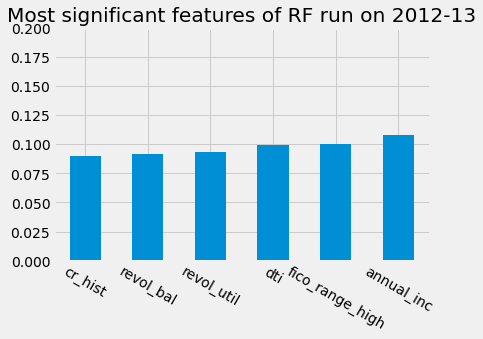

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(rf07['model'].feature_importances_)[-6:]) 
bplot = pd.Series(rf07['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.title('Most significant features of RF run on 2012-13')
plt.show()

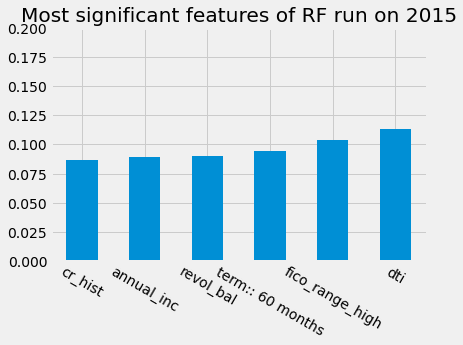

In [ ]:
## Plot top 6 most significant features
top_idx = list(np.argsort(rf13['model'].feature_importances_)[-6:]) 
bplot = pd.Series(rf13['model'].feature_importances_[top_idx])
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.title('Most significant features of RF run on 2015')
plt.show()

# Step 2. Build and Test Regression Models for returns

In [ ]:
def fit_regression(model, data_dict,
                      cv_parameters = {},
                      separate = False,
                      model_name = None,
                      random_state = default_seed,
                      output_to_file = True,
                      print_to_screen = True):
    '''
    This function will fit a regression model to data and print various evaluation
    measures. It expects the following parameters
      - model: an sklearn model object
      - data_dict: the dictionary containing both training and testing data;
                   returned by the prepare_data function
      - separate: a Boolean variable indicating whether we fit models for
                  defaulted and non-defaulted loans separately
      - cv_parameters: a dictionary of parameters that should be optimized
                       over using cross-validation. Specifically, each named
                       entry in the dictionary should correspond to a parameter,
                       and each element should be a list containing the values
                       to optimize over
      - model_name: the name of the model being fit, for printouts
      - random_state: the random seed to use
      - output_to_file: if the results will be saved to the output file
      - print_to_screen: if the results will be printed on screen

    This function returns a dictionary FOR EACH RETURN DEFINITION with the following entries
      - model: the best fitted model
      - predicted_return: prediction result based on the test set
      - predicted_regular_return: prediction result for non-defaulted loans (valid if separate == True)
      - predicted_default_return: prediction result for defaulted loans (valid if separate == True)
      - r2_scores: the testing r2_score(s) for the best fitted model
    '''

    np.random.seed(random_state)

    # --------------------------
    #   Step 1 - Load the data
    # --------------------------

    col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb', 'ret_INTc', 'ret_Hybrid']

    X_train = data_dict['X_train']
    filter_train = data_dict['train_set']

    X_test = data_dict['X_test']
    filter_test = data_dict['test_set']
    out = {}

    for ret_col in col_list:

        #y_train = data.loc[filter_train, ret_col].as_matrix()
        #y_test = data.loc[filter_test, ret_col].as_matrix()
        y_train = data.loc[filter_train, ret_col].to_numpy()
        y_test = data.loc[filter_test, ret_col].to_numpy()

        # --------------------------
        #   Step 2 - Fit the model
        # --------------------------

        if separate:
            outcome_train = data.loc[filter_train, 'outcome']
            outcome_test = data.loc[filter_test, 'outcome']

            # Train two separate regressors for defaulted and non-defaulted loans
            X_train_0 = X_train[outcome_train == False]
            y_train_0 = y_train[outcome_train == False]
            X_test_0 = X_test[outcome_test == False]
            y_test_0 = y_test[outcome_test == False]

            X_train_1 = X_train[outcome_train == True]
            y_train_1 = y_train[outcome_train == True]
            X_test_1 = X_test[outcome_test == True]
            y_test_1 = y_test[outcome_test == True]

            cv_model_0 = GridSearchCV(model, cv_parameters, scoring='r2')
            cv_model_1 = GridSearchCV(model, cv_parameters, scoring='r2')

            start_time = time.time()
            cv_model_0.fit(X_train_0, y_train_0)
            cv_model_1.fit(X_train_1, y_train_1)
            end_time = time.time()

            best_model_0 = cv_model_0.best_estimator_
            best_model_1 = cv_model_1.best_estimator_

            if print_to_screen:

                if model_name != None:
                    print("=========================================================")
                    print("  Model: " + model_name + "  Return column: " + ret_col)
                    print("=========================================================")

                print("Fit time: " + str(round(end_time - start_time, 2)) + " seconds")
                print("Optimal parameters:")
                print("model_0:",cv_model_0.best_params_, "model_1",cv_model_1.best_params_)

            predicted_regular_return = best_model_0.predict(X_test)
            predicted_default_return = best_model_1.predict(X_test)

            if print_to_screen:
                print("")
                print("Testing r2 scores:", )
            # Here we use different testing set to report the performance
            test_scores = {'model_0':r2_score(y_test_0,best_model_0.predict(X_test_0)),
                              'model_1':r2_score(y_test_1,best_model_1.predict(X_test_1))}
            if print_to_screen:
                print("model_0 (non-default):", test_scores['model_0'])
                print("model_1 (default):", test_scores['model_1'])
                print('Avg Predicted regular return:', np.sum(predicted_regular_return)/len(predicted_regular_return))
                print('Avg Predicted default return:', np.sum(predicted_default_return)/len(predicted_default_return))

            cv_objects = {'model_0':cv_model_0, 'model_1':cv_model_1}
            out[ret_col] = { 'model_0':best_model_0, 'model_1':best_model_1, 'predicted_regular_return':predicted_regular_return,
                      'predicted_default_return':predicted_default_return,'r2_scores':test_scores }

        else:
            cv_model = GridSearchCV(model, cv_parameters, scoring='r2')

            start_time = time.time()
            cv_model.fit(X_train, y_train)
            end_time = time.time()

            best_model = cv_model.best_estimator_

            if print_to_screen:
                if model_name != None:
                    print("=========================================================")
                    print("  Model: " + model_name + "  Return column: " + ret_col)
                    print("=========================================================")

                print("Fit time: " + str(round(end_time - start_time, 2)) + " seconds")
                print("Optimal parameters:")
                print(cv_model.best_params_)

            predicted_return = best_model.predict(X_test)
            test_scores = {'model':r2_score(y_test,predicted_return)}
            if print_to_screen:
                print("")
                print("Testing r2 score:", test_scores['model'])
                print("Avg Predcited return:", np.sum(predicted_return)/len(predicted_return))

            cv_objects = {'model':cv_model}
            out[ret_col] = {'model':best_model, 'predicted_return':predicted_return, 'r2_scores':r2_score(y_test,predicted_return)}

        # Output the results to a file
        if output_to_file:
            for i in cv_objects:
                # Check whether any of the CV parameters are on the edge of
                # the search space
                opt_params_on_edge = find_opt_params_on_edge(cv_objects[i])
                dump_to_output(model_name + "::" + ret_col + "::search_on_edge", opt_params_on_edge)
                if print_to_screen:
                    print("Were parameters on edge (" + i + ") : " + str(opt_params_on_edge))

                # Find out how different the scores are for the different values
                # tested for by cross-validation. If they're not too different, then
                # even if the parameters are off the edge of the search grid, we should
                # be ok
                score_variation = find_score_variation(cv_objects[i])
                dump_to_output(model_name + "::" + ret_col + "::score_variation", score_variation)
                if print_to_screen:
                    print("Score variations around CV search grid (" + i + ") : " + str(score_variation))

                # Print out all the scores
                dump_to_output(model_name + "::all_cv_scores", str(cv_objects[i].cv_results_['mean_test_score']))
                if print_to_screen:
                    print("All test scores : " + str(cv_objects[i].cv_results_['mean_test_score']) )

                # Dump the AUC to file
                dump_to_output( model_name + "::" + ret_col + "::r2", test_scores[i] )

    return out

## 2.1 Test regression models on 2012-2013 data
Apply regressor on the full dataset, and not just on the downsampled one

## For All Returns

In [ ]:
# Read the data and features from the pickle
data12, discrete_features, continuous_features, ret_cols = pickle.load( open( pickle_input_201213, "rb" ) )

#data = data12.copy()
data = data12

# Remove Fico from data

continuous_features = [i for i in continuous_features if i not in ['fico_range_low']]  

# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')


# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

In [ ]:
final_features = [i for i in discrete_features + continuous_features if i not in ["installment"]]
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]

## useful when choosing the most significant features
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)
selected_features12 = selected_features.copy()

## Process data here:
data_dict12 = prepare_data(data_subset = np.array([True]*len(data)), feature_subset = final_features)

### 2.1.1 Lasso-Lars regressor

In [ ]:
# First, trying LASSO penalized regression with a variety of parameters,
# it becomes clear a simple regression is best

cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_lasso12 = fit_regression(linear_model.LassoLars(), data_dict12,  # data_dict12 already defined in (0.3)
               cv_parameters = cv_parameters, separate = False, model_name = "Lasso")

  Model: Lasso  Return column: ret_PESS
Fit time: 1.15 seconds
Optimal parameters:
{'alpha': 1e-05}

Testing r2 score: 0.006559139693379179
Testing r2 score: 0.005494493290255605
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 122.44120303015902
All test scores : [ 0.00536154  0.00538372  0.00592686  0.00617153 -0.00138496 -0.00138496
 -0.00138496 -0.00138496]
  Model: Lasso  Return column: ret_OPT
Fit time: 1.14 seconds
Optimal parameters:
{'alpha': 1e-05}

Testing r2 score: 0.025433898697680757
Testing r2 score: 0.007713931935867478
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 135.32877093235655
All test scores : [ 0.01668138  0.01671136  0.01744277  0.01846582 -0.00652375 -0.00652375
 -0.00652375 -0.00652375]
  Model: Lasso  Return column: ret_INTa
Fit time: 1.14 seconds
Optimal parameters:
{'alpha': 1e-06}

Testing r2 score: 0.022772477604662944
Testing r2 score: 0.0030109892970067997
Were paramete

### 2.1.2 Ridge regressor

In [ ]:
cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_ridge12 = fit_regression(linear_model.Ridge(), data_dict12,
               cv_parameters = cv_parameters, separate = False, model_name = "Ridge")

  Model: Ridge  Return column: ret_PESS
Fit time: 0.87 seconds
Optimal parameters:
{'alpha': 0.1}

Testing r2 score: 0.00903298424231902
Testing r2 score: 0.0054808110240851865
Were parameters on edge (model) : True
Score variations around CV search grid (model) : 2750.4020454554334
All test scores : [-0.13992817 -0.07838292 -0.00227102  0.00509245  0.00526788  0.00527627
  0.0052772   0.00527951]
  Model: Ridge  Return column: ret_OPT
Fit time: 0.86 seconds
Optimal parameters:
{'alpha': 0.1}

Testing r2 score: 0.027638623960419495
Testing r2 score: 0.007696480989655285
Were parameters on edge (model) : True
Score variations around CV search grid (model) : 263423.9412802285
All test scores : [-4.39335055e+01 -2.51505245e+01 -2.12363661e+00 -1.69391772e-02
  1.62330524e-02  1.66660724e-02  1.66793197e-02  1.66842047e-02]
  Model: Ridge  Return column: ret_INTa
Fit time: 0.86 seconds
Optimal parameters:
{'alpha': 0.1}

Testing r2 score: 0.022501166512376436
Testing r2 score: 0.0030118252

### 2.1.3 Ordinary least squares



In [ ]:
reg_linear12 = fit_regression(linear_model.LinearRegression(), data_dict12,
               separate = False, model_name = "Linear Regression")

  Model: Linear Regression  Return column: ret_PESS
Fit time: 0.23 seconds
Optimal parameters:
{}

Testing r2 score: 0.008987698544899558
Testing mse score: 0.005481061488879375
Were parameters on edge (model) : False
Score variations around CV search grid (model) : -0.0
All test scores : [-0.1507798]
  Model: Linear Regression  Return column: ret_OPT
Fit time: 0.21 seconds
Optimal parameters:
{}

Testing r2 score: 0.02759149913482284
Testing mse score: 0.00769685399431516
Were parameters on edge (model) : False
Score variations around CV search grid (model) : -0.0
All test scores : [-47.2503245]
  Model: Linear Regression  Return column: ret_INTa
Fit time: 0.23 seconds
Optimal parameters:
{}

Testing r2 score: 0.022329951788898073
Testing mse score: 0.0030123527875597993
Were parameters on edge (model) : False
Score variations around CV search grid (model) : -0.0
All test scores : [-0.4028345]
  Model: Linear Regression  Return column: ret_INTb
Fit time: 0.22 seconds
Optimal parameter

### ($\star$) 2.1.4 Multi-layer perceptron regressor

In [ ]:
cv_parameters = { 'alpha':[0.001, 0.01, 0.1, 1, 10, 100],
                  'hidden_layer_sizes':[(1), (10), (50), (100), (200), (5, 5), (10, 10)] }

reg_mlp12 = fit_regression(MLPRegressor(), data_dict12,
               cv_parameters = cv_parameters, separate = False, model_name = "Multi-Layer Perceptron")

  Model: Multi-Layer Perceptron  Return column: ret_PESS
Fit time: 336.52 seconds
Optimal parameters:
{'alpha': 1, 'hidden_layer_sizes': 10}

Testing r2 score: 0.0050495276350170926
Testing mse score: 0.005502842607922083
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 21322.77741951297
All test scores : [-1.40755388e-01 -7.33943390e-02 -6.87011190e-02 -5.64639628e-02
 -6.54790410e-02 -1.27959208e-02 -1.16816598e-02 -2.59601830e-03
 -8.37699508e-02 -4.78915127e-02 -3.67188685e-02 -4.63463880e-02
 -6.84633218e-02 -1.76730738e-02 -1.55735841e-01 -4.48982252e-02
 -3.58079329e-03 -6.89225658e-03 -3.69035030e-03 -3.31952012e-02
 -8.22717443e-03 -4.53260567e-02  7.33814608e-04 -1.02467645e-04
 -1.42105388e-03 -1.26717538e-04 -3.85973101e-03 -1.76412441e-03
 -1.72416091e-03 -1.79648626e-03 -1.22506007e-03 -8.07431790e-03
 -2.55203734e-03 -4.09019976e-03 -1.84734940e-03 -1.17371380e-03
 -2.41786330e-03 -1.82275453e-03 -3.81764008e-03 -2.46033002e-03
 -1

In [ ]:
models_to_save['reg_mlp12'] = reg_mlp12

### ($\star$) 2.1.5 Random forest regressor

In [ ]:
cv_parameters = {'min_samples_leaf':[75, 100, 200, 300, 400],
                 'n_estimators': [35, 45, 55, 65, 80, 90, 100] }

reg_rf12 = fit_regression(RandomForestRegressor(), data_dict12,
               cv_parameters = cv_parameters, separate = False, model_name = "Random forest regressor")

  Model: Random forest regressor  Return column: ret_PESS
Fit time: 692.92 seconds
Optimal parameters:
{'min_samples_leaf': 300, 'n_estimators': 55}

Testing r2 score: 0.010594170973415085
Testing mse score: 0.005472176458746092
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 53.52600934610513
All test scores : [0.0041114  0.00346926 0.00466363 0.00392755 0.00478739 0.00418178
 0.00500839 0.00486326 0.00439499 0.00555599 0.00578031 0.00577322
 0.0056665  0.00562098 0.00627739 0.00590874 0.0065638  0.0068177
 0.00667826 0.0066946  0.0067058  0.00738184 0.00719548 0.00746496
 0.00679007 0.00734191 0.00688775 0.00710118 0.00655711 0.00674911
 0.00725801 0.0074323  0.00682798 0.00693308 0.00721169]
  Model: Random forest regressor  Return column: ret_OPT
Fit time: 679.51 seconds
Optimal parameters:
{'min_samples_leaf': 400, 'n_estimators': 65}

Testing r2 score: 0.030348473915592367
Testing mse score: 0.0076750318564639255
Were parameters on edge (m

In [ ]:
models_to_save['reg_rf12'] = reg_rf12

## For Defaulted Loans & Nondefaulted Loans



### 2.1.1 Lasso-Lars regressor

In [ ]:
# First, trying LASSO penalized regression with a variety of parameters,
# it becomes clear a simple regression is best

cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_lasso12_df = fit_regression(linear_model.LassoLars(), data_dict12,  # data_dict12 already defined in (0.3)
               cv_parameters = cv_parameters, separate = True, model_name = "Lasso")

  Model: Lasso  Return column: ret_PESS
Fit time: 1.31 seconds
Optimal parameters:
model_0: {'alpha': 1e-06} model_1 {'alpha': 0.0001}

Testing r2 scores:
model_0 (non-default): 0.24913020640745243
model_1 (default): 0.09282718284249314
model_0_mse (non-default): 0.0006049501392349772
model_1_mse (default): 0.008281782266923613
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : 101.71318819592051
All test scores : [ 0.25625896  0.25619115  0.25659094  0.23146507  0.00062464 -0.00439589
 -0.00439589 -0.00439589]
Were parameters on edge (model_1) : False
Score variations around CV search grid (model_1) : 109.27920859632624
All test scores : [ 0.0728641   0.07289606  0.07362896  0.07917629  0.08040644 -0.00746108
 -0.00746108 -0.00746108]
  Model: Lasso  Return column: ret_OPT
Fit time: 1.19 seconds
Optimal parameters:
model_0: {'alpha': 1e-06} model_1 {'alpha': 0.0001}

Testing r2 scores:
model_0 (non-default): 0.4725865907968305
model_1 (default

### 2.1.2 Ridge regressor

In [ ]:
cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_ridge12_df = fit_regression(linear_model.Ridge(), data_dict12,
               cv_parameters = cv_parameters, separate = True, model_name = "Ridge")

  Model: Ridge  Return column: ret_PESS
Fit time: 0.66 seconds
Optimal parameters:
model_0: {'alpha': 0.1} model_1 {'alpha': 0.1}

Testing r2 scores:
model_0 (non-default): 0.2492805858184285
model_1 (default): 0.1038666348688897
model_0_mse (non-default): 0.0006048289836812656
model_1_mse (default): 0.008181000655857227
Were parameters on edge (model_0) : True
Score variations around CV search grid (model_0) : 3803.1705648796205
All test scores : [-9.49263365 -5.31934971 -0.21265476  0.24970713  0.25629475  0.25631024
  0.256308    0.25633801]
Were parameters on edge (model_1) : True
Score variations around CV search grid (model_1) : 0.23617539176560293
All test scores : [0.07232875 0.07232875 0.07232875 0.07232877 0.07232889 0.07233011
 0.07234337 0.07249998]
  Model: Ridge  Return column: ret_OPT
Fit time: 0.68 seconds
Optimal parameters:
model_0: {'alpha': 0.1} model_1 {'alpha': 0.1}

Testing r2 scores:
model_0 (non-default): 0.472641441738189
model_1 (default): 0.0968253729525943


### 2.1.3 Ordinary least squares


In [ ]:
reg_linear12_df = fit_regression(linear_model.LinearRegression(), data_dict12,
               separate = True, model_name = "Linear Regression")

  Model: Linear Regression  Return column: ret_PESS
Fit time: 0.23 seconds
Optimal parameters:
model_0: {} model_1 {}

Testing r2 scores:
model_0 (non-default): 0.2492583411628697
model_1 (default): 0.10371443701265293
model_0_mse (non-default): 0.0006048469054402608
model_1_mse (default): 0.008182390103912775
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : -0.0
All test scores : [-10.22993374]
Were parameters on edge (model_1) : False
Score variations around CV search grid (model_1) : 0.0
All test scores : [0.07232875]
  Model: Linear Regression  Return column: ret_OPT
Fit time: 0.22 seconds
Optimal parameters:
model_0: {} model_1 {}

Testing r2 scores:
model_0 (non-default): 0.4726021938510645
model_1 (default): 0.09587719492002411
model_0_mse (non-default): 0.0008652219313704509
model_1_mse (default): 0.008787163275954402
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : -0.0
All test scores : [-

### ($\star$) 2.1.4 Multi-layer perceptron regressor

In [ ]:
cv_parameters = { 'alpha':[0.001, 0.01, 0.1, 1, 10, 100],
                  'hidden_layer_sizes':[(1), (10), (50), (100), (200), (5, 5), (10, 10)] }

reg_mlp12_df = fit_regression(MLPRegressor(), data_dict12,
               cv_parameters = cv_parameters, separate = True, model_name = "Multi-Layer Perceptron")

  Model: Multi-Layer Perceptron  Return column: ret_PESS
Fit time: 416.28 seconds
Optimal parameters:
model_0: {'alpha': 0.1, 'hidden_layer_sizes': 200} model_1 {'alpha': 1, 'hidden_layer_sizes': 200}

Testing r2 scores:
model_0 (non-default): 0.22637206006889599
model_1 (default): 0.09260781200453438
model_0_mse (non-default): 0.0006232856002080026
model_1_mse (default): 0.00828378495205849
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : 398.35263710215696
All test scores : [-0.26421543 -0.08534267 -0.06871219  0.10151816  0.10194964 -0.2755784
  0.02686451 -0.74038953 -0.44518876 -0.00762272  0.15657619  0.13678627
  0.06618476  0.15054615 -0.49155686  0.04712687  0.23647351  0.24095674
  0.2481592  -0.15120436  0.13728198 -0.20821223  0.16489817  0.08151913
  0.11320505  0.07081198  0.0498801   0.01337189 -0.0044266  -0.00212391
 -0.00479197 -0.00477271 -0.01747281 -0.00163466 -0.01148546 -0.00677606
 -0.00529659 -0.00599895 -0.00339305 -

In [ ]:
models_to_save['reg_mlp12_df'] = reg_mlp12_df

### ($\star$) 2.1.5 Random forest regressor

In [ ]:
cv_parameters = {'min_samples_leaf':[75, 100, 200, 300, 400],
                 'n_estimators': [35, 45, 55, 65, 80, 90, 100] }

reg_rf12_df = fit_regression(RandomForestRegressor(), data_dict12,
               cv_parameters = cv_parameters, separate = True, model_name = "Random forest regressor")

  Model: Random forest regressor  Return column: ret_PESS
Fit time: 596.85 seconds
Optimal parameters:
model_0: {'min_samples_leaf': 75, 'n_estimators': 55} model_1 {'min_samples_leaf': 200, 'n_estimators': 35}

Testing r2 scores:
model_0 (non-default): 0.23874970247292004
model_1 (default): 0.10431189653582285
model_0_mse (non-default): 0.0006133133566051678
model_1_mse (default): 0.00817693576314042
Were parameters on edge (model_0) : True
Score variations around CV search grid (model_0) : 10.35076250064751
All test scores : [0.25068553 0.25216628 0.25243458 0.25155279 0.25218858 0.25191672
 0.25205968 0.24739737 0.24784973 0.24919943 0.24752669 0.24869914
 0.24769418 0.24843739 0.23634003 0.23626691 0.23713156 0.23665662
 0.23731446 0.23760339 0.23691676 0.23124114 0.23195303 0.2308396
 0.2309444  0.23127203 0.23204139 0.23154963 0.2266552  0.22630568
 0.22685346 0.22668814 0.22652973 0.22725466 0.22638608]
Were parameters on edge (model_1) : True
Score variations around CV search g

In [ ]:
models_to_save['reg_rf12_df'] = reg_rf12_df

## 2.2 Test on 2015-2016 data

Testing same regressors on dataset in different periods to test out the time stability. The result shows that 2012-2013 has a slightly better r2 scores than 2015-2016

## For All Returns

In [ ]:
# Read the data and features from the pickle
data15, discrete_features, continuous_features, ret_cols = pickle.load( open( pickle_input_201516, "rb" ) )

# data = data15.copy()
data = data15

# Remove Fico from data

continuous_features = [i for i in continuous_features if i not in ['fico_range_low']]

# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')


# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

In [ ]:
# prepare data 
start_date_train = datetime.date(2015,1,1)
end_date_train = datetime.date(2015,9,1)
start_date_test = datetime.date(2015,10,1)
end_date_test = datetime.date(2015,12,1)

data_dict15 = prepare_data(data_subset = np.array([True]*np.array([True]*len(data))),
                              date_range_train = (start_date_train, end_date_train),
                         date_range_test = (start_date_test, end_date_test),
                         n_samples_train = 20000, n_samples_test = 10000, feature_subset = final_features)

### 2.2.1 Lasso-Lars regressor





In [ ]:
# First, trying LASSO penalized regression with a variety of parameters,
# it becomes clear a simple regression is best

cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_lasso15 = fit_regression(linear_model.LassoLars(), data_dict15, 
               cv_parameters = cv_parameters, separate = False, model_name = "Lasso")

  Model: Lasso  Return column: ret_PESS
Fit time: 1.06 seconds
Optimal parameters:
{'alpha': 1e-06}

Testing r2 score: 0.010008649404665948
Testing mse score: 0.07568962330368746
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 122.59277352736535
All test scores : [ 0.00760655  0.00768315  0.00788488  0.0054603  -0.00178141 -0.00178141
 -0.00178141 -0.00178141]
  Model: Lasso  Return column: ret_OPT
Fit time: 1.02 seconds
Optimal parameters:
{'alpha': 1e-06}

Testing r2 score: 0.006491940683000408
Testing mse score: 0.09460161242276989
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 136.12609102031465
All test scores : [ 0.00874373  0.0087724   0.00902204  0.00848801 -0.00325931 -0.00325931
 -0.00325931 -0.00325931]
  Model: Lasso  Return column: ret_INTa
Fit time: 1.04 seconds
Optimal parameters:
{'alpha': 1e-06}

Testing r2 score: 0.00657479474840017
Testing mse score: 0.05652371641721471
Were parameters

### 2.2.2 Ridge regressor

In [ ]:
cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_ridge15 = fit_regression(linear_model.Ridge(), data_dict15,
               cv_parameters = cv_parameters, separate = False, model_name = "Ridge")

  Model: Ridge  Return column: ret_PESS
Fit time: 0.81 seconds
Optimal parameters:
{'alpha': 0.1}

Testing r2 score: 0.009415504370818506
Testing mse score: 0.07571229431064048
Were parameters on edge (model) : True
Score variations around CV search grid (model) : 0.002270510845791646
All test scores : [0.00723153 0.00723154 0.00723154 0.00723154 0.00723154 0.00723155
 0.00723162 0.0072317 ]
  Model: Ridge  Return column: ret_OPT
Fit time: 0.78 seconds
Optimal parameters:
{'alpha': 0.1}

Testing r2 score: 0.005710757887639528
Testing mse score: 0.0946387971391739
Were parameters on edge (model) : True
Score variations around CV search grid (model) : 0.057494040762568095
All test scores : [0.00859654 0.00859654 0.00859654 0.00859654 0.00859654 0.00859659
 0.00859709 0.00860148]
  Model: Ridge  Return column: ret_INTa
Fit time: 0.75 seconds
Optimal parameters:
{'alpha': 0.1}

Testing r2 score: 0.0056143905736497635
Testing mse score: 0.05655103226292469
Were parameters on edge (model) : 

### 2.2.3 Ordinary least squares


In [ ]:
reg_linear15 = fit_regression(linear_model.LinearRegression(), data_dict15,
               separate = False, model_name = "Linear Regression")

  Model: Linear Regression  Return column: ret_PESS
Fit time: 0.26 seconds
Optimal parameters:
{}

Testing r2 score: 0.009465443050552191
Testing mse score: 0.07571038583151113
Were parameters on edge (model) : False
Score variations around CV search grid (model) : -0.0
All test scores : [-1.60092561e+20]
  Model: Linear Regression  Return column: ret_OPT
Fit time: 0.25 seconds
Optimal parameters:
{}

Testing r2 score: 0.005712768096038934
Testing mse score: 0.09463870147093521
Were parameters on edge (model) : False
Score variations around CV search grid (model) : -0.0
All test scores : [-6.66421542e+19]
  Model: Linear Regression  Return column: ret_INTa
Fit time: 0.24 seconds
Optimal parameters:
{}

Testing r2 score: 0.005605650374247206
Testing mse score: 0.056551280791366586
Were parameters on edge (model) : False
Score variations around CV search grid (model) : -0.0
All test scores : [-1.57709412e+20]
  Model: Linear Regression  Return column: ret_INTb
Fit time: 0.24 seconds
Opti

### ($\star$) 2.2.4 Multi-layer perceptron regressor

In [ ]:
cv_parameters = { 'alpha':[0.001, 0.01, 0.1, 1, 10, 100],
                  'hidden_layer_sizes':[(1), (10), (50), (100), (200), (5, 5), (10, 10)] }

reg_mlp15 = fit_regression(MLPRegressor(), data_dict15,
               cv_parameters = cv_parameters, separate = False, model_name = "Multi-Layer Perceptron")

  Model: Multi-Layer Perceptron  Return column: ret_PESS
Fit time: 327.14 seconds
Optimal parameters:
{'alpha': 0.1, 'hidden_layer_sizes': (5, 5)}

Testing r2 score: 0.006712998196310993
Testing mse score: 0.005747990473865366
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 4652.688466121716
All test scores : [-2.02548209e-01 -2.65388500e-02 -4.34966430e-02 -6.82752646e-02
 -6.37072518e-02 -1.61965909e-02 -1.35059241e-02 -6.39956080e-02
 -5.03049772e-02 -3.33588208e-02 -5.43059907e-02 -7.05631208e-02
 -4.97350524e-02  5.45136564e-05 -8.84938456e-02 -1.66475846e-03
 -4.75590495e-03 -9.43473161e-03  4.10810842e-03  4.44898022e-03
  1.77658950e-04 -3.75586097e-02  3.22254622e-03 -2.38278621e-04
  2.41103323e-03 -5.76774329e-03 -5.18997881e-04 -1.84778318e-03
 -2.44279425e-03 -3.00980342e-04 -3.36301657e-03 -1.60660018e-03
 -1.94004499e-03 -3.40119491e-03 -4.21893436e-03 -2.09491850e-03
 -2.21290463e-03 -2.75221274e-03 -1.79127451e-03 -2.58874636e-0

In [ ]:
models_to_save['reg_mlp15'] = reg_mlp15

### ($\star$) 2.2.5 Random forest regressor

In [ ]:
cv_parameters = {'min_samples_leaf':[75, 100, 200, 300, 400],
                 'n_estimators': [35, 45, 55, 65, 80, 90, 100] }

reg_rf15 = fit_regression(RandomForestRegressor(), data_dict15,
               cv_parameters = cv_parameters, separate = False, model_name = "Random forest regressor")

  Model: Random forest regressor  Return column: ret_PESS
Fit time: 673.66 seconds
Optimal parameters:
{'min_samples_leaf': 200, 'n_estimators': 80}

Testing r2 score: 0.011181635188087569
Testing mse score: 0.07564476979759689
Were parameters on edge (model) : False
Score variations around CV search grid (model) : 35.08950381609782
All test scores : [0.00712917 0.0063955  0.00837484 0.00823522 0.00825034 0.00825898
 0.00882414 0.00746771 0.00853993 0.00850749 0.00899584 0.00883344
 0.00904046 0.0090395  0.00873012 0.00838006 0.00840935 0.00888867
 0.0098528  0.00920828 0.00887825 0.0084829  0.00858369 0.00811653
 0.00853042 0.00812779 0.00796628 0.00881374 0.00743745 0.00692337
 0.0071046  0.00784381 0.00773119 0.00777799 0.00772595]
  Model: Random forest regressor  Return column: ret_OPT
Fit time: 694.99 seconds
Optimal parameters:
{'min_samples_leaf': 200, 'n_estimators': 100}

Testing r2 score: 0.010038221271867376
Testing mse score: 0.09443262347112126
Were parameters on edge (mo

In [ ]:
models_to_save['reg_rf15'] = reg_rf15

## For Defaulted Loans & Nondefaulted Loans


### 2.2.1 Lasso-Lars regressor

In [ ]:
# First, trying LASSO penalized regression with a variety of parameters,
# it becomes clear a simple regression is best

cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_lasso15_df = fit_regression(linear_model.LassoLars(), data_dict15,  # data_dict12 already defined in (0.3)
               cv_parameters = cv_parameters, separate = True, model_name = "Lasso")

  Model: Lasso  Return column: ret_PESS
Fit time: 1.25 seconds
Optimal parameters:
model_0: {'alpha': 1e-07} model_1 {'alpha': 1e-05}

Testing r2 scores:
model_0 (non-default): 0.19922964170772794
model_1 (default): 0.08065861078723136
model_0_mse (non-default): 0.022645422927942402
model_1_mse (default): 0.006799596251787977
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : 103.52930118400857
All test scores : [ 0.18282201  0.18291731  0.18272183  0.14982787 -0.0064557  -0.0064557
 -0.0064557  -0.0064557 ]
Were parameters on edge (model_1) : False
Score variations around CV search grid (model_1) : 115.30909864889138
All test scores : [ 0.0481123   0.0481123   0.04819648  0.05225532  0.0483854  -0.00799982
 -0.00799982 -0.00799982]
  Model: Lasso  Return column: ret_OPT
Fit time: 1.26 seconds
Optimal parameters:
model_0: {'alpha': 1e-07} model_1 {'alpha': 1e-05}

Testing r2 scores:
model_0 (non-default): 0.33064039789997
model_1 (default): 0.0

### 2.2.2 Ridge regressor

In [ ]:
cv_parameters = {'alpha': np.logspace(-8, -1, num = 8) }

reg_ridge15_df = fit_regression(linear_model.Ridge(), data_dict15,
               cv_parameters = cv_parameters, separate = True, model_name = "Ridge")

  Model: Ridge  Return column: ret_PESS
Fit time: 0.65 seconds
Optimal parameters:
model_0: {'alpha': 1e-06} model_1 {'alpha': 0.1}

Testing r2 scores:
model_0 (non-default): 0.19912758122444119
model_1 (default): 0.07804268145300797
model_0_mse (non-default): 0.0005128805393536617
model_1_mse (default): 0.006818944084382743
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : 0.00950312619886958
All test scores : [0.18272852 0.18272854 0.18272854 0.18272854 0.18272853 0.18272839
 0.18272701 0.18271118]
Were parameters on edge (model_1) : True
Score variations around CV search grid (model_1) : 0.24506797080763074
All test scores : [0.04658486 0.04658486 0.04658486 0.04658487 0.04658498 0.04658604
 0.04659662 0.04669931]
  Model: Ridge  Return column: ret_OPT
Fit time: 0.65 seconds
Optimal parameters:
model_0: {'alpha': 0.1} model_1 {'alpha': 0.1}

Testing r2 scores:
model_0 (non-default): 0.3313091490298037
model_1 (default): 0.07905661464070446


### 2.2.3 Ordinary least squares


In [ ]:
reg_linear15_df = fit_regression(linear_model.LinearRegression(), data_dict15,
               separate = True, model_name = "Linear Regression")

  Model: Linear Regression  Return column: ret_PESS
Fit time: 0.23 seconds
Optimal parameters:
model_0: {} model_1 {}

Testing r2 scores:
model_0 (non-default): 0.19910050343871288
model_1 (default): 0.07812137249953266
model_0_mse (non-default): 0.0005128978800299333
model_1_mse (default): 0.006818362072791318
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : -0.0
All test scores : [-1.73268513e+22]
Were parameters on edge (model_1) : False
Score variations around CV search grid (model_1) : -0.0
All test scores : [-2.83249498e+20]
  Model: Linear Regression  Return column: ret_OPT
Fit time: 0.25 seconds
Optimal parameters:
model_0: {} model_1 {}

Testing r2 scores:
model_0 (non-default): 0.3311933091924427
model_1 (default): 0.07937772555590006
model_0_mse (non-default): 0.0013455937931362754
model_1_mse (default): 0.007162254236354809
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : -0.0
All test s

### ($\star$) 2.2.4 Multi-layer perceptron regressor

In [ ]:
cv_parameters = { 'alpha':[0.001, 0.01, 0.1, 1, 10, 100],
                  'hidden_layer_sizes':[(1), (10), (50), (100), (200), (5, 5), (10, 10)] }

reg_mlp15_df = fit_regression(MLPRegressor(), data_dict15,
               cv_parameters = cv_parameters, separate = True, model_name = "Multi-Layer Perceptron")

  Model: Multi-Layer Perceptron  Return column: ret_PESS
Fit time: 426.35 seconds
Optimal parameters:
model_0: {'alpha': 0.1, 'hidden_layer_sizes': 50} model_1 {'alpha': 1, 'hidden_layer_sizes': 200}

Testing r2 scores:
model_0 (non-default): 0.17105267421009474
model_1 (default): 0.07217420410867503
model_0_mse (non-default): 0.0005308597743906685
model_1_mse (default): 0.006862348283326073
Were parameters on edge (model_0) : False
Score variations around CV search grid (model_0) : 513.7945234284603
All test scores : [-0.14923796 -0.70492618 -0.34509418 -0.13239878 -0.03927525 -0.59554647
 -0.15996427 -0.45293291 -0.20161247 -0.1669046  -0.01558319  0.02169348
 -0.13188295  0.0646095  -0.61444731  0.01321736  0.17035658  0.15352859
  0.1530013  -0.0758838   0.03742083 -0.13636091  0.06909399  0.0776433
  0.06050137  0.04096653  0.02563965  0.00251561 -0.0068497  -0.01361723
 -0.01419961 -0.00477263 -0.00971363 -0.01257134 -0.00284305 -0.01064368
 -0.00338884 -0.00720327 -0.00814214 -0

In [ ]:
models_to_save['reg_mlp15_df'] = reg_mlp15_df

### ($\star$) 2.2.5 Random forest regressor

In [ ]:
cv_parameters = {'min_samples_leaf':[75, 100, 200, 300, 400],
                 'n_estimators': [35, 45, 55, 65, 80, 90, 100] }

reg_rf15_df = fit_regression(RandomForestRegressor(), data_dict15,
               cv_parameters = cv_parameters, separate = True, model_name = "Random forest regressor")

  Model: Random forest regressor  Return column: ret_PESS
Fit time: 572.31 seconds
Optimal parameters:
model_0: {'min_samples_leaf': 75, 'n_estimators': 100} model_1 {'min_samples_leaf': 400, 'n_estimators': 65}

Testing r2 scores:
model_0 (non-default): 0.18582110505791283
model_1 (default): 0.08116575747011123
model_0_mse (non-default): 0.022834229509699613
model_1_mse (default): 0.00679584531364413
Were parameters on edge (model_0) : True
Score variations around CV search grid (model_0) : 21.578981736613382
All test scores : [0.1674247  0.1666738  0.16773553 0.16902928 0.16884645 0.16846477
 0.16924431 0.1642319  0.16379554 0.16399693 0.16406314 0.16419811
 0.16392187 0.16303944 0.14874465 0.14846109 0.14899029 0.14850689
 0.14968766 0.14974499 0.14987496 0.13830146 0.13833581 0.13881366
 0.13962619 0.14040472 0.13996873 0.13983357 0.13306756 0.13272311
 0.13290884 0.13398669 0.13370799 0.13302151 0.13380836]
Were parameters on edge (model_1) : True
Score variations around CV search

In [ ]:
# save all time-consuming models in one dict_ 
outfile = open(path,'wb')
pickle.dump(models_to_save, outfile)
outfile.close()

# Step 3 - Test investment strategies
Now we test several investment strategies using the learning models above.

*Note - we added our additional return columns to the below function, as well as the following strategies:*

*   Best possible: For benchmarking purposes only. Return the average of the top n loans.
*   Tree-based: Pick top two rules from decision tree models built last week. Use those rules to determine top loans. This model is explained in more detail in this week's report.



In [ ]:
def test_investments(data_dict,
                        classifier = None,
                        regressor = None,
                        strategy = 'Random',
                        num_loans = 1000,
                        random_state = default_seed,
                        output_to_file = True):
    '''
    This function tests a variety of investment methodologies and their returns.
    It will run its tests on the loans defined by the test_set element of the data
    dictionary.

    It is currently able to test four strategies
      - random: invest in a random set of loans
      - ranking: score each loan by probability of default, and only invest
                 in the "safest" loans (i.e., those with the lowest probabilities
                 of default)
      - regression: train a single regression model to predict the expected return
                    of loans in the past. Then, for loans we could invest in, simply
                    rank them by their expected returns and invest in that order.
      - two-stage: train two regression models to predict the expected return of
                   defaulted loans and non-defaulted loans in the training set. Then,
                   for each potential loan we could invest in, predict the probability
                   the loan will default, its return if it doesn't default and its
                   return if it does. Then, calculate a weighted combination of
                   the latter using the former to find a predicted return. Rank the
                   loans by this expected return, and invest in that order
      - tree-based: pick top (quantified by largest cut) 2 rules  out by decision trees
                    model output from last week run. Filter the test loans for those rules and 
                    invest out of those filtered loans. Then, calculate the average return.

    It expects the following parameters
      - data: the data set we are using now
      - data_dict: the dictionary containing both training and testing data;
                   returned by the prepare_data function
      - classifier: a fitted model object which is returned by the fit_classification function.
      - regressor: a fitted model object which is returned by the fit_regression function.
      - strategy: the name of the strategy; one of the three listed above
      - num_loans: the number of loans to be included in the test portfolio
      - num_samples: the number of random samples used to compute average return ()
      - random_state: the random seed to use when selecting a subset of rows
      - output_to_file: if the results will be saved to the output file

    The function returns a dictionary FOR EACH RETURN DEFINITION with the following entries
      - strategy: the name of the strategy
      - average return: the return of the strategy based on the testing set
      - test data: the updated Dataframe of testing data. Useful in the optimization section
    '''

    np.random.seed(random_state)

    # Retrieve the rows that were used to train and test  the
    # classification model
    train_set = data_dict['train_set']
    test_set = data_dict['test_set']

    col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb','ret_INTc','ret_Hybrid']

    # Create a dataframe for testing, including the score
    data_test = data.loc[test_set,:]
    out = {}

    for ret_col in col_list:

        if strategy == 'Random':
            # Randomize the order of the rows in the datframe
            data_test = data_test.sample(frac = 1).reset_index(drop = True)

            # Select num_loans to invest in
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find the average return for these loans
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        elif strategy == 'Regression':

            colname = 'predicted_return_' + ret_col

            data_test[colname] = regressor[ret_col]['predicted_return']

            # Sort the loans by predicted return
            data_test = data_test.sort_values(by=colname, ascending = False).reset_index(drop = True)

            # Pick num_loans loans
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find their return
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        elif strategy == "Best Possible":
 
            # Sort the loans by ACTUAL return
            data_test = data_test.sort_values(by=ret_col, ascending = False).reset_index(drop = True)
            
            # Pick num_loans loans
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find their return
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        # Get the predicted scores, if the strategy is not Random or just Regression
        try:
            y_pred_score = classifier['y_pred_probs']
        except:
            y_pred_score = classifier['y_pred_score']

        data_test['score'] = y_pred_score

        if strategy == 'Ranking':
            # Sort the test data by the score
            data_test = data_test.sort_values(by='score').reset_index(drop = True)

            # Select num_loans to invest in
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find the average return for these loans
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue


        elif strategy == 'Two-stage':

            # Load the predicted returns
            data_test['predicted_regular_return'] = regressor[ret_col]['predicted_regular_return']
            data_test['predicted_default_return'] = regressor[ret_col]['predicted_default_return']

            # Compute expectation
            colname = 'predicted_return_' + ret_col

            data_test[colname] = ( (1-data_test.score)*data_test.predicted_regular_return +
                                             data_test.score*data_test.predicted_default_return )

            # Sort the loans by predicted return
            data_test = data_test.sort_values(by=colname, ascending = False).reset_index(drop = True)

            # Pick num_loans loans
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find their return
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        elif strategy == 'Tree-based':
            # Define rules based on optimal tree nodes
            # FICO RANGE HIGH > 0.363 AND ANNUAL_INC > 0.448
            rule_1 = (data_test['fico_range_high'] > 0.363) & (data_test['annual_inc'] > 0.448) 
            # OR: FICO_RANGE_HIGH < 0.228 AND DTI < 0.358
            rule_2 = (data_test['fico_range_high'] < 0.228) & (data_test['dti'] < 0.358) 
            # Filter for loans to pick
            pf_test = data_test.loc[(rule_1) | (rule_2)]
            # Pick num_loans loans, if num_loans exceed available loans, return 'num_loans exceed loan availability'
            if num_loans <= len(pf_test):
              pf_test = pf_test.iloc[:num_loans]
              ret_test = np.mean(pf_test[ret_col])
            else:
              ret_test = 'num_loans exceed loan availability'
            # Returns
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}
            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )
            continue


        else:
            return 'Not a valid strategy'

    return out

# Step 4 - Implement the test strategies on 2012-2013 data

## 4.01 Re-load full 2012-13 dataset

Load in the full 2012/13 dataset again for strategy testing. Recall the dataset was downsampled earlier for classifier model training. We will re-split into train/test sets with the true balance of default vs. non-default.

In [ ]:
data = data12.copy()

# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')

# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

final_features = [i for i in discrete_features + continuous_features if i not in ["grade", "int_rate", "installment"]]
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]

## useful when choosing the most significant features
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)
selected_features12 = selected_features.copy()

## Process data here:
data_dict12_strat = prepare_data(data_subset = np.array([True]*len(data)), feature_subset = final_features)

## 4.02 Predict probability of default and return on the test data

Since we are using the full (not downsampled) dataset to test strategies, we need to run our trained models (read from the saved model file) on the full dataset to obtain predictions.

We also need to transform the score predictions for the classifier model, due to the sample change from training to strategy testing.

In [ ]:
# Choose the default classifier
default_classifier = saved_models['l1_logistic07'].copy()

# Choose the return regressor
return_regressor = saved_models['reg_rf12'].copy()

# Choose the separate return regressor
return_regressor_separate = saved_models['reg_rf12_df'].copy()

In [ ]:
## Adjust default probability
probs = default_classifier['model'].predict_proba(data_dict12_strat['X_test'])[:,1]

actual_default = sum(data_dict12_strat['y_test'])/len(data_dict12_strat['y_test'])
actual_not_default = 1 - actual_default

print("Adjusting classifier for new default split. % Default:",actual_default)

A = probs/(train_default/actual_default)
B = (1 - probs)/(train_not_default/actual_not_default)
new_p = A/(A+B)
default_classifier['y_pred_probs'] = new_p

Adjusting classifier for new default split. % Default: 0.1582


In [ ]:
## Predict return for Return-based strategy
for ret_col in return_regressor.keys():
  return_regressor[ret_col]['predicted_return'] = return_regressor[ret_col]['model'].predict(data_dict12_strat['X_test'])

In [ ]:
## Predict return for Two-stage strategy
for ret_col in return_regressor_separate.keys():
  return_regressor_separate[ret_col]['predicted_regular_return'] = return_regressor_separate[ret_col]['model_0'].predict(data_dict12_strat['X_test'])
  return_regressor_separate[ret_col]['predicted_default_return'] = return_regressor_separate[ret_col]['model_1'].predict(data_dict12_strat['X_test'])

## 4.1 Random  <a name='sec4.1'/>
Compare with <a href=#sec5.1> section 5.1</a>: random rule on 2015-16 data

In [ ]:
strategy_results_12 = {}

In [ ]:
col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb','ret_INTc','ret_Hybrid']
test_strategy = 'Random'

print('strategy:',test_strategy)   
strat_random = test_investments(data_dict12_strat, strategy = test_strategy, 
                            num_loans = 100, output_to_file = False, random_state = 1)
for ret_col in col_list:
    print(ret_col + ': ' + str(strat_random[ret_col]['average return']))

strategy_results_12[test_strategy] = strat_random

strategy: Random
ret_PESS: 0.028134580284846333
ret_OPT: 0.062012807044345655
ret_INTa: 0.042668948849952315
ret_INTb: 0.04933754530764588
ret_INTc: 0.09336684645216911
ret_Hybrid: 0.06876063211004313


## 4.2 Ranking   <a name='sec4.2'/>
Compare with <a href=#sec5.2> section 5.2</a>.

In [ ]:
test_strategy = 'Ranking'

print('strategy:',test_strategy)
strat_rank = test_investments(data_dict12_strat, classifier=default_classifier, strategy = test_strategy, 
                        num_loans = 100, output_to_file = False)

for ret_col in col_list:
    print(ret_col + ': ' + str(strat_rank[ret_col]['average return']))

strategy_results_12[test_strategy] = strat_rank

strategy: Ranking
ret_PESS: 0.025544841488884293
ret_OPT: 0.05827973005642629
ret_INTa: 0.024588527408662107
ret_INTb: 0.05251624513086491
ret_INTc: 0.07802492794807546
ret_Hybrid: 0.08400469238965051


## 4.3 Regression    <a name='sec4.3'/>
Compare with <a href=#sec5.3> section 5.3</a>.

In [ ]:
test_strategy = 'Regression'

print('strategy:',test_strategy)
strat_reg = test_investments(data_dict12_strat, regressor = return_regressor, strategy = test_strategy, 
                        num_loans = 100)
for ret_col in col_list:
    print(ret_col + ': ' + str(strat_reg[ret_col]['average return']))

strategy_results_12[test_strategy] = strat_reg

strategy: Regression
ret_PESS: 0.05833417378070244
ret_OPT: 0.07641893317356119
ret_INTa: 0.041181780747910054
ret_INTb: 0.0543015383177116
ret_INTc: 0.09406652707105648
ret_Hybrid: 0.07939607153786607


## 4.4 Two Stage on 2012-2013 data  <a name='sec4.4'/>
Compare with <a href=#sec5.4> section 5.4</a>.

In [ ]:
# Test with score adjustment
test_strategy = 'Two-stage'

print('strategy:',test_strategy)
two_stage = test_investments(data_dict12_strat, classifier = default_classifier, regressor = return_regressor_separate, 
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(two_stage[ret_col]['average return']))

strategy_results_12[test_strategy] = two_stage

strategy: Two-stage
ret_PESS: 0.07782948706261758
ret_OPT: 0.08090653738800299
ret_INTa: 0.04304298697600049
ret_INTb: 0.046935009779937725
ret_INTc: 0.09384203613831926
ret_Hybrid: 0.07989612938912062


## 4.5 Best Possible

For benchmarking purposes only

In [ ]:
## Best Possible Strategy
# Test with score adjustment
test_strategy = 'Best Possible'

print('strategy:',test_strategy)
best_possible = test_investments(data_dict12_strat,
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(best_possible[ret_col]['average return']))

strategy_results_12[test_strategy] = best_possible

strategy: Best Possible
ret_PESS: 0.14028712573194443
ret_OPT: 0.2252569619657012
ret_INTa: 0.1504809288190356
ret_INTb: 0.16764774012670441
ret_INTc: 0.19952427409743012
ret_Hybrid: 0.2179708407450863


## 4.6 Rules Based on Decision Tree Output

In [ ]:
test_strategy = 'Tree-based'

print('strategy: ', test_strategy)
tree_based = test_investments(data_dict12_strat, classifier = default_classifier,
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(tree_based[ret_col]['average return']))

strategy_results_12[test_strategy] = tree_based

strategy:  Tree-based
ret_PESS: 0.04377432220305408
ret_OPT: 0.06743952160238469
ret_INTa: 0.04015317685245277
ret_INTb: 0.056641506809918356
ret_INTc: 0.08680968252975639
ret_Hybrid: 0.07893672778667865


## Strategy Results (2012)

In [ ]:
strategy_results_list = []
for s in strategy_results_12.keys():
  for ret_col in col_list:
    strategy_results_list.append([s, ret_col, (strategy_results_12[s][ret_col]['average return'])])
strategy_results12_df = pd.DataFrame(strategy_results_list, columns=['Strategy','Return Column','Avg Return'])
strategy_results12_df.sort_values(by=['Return Column','Strategy'], inplace=True)
print(strategy_results12_df)

         Strategy Return Column  Avg Return
29  Best Possible    ret_Hybrid    0.217971
5          Random    ret_Hybrid    0.068761
11        Ranking    ret_Hybrid    0.084005
17     Regression    ret_Hybrid    0.079396
35     Tree-based    ret_Hybrid    0.078937
23      Two-stage    ret_Hybrid    0.079896
26  Best Possible      ret_INTa    0.150481
2          Random      ret_INTa    0.042669
8         Ranking      ret_INTa    0.024589
14     Regression      ret_INTa    0.041182
32     Tree-based      ret_INTa    0.040153
20      Two-stage      ret_INTa    0.043043
27  Best Possible      ret_INTb    0.167648
3          Random      ret_INTb    0.049338
9         Ranking      ret_INTb    0.052516
15     Regression      ret_INTb    0.054302
33     Tree-based      ret_INTb    0.056642
21      Two-stage      ret_INTb    0.046935
28  Best Possible      ret_INTc    0.199524
4          Random      ret_INTc    0.093367
10        Ranking      ret_INTc    0.078025
16     Regression      ret_INTc 

In [ ]:
fig = px.bar(strategy_results12_df, x="Return Column", y="Avg Return",
             color='Strategy', barmode='group',
             height=400,title="2012 Strategy Results")
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig.show()

## Time Sensitivity (2012) (step 6)

As the portfolio size increases, the average portfolio return goes down. This is expected, as there are only so many 'good' loans that an investor can invest in. 


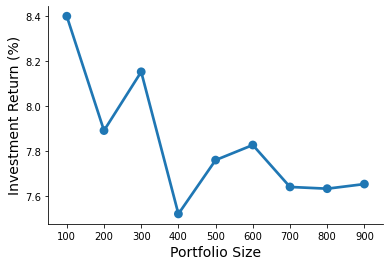

In [ ]:
result_sensitivity = []

## Vary the portfolio size from 100 to 1000
# random_forest = rf07
for num_loans in list(range(100,1000,100)):
    reg_0 = test_investments(data_dict12_strat, regressor = return_regressor_separate, classifier = default_classifier, 
                            strategy = 'Ranking', num_loans = num_loans)
    result_sensitivity.append(reg_0['ret_Hybrid']['average return'])
    
result_sensitivity = np.array(result_sensitivity) * 100
sns.pointplot(np.array(list(range(100,1000,100))),result_sensitivity)
sns.despine()
plt.ylabel('Investment Return (%)',size = 14)
plt.xlabel('Portfolio Size',size = 14)
plt.show()

# Hybrid + Two-Stage - good chart
# Also show Hyrbid + Best Possible

# Step 5- Sensitivity of the strategies across times

Again, we downsampled the 2015 set earlier to make the default/non-default class balance, so we must re-build the 2015 dataset with the actual default/non-default split.

We also must again run our models on this new dataset to obtain predictions, and adjust for class imbalance where necessary.

In [ ]:
## switch back to 2015-16 data
data = data15.copy()

# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')

# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

final_features = [i for i in discrete_features + continuous_features if i not in ["grade", "int_rate", "installment"]]
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]

## useful when choosing the most significant features
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)
selected_features15 = selected_features.copy()

## Process data here:
# prepare data 
start_date_train = datetime.date(2015,1,1)
end_date_train = datetime.date(2015,9,1)
start_date_test = datetime.date(2015,10,1)
end_date_test = datetime.date(2015,12,1)

data_dict15_strat = prepare_data(data_subset = np.array([True]*np.array([True]*len(data))),
                              date_range_train = (start_date_train, end_date_train),
                         date_range_test = (start_date_test, end_date_test),
                         n_samples_train = 20000, n_samples_test = 10000, feature_subset = final_features)

In [ ]:
# Choose the default classifier
default_classifier15 = saved_models['l1_logistic07'].copy()

# Choose the return regressor
return_regressor15 = saved_models['reg_rf12'].copy()

## Choose the split return regressor
return_regressor_separate15 = saved_models['reg_rf12_df'].copy()

In [ ]:
## Adjust for class balance change
probs = default_classifier15['model'].predict_proba(data_dict15_strat['X_test'])[:,1]

actual_default = sum(data_dict15_strat['y_test'])/len(data_dict15_strat['y_test'])
actual_not_default = 1 - actual_default

A = probs/(train_default/actual_default)
B = (1 - probs)/(train_not_default/actual_not_default)
new_p = A/(A+B)
default_classifier15['y_pred_probs'] = new_p

In [ ]:
## Predict return for Return-based strategy
for ret_col in return_regressor15.keys():
  return_regressor15[ret_col]['predicted_return'] = return_regressor[ret_col]['model'].predict(data_dict15_strat['X_test'])

In [ ]:
## Predict return for two-stage strategy
for ret_col in return_regressor_separate15.keys():
  return_regressor_separate15[ret_col]['predicted_regular_return'] = return_regressor_separate15[ret_col]['model_0'].predict(data_dict15_strat['X_test'])
  return_regressor_separate15[ret_col]['predicted_default_return'] = return_regressor_separate15[ret_col]['model_1'].predict(data_dict15_strat['X_test'])

### 5.1 Random <a name = 'sec5.1' />
Compare with <a href=#sec4.1>section 4.1</a>: random rule applied on 2012-2013 data

In [ ]:
strategy_results_15 = {}

In [ ]:
col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb','ret_INTc','ret_Hybrid']
test_strategy = 'Random'

print('strategy:',test_strategy)   
strat_random = test_investments(data_dict15_strat, strategy = test_strategy, 
                            num_loans = 100, output_to_file = False, random_state = 1)
for ret_col in col_list:
    print(ret_col + ': ' + str(strat_random[ret_col]['average return']))

strategy_results_15[test_strategy] = strat_random

strategy: Random
ret_PESS: 0.014995600816745315
ret_OPT: 0.05358572908874967
ret_INTa: 0.02207658613416822
ret_INTb: 0.03088410279834291
ret_INTc: 0.05823993500173976
ret_Hybrid: 0.06306924501922306


### 5.2 Ranking  <a name = 'sec5.2' />
Compare with <a href=#sec4.2>section 4.2</a>: ranking applied on 2012-2013 data

In [ ]:
# load the random forest model if you haven't yet
# rf07 = saved_models['rf07']

test_strategy = 'Ranking'

print('strategy:',test_strategy)
strat_rank = test_investments(data_dict15_strat, classifier=default_classifier15, strategy = test_strategy, 
                        num_loans = 100, output_to_file = False)

for ret_col in col_list:
    print(ret_col + ': ' + str(strat_rank[ret_col]['average return']))

strategy_results_15[test_strategy] = strat_rank

strategy: Ranking
ret_PESS: 0.019710812719464208
ret_OPT: 0.035489050568630685
ret_INTa: 0.021778703249817333
ret_INTb: 0.020316179744942885
ret_INTc: 0.06673755757159328
ret_Hybrid: 0.05951975552741091


### 5.3 Regression  <a name = 'sec5.3' />
Compare with <a href=#sec4.3>section 4.3</a>: regression rule applied on 2012-2013 data

In [ ]:
test_strategy = 'Regression'

print('strategy:',test_strategy)
strat_reg = test_investments(data_dict15_strat, regressor = return_regressor15, strategy = test_strategy, 
                        num_loans = 100)
for ret_col in col_list:
    print(ret_col + ': ' + str(strat_reg[ret_col]['average return']))

strategy_results_15[test_strategy] = strat_reg

strategy: Regression
ret_PESS: 0.018459049696727917
ret_OPT: 0.039150044936557826
ret_INTa: 0.020601831916734547
ret_INTb: 0.026669780656008498
ret_INTc: 0.062488565964642376
ret_Hybrid: 0.052454585494394614


### 5.4 Two-stage  <a name = 'sec5.4' />
Compare with <a href=#sec4.4>section 4.4</a>: two-stage rule applied on 2012-2013 data

In [ ]:
# load the model if you haven't yet
# reg_rf_separate13 = saved_models['reg_rf_separate13']

test_strategy = 'Two-stage'

print('strategy:',test_strategy)
two_stage = test_investments(data_dict15_strat, classifier = default_classifier15, regressor = return_regressor_separate15, 
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(two_stage[ret_col]['average return']))

strategy_results_15[test_strategy] = two_stage

strategy: Two-stage
ret_PESS: 0.037871921478264764
ret_OPT: 0.029862104221746268
ret_INTa: 0.02338539279049063
ret_INTb: 0.039322997091251984
ret_INTc: 0.06265362447338524
ret_Hybrid: 0.06790429343300272


## 5.5 Best Possible

For benchmarking purposes only.

In [ ]:
## Best Possible Strategy
# Test with score adjustment
test_strategy = 'Best Possible'

print('strategy:',test_strategy)
best_possible = test_investments(data_dict15_strat,
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(best_possible[ret_col]['average return']))

strategy_results_15[test_strategy] = best_possible

strategy: Best Possible
ret_PESS: 0.11752259436168179
ret_OPT: 0.23628577617036853
ret_INTa: 0.12269478913716722
ret_INTb: 0.14050526796199758
ret_INTc: 0.17380966929853348
ret_Hybrid: 0.229722279203288


## 5.6 Rules Based on Decision Tree Output

In [ ]:
test_strategy = 'Tree-based'

print('strategy: ', test_strategy)
tree_based = test_investments(data_dict15_strat, classifier = default_classifier15,
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(tree_based[ret_col]['average return']))

strategy_results_15[test_strategy] = tree_based

strategy:  Tree-based
ret_PESS: 0.029613596543002076
ret_OPT: 0.05782744636567425
ret_INTa: 0.030340257318357485
ret_INTb: 0.046692135170984556
ret_INTc: 0.07665453428060616
ret_Hybrid: 0.06915633559198078


## Strategy Results (2015)

In [ ]:
strategy_results_list = []
for s in strategy_results_15.keys():
  for ret_col in col_list:
    strategy_results_list.append([s, ret_col, (strategy_results_15[s][ret_col]['average return'])])
strategy_results15_df = pd.DataFrame(strategy_results_list, columns=['Strategy','Return Column','Avg Return'])
strategy_results15_df.sort_values(by=['Return Column','Strategy'], inplace=True)
print(strategy_results15_df)

         Strategy Return Column  Avg Return
29  Best Possible    ret_Hybrid    0.229722
5          Random    ret_Hybrid    0.063069
11        Ranking    ret_Hybrid    0.059520
17     Regression    ret_Hybrid    0.052455
35     Tree-based    ret_Hybrid    0.069156
23      Two-stage    ret_Hybrid    0.067904
26  Best Possible      ret_INTa    0.122695
2          Random      ret_INTa    0.022077
8         Ranking      ret_INTa    0.021779
14     Regression      ret_INTa    0.020602
32     Tree-based      ret_INTa    0.030340
20      Two-stage      ret_INTa    0.023385
27  Best Possible      ret_INTb    0.140505
3          Random      ret_INTb    0.030884
9         Ranking      ret_INTb    0.020316
15     Regression      ret_INTb    0.026670
33     Tree-based      ret_INTb    0.046692
21      Two-stage      ret_INTb    0.039323
28  Best Possible      ret_INTc    0.173810
4          Random      ret_INTc    0.058240
10        Ranking      ret_INTc    0.066738
16     Regression      ret_INTc 

In [ ]:
fig = px.bar(strategy_results15_df, x="Return Column", y="Avg Return",
             color='Strategy', barmode='group',
             height=400,title="2015 Strategy Results")
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig.show()

## Step 6-  Sensitivity test of portfolio size (2015)

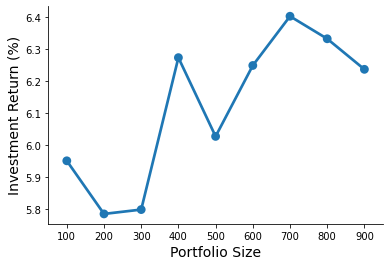

In [ ]:
## Note - this will only work for the 2015 dataset - 2012 sensitivity is at the end of section 4
result_sensitivity = []

## Vary the portfolio size from 100 to 1000
for num_loans in list(range(100,1000,100)):
    reg_0 = test_investments(data_dict15_strat, regressor = return_regressor_separate, classifier = default_classifier15, 
                            strategy = 'Two-stage', num_loans = num_loans)
    result_sensitivity.append(reg_0['ret_Hybrid']['average return'])
    
result_sensitivity = np.array(result_sensitivity) * 100
sns.pointplot(np.array(list(range(100,1000,100))),result_sensitivity)
sns.despine()
plt.ylabel('Investment Return (%)',size = 14)
plt.xlabel('Portfolio Size',size = 14)
plt.show()

## Step 7. Save the models in one file.

In [ ]:
# save all time-consuming models in one dict_ 
# models_to_save['reg_rf13'] = reg_rf13
# models_to_save['reg_rf07'] = reg_rf07
# ... etc.

In [ ]:
## os.path.abspath(os.getcwd()) # get current directory
#filename = '/Users/su.jia/Box/LendingClub BigData2018/Su/saved_models/week4_saved_models'

path = root_dir + "/saved_models/week4_saved_models"   

outfile = open(path,'wb')
pickle.dump(models_to_save, outfile)
outfile.close()

# Phase 5  Optimization Models for Picking Loans

This phase carries out the following steps
  1. Read the saved pickle data and prepares it for analysis and load the classification models for default probability and regression models for returns
  2. Uses them to implement the baseline strategies from last week
  3. Uses the predicted default probabilities and returns in an optimization model to pick a set of loans to invest in (You can compare the optimization based portfolios to the strategies from last week)
  4. Performs a sensitivity analysis of the performance of the loan portfolio by re-solving the optimization models for various levels of risk

In [ ]:
# CHANGE THE BELOW
root_dir = "C:/Users/Hewitt/Google Drive/BVIA Group 4"
pickle_input_201516 = root_dir+"/Pickle/201516_ret.pickle"
saved_models_dir = root_dir+"/saved_models"

## 5.1 Load saved models.
Load the dictionary first, assign value when we need to.

In [ ]:
# read saved models

path = saved_models_dir + "/week4_saved_models"   
infile = open(path,'rb')

saved_models = pickle.load(infile)
infile.close()
print('models loaded:', saved_models.keys())

# save into a new dict if there is anything new to save
models_to_save = saved_models.copy()

models loaded: dict_keys(['ridge_clf07', 'gnb07', 'l1_logistic07', 'dt07', 'rf07', 'bt07', 'mlp07', 'gnb13', 'l1_logistic13', 'l2_logistic13', 'dt13', 'rf13', 'mlp13', 'l2_logistic07', 'reg_mlp15_df', 'reg_rf15', 'reg_mlp12', 'reg_rf12', 'reg_mlp12_df', 'reg_rf12_df', 'reg_mlp15', 'reg_rf15_df'])


## 5.2 Build and test baseline investment strategies
Now we test several investment strategies using the learning models above

In [ ]:
default_seed = 42
output_file = "output_sample"

In [ ]:
# Create a function to print a line to our output file
def dump_to_output(key, value):
    with open(output_file, "a") as f:
        f.write(",".join([str(default_seed), key, str(value)]) + "\n")

In [ ]:
def test_investments(data_dict,
                        classifier = None,
                        regressor = None,
                        strategy = 'Random',
                        num_loans = 1000,
                        random_state = default_seed,
                        output_to_file = True):
    '''
    This function tests a variety of investment methodologies and their returns.
    It will run its tests on the loans defined by the test_set element of the data
    dictionary.

    It is currently able to test four strategies
      - random: invest in a random set of loans
      - ranking: score each loan by probability of default, and only invest
                 in the "safest" loans (i.e., those with the lowest probabilities
                 of default)
      - regression: train a single regression model to predict the expected return
                    of loans in the past. Then, for loans we could invest in, simply
                    rank them by their expected returns and invest in that order.
      - two-stage: train two regression models to predict the expected return of
                   defaulted loans and non-defaulted loans in the training set. Then,
                   for each potential loan we could invest in, predict the probability
                   the loan will default, its return if it doesn't default and its
                   return if it does. Then, calculate a weighted combination of
                   the latter using the former to find a predicted return. Rank the
                   loans by this expected return, and invest in that order

    It expects the following parameters
      - data_dict: the dictionary containing both training and testing data;
                   returned by the prepare_data function
      - classifier: a fitted model object which is returned by the fit_classification function.
      - regressor: a fitted model object which is returned by the fit_regression function.
      - strategy: the name of the strategy; one of the three listed above
      - num_loans: the number of loans to be included in the test portfolio
      - num_samples: the number of random samples used to compute average return ()
      - random_state: the random seed to use when selecting a subset of rows
      - output_to_file: if the results will be saved to the output file

    The function returns a dictionary FOR EACH RETURN DEFINITION with the following entries
      - strategy: the name of the strategy
      - average return: the return of the strategy based on the testing set
      - test data: the updated Dataframe of testing data. Useful in the optimization section
    '''

    np.random.seed(random_state)

    # Retrieve the rows that were used to train and test  the
    # classification model
    train_set = data_dict['train_set']
    test_set = data_dict['test_set']

    col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb','ret_INTc','ret_Hybrid']

    # Create a dataframe for testing, including the score
    data_test = data.loc[test_set,:]
    out = {}

    for ret_col in col_list:

        if strategy == 'Random':
            # Randomize the order of the rows in the datframe
            data_test = data_test.sample(frac = 1).reset_index(drop = True)

            # Select num_loans to invest in
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find the average return for these loans
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        elif strategy == 'Regression':

            colname = 'predicted_return_' + ret_col

            data_test[colname] = regressor[ret_col]['predicted_return']

            # Sort the loans by predicted return
            data_test = data_test.sort_values(by=colname, ascending = False).reset_index(drop = True)

            # Pick num_loans loans
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find their return
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        elif strategy == 'Crystal-ball':

            # Sort the loans by realized return
            data_test = data_test.sort_values(by=ret_col, ascending = False).reset_index(drop = True)

            # Pick num_loans loans
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find their return
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        # Get the predicted scores, if the strategy is not Random or just Regression
        try:
            y_pred_score = classifier['y_pred_probs']
        except:
            y_pred_score = classifier['y_pred_score']

        data_test['score'] = y_pred_score


        if strategy == 'Ranking':
            # Sort the test data by the score
            data_test = data_test.sort_values(by='score').reset_index(drop = True)

            # Select num_loans to invest in
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find the average return for these loans
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue


        elif strategy == 'Two-stage':

            # Load the predicted returns
            data_test['predicted_regular_return'] = regressor[ret_col]['predicted_regular_return']
            data_test['predicted_default_return'] = regressor[ret_col]['predicted_default_return']

            # Compute expectation
            colname = 'predicted_return_' + ret_col

            data_test[colname] = ( (1-data_test.score)*data_test.predicted_regular_return +
                                             data_test.score*data_test.predicted_default_return )

            # Sort the loans by predicted return
            data_test = data_test.sort_values(by=colname, ascending = False).reset_index(drop = True)

            # Pick num_loans loans
            pf_test = data_test[['funded_amnt',ret_col]].iloc[:num_loans]

            # Find their return
            ret_test = np.dot(pf_test[ret_col],pf_test.funded_amnt)/np.sum(pf_test.funded_amnt)

            # Return
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}

            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )

            continue

        elif strategy == 'Tree-based':
            # Define rules based on optimal tree nodes
            # FICO RANGE HIGH > 0.363 AND ANNUAL_INC > 0.448
            rule_1 = (data_test['fico_range_high'] > 0.363) & (data_test['annual_inc'] > 0.448) 
            # OR: FICO_RANGE_HIGH < 0.228 AND DTI < 0.358
            rule_2 = (data_test['fico_range_high'] < 0.228) & (data_test['dti'] < 0.358) 
            # Filter for loans to pick
            pf_test = data_test.loc[(rule_1) | (rule_2)]
            # Pick num_loans loans, if num_loans exceed available loans, return 'num_loans exceed loan availability'
            if num_loans <= len(pf_test):
              pf_test = pf_test.iloc[:num_loans]
              ret_test = np.mean(pf_test[ret_col])
            else:
              ret_test = 'num_loans exceed loan availability'
            # Returns
            out[ret_col] = {'strategy':strategy, 'average return':ret_test, 'test data':data_test}
            # Dump the strategy performance to file
            if output_to_file:
                dump_to_output(strategy + "," + ret_col + "::average return", ret_test )
            continue

        else:
            return 'Not a valid strategy'

    return out

In [ ]:
# 1. Load the data and engineer the features
## 1.1 Load data

# Read the data and features from the pickle
data, discrete_features, continuous_features, ret_cols = pickle.load( open(pickle_input_201516, "rb" ) )
continuous_features = [i for i in continuous_features if i not in ['fico_range_low']]

# Create the outcome
data["outcome"] = data.loan_status.isin(["Charged Off", "Default"])

# Create a feature for the length of a person's credit history at the
# time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')

# Randomly assign each row to a training and test set. We do this now
# because we will be fitting a variety of models on various time periods,
# and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
data['train'] = np.random.choice([True, False], size = len(data), p = [0.7, 0.3])

# Create a matrix of features and outcomes, with dummies. Record the
# names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

## 1.2 Prepare functions to fit and evaluate models

def prepare_data(data_subset = np.array([True]*len(data)),
                    n_samples_train = 20000,
                    n_samples_test = 10000,
                    feature_subset = None,
                    date_range_train = (data.issue_d.min(), data.issue_d.max()),
                    date_range_test = (data.issue_d.min(), data.issue_d.max()),
                    random_state = default_seed):
    '''
    This function will prepare the data for classification or regression.
    It expects the following parameters:
      - data_subset: a numpy array with as many entries as rows in the
                     dataset. Each entry should be True if that row
                     should be used, or False if it should be ignored
      - n_samples_train: the total number of samples to be used for training.
                         Will trigger an error if this number is larger than
                         the number of rows available after all filters have
                         been applied
      - n_samples_test: as above for testing
      - feature_subect: A list containing the names of the features to be
                        used in the model. In None, all features in X are
                        used
      - date_range_train: a tuple containing two dates. All rows with loans
                          issued outside of these two dates will be ignored in
                          training
      - date_range_test: as above for testing
      - random_state: the random seed to use when selecting a subset of rows
      
    Note that this function assumes the data has a "Train" column, and will
    select all training rows from the rows with "True" in that column, and all
    the testing rows from those with a "False" in that column.
    
    This function returns a dictionary with the following entries
      - X_train: the matrix of training data
      - y_train: the array of training labels
      - train_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the train set
      - X_test: the matrix of testing data
      - y_test: the array of testing labels
      - test_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the test set
    '''
    
    np.random.seed(random_state)
        
    # Filter down the data to the required date range, and downsample
    # as required
    filter_train = ( train & (data.issue_d >= date_range_train[0]) &
                            (data.issue_d <= date_range_train[1]) & data_subset ).values
    filter_test = ( (train == False) & (data.issue_d >= date_range_test[0])
                            & (data.issue_d <= date_range_test[1]) & data_subset ).values
    
    filter_train[ np.random.choice( np.where(filter_train)[0], size = filter_train.sum() 
                                   - n_samples_train, replace = False ) ] = False
    filter_test[ np.random.choice( np.where(filter_test)[0], size = filter_test.sum() 
                                   - n_samples_test, replace = False ) ] = False
    
    # Prepare the training and test set
    X_train = X[ filter_train , :]
    X_test = X[ filter_test, :]
    if feature_subset != None:
        cols = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in feature_subset]
        X_train = X_train[ : , cols ]
        X_test = X_test[ : , cols ]
        
    y_train = y[ filter_train ]
    y_test = y[ filter_test ]
    
    # Scale the variables
    scaler = preprocessing.MinMaxScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # return training and testing data
    out = {'X_train':X_train, 'y_train':y_train, 'train_set':filter_train, 
           'X_test':X_test, 'y_test':y_test, 'test_set':filter_test}
    
    return out

## Implement the test strategies on 2015-16 data

In [ ]:
final_features = [i for i in discrete_features + continuous_features if i not in ["grade", "int_rate", "installment"]]
data_dict = prepare_data(feature_subset = final_features)

all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in final_features]
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)

### \* 5.2.01 Choose saved models

Choose our saved model to use for the rest of the simulation.

In [ ]:
default_classifier = saved_models['l1_logistic07'].copy()

return_regressor = saved_models['reg_rf12'].copy()

return_regressor_separate = saved_models['reg_rf12_df'].copy()

print(return_regressor.keys())

dict_keys(['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb', 'ret_INTc', 'ret_Hybrid'])


### \* 5.2.02 Reapply saved models

Because we downsampled data for training the default classifier, we need to reapply our models to obtain predictions on the dataset to be used for classification.

In [ ]:
def reapply_saved_model(data_dict, saved_model, separate=False):

    ## Params: 
    ## - data_dict: New data dictionary to run the saved model on
    ## - saved_model: Saved model to run

    ## Returns: A new "saved model" dictionary, with model the same, 
    ##  but with y_pred_labels and y_pred_probs updated for the whole dataset

    updated_model = saved_model.copy()

    ## TODO: Print prior and new accuracy to make sure model performance 
    ##  doesn't significantly worsen on this data

    if (separate==False):

        if "model" in updated_model.keys():
            ## Default classifier

            train_default = 0.43
            train_not_default = 0.57
            
            probs = updated_model['model'].predict_proba(data_dict['X_test'])[:,1]

            actual_default = sum(data_dict['y_test'])/len(data_dict['y_test'])
            actual_not_default = 1 - actual_default

            print("Adjusting classifier for new default split... New % Default:",actual_default)

            A = probs/(train_default/actual_default)
            B = (1 - probs)/(train_not_default/actual_not_default)
            new_p = A/(A+B)
            updated_model['y_pred_probs'] = new_p

            updated_model['y_pred_labels'] = data_dict['y_test']

        else:
            ## Single return regressor
            for ret_col in saved_model.keys():
                updated_model[ret_col]['predicted_return'] = updated_model[ret_col]['model'].predict(data_dict['X_test'])

    else:
        ## Separate return regressor
        for ret_col in saved_model.keys():
            updated_model[ret_col]['predicted_regular_return'] = updated_model[ret_col]['model_0'].predict(data_dict['X_test']) 
            updated_model[ret_col]['predicted_default_return'] = updated_model[ret_col]['model_1'].predict(data_dict['X_test']) 

    return updated_model

default_classifier = reapply_saved_model(data_dict, default_classifier)
return_regressor = reapply_saved_model(data_dict, return_regressor)
return_regressor_separate = reapply_saved_model(data_dict, return_regressor_separate, separate=True)

Adjusting classifier for new default split... New % Default: 0.1954


In [ ]:
strategy_results = {}

### 5.2.1 Random

In [ ]:
col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb','ret_INTc','ret_Hybrid']
test_strategy = 'Random'

print('strategy:',test_strategy)   
strat_random = test_investments(data_dict,strategy = test_strategy, 
                            num_loans = 100, output_to_file = False, random_state = 1)
for ret_col in col_list:
    print(ret_col + ': ' + str(strat_random[ret_col]['average return']))

strategy_results[test_strategy] = strat_random

strategy: Random
ret_PESS: 0.015218679214610141
ret_OPT: 0.04035024322004515
ret_INTa: 0.026266546427531578
ret_INTb: 0.04450320864556404
ret_INTc: 0.06643342937275866
ret_Hybrid: 0.07620388550175831


### 5.2.2 Ranking

In [ ]:
test_strategy = 'Ranking'

print('strategy:',test_strategy)
strat_rank = test_investments(data_dict, classifier=default_classifier, strategy = test_strategy, 
                        num_loans = 100, output_to_file = False)

for ret_col in col_list:
    print(ret_col + ': ' + str(strat_rank[ret_col]['average return']))

strategy_results[test_strategy] = strat_rank

strategy: Ranking
ret_PESS: 0.01833118989096376
ret_OPT: 0.060569087486160314
ret_INTa: 0.02378788018544195
ret_INTb: 0.03273734918515122
ret_INTc: 0.0788164545172166
ret_Hybrid: 0.05254269406151706


### 5.2.3 Regression

In [ ]:
test_strategy = 'Regression'

print('strategy:',test_strategy)
strat_reg = test_investments(data_dict, regressor=return_regressor, strategy = test_strategy, 
                        num_loans = 100)
for ret_col in col_list:
    print(ret_col + ': ' + str(strat_reg[ret_col]['average return']))

strategy_results[test_strategy] = strat_reg

strategy: Regression
ret_PESS: 0.027489564878988418
ret_OPT: 0.0499447055444742
ret_INTa: 0.01627417472374181
ret_INTb: 0.04886265792077707
ret_INTc: 0.07716630088394706
ret_Hybrid: 0.06450920106134957


### 5.2.4 Two-stage

In [ ]:
test_strategy = 'Two-stage'


print('strategy:',test_strategy)
two_stage = test_investments(data_dict, classifier = default_classifier, regressor = return_regressor_separate, 
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(two_stage[ret_col]['average return']))

strategy_results[test_strategy] = two_stage

strategy: Two-stage
ret_PESS: 0.017395602006615773
ret_OPT: 0.0456615081530408
ret_INTa: 0.020106236004278674
ret_INTb: 0.038832659277333634
ret_INTc: 0.06767643777928976
ret_Hybrid: 0.057768382039832276


### 5.2.5 Tree-based

In [ ]:
test_strategy = 'Tree-based'

print('strategy: ', test_strategy)
tree_based = test_investments(data_dict, classifier = default_classifier,
                             strategy = test_strategy, num_loans = 100)

for ret_col in col_list:
    print(ret_col + ': ' + str(tree_based[ret_col]['average return']))

strategy_results[test_strategy] = tree_based

strategy:  Tree-based
ret_PESS: 0.024539582083186323
ret_OPT: 0.04761878379037193
ret_INTa: 0.02478488868379006
ret_INTb: 0.04076961133486377
ret_INTc: 0.07005294680258962
ret_Hybrid: 0.06216501188699408


### 5.2.6 Best possible

In [ ]:
col_list = ['ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb','ret_INTc','ret_Hybrid']
test_strategy = 'Crystal-ball'

print('strategy:',test_strategy)   
crystal_ball = test_investments(data_dict,strategy = test_strategy, 
                            num_loans = 100, output_to_file = False, random_state = 1)
for ret_col in col_list:
    print(ret_col + ': ' + str(crystal_ball[ret_col]['average return']))

strategy_results[test_strategy] = crystal_ball

strategy: Crystal-ball
ret_PESS: 0.13098190973034446
ret_OPT: 0.2792366568721941
ret_INTa: 0.1299409492935519
ret_INTb: 0.14860254346114335
ret_INTc: 0.1826553877634408
ret_Hybrid: 0.273218912099329


### \* Review Strategy results

In [ ]:
strategy_results_list = []
for s in strategy_results.keys():
    for ret_col in col_list:
        strategy_results_list.append([s, ret_col, (strategy_results[s][ret_col]['average return'])])
strategy_results_df = pd.DataFrame(strategy_results_list, columns=['Strategy','Return Column','Avg Return'])
strategy_results_df.sort_values(by=['Return Column','Strategy'], inplace=True)
print(strategy_results_df)

        Strategy Return Column  Avg Return
35  Crystal-ball    ret_Hybrid    0.273219
5         Random    ret_Hybrid    0.076204
11       Ranking    ret_Hybrid    0.052543
17    Regression    ret_Hybrid    0.064509
29    Tree-based    ret_Hybrid    0.062165
23     Two-stage    ret_Hybrid    0.057768
32  Crystal-ball      ret_INTa    0.129941
2         Random      ret_INTa    0.026267
8        Ranking      ret_INTa    0.023788
14    Regression      ret_INTa    0.016274
26    Tree-based      ret_INTa    0.024785
20     Two-stage      ret_INTa    0.020106
33  Crystal-ball      ret_INTb    0.148603
3         Random      ret_INTb    0.044503
9        Ranking      ret_INTb    0.032737
15    Regression      ret_INTb    0.048863
27    Tree-based      ret_INTb    0.040770
21     Two-stage      ret_INTb    0.038833
34  Crystal-ball      ret_INTc    0.182655
4         Random      ret_INTc    0.066433
10       Ranking      ret_INTc    0.078816
16    Regression      ret_INTc    0.077166
28    Tree-

In [ ]:
fig = px.bar(strategy_results_df, x="Return Column", y="Avg Return",
             color='Strategy', barmode='group',
             height=400,title="Strategy Results")
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
fig.show()

## 5.3 Optimization
 In this section, we implement three different optimization models. To illustrate and compare these models we will only use the Hybrid Return definition and the predicted returns from the previously tested two-stage strategy.

### 5.3.01 Prepare for analyzing optimization results

We will run a Principal Components Analysis for use in interpreting the optimization results later.

In [ ]:
ret_col = 'ret_Hybrid'
strat = two_stage
test_pool = strat[ret_col]['test data']

def emp_length_transformer(x):
        if (x == None) or (x == "< 1 year"):
            return 0
        matches = re.findall(r'\d+', x)
        return int(matches[0])

pca_df = test_pool.copy()
n_rows = len(pca_df)
indices_to_drop = pca_df['emp_length'].isna()
pca_df.dropna(subset = ['emp_length'] ,inplace=True)
pca_df.reset_index(inplace=True)
#     print("Removed " + str(n_rows - len(pca_df)) + " rows")

emp_length_transformer_v = np.vectorize(emp_length_transformer)

pca_df['emp_length'] = emp_length_transformer_v(pca_df['emp_length'])

# Select columns for PCA (they were the same columns that were used in K menas)
pca_cols = ["fico_range_high", "int_rate", "annual_inc", "loan_amnt","emp_length"]
# Separating out the features
x = pca_df.loc[:, pca_cols].values

# Standardizing the features
x = StandardScaler().fit_transform(x)

pcamodel = PCA()
pca = pcamodel.fit_transform(x)

loadings = pd.DataFrame(pcamodel.components_.T, columns=["PCA"+str(x) for x in range(1,6)], index=pca_cols)
print(loadings)

## PCA1: High annual income, high loan amount --> trustworthy borrower
## PCA2: Low fico score, high interest rate --> high risk, high reward

                     PCA1      PCA2      PCA3      PCA4      PCA5
fico_range_high  0.391319 -0.537250  0.115676  0.677477  0.293046
int_rate        -0.262909  0.692662  0.048356  0.500099  0.445713
annual_inc       0.635397  0.204116  0.086207 -0.467744  0.573055
loan_amnt        0.561977  0.423835  0.254574  0.236081 -0.619680
emp_length       0.241247  0.101403 -0.955009  0.128091 -0.055394


**Interpret Loadings**: 
- PCA1 = Trustworthy and expensive loans, identified by high annual income, high loan amount. Also fairly high fico.
- PCA2 = High risk, high reward. Identified by low FICO score (which we know is more likely to default) and high interest rate.


#### evaluateOptimization function

Evaluate grade mix and PCA distribution for selected loans.

In [ ]:
def evaluateOptimization(SelectLoans, Amount, test_pool, ret_col):

    all_data = test_pool.copy()
    selected_loan_index = [False] * len(all_data)
    amount_loan = [0] * len(all_data)
    for i in range(len(all_data)):
        if SelectLoans[i].solution_value > 0:
            selected_loan_index[i] = True
            amount_loan[i] = Amount[i].solution_value
            
    all_data['selected'] = selected_loan_index
    all_data['amount_selected'] = amount_loan
#     print(amount_loan)
    num_selected = sum(selected_loan_index)
    total_value = sum(amount_loan)

    selected_loans = all_data[selected_loan_index]
    selected_loans['count'] = 1
    
    print("--- Proportion of loans by Grade: ---")
    grade_grouped = selected_loans.groupby(['grade'])[['selected','amount_selected']].sum()
    grade_grouped.reset_index(inplace=True)
    grade_grouped.sort_values(by='grade',inplace=True)
    grade_grouped['percent_of_total_count'] = grade_grouped['selected']/num_selected
    grade_grouped['percent_of_total_amount'] = grade_grouped['amount_selected']/total_value
    print(grade_grouped)
    
#     fig = px.bar(grade_grouped, y=['selected'], x='grade', title='Proportion of Loans by Grade')
#     fig.update_layout(
#         xaxis_title="Grade",
#         yaxis_title="Loan Count"
#     )
#     fig.show()

    sns.set_palette("husl", 7)
    
    sns.barplot(x="grade", y="selected", data=grade_grouped, hue='grade', dodge=False)
    plt.title("Count of Loans Selected by Grade")
    plt.show()
    
#     fig = px.bar(grade_grouped, y=['amount_selected'], x='grade', title='Proportion of Loans by Grade')
#     fig.update_layout(
#         xaxis_title="Grade",
#         yaxis_title="Amount Invested"
#     )
#     fig.show()
    
    sns.barplot(x="grade", y="amount_selected", data=grade_grouped, hue='grade', dodge=False)
    plt.title("Amount Invested by Grade")
    plt.show()
        
    pca_df = all_data.copy()
    n_rows = len(pca_df)
    pca_df.dropna(subset = ['emp_length'] ,inplace=True)
    pca_selected = pca_df['selected']
    pca_df.reset_index(inplace=True)

    emp_length_transformer_v = np.vectorize(emp_length_transformer)

    pca_df['emp_length'] = emp_length_transformer_v(pca_df['emp_length'])
    
    # Select columns for PCA (they were the same columns that were used in K menas)
    pca_cols = ["fico_range_high", "int_rate", "annual_inc", "loan_amnt","emp_length"]
    # Separating out the features
    x = pca_df.loc[:, pca_cols].values

    # Standardizing the features
    x = StandardScaler().fit_transform(x)

    pcamodel = PCA()
    pca = pcamodel.fit_transform(x)
    
    pca_false_index = list(pca_df[pca_df.selected == 0].index) 
    num_false = 300
    pca_false_index = random.sample(pca_false_index,num_false)
    pca_true_index = list(pca_df[pca_df.selected == 1].index)
    num_true = min(len(pca_true_index),100)
    pca_true_index = random.sample(pca_true_index,num_true)
    pca_true_grades = pca_df.iloc[pca_true_index]['grade']
    
    unique_grades = pca_df['grade'].unique()
    unique_grades.sort()
    grade_colormap = sns.color_palette("husl", 7)
    
    sns.scatterplot(pca[pca_false_index, 0], pca[pca_false_index, 1], color='black', label='Not Picked')
    sns.scatterplot(pca[pca_true_index, 0], pca[pca_true_index, 1], color='red', label='Picked')
    plt.title("Selected Loans on First Two Principal Components")
    plt.xlabel("PC 1 (Trustworthy Borrower)")
    plt.ylabel("PC 2 (High Risk, High Reward)")
    plt.show()
    
    sns.scatterplot(pca[pca_false_index, 0], pca[pca_false_index, 1], color='black', label='Not Picked')
    i = 0
    for grade in unique_grades:
        grade_index = pca_true_grades == grade
        grade_color = grade_colormap[i]
        i = i + 1
        sns.scatterplot(pca[pca_true_index, 0][grade_index], pca[pca_true_index, 1][grade_index], color=grade_color, label=grade)
    plt.title("Selected Loans on First Two Principal Components by GRADE")
    plt.xlabel("PC 1 (Trustworthy Borrower)")
    plt.ylabel("PC 2 (High Risk, High Reward)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

### Write results to CSV for Optimization

CSV will be written to google drive root folder. The CSV will have the columns shown below, including variables like Grade which may not have been used in the models but are necessary for optimization. This is helpful for testing optimization outside of Google Colab.

In [ ]:
ret_col = 'ret_INTc'
strat = two_stage

(strat[ret_col]['test data']).to_csv("./test_data.csv", index=False)

## Three optimization models to picks loans

Optimzation Objective: Maximize portfolio returns. Partial investments are allowed

Optimization Variables: 
1. Binary: Whether or not to choose a loan
2. Continuous: Amount invested in each selected loan

The following optimization constraints are used on top of the constant constraint of min-max of 10-100 loans:

1. No constraint (NC) - We ran models without constraints to compare different 
models’ performance
2. Budget Constraint (BU) - The budget constraint of $50,000 
3. Grade Constraint (GR) - Constraint of having 10 loans belonging to each grade. 
4. Budget and Grade constraint (BG) - Both #2 and #3 together applied as constraints. 
5. Risk Adjusted Return (RA) - Use beta and loan-cluster history to modify objective function to account for inherent 'volatility' of a loan


In [ ]:
#global parameters
max_loans = 100   # max loans  <-- change here if needed
min_loans = 10    # min loans  <-- change here if needed
budget = 50000  # budget <-- change here if needed 
grade_threshold = 10  #<-- change here if needed

ret_col = 'ret_INTc'
test_pool = two_stage[ret_col]['test data']
num_var = test_pool.shape[0]
print(num_var)


## Define Loan Data
r = np.zeros(num_var) # return
f = np.zeros(num_var) # loan funded amount
l = np.zeros(num_var) #  loan amount
g = {} # loan grade

for i in range(num_var):
    r[i] = test_pool['predicted_return_'+ret_col].iloc[i]
    f[i] = test_pool.funded_amnt.iloc[i]
    l[i] = test_pool.loan_amnt.iloc[i]
    g[i] = test_pool.grade.iloc[i]

10000


### 5.3.1 Directly maximize total profit

In [ ]:
from docplex.mp.model import Model
mdl = Model()

# variables: whether or not to select each loan
SelectLoans = mdl.binary_var_dict(num_var, name='select loan')

In [ ]:
# objective to maximize the profit of loans
mdl.maximize(mdl.sum(r[i]*f[i]*SelectLoans[i] for i in SelectLoans))

In [ ]:
# constraints to select 50 to 100 loans
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) >= min_loans)
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= max_loans)

docplex.mp.LinearConstraint[](select loan_0+select loan_1+select loan_2+select loan_3+select loan_4+select loan_5+select loan_6+select loan_7+select loan_8+select loan_9+select loan_10+select loan_11+select loan_12+select loan_13+select loan_14+select loan_15+select loan_16+select loan_17+select loan_18+select loan_19+select loan_20+select loan_21+select loan_22+select loan_23+select loan_24+select loan_25+select loan_26+select loan_27+select loan_28+select loan_29+select loan_30+select loan_31+select loan_32+select loan_33+select loan_34+select loan_35+select loan_36+select loan_37+select loan_38+select loan_39+select loan_40+select loan_41+select loan_42+select loan_43+select loan_44+select loan_45+select loan_46+select loan_47+select loan_48+select loan_49+select loan_50+select loan_51+select loan_52+select loan_53+select loan_54+select loan_55+select loan_56+select loan_57+select loan_58+select loan_59+select loan_60+select loan_61+select loan_62+select loan_63+select loan_64+selec

In [ ]:
# solve
mdl.solve()
mdl.get_solve_details()

docplex.mp.SolveDetails(time=0.078,status='integer optimal solution')

In [ ]:
# the number of loans and average return

i = 0
loans =[]
opt_sln_NC = [0] * num_var
for s in range(num_var):
    if SelectLoans[s].solution_value > 0:
        i+=1
        loans.append(test_pool[ret_col].iloc[s])
        opt_sln_NC[s] = 1
print(f'Number of Loans: {i}')
print(f'Average Return: {np.mean(loans)}')

Number of Loans: 100
Average Return: 0.06901725144367765


--- Proportion of loans by Grade: ---
  grade  selected  amount_selected  percent_of_total_count  \
0     A      18.0         679925.0                    0.18   
1     B      22.0         825000.0                    0.22   
2     C      31.0        1118950.0                    0.31   
3     D      16.0         576050.0                    0.16   
4     E       7.0         245000.0                    0.07   
5     F       5.0         174050.0                    0.05   
6     G       1.0          35000.0                    0.01   

   percent_of_total_amount  
0                 0.186078  
1                 0.225782  
2                 0.306228  
3                 0.157650  
4                 0.067050  
5                 0.047633  
6                 0.009579  


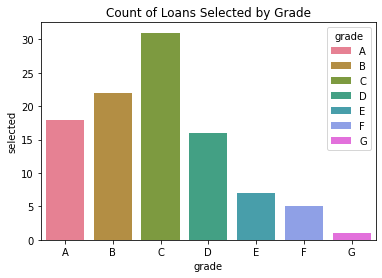

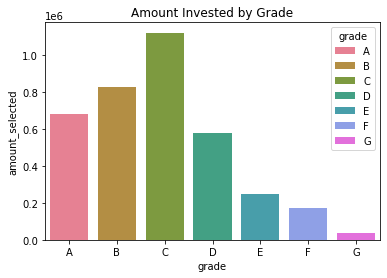

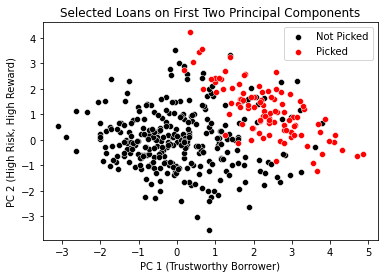

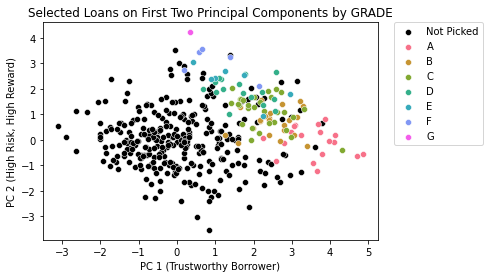

In [ ]:
evaluateOptimization(SelectLoans, Amount, test_pool, ret_col)

--- Proportion of loans by Grade: ---
  grade  selected  percent_of_total
0     A        18              0.18
1     B        22              0.22
2     C        31              0.31
3     D        16              0.16
4     E         7              0.07
5     F         5              0.05
6     G         1              0.01


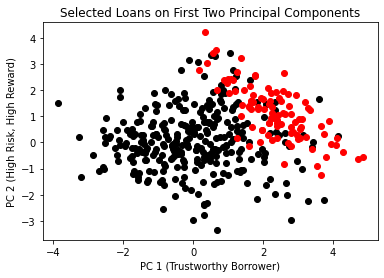

In [ ]:
evaluateOptimization(SelectLoans, test_pool, ret_col)

### 5.3.2: Maximize profit with budget constraint

In [ ]:
mdl = Model()

# binary variables
SelectLoans = mdl.binary_var_dict(num_var, name='select loan')

# continuous variables to represent loan amount
partialAmount = budget / max_loans

# objective to maximize the profit of loans
mdl.maximize(mdl.sum(partialAmount*r[i]*SelectLoans[i] for i in SelectLoans))

In [ ]:
# constraints to select 10 to 100 loans
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) >= min_loans)
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= max_loans)

docplex.mp.LinearConstraint[](select loan_0+select loan_1+select loan_2+select loan_3+select loan_4+select loan_5+select loan_6+select loan_7+select loan_8+select loan_9+select loan_10+select loan_11+select loan_12+select loan_13+select loan_14+select loan_15+select loan_16+select loan_17+select loan_18+select loan_19+select loan_20+select loan_21+select loan_22+select loan_23+select loan_24+select loan_25+select loan_26+select loan_27+select loan_28+select loan_29+select loan_30+select loan_31+select loan_32+select loan_33+select loan_34+select loan_35+select loan_36+select loan_37+select loan_38+select loan_39+select loan_40+select loan_41+select loan_42+select loan_43+select loan_44+select loan_45+select loan_46+select loan_47+select loan_48+select loan_49+select loan_50+select loan_51+select loan_52+select loan_53+select loan_54+select loan_55+select loan_56+select loan_57+select loan_58+select loan_59+select loan_60+select loan_61+select loan_62+select loan_63+select loan_64+selec

In [ ]:
# Budget constraints
mdl.add_constraint(mdl.sum(partialAmount*SelectLoans[i] for i in SelectLoans) <= budget)

docplex.mp.LinearConstraint[](500select loan_0+500select loan_1+500select loan_2+500select loan_3+500select loan_4+500select loan_5+500select loan_6+500select loan_7+500select loan_8+500select loan_9+500select loan_10+500select loan_11+500select loan_12+500select loan_13+500select loan_14+500select loan_15+500select loan_16+500select loan_17+500select loan_18+500select loan_19+500select loan_20+500select loan_21+500select loan_22+500select loan_23+500select loan_24+500select loan_25+500select loan_26+500select loan_27+500select loan_28+500select loan_29+500select loan_30+500select loan_31+500select loan_32+500select loan_33+500select loan_34+500select loan_35+500select loan_36+500select loan_37+500select loan_38+500select loan_39+500select loan_40+500select loan_41+500select loan_42+500select loan_43+500select loan_44+500select loan_45+500select loan_46+500select loan_47+500select loan_48+500select loan_49+500select loan_50+500select loan_51+500select loan_52+500select loan_53+500selec

In [ ]:
# solve
mdl.solve()
mdl.get_solve_details()

docplex.mp.SolveDetails(time=0.657,status='integer optimal solution')

In [ ]:
# the number of loans and average return

i = 0
loans =[]
opt_sln_BU = [0] * num_var
for s in range(num_var):
    if SelectLoans[s].solution_value > 0:
        i+=1
        loans.append(test_pool[ret_col].iloc[s])
        opt_sln_BU[s] = 1
print(f'Number of Loans: {i}')
print(f'Average Return: {np.mean(loans)}')

Number of Loans: 100
Average Return: 0.06901725144367765


--- Proportion of loans by Grade: ---
  grade  selected  amount_selected  percent_of_total_count  \
0     A      18.0           4700.0                    0.18   
1     B      28.0          35350.0                    0.28   
2     C      28.0           2800.0                    0.28   
3     D      12.0           1200.0                    0.12   
4     E      11.0           5650.0                    0.11   
5     F       3.0            300.0                    0.03   

   percent_of_total_amount  
0                    0.094  
1                    0.707  
2                    0.056  
3                    0.024  
4                    0.113  
5                    0.006  


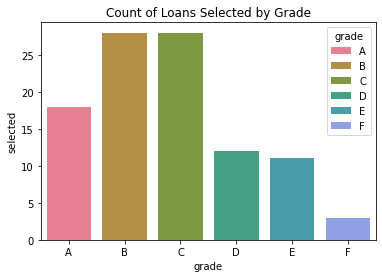

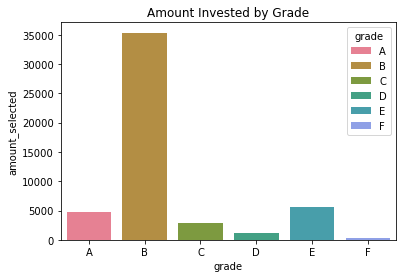

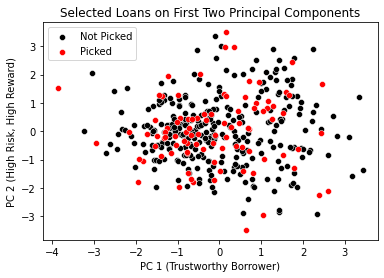

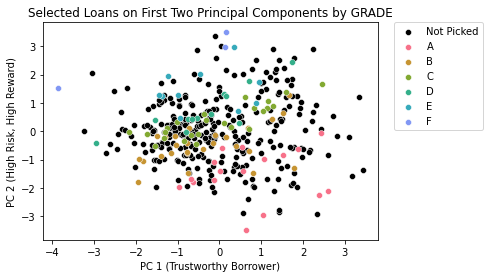

In [ ]:
evaluateOptimization(SelectLoans, Amount,test_pool, ret_col)

### 5.3.3: Maximize profit with only grade contraint

In [ ]:
mdl = Model()

# variables
SelectLoans = mdl.binary_var_dict(num_var, name='select loan')

# objective to maximize the profit of loans
mdl.maximize(mdl.sum(r[i]*f[i]*SelectLoans[i] for i in SelectLoans))

In [ ]:
# constraints to select 50 to 100 loans
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) >= min_loans)
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= max_loans)

docplex.mp.LinearConstraint[](select loan_0+select loan_1+select loan_2+select loan_3+select loan_4+select loan_5+select loan_6+select loan_7+select loan_8+select loan_9+select loan_10+select loan_11+select loan_12+select loan_13+select loan_14+select loan_15+select loan_16+select loan_17+select loan_18+select loan_19+select loan_20+select loan_21+select loan_22+select loan_23+select loan_24+select loan_25+select loan_26+select loan_27+select loan_28+select loan_29+select loan_30+select loan_31+select loan_32+select loan_33+select loan_34+select loan_35+select loan_36+select loan_37+select loan_38+select loan_39+select loan_40+select loan_41+select loan_42+select loan_43+select loan_44+select loan_45+select loan_46+select loan_47+select loan_48+select loan_49+select loan_50+select loan_51+select loan_52+select loan_53+select loan_54+select loan_55+select loan_56+select loan_57+select loan_58+select loan_59+select loan_60+select loan_61+select loan_62+select loan_63+select loan_64+selec

In [ ]:
# Grade constraints: select at least 10 loans for each grade
Grades = set(test_pool['grade'].values)

for j in Grades:
    mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans if g[i]==j) >= grade_threshold)

In [ ]:
# solve
mdl.solve()
mdl.get_solve_details()

docplex.mp.SolveDetails(time=0.078,status='integer optimal solution')

In [ ]:
# the number of loans and average return

i = 0
loans =[]
opt_sln_GR = [0] * num_var
for s in range(num_var):
    if SelectLoans[s].solution_value > 0:
        i+=1
        loans.append(test_pool[ret_col].iloc[s])
        opt_sln_GR[s] = 1
print(f'Number of Loans: {i}')
print(f'Average Return: {np.mean(loans)}')

Number of Loans: 100
Average Return: 0.06901725144367765


--- Proportion of loans by Grade: ---
  grade  selected  amount_selected  percent_of_total_count  \
0     A      18.0         679925.0                    0.18   
1     B      22.0         825000.0                    0.22   
2     C      31.0        1118950.0                    0.31   
3     D      15.0         541750.0                    0.15   
4     E       6.0         210000.0                    0.06   
5     F       5.0         174050.0                    0.05   
6     G       3.0         105000.0                    0.03   

   percent_of_total_amount  
0                 0.186043  
1                 0.225738  
2                 0.306169  
3                 0.148235  
4                 0.057461  
5                 0.047624  
6                 0.028730  


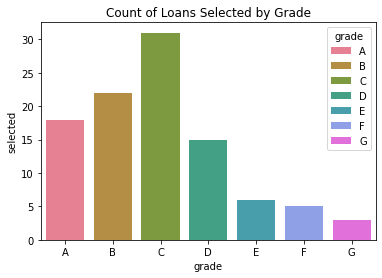

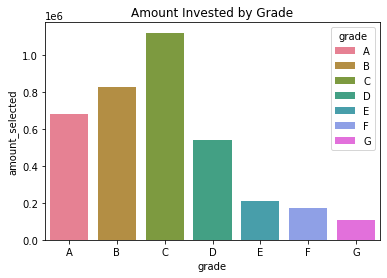

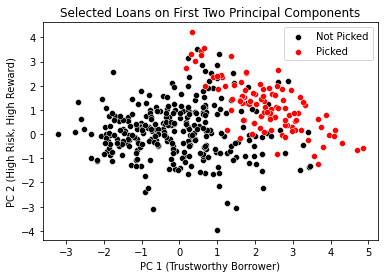

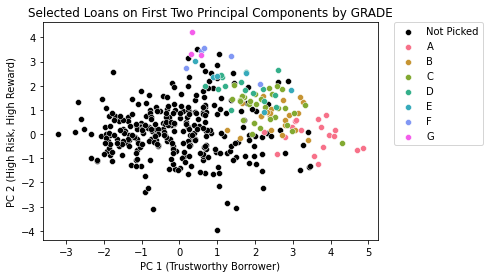

In [ ]:
evaluateOptimization(SelectLoans, Amount, test_pool, 'ret_Hybrid')

### 5.3.4: Maximize profit with grade and budget constraint

In [ ]:
mdl = Model()

# variables
SelectLoans = mdl.binary_var_dict(num_var, name='select loan')

# continuous variables to represent loan amount
partialAmount = budget / max_loans

# objective to maximize the profit of loans
mdl.maximize(mdl.sum(partialAmount*r[i]*SelectLoans[i] for i in SelectLoans))

In [ ]:
# constraints to select 50 to 100 loans
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) >= min_loans)
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= max_loans)

docplex.mp.LinearConstraint[](select loan_0+select loan_1+select loan_2+select loan_3+select loan_4+select loan_5+select loan_6+select loan_7+select loan_8+select loan_9+select loan_10+select loan_11+select loan_12+select loan_13+select loan_14+select loan_15+select loan_16+select loan_17+select loan_18+select loan_19+select loan_20+select loan_21+select loan_22+select loan_23+select loan_24+select loan_25+select loan_26+select loan_27+select loan_28+select loan_29+select loan_30+select loan_31+select loan_32+select loan_33+select loan_34+select loan_35+select loan_36+select loan_37+select loan_38+select loan_39+select loan_40+select loan_41+select loan_42+select loan_43+select loan_44+select loan_45+select loan_46+select loan_47+select loan_48+select loan_49+select loan_50+select loan_51+select loan_52+select loan_53+select loan_54+select loan_55+select loan_56+select loan_57+select loan_58+select loan_59+select loan_60+select loan_61+select loan_62+select loan_63+select loan_64+selec

In [ ]:
# Budget constraints: set budget less than 1 millions
mdl.add_constraint(mdl.sum(partialAmount*SelectLoans[i] for i in SelectLoans) <= budget)

docplex.mp.LinearConstraint[](500select loan_0+500select loan_1+500select loan_2+500select loan_3+500select loan_4+500select loan_5+500select loan_6+500select loan_7+500select loan_8+500select loan_9+500select loan_10+500select loan_11+500select loan_12+500select loan_13+500select loan_14+500select loan_15+500select loan_16+500select loan_17+500select loan_18+500select loan_19+500select loan_20+500select loan_21+500select loan_22+500select loan_23+500select loan_24+500select loan_25+500select loan_26+500select loan_27+500select loan_28+500select loan_29+500select loan_30+500select loan_31+500select loan_32+500select loan_33+500select loan_34+500select loan_35+500select loan_36+500select loan_37+500select loan_38+500select loan_39+500select loan_40+500select loan_41+500select loan_42+500select loan_43+500select loan_44+500select loan_45+500select loan_46+500select loan_47+500select loan_48+500select loan_49+500select loan_50+500select loan_51+500select loan_52+500select loan_53+500selec

In [ ]:
# Grade constraints: select at least 10 loans for each grade
Grades = set(test_pool['grade'].values)

for j in Grades:
    mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans if g[i]==j) >= grade_threshold)

In [ ]:
# solve
mdl.solve()
mdl.get_solve_details()

docplex.mp.SolveDetails(time=0.172,status='integer optimal solution')

In [ ]:
# the number of loans and average return

i = 0
loans =[]
opt_sln_BG = [0] * num_var
for s in range(num_var):
    if SelectLoans[s].solution_value > 0:
        i+=1
        loans.append(test_pool[ret_col].iloc[s])
        opt_sln_BG[s] = 1
print(f'Number of Loans: {i}')
print(f'Average Return: {np.mean(loans)}')

Number of Loans: 100
Average Return: 0.06767999600405007


--- Proportion of loans by Grade: ---
  grade  selected  amount_selected  percent_of_total_count  \
0     A      10.0          25500.0                    0.10   
1     B      16.0          32600.0                    0.16   
2     C      30.0          40525.0                    0.30   
3     D      14.0          18600.0                    0.14   
4     E      10.0          27400.0                    0.10   
5     F      10.0          41800.0                    0.10   
6     G      10.0         113575.0                    0.10   

   percent_of_total_amount  
0                 0.085000  
1                 0.108667  
2                 0.135083  
3                 0.062000  
4                 0.091333  
5                 0.139333  
6                 0.378583  


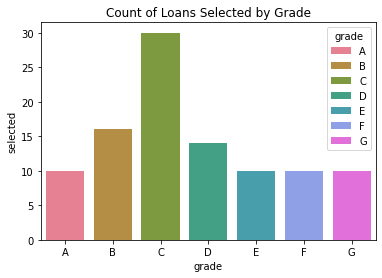

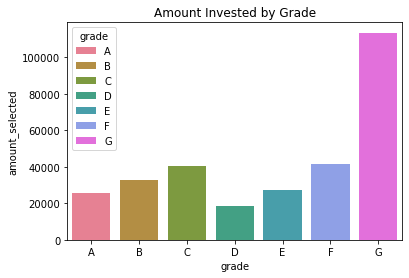

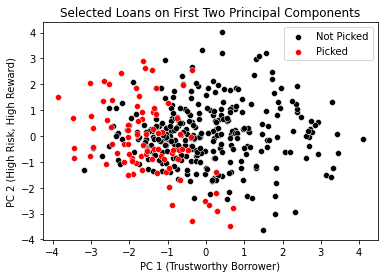

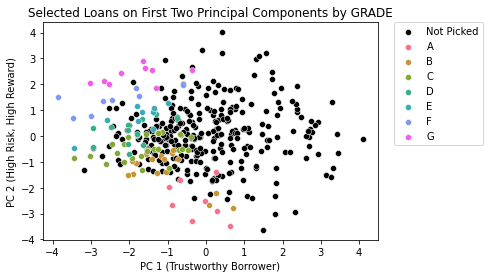

In [ ]:
evaluateOptimization(SelectLoans, Amount, test_pool, 'ret_Hybrid')

### 5.3.5: Maximize profit with risk-return tradeoff. Include budget, and grade constraints

Find optimal number of clusters to calculate standard deviation of each cluster

In [ ]:
min_clusters = 10
max_clusters = 110

# A list holds the SSE values for each k
sse = []
for k in np.arange(min_clusters, max_clusters + 1,10):
    print("Cluster "+str(k))
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(data_dict['X_train'])
    sse.append(kmeans.inertia_)

Cluster 10
Cluster 20
Cluster 30
Cluster 40
Cluster 50
Cluster 60
Cluster 70
Cluster 80
Cluster 90
Cluster 100
Cluster 110


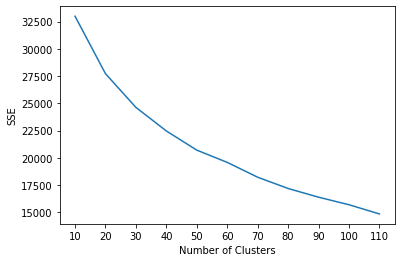

In [ ]:
#plt.style.use("fivethirtyeight")
plt.plot(np.arange(min_clusters, max_clusters + 1,10), sse)
plt.xticks(np.arange(min_clusters, max_clusters+ 1,10))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
## First we need to train a clustering model to estimate the variance of return. We are going with 100 clusters. 
n_clusters = 100
train_set = data_dict['train_set']
data_train = data.loc[train_set,:]

# Create a dataframe for testing, including the score
data_test = two_stage[ret_col]['test data']

kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(data_dict['X_train'])
data_train['clusID'] = kmeans.predict(data_dict['X_train'])
data_test['clusID'] = kmeans.predict(data_dict['X_test'])
data_test['volatility'] = 0

#Add std deviation column
for idx in range(n_clusters):
    std_clus = np.std(data_train[ret_col][data_train.clusID == idx])
    data_test.volatility[data_test.clusID == idx] = std_clus

## Specify the parameters of the optimization model
# beta: penalty factor on the risk
beta = 0.009

In [ ]:
num_var = test_pool.shape[0]

## populate the volatility vector
v = np.zeros(num_var) # volatility (std dev) vector

for i in range(num_var):
    v[i] = test_pool['volatility'].iloc[i]*test_pool.funded_amnt.iloc[i]  #volatility
    
from docplex.mp.model import Model
mdl = Model()

# variables
SelectLoans = mdl.binary_var_dict(num_var, name='select loan')

# continuous variables to represent loan amount
partialAmount = budget / max_loans

In [ ]:
# objective: maximize risk adjusted profit
mdl.maximize(mdl.sum(partialAmount*r[i]*SelectLoans[i] - beta*v[i]*SelectLoans[i] for i in SelectLoans))

# constraints: select number of loans
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= max_loans)
mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) >= min_loans)

#constraint: cannot exceed budget
mdl.add_constraint(mdl.sum(partialAmount*SelectLoans[i] for i in SelectLoans) <= budget)

#grade constraint: 10 for each grade
for j in Grades:
    mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans if g[i]==j) >= grade_threshold)

In [ ]:
# solve
mdl.solve()
mdl.get_solve_details()

docplex.mp.SolveDetails(time=0.078,status='integer optimal solution')

In [ ]:
# the number of loans and average return


i = 0
loans =[]
opt_sln_RA = [0] * num_var
for s in range(num_var):
    if SelectLoans[s].solution_value > 0:
        i+=1
        loans.append(test_pool['ret_Hybrid'].iloc[s])
        opt_sln_RA[s] = 1
print(f'Number of Loans: {i}')
print(f'Average Return: {np.mean(loans)}')

Number of Loans: 100
Average Return: 0.06335898218515411


--- Proportion of loans by Grade: ---
  grade  selected  amount_selected  percent_of_total_count  \
0     A      10.0           1000.0                0.142857   
1     B      10.0           1000.0                0.142857   
2     C      10.0           1000.0                0.142857   
3     D      10.0           1000.0                0.142857   
4     E      10.0           1000.0                0.142857   
5     F      10.0           1000.0                0.142857   
6     G      10.0           1000.0                0.142857   

   percent_of_total_amount  
0                 0.142857  
1                 0.142857  
2                 0.142857  
3                 0.142857  
4                 0.142857  
5                 0.142857  
6                 0.142857  


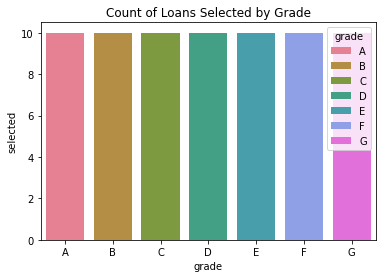

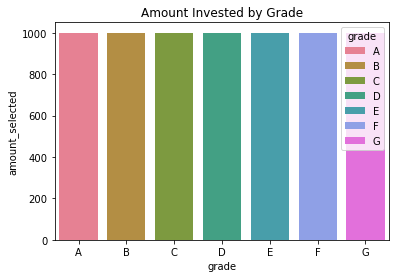

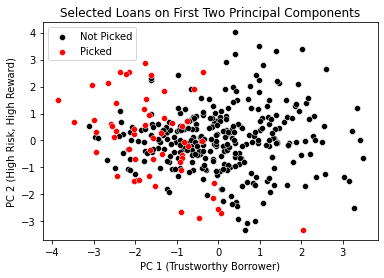

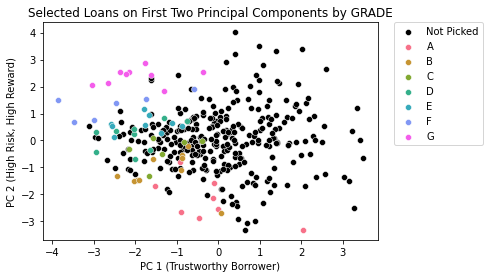

In [ ]:
evaluateOptimization(SelectLoans, Amount, test_pool, 'ret_Hybrid')

### 5.3.6 Visualization: violin plots for the expected returns of the above strategies

In [ ]:
test_pool['label'] = ['test_pool']*test_pool.shape[0]

# now we create a df for OPT of NC
test_pool['chosen_NC'] = opt_sln_NC
df2 = test_pool[test_pool.chosen_NC == 1].copy() # df containing only rows chosen by NC
test_pool = test_pool.drop(columns=['chosen_NC']) # drop this columns in order to append
df2 = df2.drop(columns=['chosen_NC']) # drop this columns in order to append
df2['label'] = ['NC']*df2.shape[0]

# create a df for OPT of BU
test_pool['chosen_BU'] = opt_sln_BU
df3 = test_pool[test_pool.chosen_BU == 1].copy() # df containing only rows chosen by BU
test_pool = test_pool.drop(columns=['chosen_BU']) # drop this columns in order to append
df3 = df3.drop(columns=['chosen_BU']) # drop this columns in order to append
df3['label'] = ['BU']*df3.shape[0]

# create a df for OPT of GR
test_pool['chosen_GR'] = opt_sln_GR
df4 = test_pool[test_pool.chosen_GR == 1].copy() # df containing only rows chosen by GR
test_pool = test_pool.drop(columns=['chosen_GR']) # drop this columns in order to append
df4 = df4.drop(columns=['chosen_GR']) # drop this columns in order to append
df4['label'] = ['GR']*df4.shape[0]


# create a df for OPT of BG
test_pool['chosen_BG'] = opt_sln_BG
df5 = test_pool[test_pool.chosen_BG == 1].copy() # df containing only rows chosen by BG
test_pool = test_pool.drop(columns=['chosen_BG']) # drop this columns in order to append
df5 = df5.drop(columns=['chosen_BG']) # drop this columns in order to append
df5['label'] = ['BG']*df5.shape[0]


# create a df for OPT of RA
test_pool['chosen_RA'] = opt_sln_RA
df6 = test_pool[test_pool.chosen_RA == 1].copy() # df containing only rows chosen by RA
test_pool = test_pool.drop(columns=['chosen_RA']) # drop this columns in order to append
df6 = df6.drop(columns=['chosen_RA']) # drop this columns in order to append
df6['label'] = ['RA']*df6.shape[0]

# concatenate the dataframes
df_big = test_pool.append([df2,df3,df4,df5,df6])

The portfolio with budget-only constraint (BU) delivered low average return, although its distribution is less. Tellingly, all the portfolios showed less return-distribution than that of the universe of loans (aka test pool)

Text(0, 0.5, 'ret_Hyb')

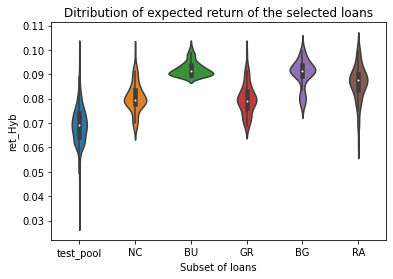

In [ ]:
ax = sns.violinplot(y=df_big["predicted_return_ret_Hybrid"], x=df_big["label"], 
                    data=df_big, order=['test_pool','NC','BU', 'GR', 'BG', 'RA'])
ax.set_title("Ditribution of expected return of the selected loans")
ax.set_xlabel("Subset of loans")
ax.set_ylabel("ret_Hyb")

## 5.4. Sensitivity analysis of the optimization solution by varying the risk tolerance of the investor
Build a trade-off curve between the beta value and the optimization objective (expected return). For this we loop through various values of beta from 0.1 through some large number in steps of 0.1 say. Then we create a plot of different pairs of means and stdevns of the expected return of the portfolios as you vary beta. The two axes will then be mean (return) and stdevn (risk).

In [ ]:
num_var = test_pool.shape[0]
# max_loans = 100
# min_loans = 10
# Budget = 50000

max_loans = 1000
min_loans = 900
Budget = 10*1000000

beta_min = 0.01
step = 0.5
num_beta = 10

start_selected_loans = None
end_selected_loans = None

    ## first define cost vector
# for i in range(num_var):
#     c[i] = test_pool['predicted_return_'+ret_col].iloc[i]*test_pool.funded_amnt.iloc[i]
#     l[i] = test_pool.loan_amnt.iloc[i]
#     v[i] = test_pool['volatility'].iloc[i]*test_pool.funded_amnt.iloc[i]  #volatility

table = np.zeros([num_beta,2]) # store the return and risk
for j in range(num_beta):
    #Add variables
    num_var = test_pool.shape[0]

    from docplex.mp.model import Model
    mdl = Model()

    # binary variables
    SelectLoans = mdl.binary_var_dict(num_var, name='select loan')
    Amount = mdl.continuous_var_dict(num_var, name='amount')# objective: maximize risk adjusted profit
    
    
    beta = beta_min + j*step

    # constraints: select number of loans
    mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= max_loans)
    mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) >= min_loans)

    # constraints to minimum investments if select
    for i in SelectLoans:
        mdl.add_constraint(Amount[i] >= 100*SelectLoans[i])

    #constraint: cannot exceed budget
    mdl.add_constraint(mdl.sum(SelectLoans[i] for i in SelectLoans) <= budget)


    # objective: maximize risk adjusted profit
    mdl.maximize(mdl.sum(r[i]*Amount[i] - beta*v[i]*Amount[i] for i in SelectLoans))

    mdl.solve()    
    

    opt = [0] * num_var
    for s in range(num_var):
        if SelectLoans[s].solution_value > 0:
            opt[s] = 1
    #np.sum(opt_sln_IP3)
    
    if j == 0:
        start_selected_loans = SelectLoans.copy()
    if j == 9:
        end_selected_loans = SelectLoans.copy()
    
    test_pool['chosen'] = opt
    df = test_pool[test_pool.chosen == 1]
    table[j,0] = df['predicted_return_'+  ret_col].sum()
    table[j,1] = df.volatility.sum()

The risk v return graph shows that as the investor is willing to take on more risk, they will be rewarded with more returns. In fact, given that the investor is allowed to do partial investment, the risk has a correlation of 1 with return.

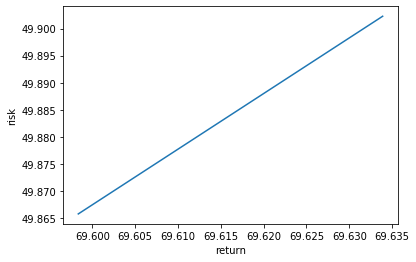

In [ ]:
plt.plot(table[:,0],table[:,1])
plt.xlabel("return")
plt.ylabel("risk")
plt.show()